In [1]:
import numpy as np
import random as rd
import tensorflow as tf

from keras.layers import Dense, Embedding, Input, Flatten, Conv1D, MaxPooling1D
from keras.models import Model
from keras.optimizers import RMSprop

#Import another jupyter notebook
import import_ipynb
from AttentionLayer import *
from Productive_CrossValidation_inclTest import *
from Productive_Data_GetTrainTest import samEval

C:\Users\twitter\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


importing Jupyter notebook from AttentionLayer.ipynb
importing Jupyter notebook from Productive_CrossValidation_inclTest.ipynb
importing Jupyter notebook from Productive_TimeHistory.ipynb
importing Jupyter notebook from Productive_Data_GetTrainTest.ipynb


In [2]:
#for reproducability of the results
seed = 7
np.random.seed(seed)
tf.set_random_seed(seed)
rd.seed(seed)

In [3]:
path = 'data/'
outputpath ='outputs/01_cnn_samEval2018/'

In [4]:
#Load necessary data
train_data, train_labels, test_data, test_labels, word_index, MAX_SEQUENCE_LENGTH = samEval()

In [5]:
#Load pretrained embeddings
import gensim
from gensim.models import KeyedVectors

#Pretrained Google News Embeddings, Dimension 300
GOOGLEEMB = path + 'GoogleNews-vectors-negative300.bin'

embedding= KeyedVectors.load_word2vec_format(GOOGLEEMB, binary=True)

word_vectors = embedding.wv

C:\Users\twitter\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).
  # Remove the CWD from sys.path while we load stuff.


In [6]:
#Create embedding-matrix, serves the Keras Embedding Layer as weigths
EMBEDDING_DIM=300

embedding_matrix = np.zeros((len(word_index)+1, EMBEDDING_DIM))

for word, i in word_index.items():
    try:
        embedding_vector = word_vectors[word]
        embedding_matrix[i] = embedding_vector   
    except:
        # words not found in embeddings will be zero
        pass

## Hyperparameter for all models

In [7]:
NUM_EPOCHS = 30
BATCH_SIZE = 64
softmax = True
optimizer = RMSprop(lr=0.001, rho = 0.9, epsilon = 0.0000001)
lossfunction ='binary_crossentropy'

Instructions for updating:
Colocations handled automatically by placer.


## CNN with one CNN-layer

In [ ]:
wv_layer = Embedding(len(word_index)+1,
                     EMBEDDING_DIM,
                     weights=[embedding_matrix],
                     input_length=MAX_SEQUENCE_LENGTH,
                     trainable=True)

#Input Layer
comment_input= Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences = wv_layer(comment_input)

#CNN-Layer
x = Conv1D(400, kernel_size =3, activation='relu')(embedded_sequences)

x = Flatten() (x)

#Output (Dense) Layer
preds = Dense(2, activation='softmax')(x)

# build the model
model = Model(inputs=[comment_input], outputs=preds)

Instructions for updating:
Use tf.cast instead.

-----Fold 1--------


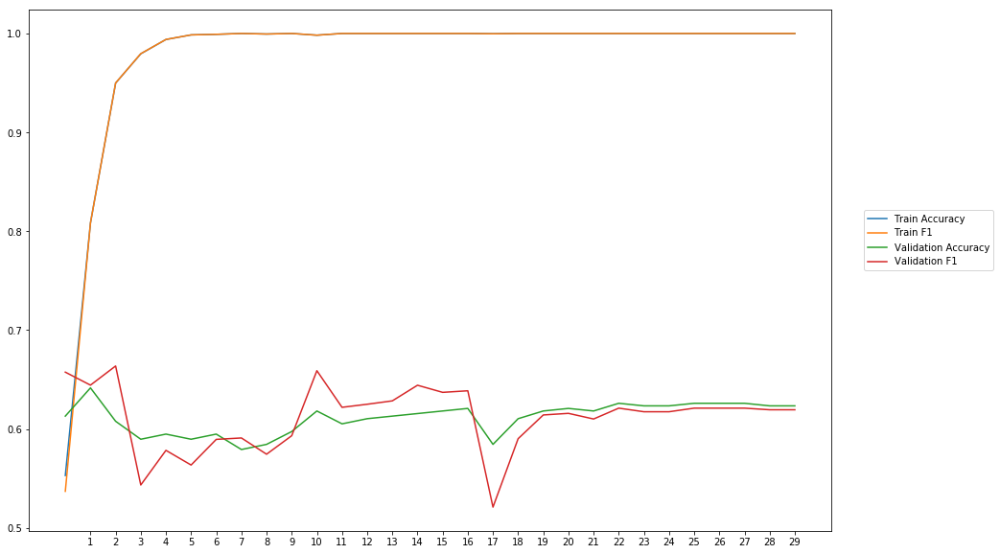

Average Accuracy: 61.14%
Average Precision: 61.27%
Average Recall: 61.59%
Average F1: 61.21%

-----Fold 2--------


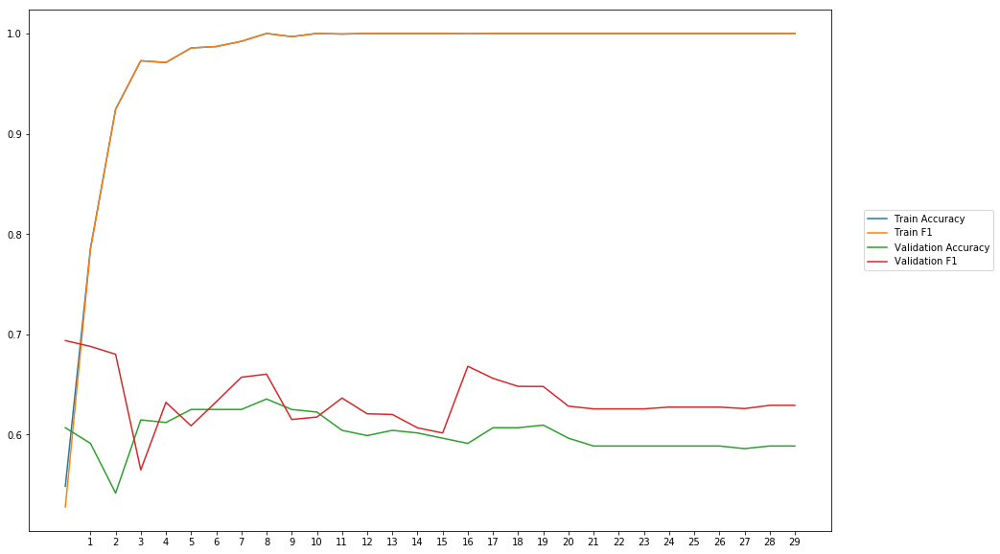

Average Accuracy: 60.11%
Average Precision: 59.14%
Average Recall: 69.45%
Average F1: 63.42%

-----Fold 3--------


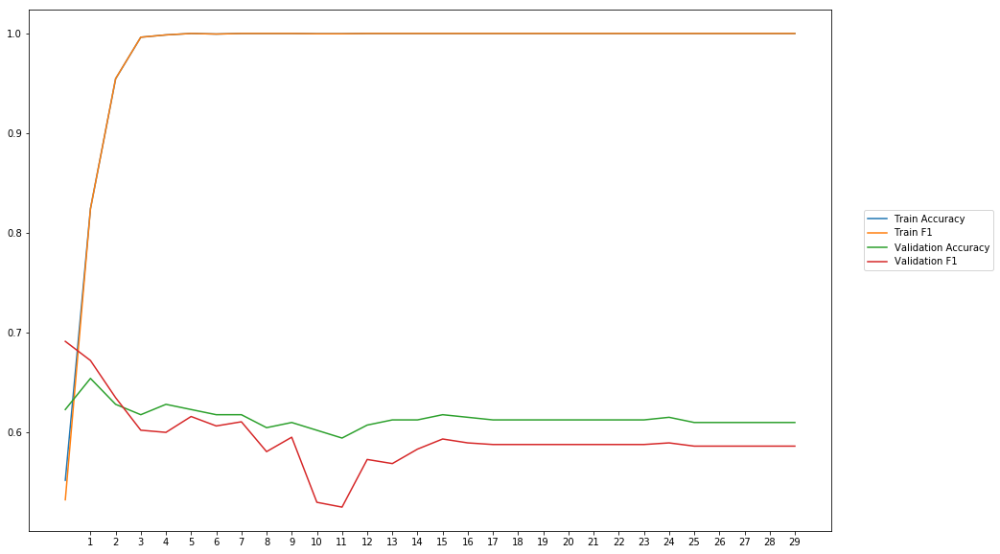

Average Accuracy: 61.41%
Average Precision: 63.07%
Average Recall: 56.39%
Average F1: 59.30%

-----Fold 4--------


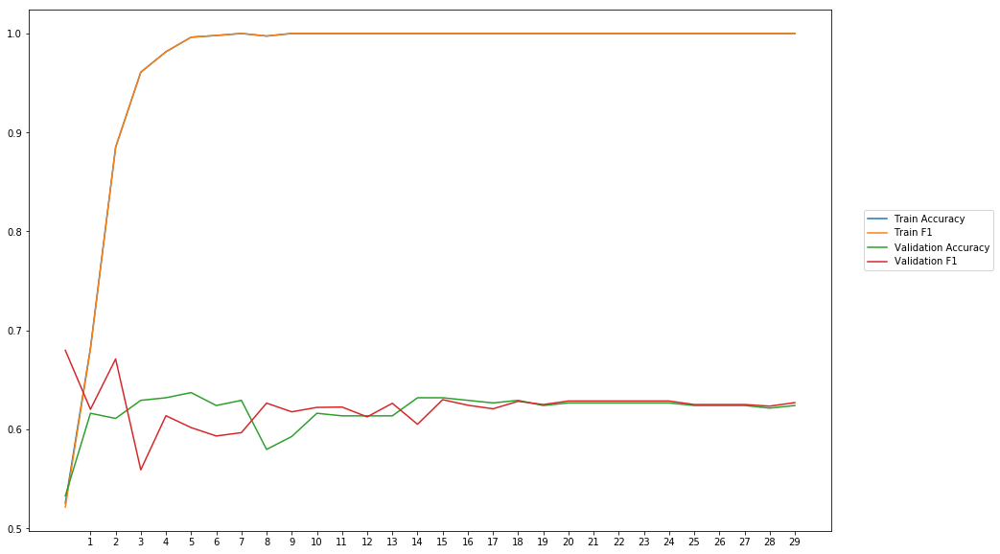

Average Accuracy: 61.88%
Average Precision: 62.31%
Average Recall: 63.07%
Average F1: 62.21%

-----Fold 5--------


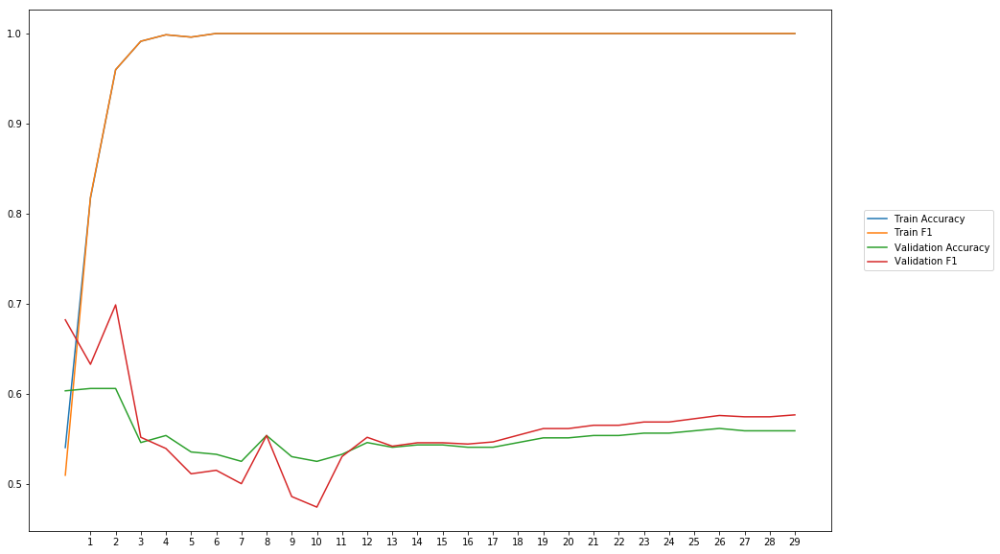

Average Accuracy: 55.21%
Average Precision: 55.00%
Average Recall: 57.36%
Average F1: 55.88%

-----Fold 6--------


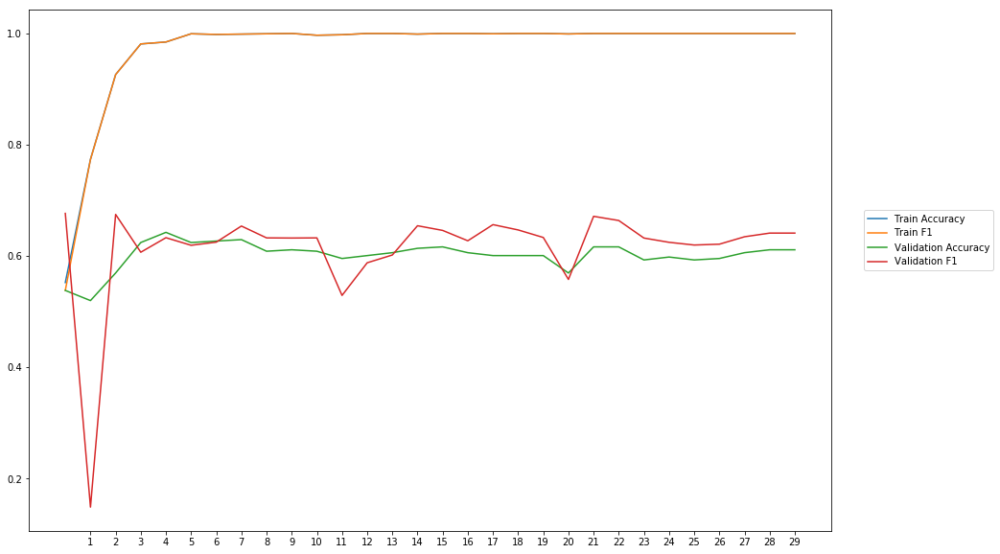

Average Accuracy: 60.16%
Average Precision: 59.84%
Average Recall: 65.94%
Average F1: 61.40%

-----Fold 7--------


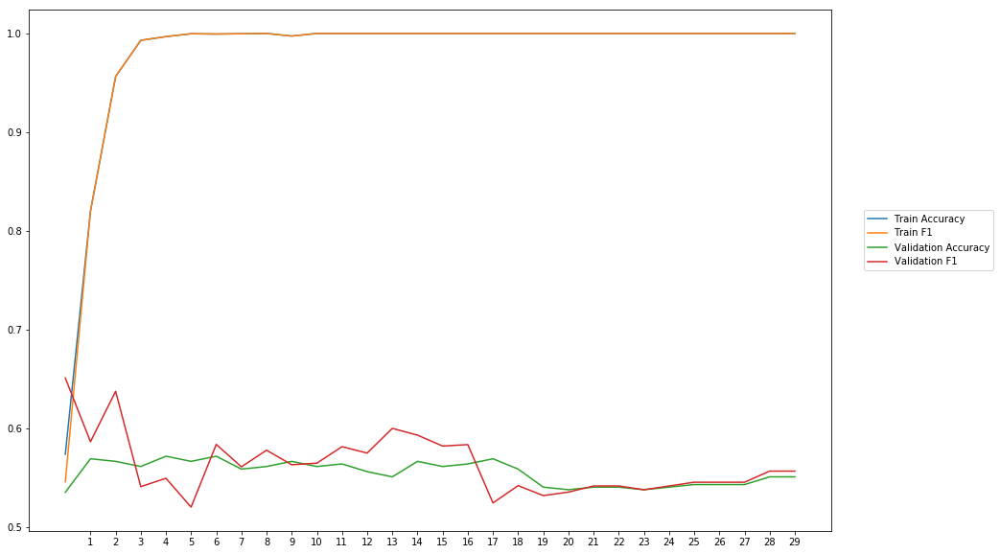

Average Accuracy: 55.50%
Average Precision: 55.52%
Average Recall: 57.74%
Average F1: 56.33%

-----Fold 8--------


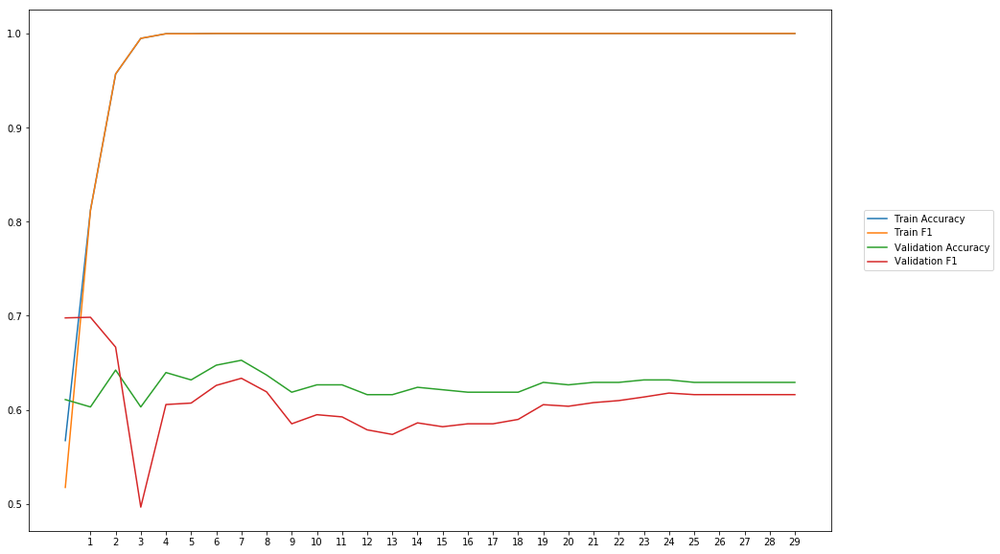

Average Accuracy: 62.66%
Average Precision: 64.38%
Average Recall: 58.63%
Average F1: 60.82%

-----Fold 9--------


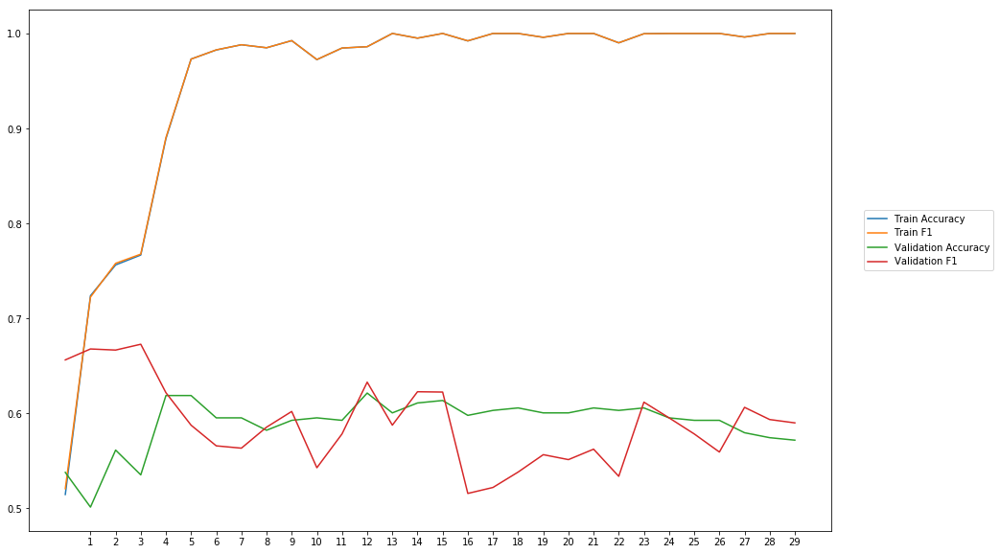

Average Accuracy: 59.01%
Average Precision: 60.11%
Average Recall: 60.30%
Average F1: 58.97%

-----Fold 10--------


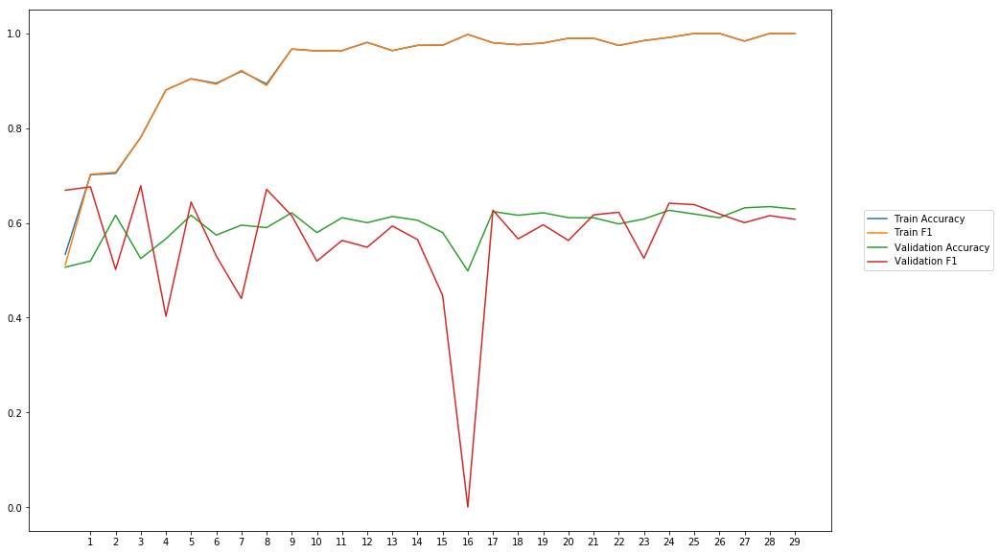

Average Accuracy: 59.54%
Average Precision: 60.07%
Average Recall: 56.77%
Average F1: 56.35%

-------Overallresults-------


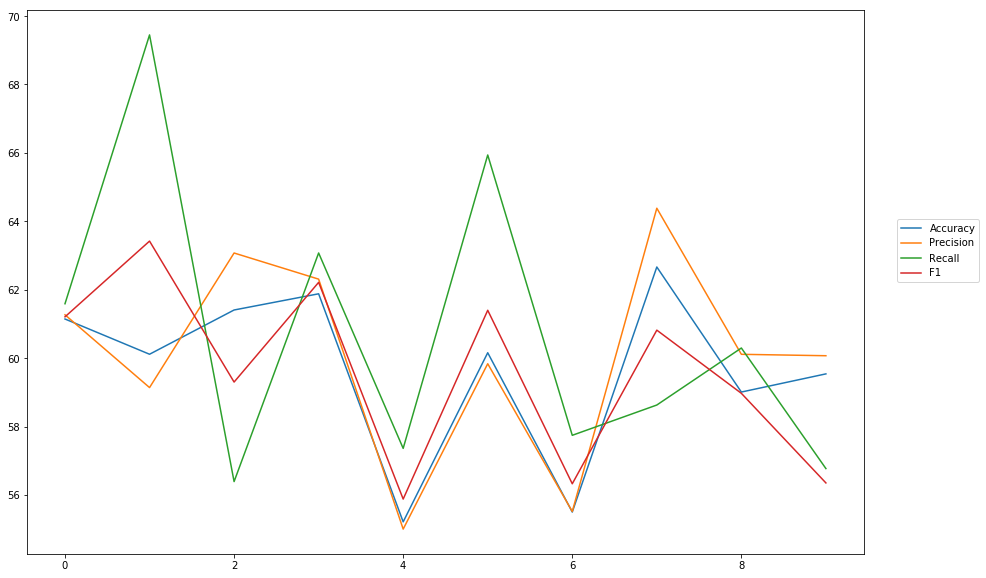

Accuracy: Mean = 59.66% (+/- 2.39%), Max = 62.66%, Min =  55.21%
Precision: Mean = 60.07% (+/- 2.85%), Max = 64.38%, Min =  55.00%
Recall: Mean = 60.72% (+/- 4.11%), Max = 69.45%, Min =  56.39%
F1: Mean = 59.59% (+/- 2.54%), Max = 63.42%, Min =  55.88%


In [13]:
cross_val(model, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'cnn_1_400_kernel3') 

## CNN one CNN-layer, one Max-pooling-layer, 400 filter

In [ ]:
wv_layer2 = Embedding(len(word_index)+1,
                     EMBEDDING_DIM,
                     weights=[embedding_matrix],
                     input_length=MAX_SEQUENCE_LENGTH,
                     trainable=True)

#Input Layer
comment_input2= Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences2 = wv_layer2(comment_input2)

#CNN-Layer
x2 = Conv1D(400, kernel_size =3, activation='relu')(embedded_sequences2)

#Max-Pool
x2 = MaxPooling1D(pool_size=2) (x2)

x2 = Flatten() (x2)

#Output (Dense) Layer
preds2 = Dense(2, activation='softmax')(x2)

# build the model
model2 = Model(inputs=[comment_input2], outputs=preds2)


-----Fold 1--------


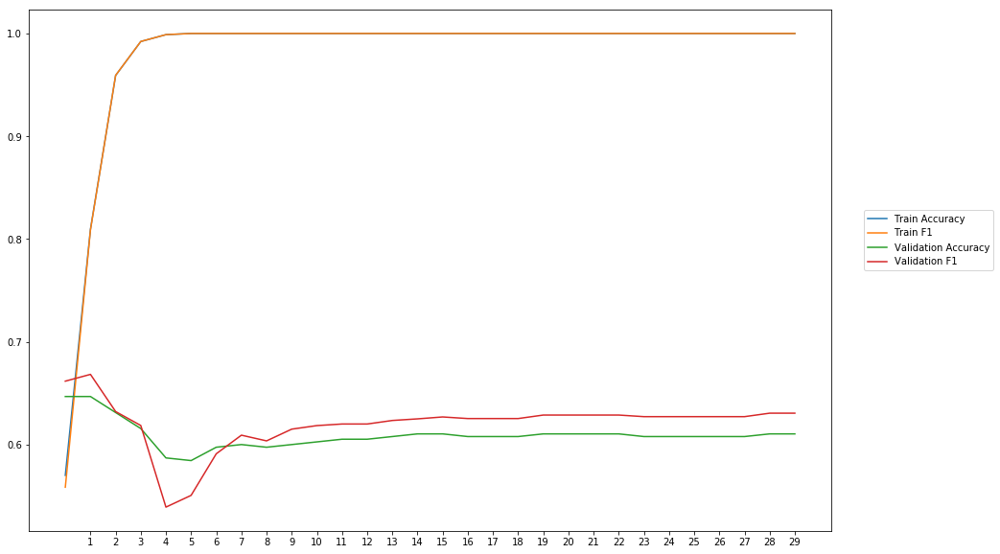

Average Accuracy: 60.91%
Average Precision: 60.41%
Average Recall: 63.92%
Average F1: 62.04%

-----Fold 2--------


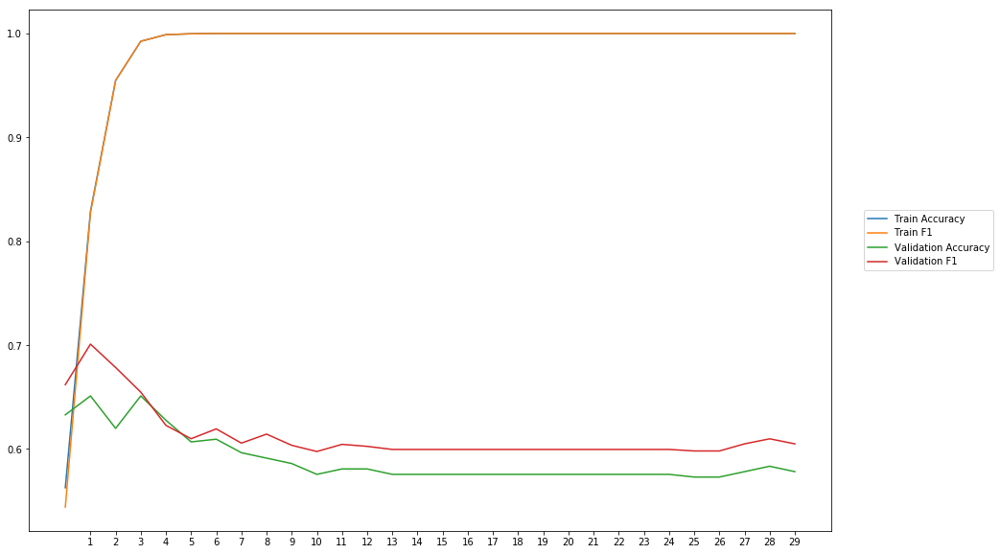

Average Accuracy: 59.00%
Average Precision: 58.33%
Average Recall: 64.70%
Average F1: 61.28%

-----Fold 3--------


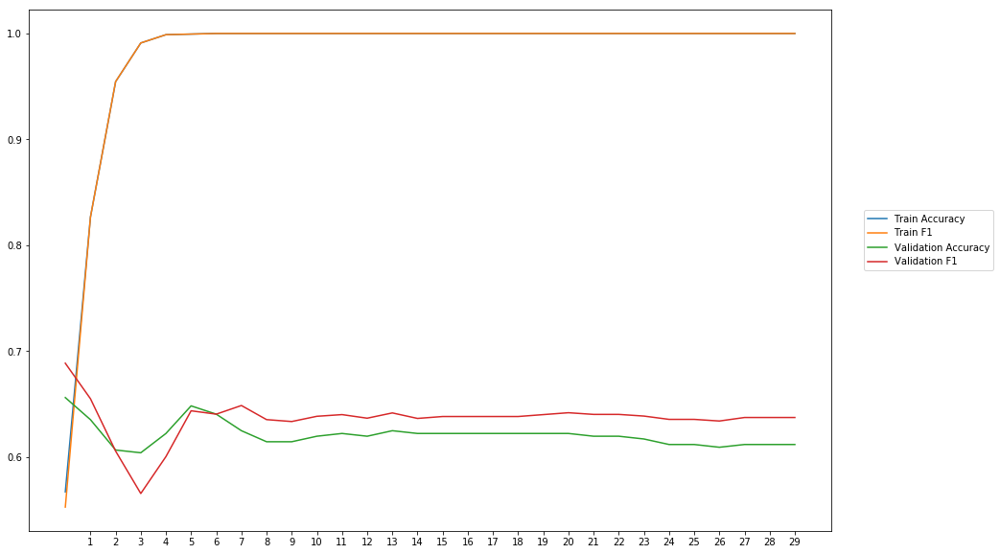

Average Accuracy: 62.13%
Average Precision: 61.53%
Average Recall: 66.04%
Average F1: 63.62%

-----Fold 4--------


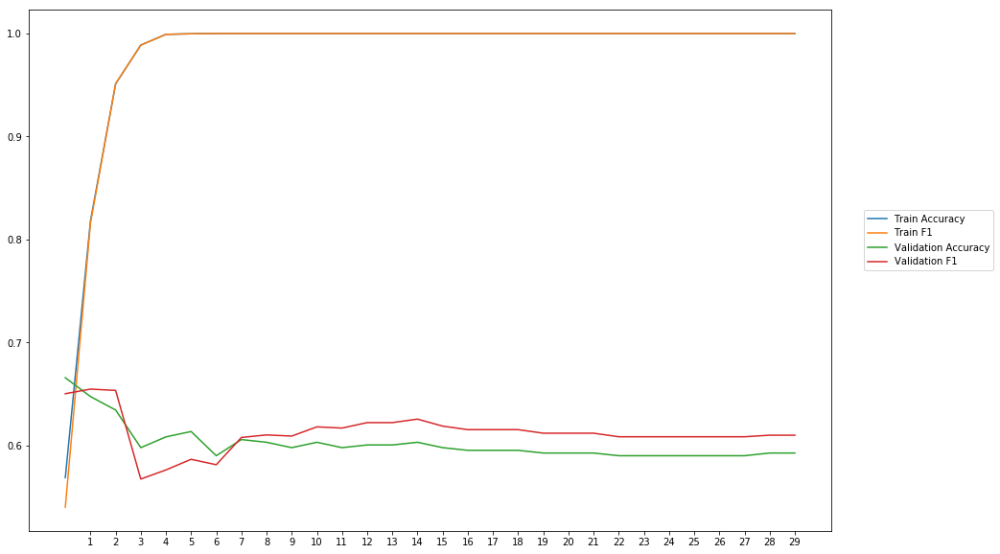

Average Accuracy: 60.19%
Average Precision: 59.91%
Average Recall: 62.85%
Average F1: 61.25%

-----Fold 5--------


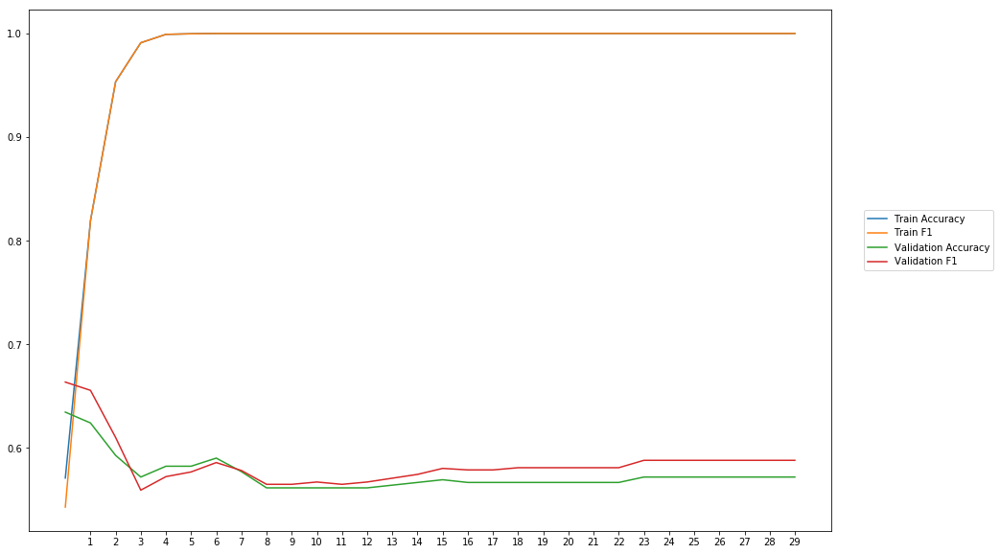

Average Accuracy: 57.43%
Average Precision: 57.20%
Average Recall: 59.81%
Average F1: 58.44%

-----Fold 6--------


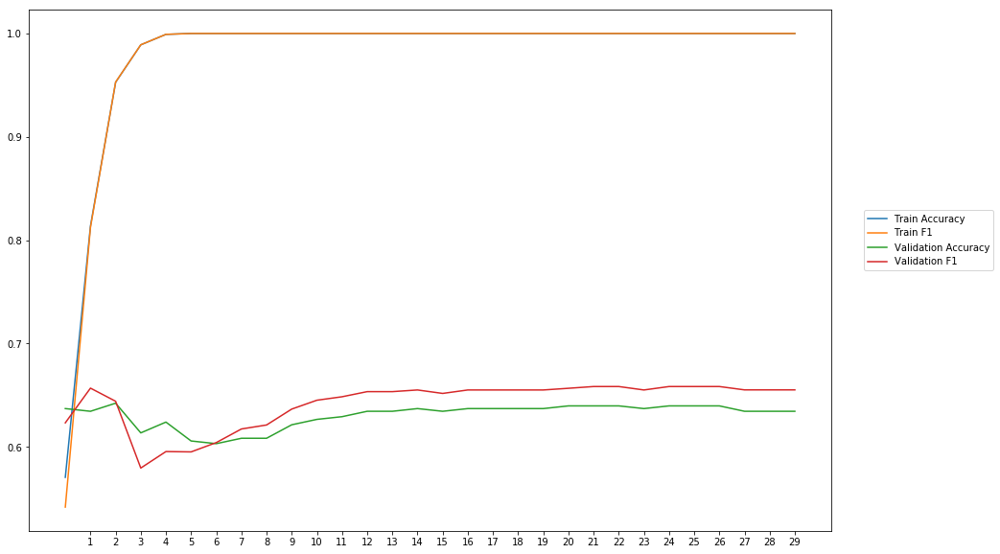

Average Accuracy: 63.07%
Average Precision: 62.41%
Average Recall: 66.37%
Average F1: 64.24%

-----Fold 7--------


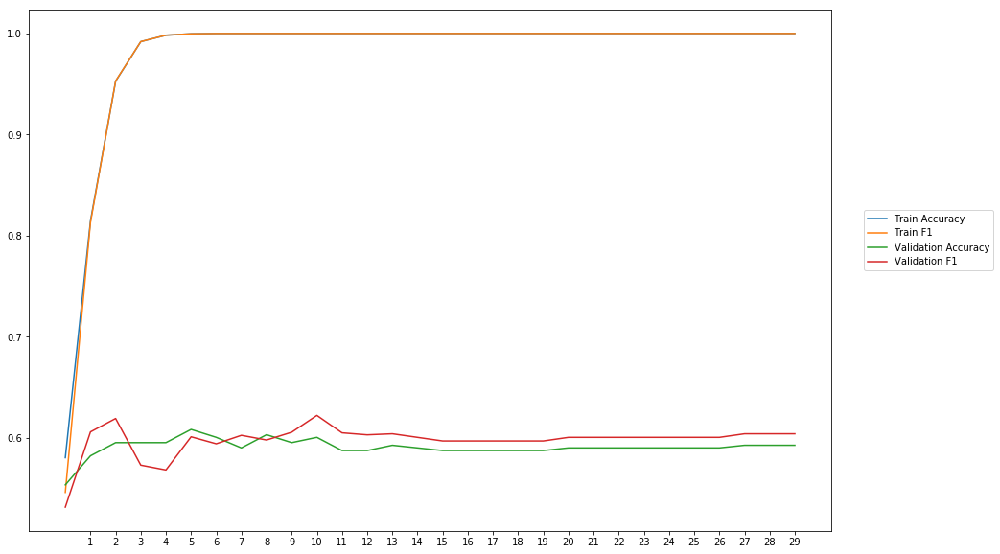

Average Accuracy: 59.08%
Average Precision: 58.93%
Average Recall: 60.76%
Average F1: 59.78%

-----Fold 8--------


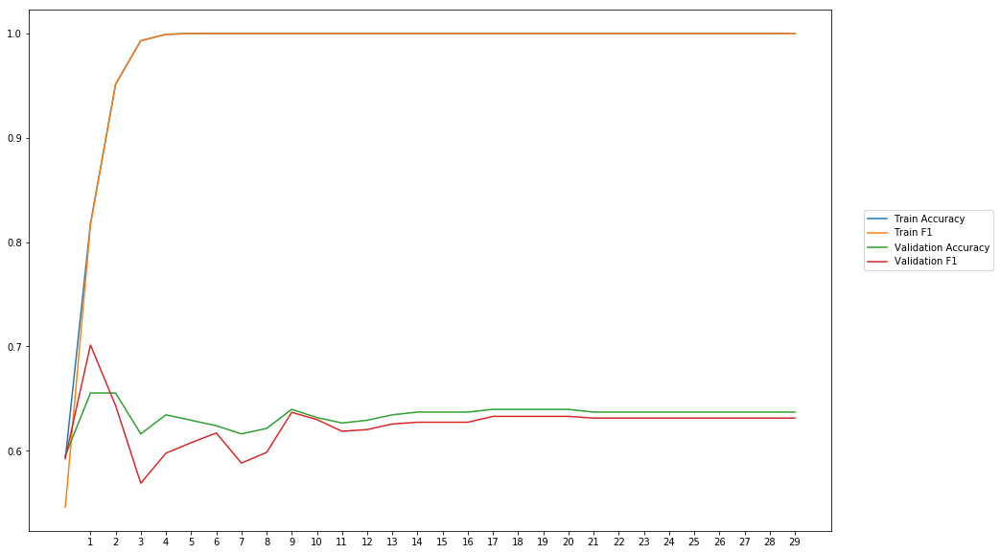

Average Accuracy: 63.38%
Average Precision: 64.22%
Average Recall: 61.02%
Average F1: 62.48%

-----Fold 9--------


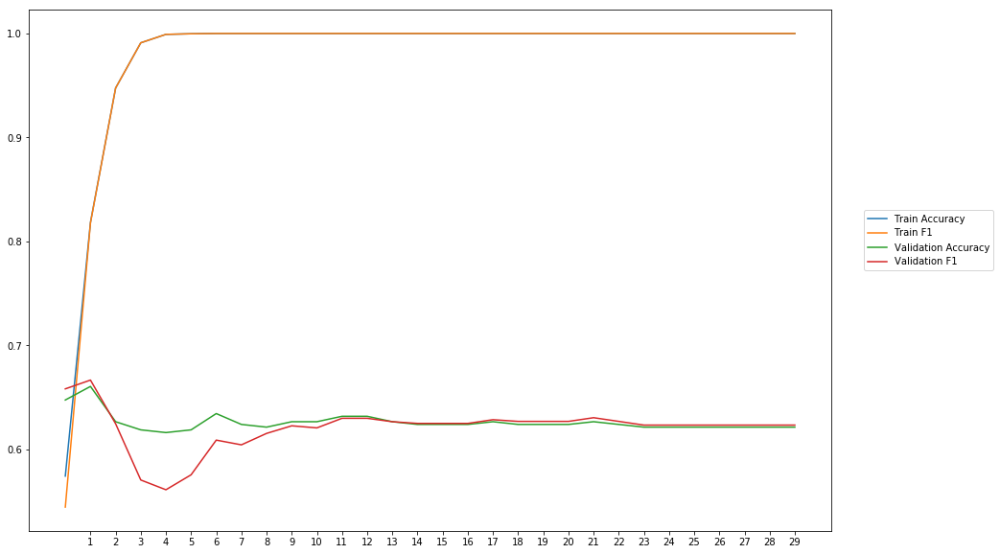

Average Accuracy: 62.61%
Average Precision: 63.17%
Average Recall: 61.22%
Average F1: 62.07%

-----Fold 10--------


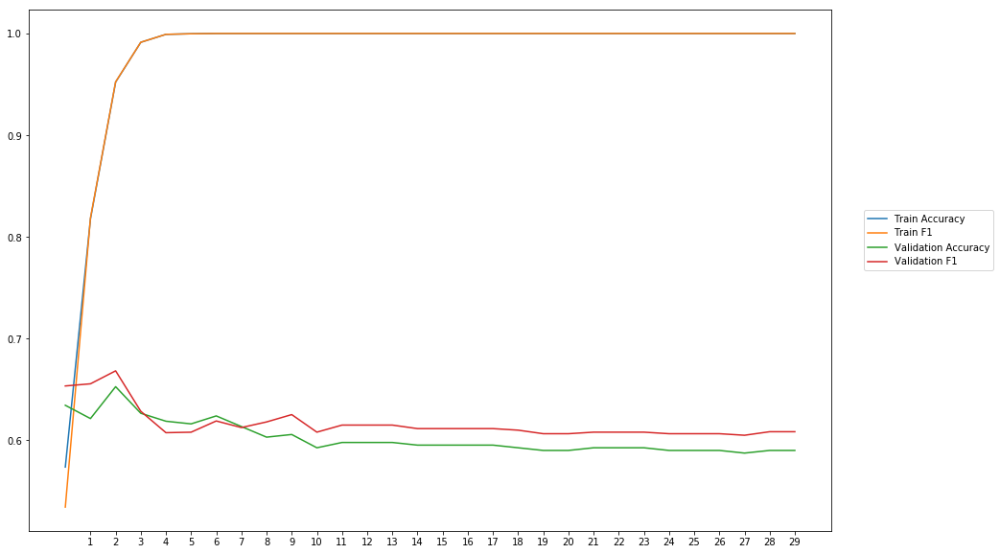

Average Accuracy: 60.24%
Average Precision: 59.74%
Average Recall: 63.68%
Average F1: 61.61%

-------Overallresults-------


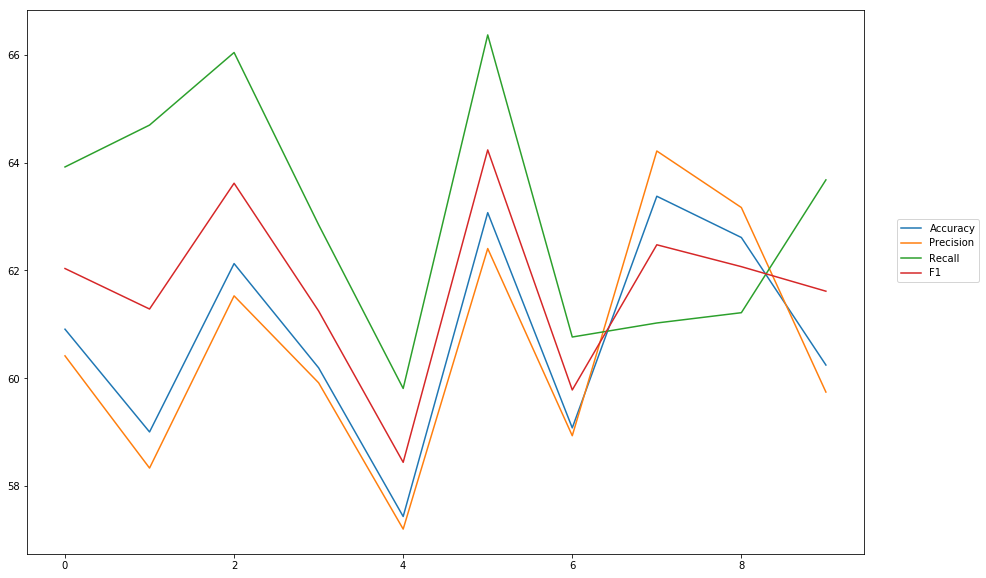

Accuracy: Mean = 60.80% (+/- 1.87%), Max = 63.38%, Min =  57.43%
Precision: Mean = 60.58% (+/- 2.11%), Max = 64.22%, Min =  57.20%
Recall: Mean = 63.04% (+/- 2.17%), Max = 66.37%, Min =  59.81%
F1: Mean = 61.68% (+/- 1.60%), Max = 64.24%, Min =  58.44%


In [18]:
cross_val(model2, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'cnn_1_400_maxpool_kernel3') 

## CNN two CNN layer, 400 filter

In [ ]:
wv_layer3 = Embedding(len(word_index)+1,
                     EMBEDDING_DIM,
                     weights=[embedding_matrix],
                     input_length=MAX_SEQUENCE_LENGTH,
                     trainable=True)

#Input Layer
comment_input3= Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences3 = wv_layer3(comment_input3)

#CNN-Layer
x3 = Conv1D(400, kernel_size =3, activation='relu')(embedded_sequences3)

#MCNN-Layer
x3 = Conv1D(400, kernel_size =3, activation='relu') (x3)

x3 = Flatten() (x3)

#Output (Dense) Layer
preds3 = Dense(2, activation='softmax')(x3)

# build the model
model3 = Model(inputs=[comment_input3], outputs=preds3)


-----Fold 1--------


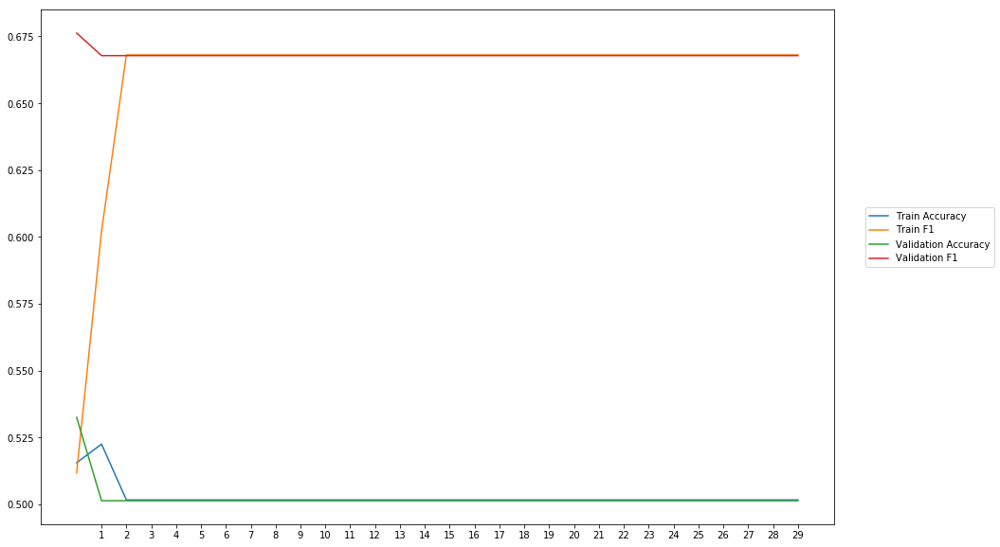

Average Accuracy: 50.23%
Average Precision: 50.19%
Average Recall: 99.91%
Average F1: 66.81%

-----Fold 2--------


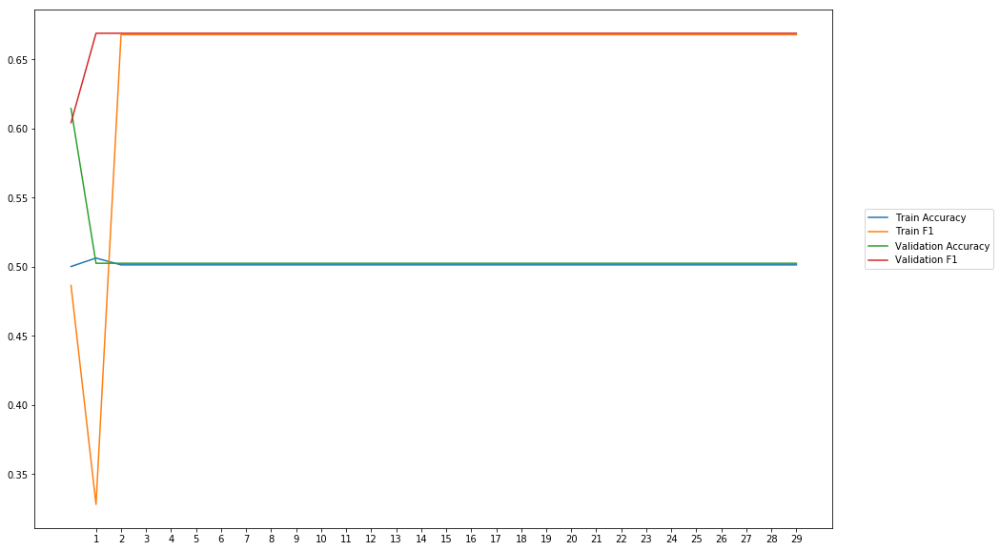

Average Accuracy: 50.63%
Average Precision: 50.67%
Average Recall: 98.62%
Average F1: 66.68%

-----Fold 3--------


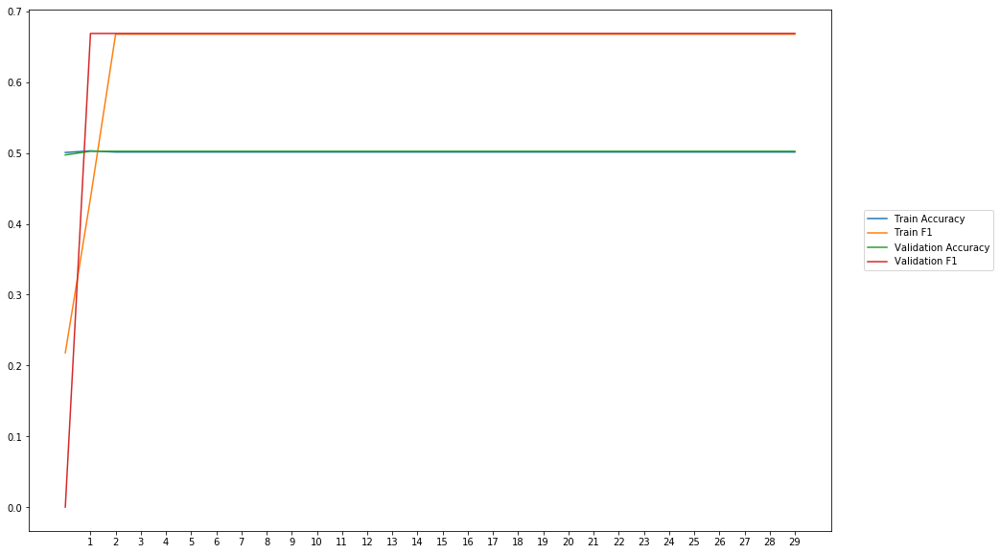

Average Accuracy: 50.24%
Average Precision: 48.59%
Average Recall: 96.67%
Average F1: 64.67%

-----Fold 4--------


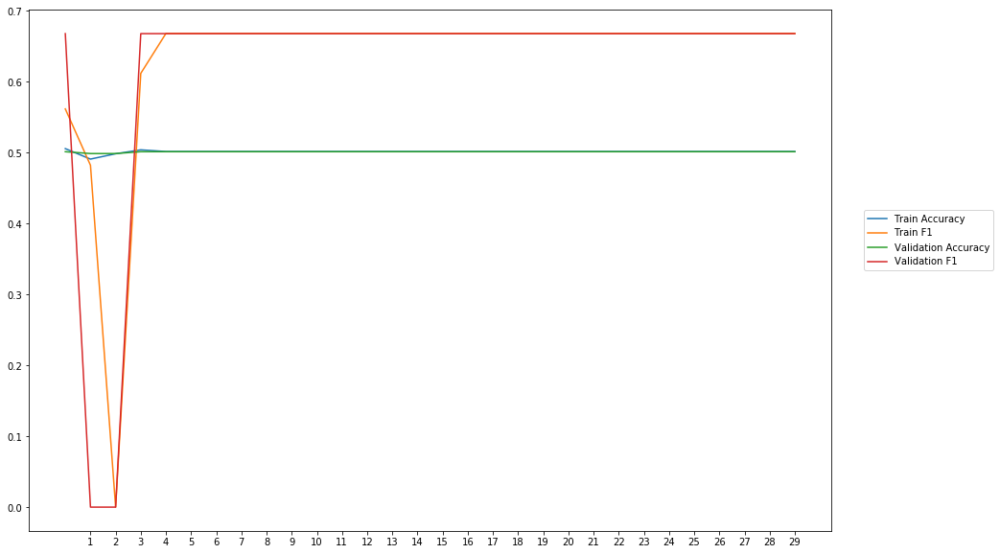

Average Accuracy: 50.11%
Average Precision: 46.79%
Average Recall: 93.33%
Average F1: 62.33%

-----Fold 5--------


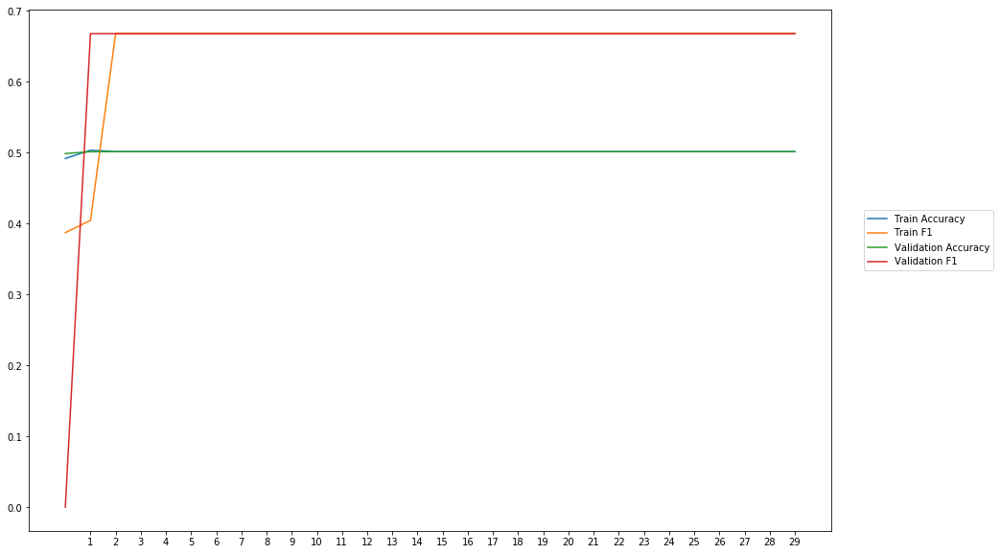

Average Accuracy: 50.12%
Average Precision: 48.46%
Average Recall: 96.67%
Average F1: 64.56%

-----Fold 6--------


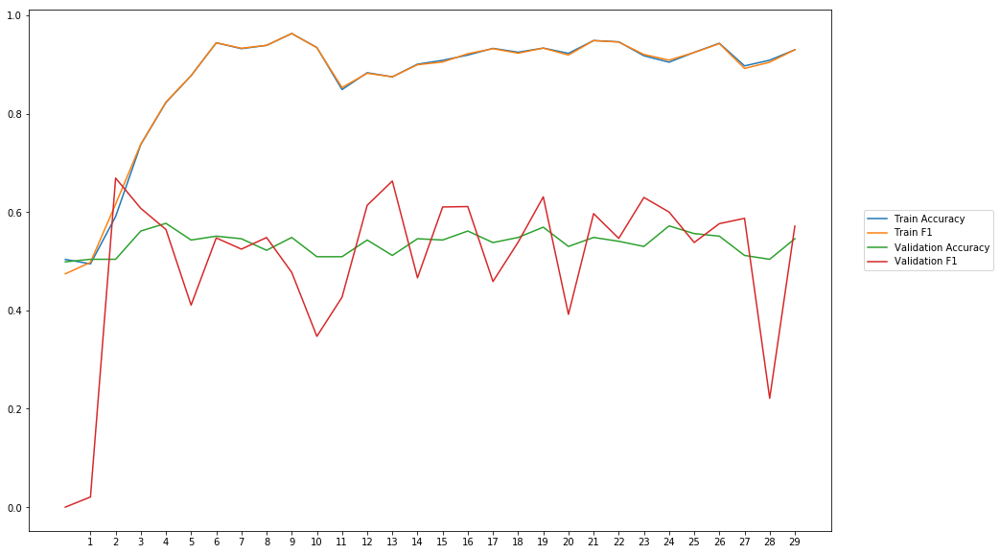

Average Accuracy: 53.74%
Average Precision: 54.00%
Average Recall: 52.86%
Average F1: 49.98%

-----Fold 7--------


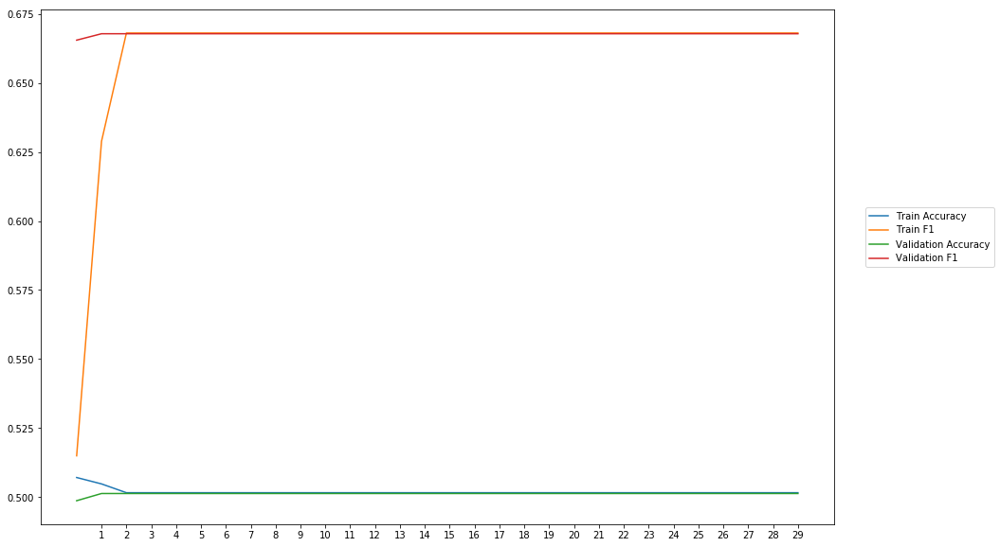

Average Accuracy: 50.12%
Average Precision: 50.13%
Average Recall: 99.98%
Average F1: 66.77%

-----Fold 8--------


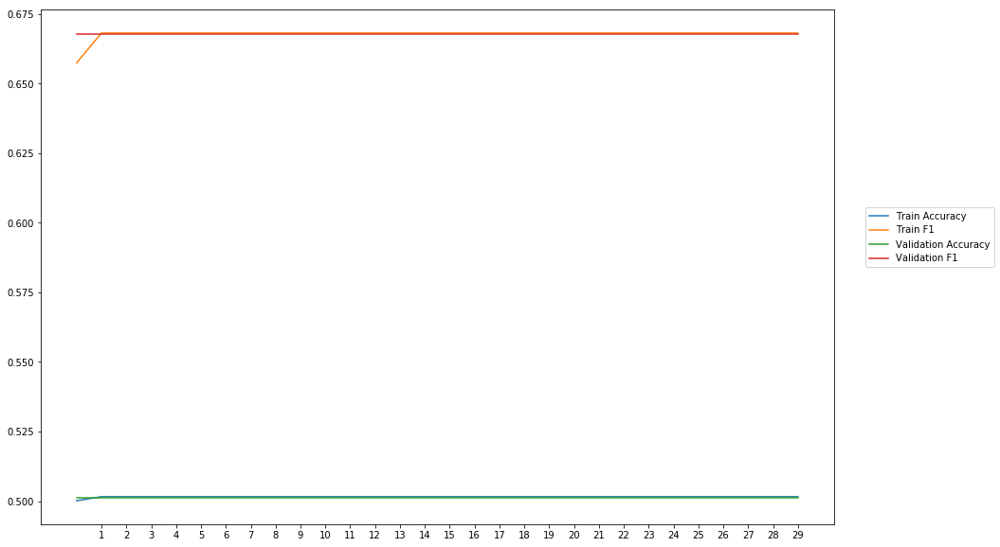

Average Accuracy: 50.13%
Average Precision: 50.13%
Average Recall: 100.00%
Average F1: 66.78%

-----Fold 9--------


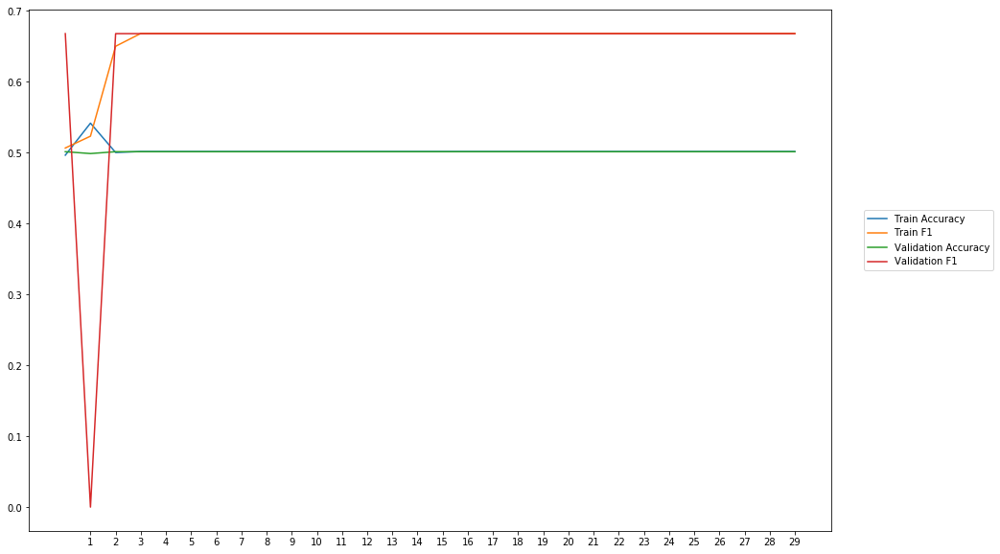

Average Accuracy: 50.12%
Average Precision: 48.46%
Average Recall: 96.67%
Average F1: 64.56%

-----Fold 10--------


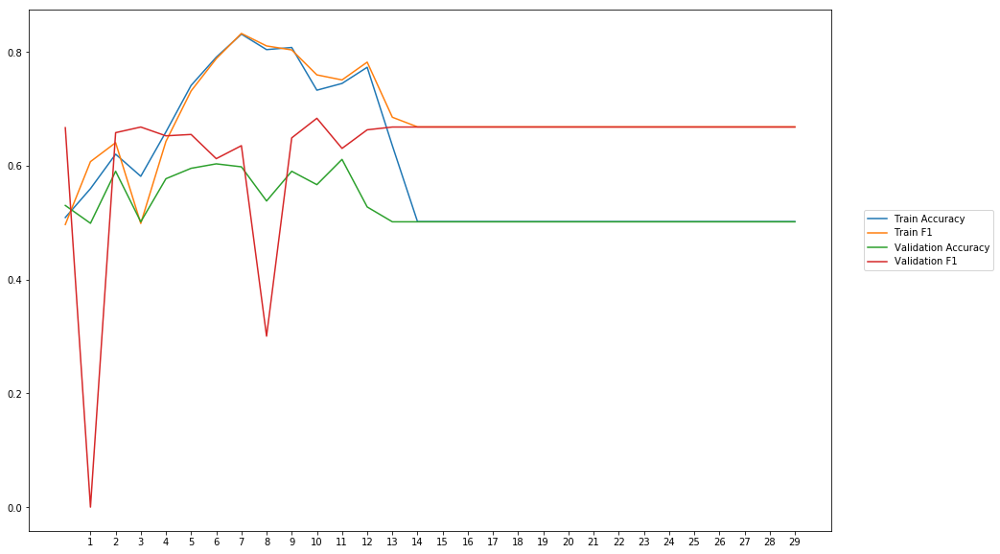

Average Accuracy: 52.83%
Average Precision: 50.88%
Average Recall: 86.93%
Average F1: 62.75%

-------Overallresults-------


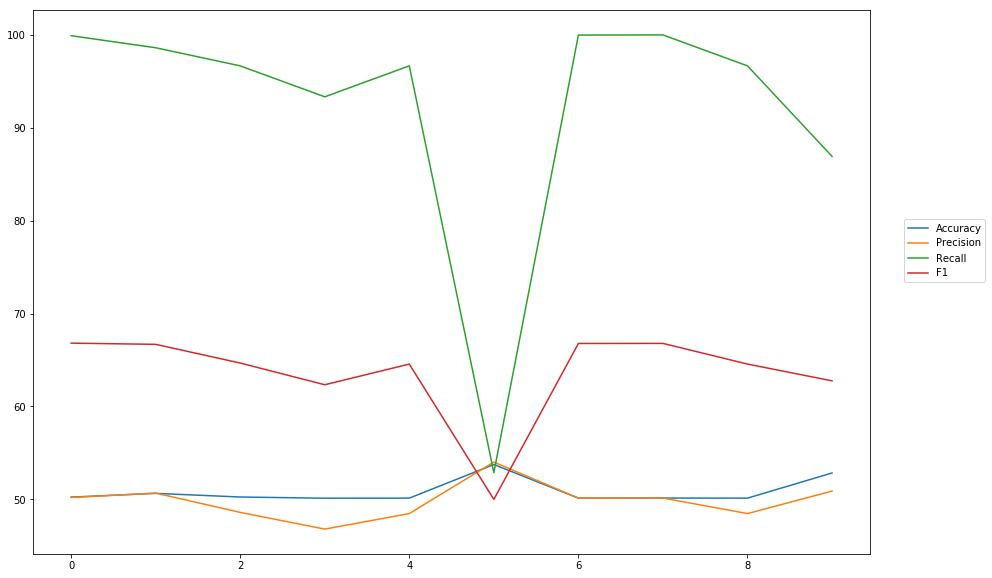

Accuracy: Mean = 50.83% (+/- 1.25%), Max = 53.74%, Min =  50.11%
Precision: Mean = 49.83% (+/- 1.85%), Max = 54.00%, Min =  46.79%
Recall: Mean = 92.16% (+/- 13.63%), Max = 100.00%, Min =  52.86%
F1: Mean = 63.59% (+/- 4.80%), Max = 66.81%, Min =  49.98%


In [20]:
cross_val(model3, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'cnn_2_400_kernel3') 

## CNN two CNN-layer, first 400 filter second 300 filter

In [ ]:
wv_layer4 = Embedding(len(word_index)+1,
                     EMBEDDING_DIM,
                     weights=[embedding_matrix],
                     input_length=MAX_SEQUENCE_LENGTH,
                     trainable=True)

#Input Layer
comment_input4= Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences4 = wv_layer4(comment_input4)

#CNN-Layer
x4 = Conv1D(400, kernel_size =3, activation='relu')(embedded_sequences4)

#CNN-Layer
x4 = Conv1D(300, kernel_size =3, activation='relu') (x4)

x4 = Flatten() (x4)

#Output (Dense) Layer
preds4 = Dense(2, activation='softmax')(x4)

# build the model
model4 = Model(inputs=[comment_input4], outputs=preds4)


-----Fold 1--------


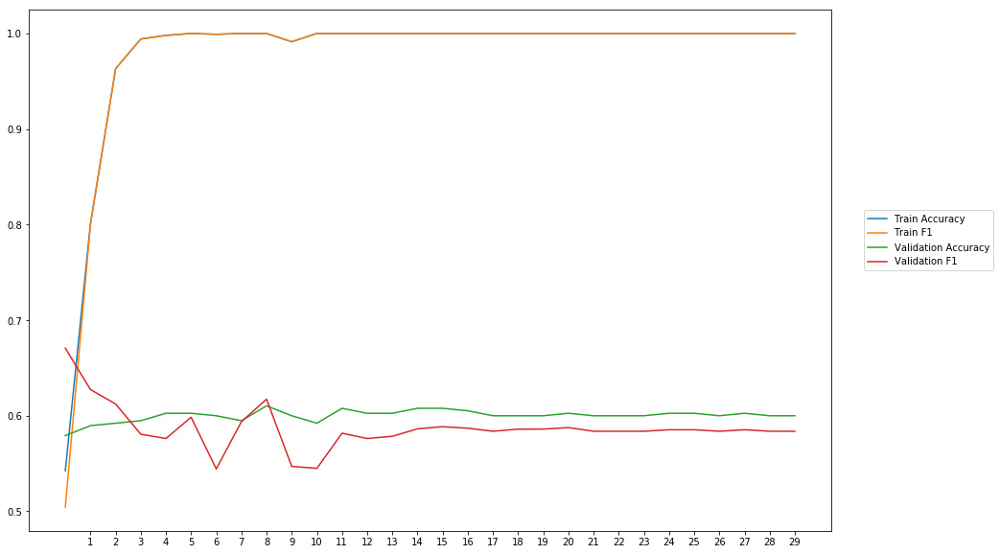

Average Accuracy: 60.01%
Average Precision: 60.99%
Average Recall: 57.10%
Average F1: 58.71%

-----Fold 2--------


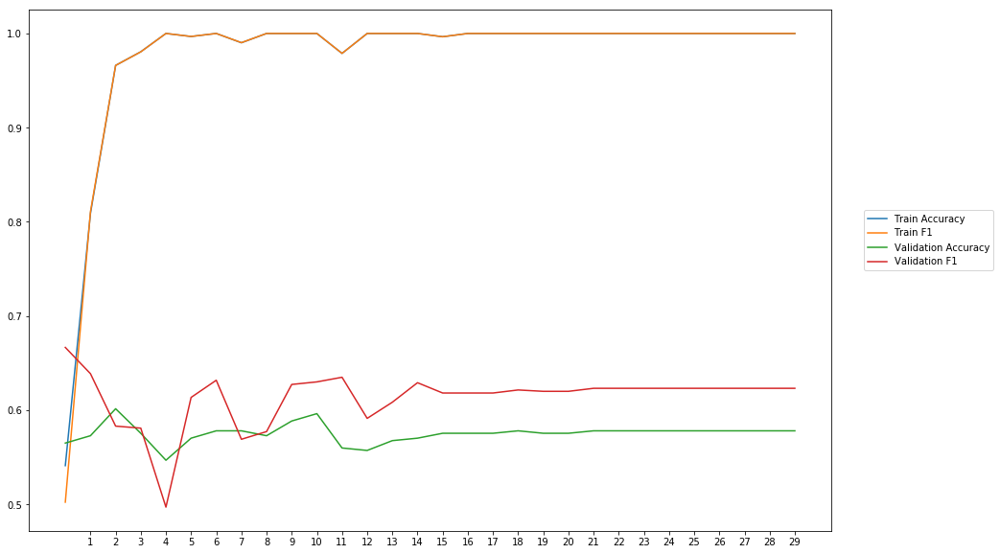

Average Accuracy: 57.53%
Average Precision: 56.59%
Average Recall: 67.56%
Average F1: 61.35%

-----Fold 3--------


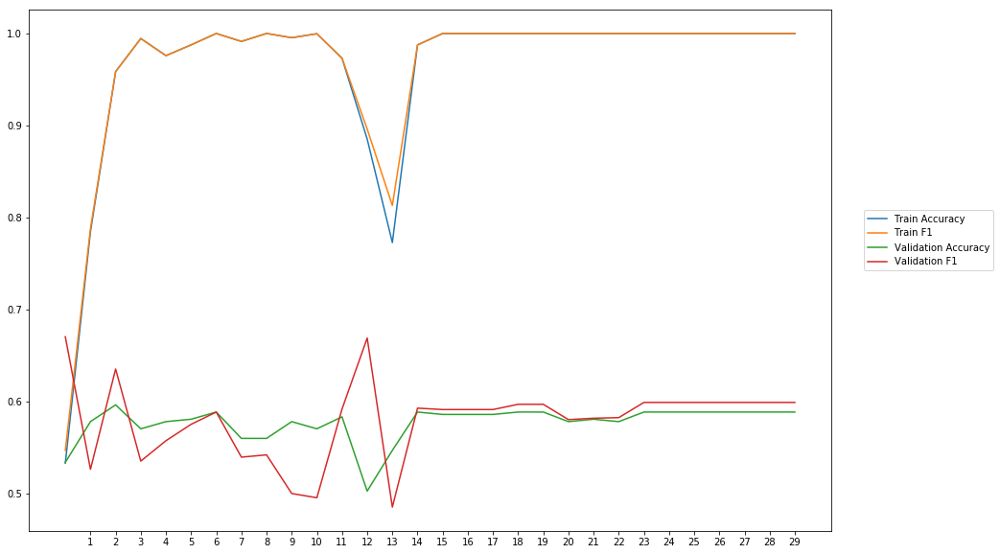

Average Accuracy: 57.69%
Average Precision: 58.16%
Average Recall: 59.33%
Average F1: 58.03%

-----Fold 4--------


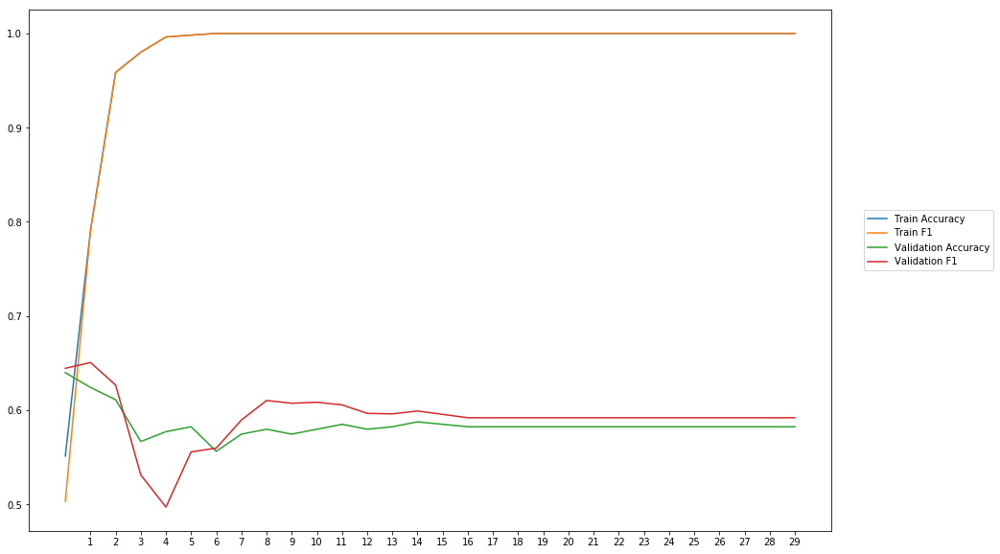

Average Accuracy: 58.45%
Average Precision: 58.31%
Average Recall: 60.38%
Average F1: 59.19%

-----Fold 5--------


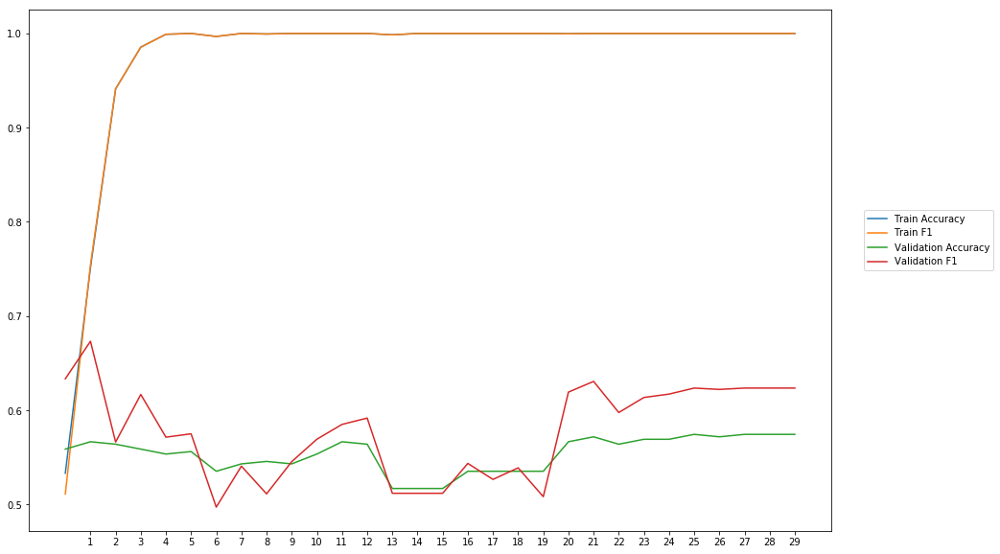

Average Accuracy: 55.37%
Average Precision: 54.80%
Average Recall: 61.79%
Average F1: 57.75%

-----Fold 6--------


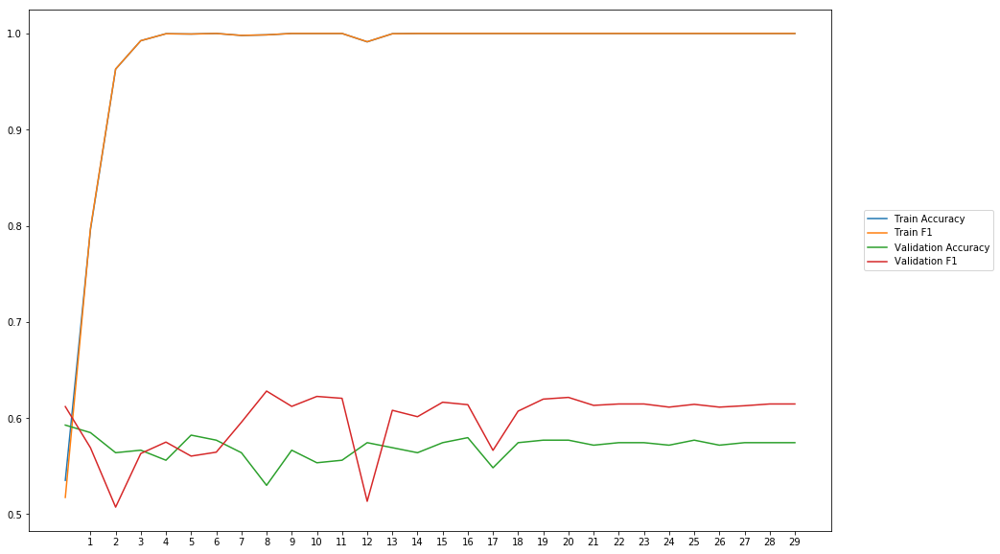

Average Accuracy: 56.99%
Average Precision: 56.42%
Average Recall: 64.20%
Average F1: 59.73%

-----Fold 7--------


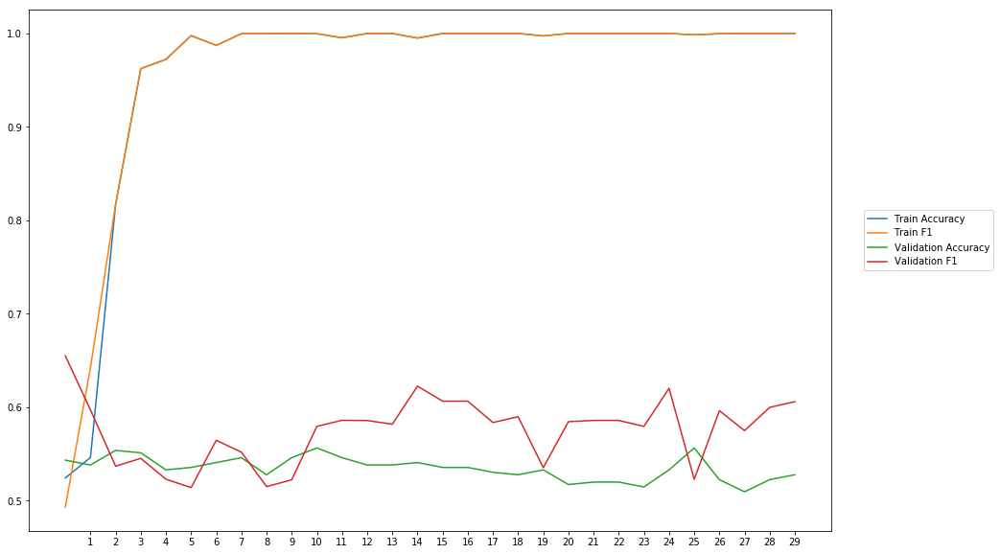

Average Accuracy: 53.44%
Average Precision: 53.14%
Average Recall: 63.61%
Average F1: 57.50%

-----Fold 8--------


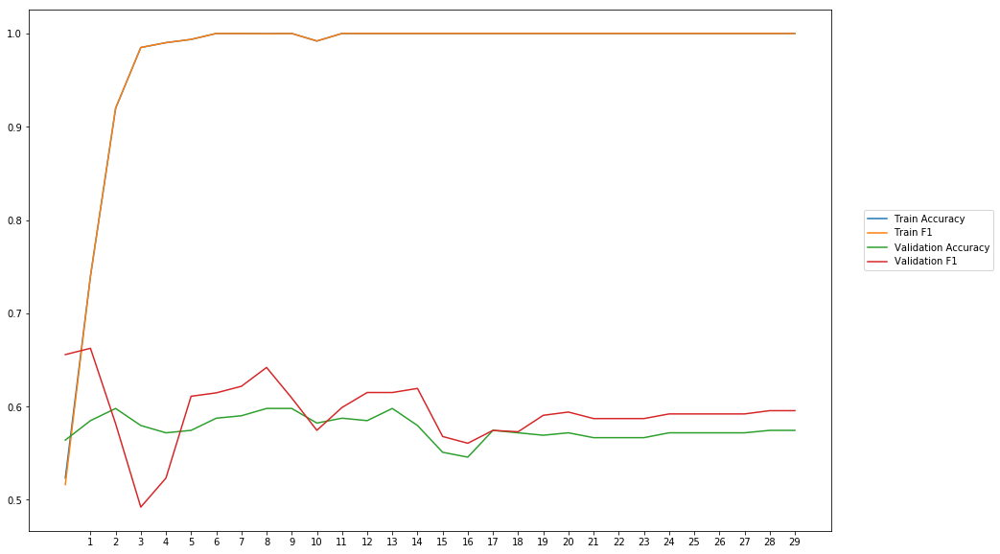

Average Accuracy: 57.66%
Average Precision: 57.29%
Average Recall: 62.34%
Average F1: 59.39%

-----Fold 9--------


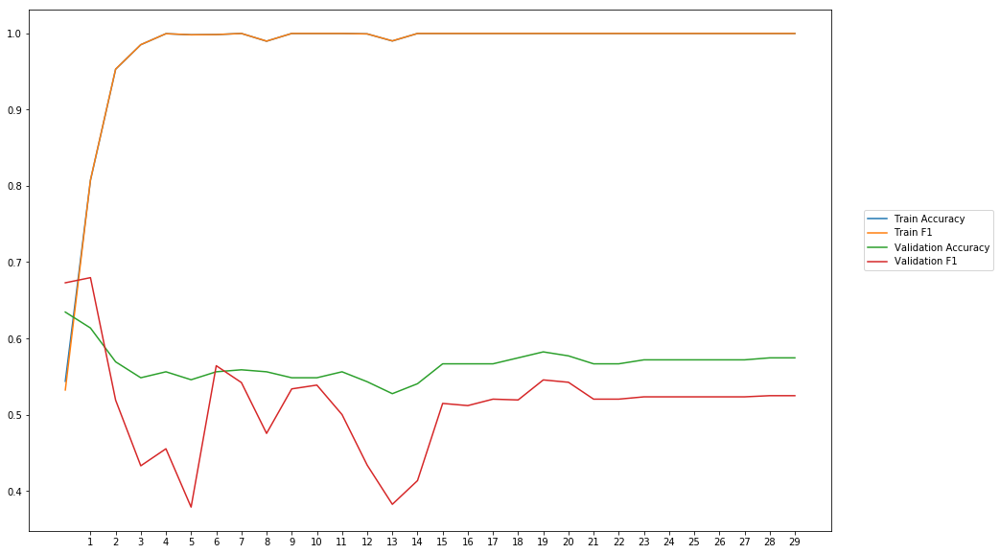

Average Accuracy: 56.59%
Average Precision: 58.38%
Average Recall: 46.74%
Average F1: 51.27%

-----Fold 10--------


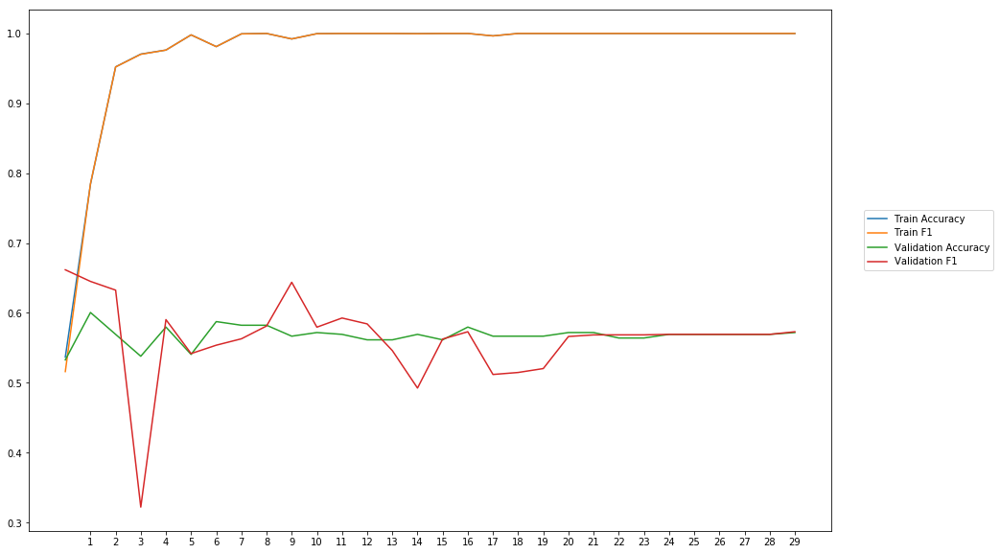

Average Accuracy: 56.81%
Average Precision: 57.26%
Average Recall: 57.00%
Average F1: 56.34%

-------Overallresults-------


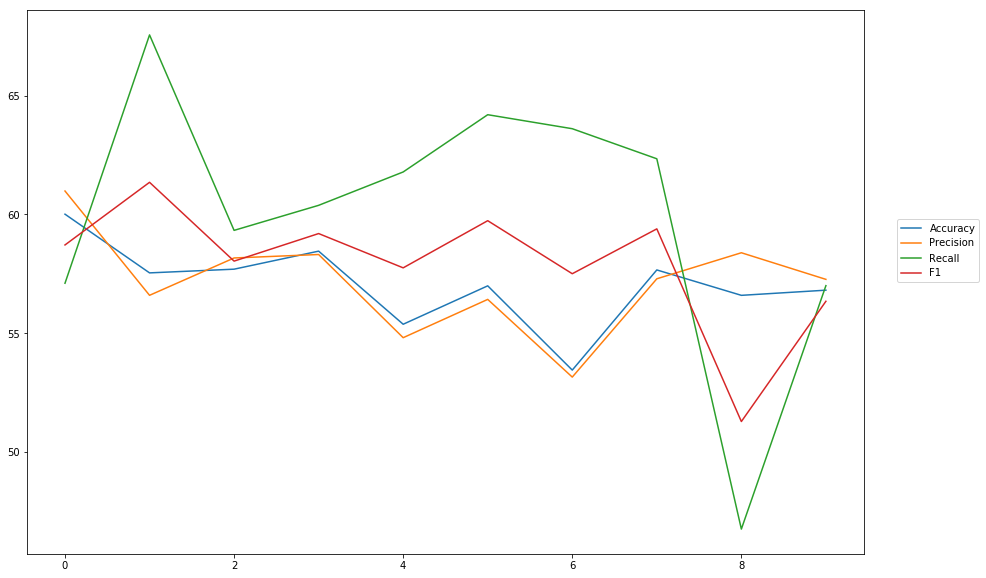

Accuracy: Mean = 57.05% (+/- 1.67%), Max = 60.01%, Min =  53.44%
Precision: Mean = 57.13% (+/- 2.03%), Max = 60.99%, Min =  53.14%
Recall: Mean = 60.00% (+/- 5.39%), Max = 67.56%, Min =  46.74%
F1: Mean = 57.93% (+/- 2.58%), Max = 61.35%, Min =  51.27%


In [21]:
cross_val(model4, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'cnn_2_400_300_kernel3') 

## CNN two CNN, MaxPooling after first, 400 filters

In [ ]:
wv_layer6 = Embedding(len(word_index)+1,
                     EMBEDDING_DIM,
                     weights=[embedding_matrix],
                     input_length=MAX_SEQUENCE_LENGTH,
                     trainable=True)

#Input Layer
comment_input6= Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences6 = wv_layer6(comment_input6)

#CNN-Layer
x6 = Conv1D(400, kernel_size =3, activation='relu')(embedded_sequences6)

#MaxPooling-Layer
x6 = MaxPooling1D(pool_size=2)(x6)

#CNN-Layer
x6 = Conv1D(400, kernel_size =3, activation='relu') (x6)

x6 = Flatten() (x6)

#Output (Dense) Layer
preds6 = Dense(2, activation='softmax')(x6)

# build the model
model6 = Model(inputs=[comment_input6], outputs=preds6)


-----Fold 1--------


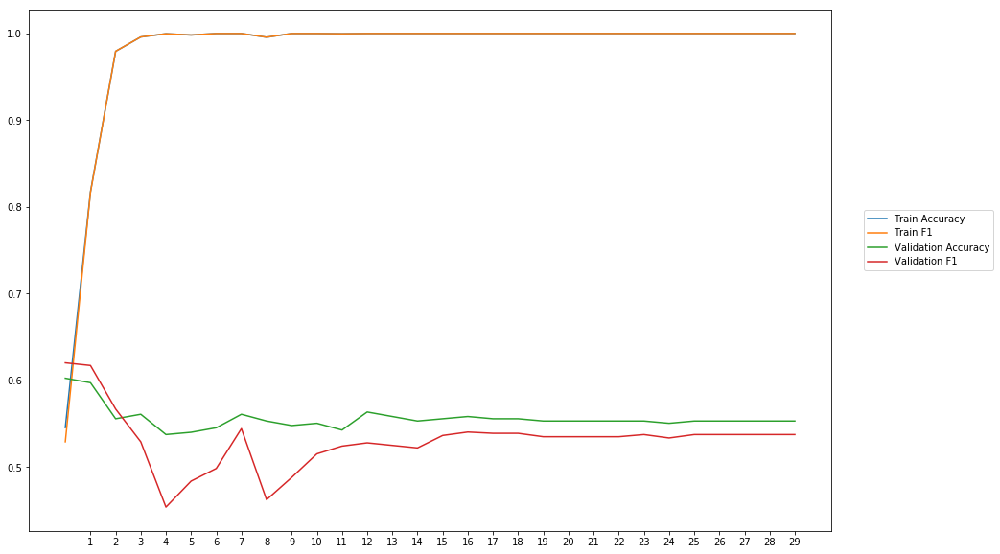

Average Accuracy: 55.60%
Average Precision: 56.36%
Average Recall: 50.50%
Average F1: 53.12%

-----Fold 2--------


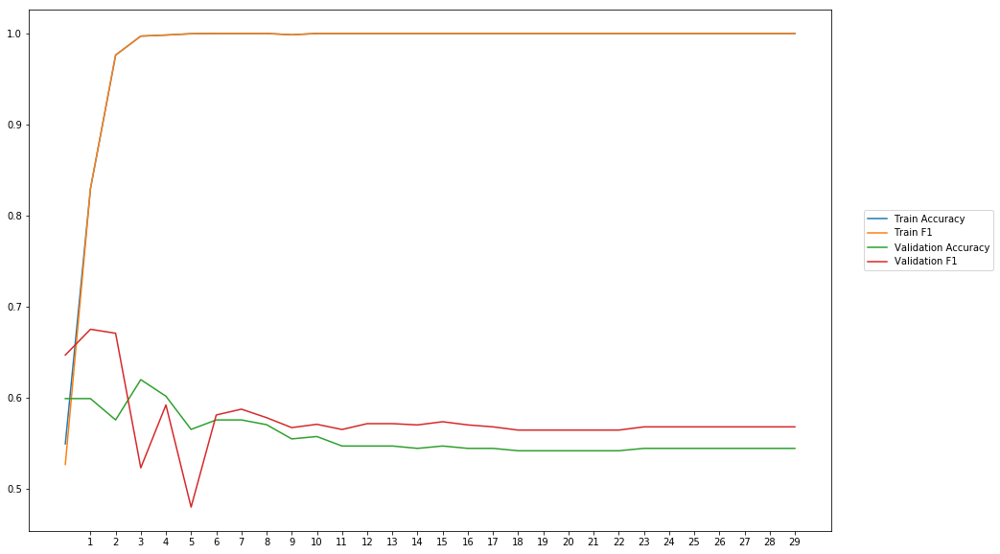

Average Accuracy: 55.77%
Average Precision: 55.85%
Average Recall: 60.21%
Average F1: 57.53%

-----Fold 3--------


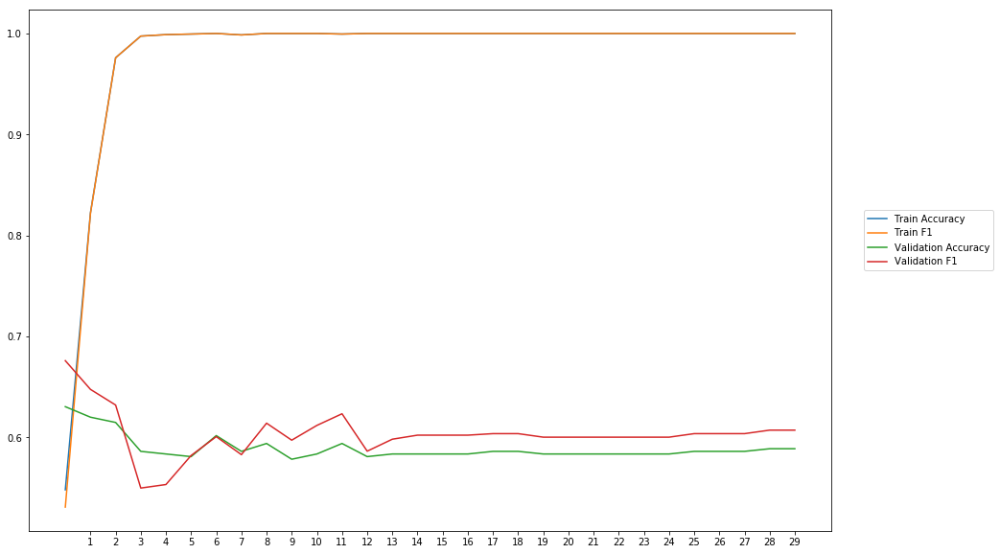

Average Accuracy: 58.91%
Average Precision: 58.59%
Average Recall: 62.30%
Average F1: 60.30%

-----Fold 4--------


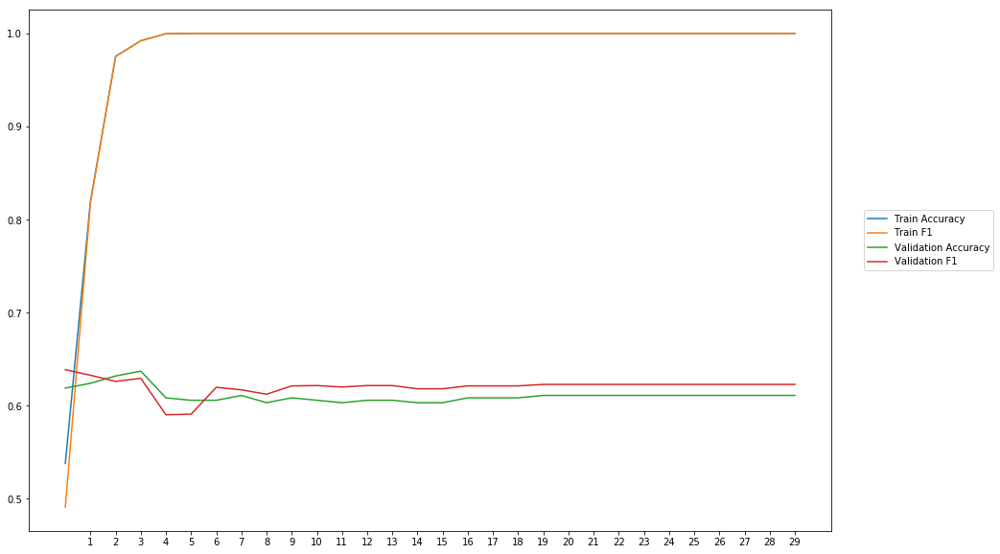

Average Accuracy: 61.09%
Average Precision: 60.74%
Average Recall: 63.47%
Average F1: 62.04%

-----Fold 5--------


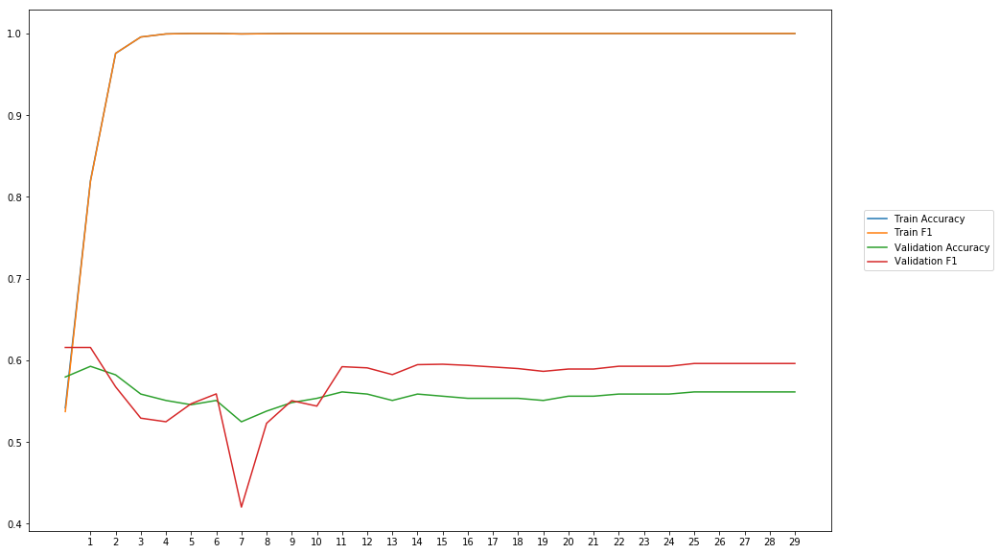

Average Accuracy: 55.73%
Average Precision: 55.38%
Average Recall: 60.31%
Average F1: 57.51%

-----Fold 6--------


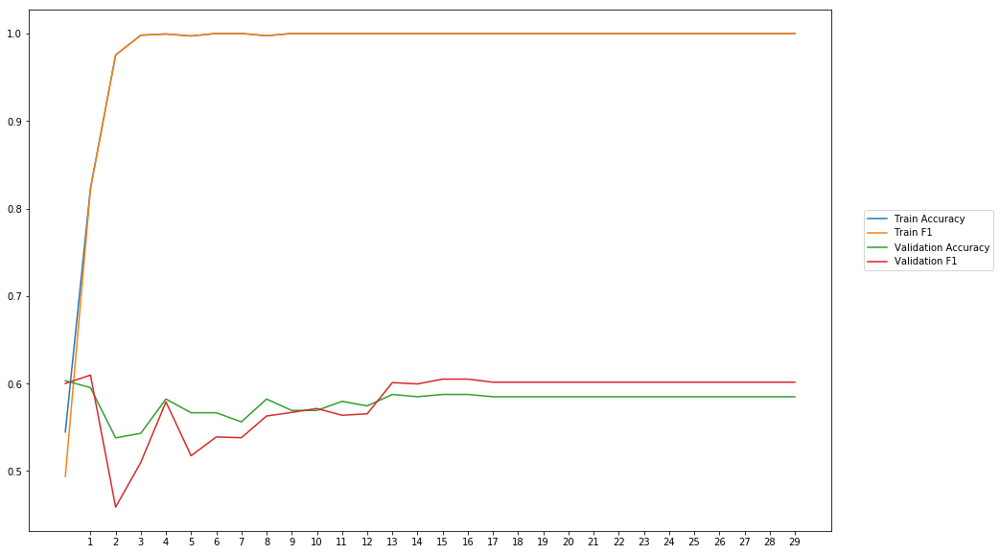

Average Accuracy: 57.92%
Average Precision: 57.93%
Average Recall: 58.45%
Average F1: 58.04%

-----Fold 7--------


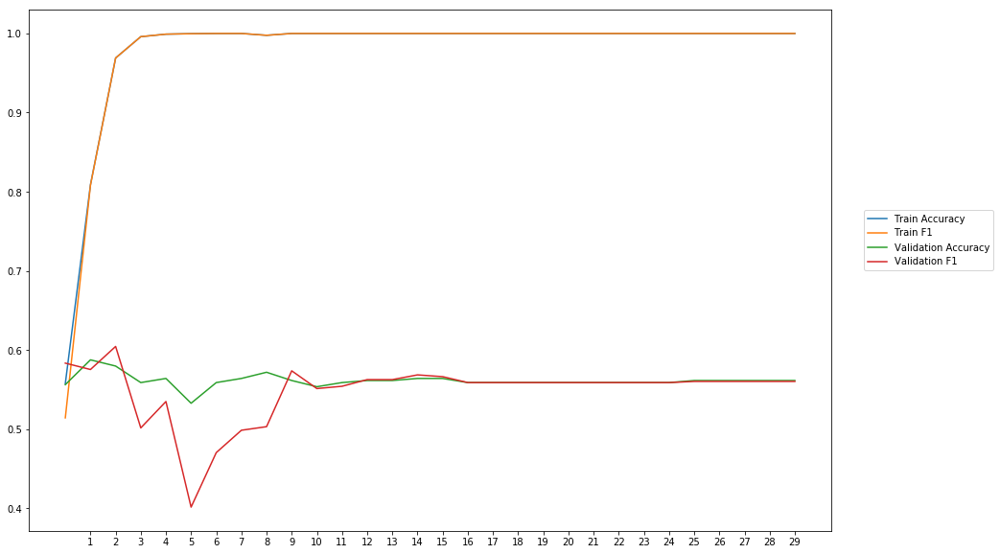

Average Accuracy: 56.11%
Average Precision: 56.67%
Average Recall: 53.59%
Average F1: 54.80%

-----Fold 8--------


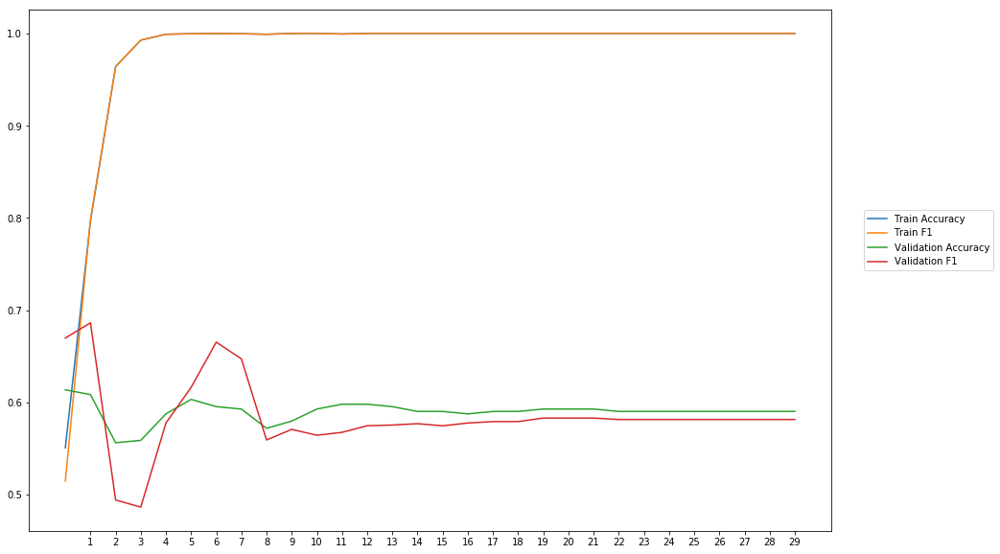

Average Accuracy: 58.99%
Average Precision: 59.34%
Average Recall: 58.37%
Average F1: 58.47%

-----Fold 9--------


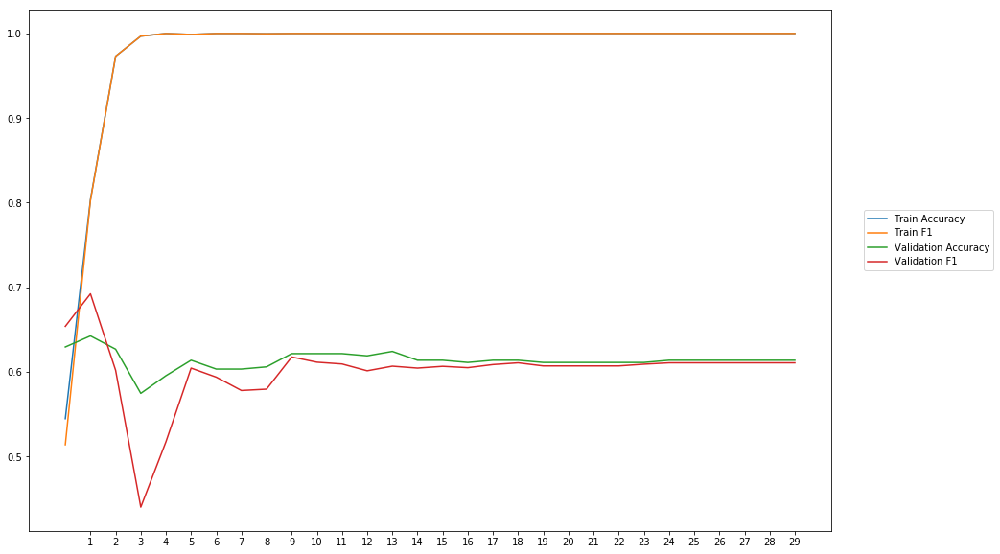

Average Accuracy: 61.34%
Average Precision: 62.19%
Average Recall: 58.75%
Average F1: 60.13%

-----Fold 10--------


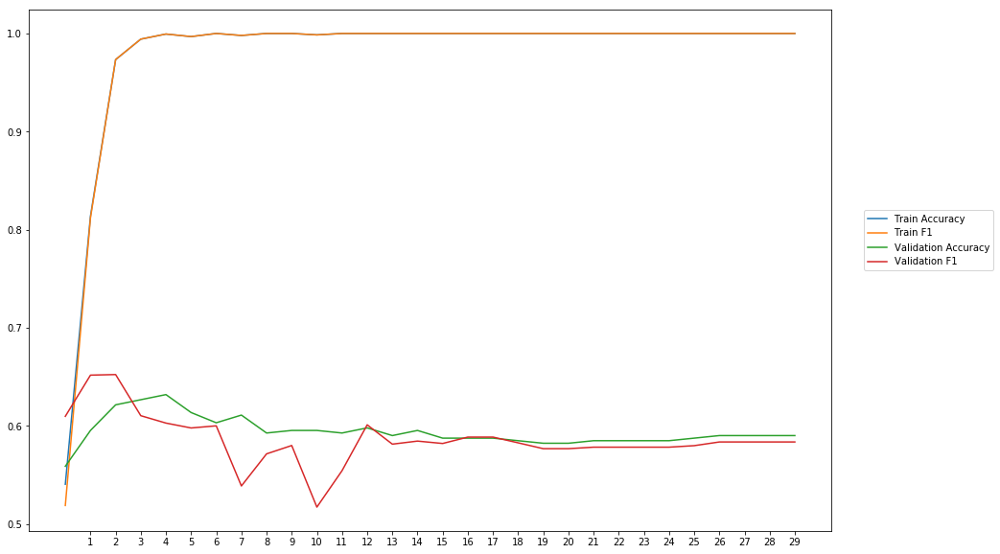

Average Accuracy: 59.40%
Average Precision: 60.12%
Average Recall: 57.60%
Average F1: 58.58%

-------Overallresults-------


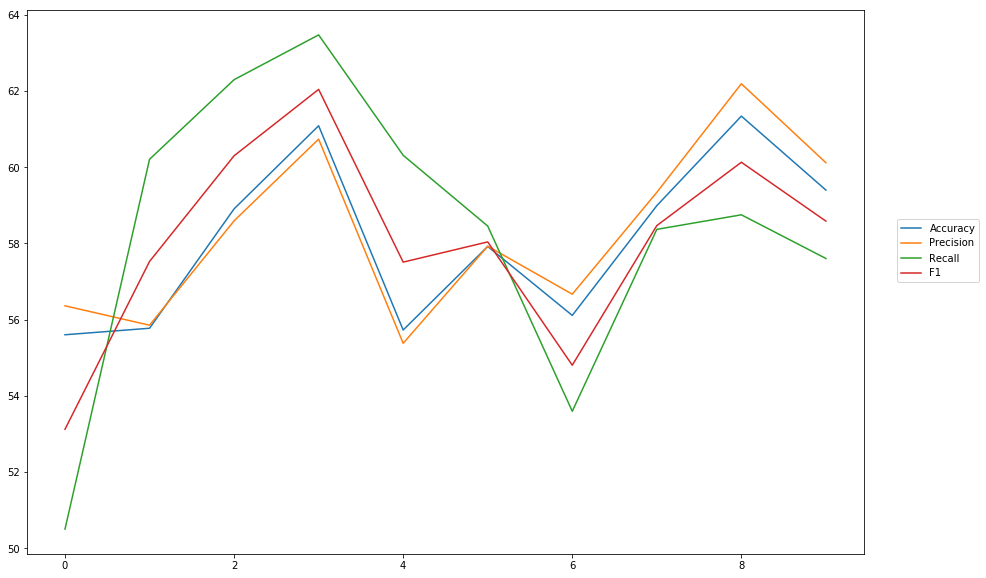

Accuracy: Mean = 58.09% (+/- 2.09%), Max = 61.34%, Min =  55.60%
Precision: Mean = 58.32% (+/- 2.16%), Max = 62.19%, Min =  55.38%
Recall: Mean = 58.36% (+/- 3.66%), Max = 63.47%, Min =  50.50%
F1: Mean = 58.05% (+/- 2.47%), Max = 62.04%, Min =  53.12%


In [25]:
cross_val(model6, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'cnn_2_400_poolingafterfirst_kernel3') 

## CNN two CNN-layer, Max Pooling after second, 400 filter

In [ ]:
wv_layer7 = Embedding(len(word_index)+1,
                     EMBEDDING_DIM,
                     weights=[embedding_matrix],
                     input_length=MAX_SEQUENCE_LENGTH,
                     trainable=True)

#Input Layer
comment_input7= Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences7 = wv_layer7(comment_input7)

#CNN-Layer
x7 = Conv1D(400, kernel_size =3, activation='relu')(embedded_sequences7)

#CNN-Layer
x7 = Conv1D(400, kernel_size =3, activation='relu') (x7)

#MaxPooling-Layer
x7 = MaxPooling1D(pool_size=2)(x7)

x7 = Flatten() (x7)

#Output (Dense) Layer
preds7 = Dense(2, activation='softmax')(x7)

# build the model
model7 = Model(inputs=[comment_input7], outputs=preds7)


-----Fold 1--------


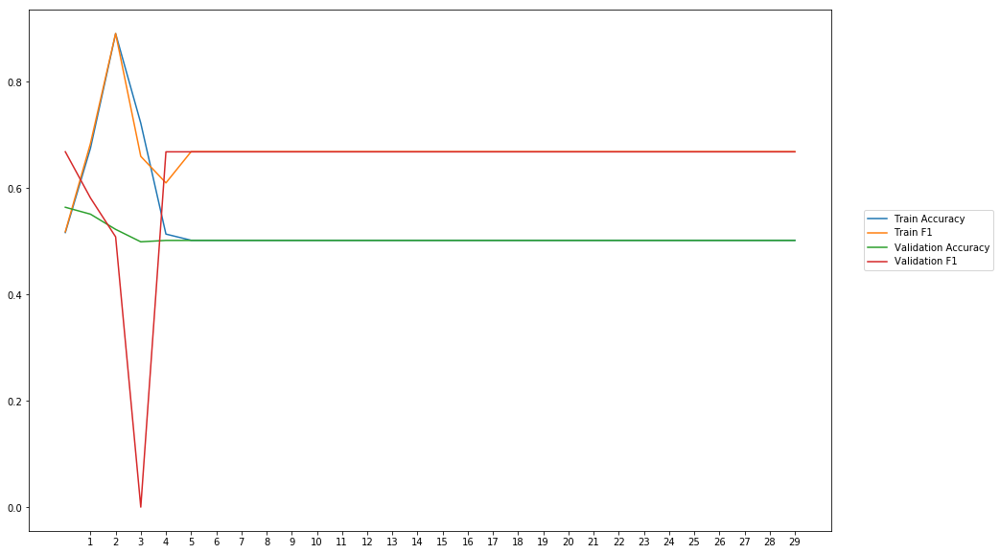

Average Accuracy: 50.56%
Average Precision: 48.81%
Average Recall: 93.30%
Average F1: 63.73%

-----Fold 2--------


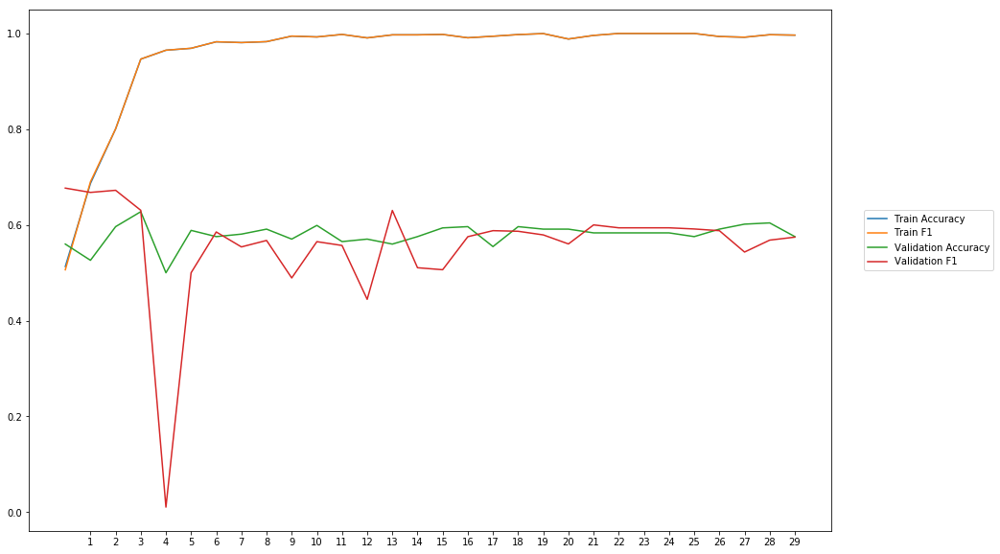

Average Accuracy: 57.97%
Average Precision: 60.74%
Average Recall: 56.04%
Average F1: 55.68%

-----Fold 3--------


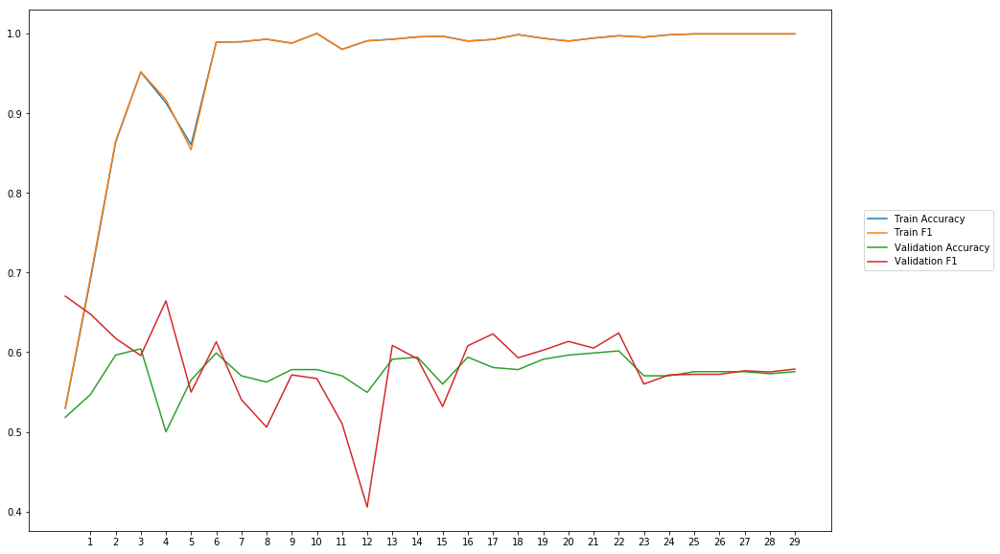

Average Accuracy: 57.47%
Average Precision: 57.85%
Average Recall: 60.41%
Average F1: 58.22%

-----Fold 4--------


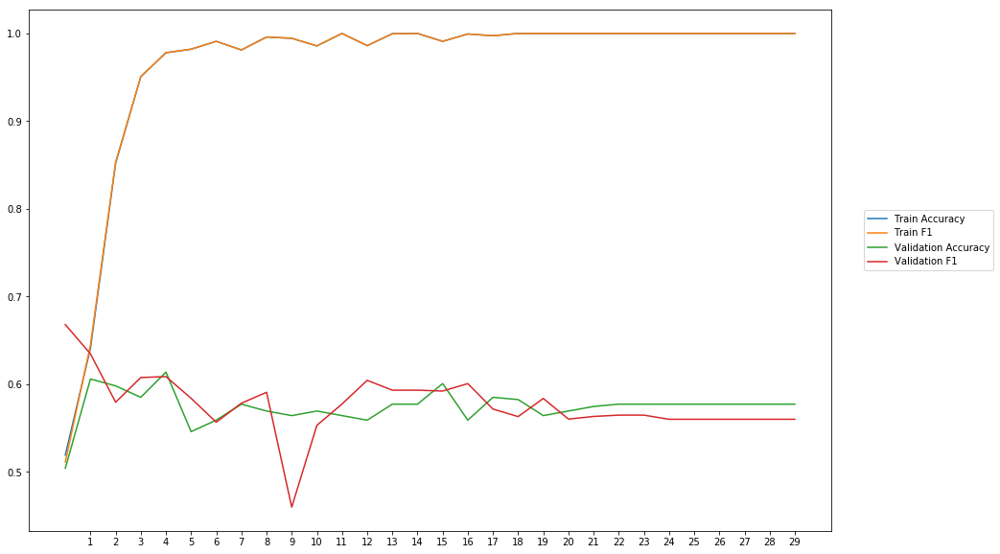

Average Accuracy: 57.39%
Average Precision: 57.72%
Average Recall: 58.65%
Average F1: 57.69%

-----Fold 5--------


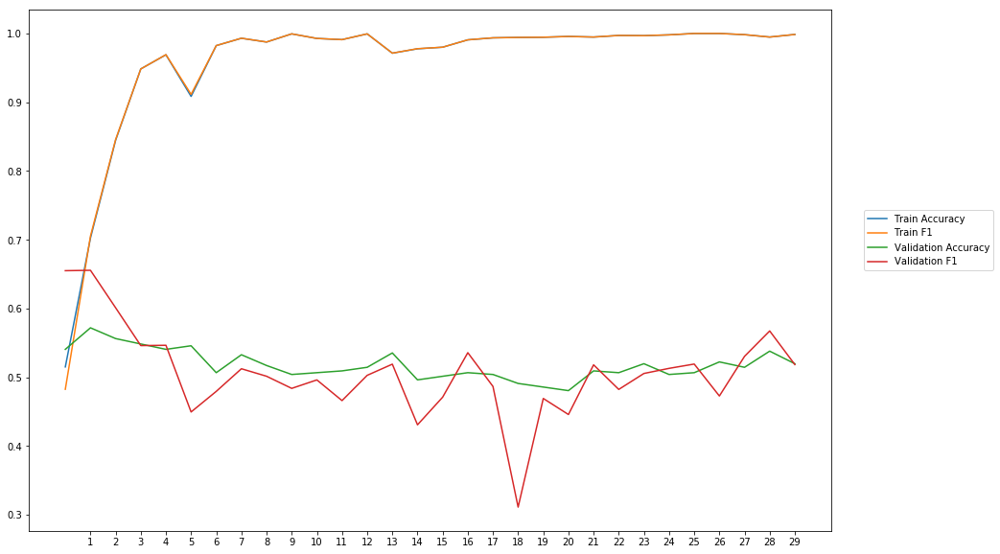

Average Accuracy: 51.78%
Average Precision: 51.82%
Average Recall: 50.61%
Average F1: 50.63%

-----Fold 6--------


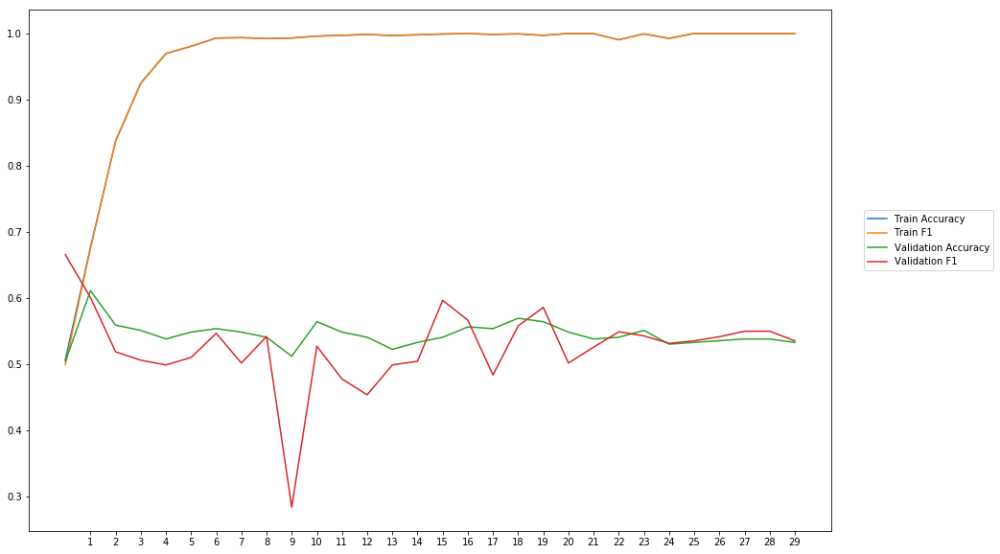

Average Accuracy: 54.46%
Average Precision: 55.12%
Average Recall: 51.77%
Average F1: 52.61%

-----Fold 7--------


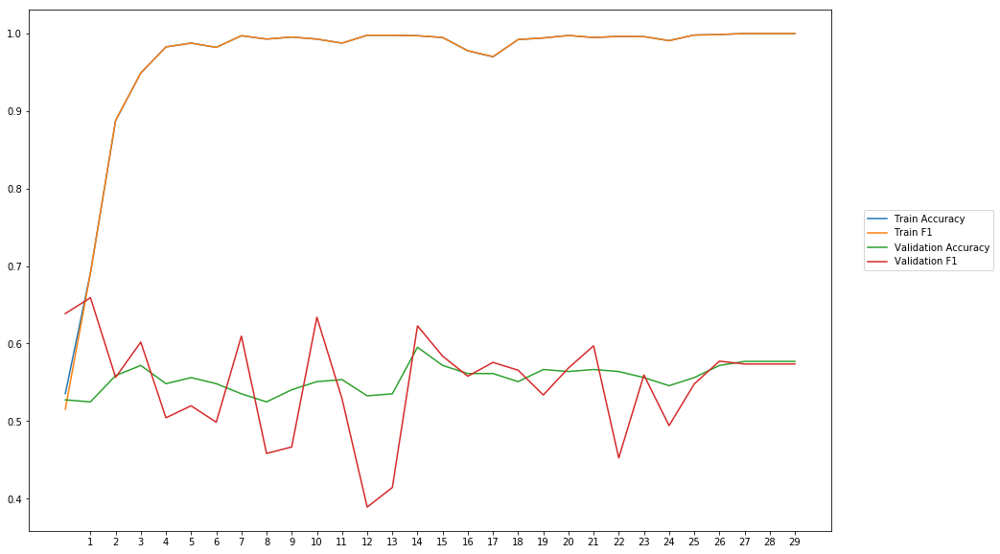

Average Accuracy: 55.57%
Average Precision: 56.05%
Average Recall: 55.50%
Average F1: 54.79%

-----Fold 8--------


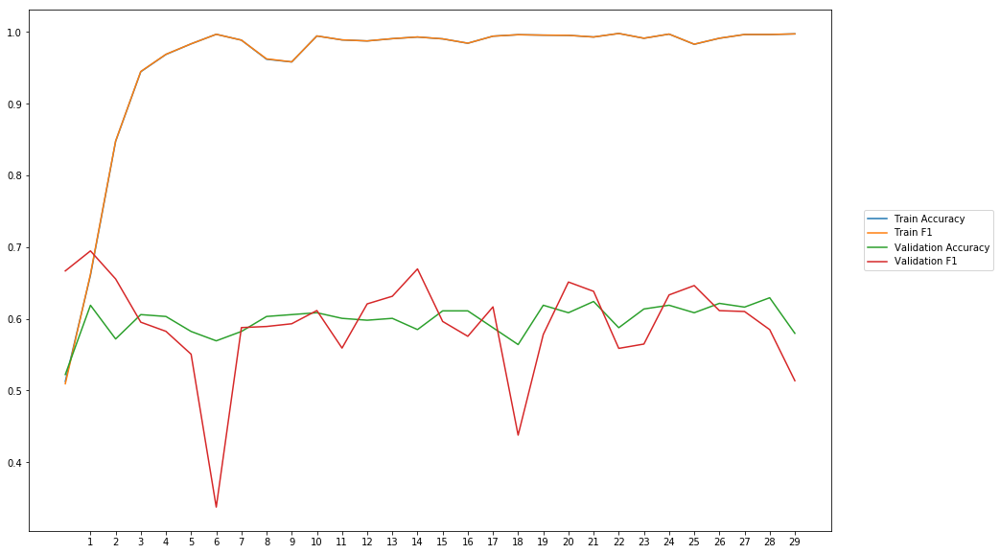

Average Accuracy: 59.85%
Average Precision: 60.91%
Average Recall: 60.26%
Average F1: 59.20%

-----Fold 9--------


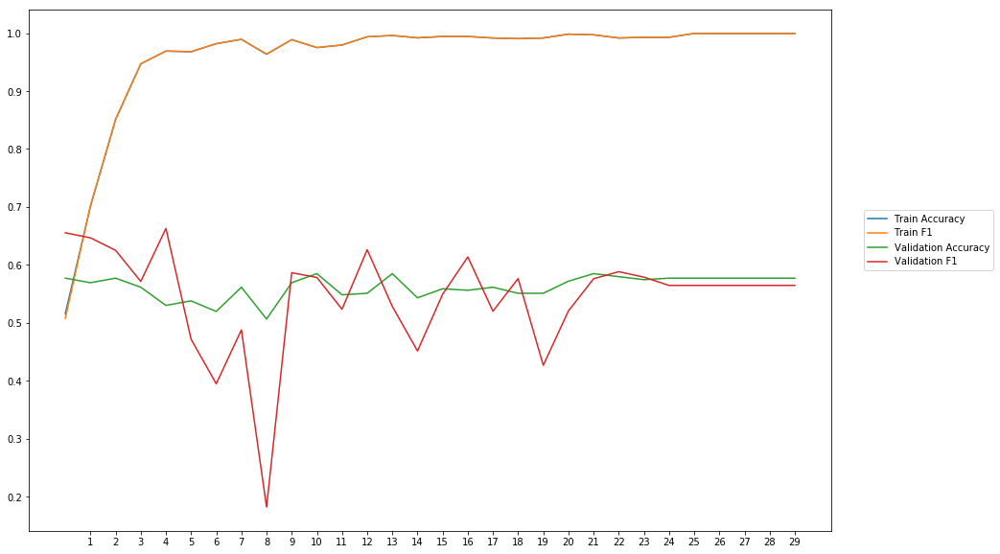

Average Accuracy: 56.24%
Average Precision: 56.81%
Average Recall: 54.84%
Average F1: 54.43%

-----Fold 10--------


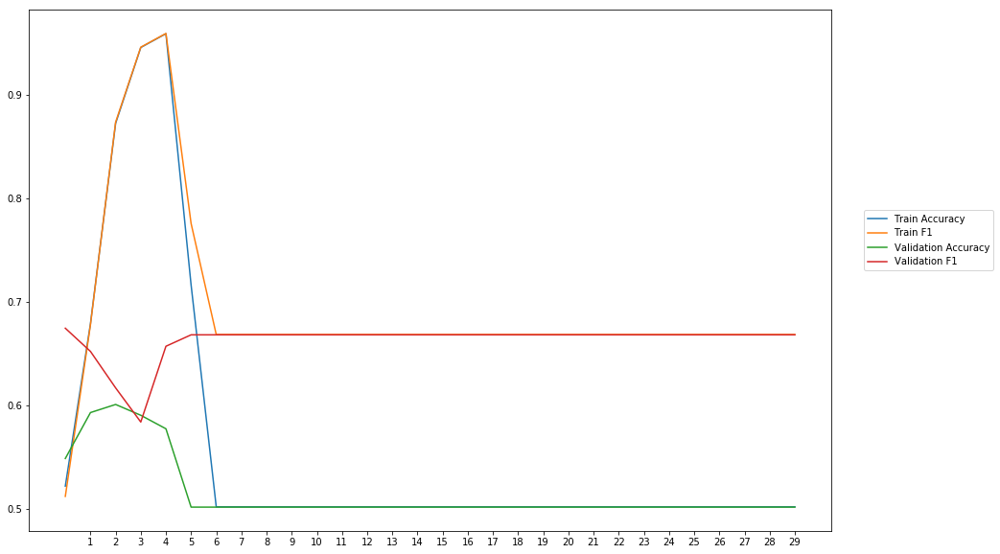

Average Accuracy: 51.47%
Average Precision: 51.24%
Average Recall: 95.71%
Average F1: 66.26%

-------Overallresults-------


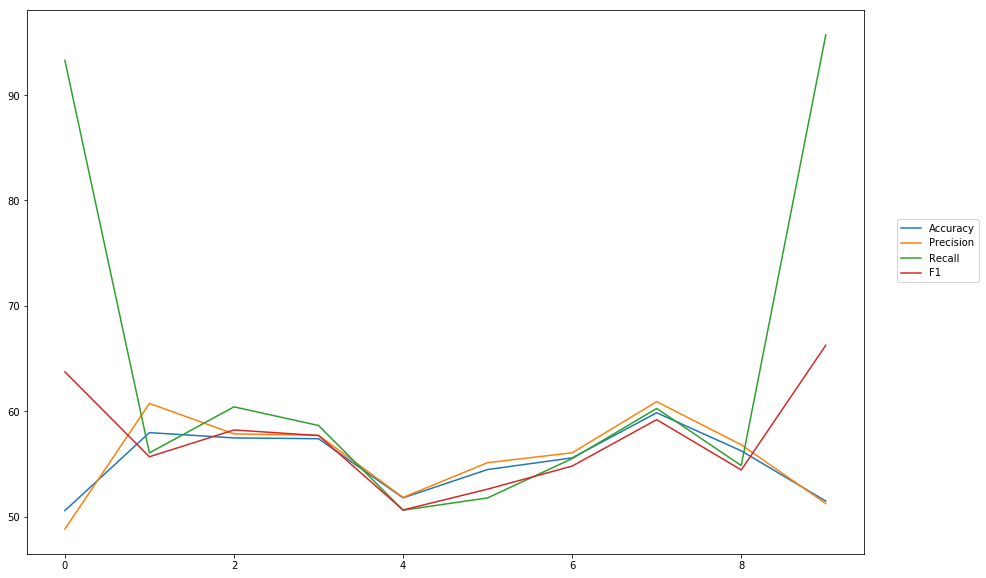

Accuracy: Mean = 55.28% (+/- 2.97%), Max = 59.85%, Min =  50.56%
Precision: Mean = 55.71% (+/- 3.81%), Max = 60.91%, Min =  48.81%
Recall: Mean = 63.71% (+/- 15.71%), Max = 95.71%, Min =  50.61%
F1: Mean = 57.32% (+/- 4.58%), Max = 66.26%, Min =  50.63%


In [27]:
cross_val(model7, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'cnn_2_400_poolingaftersecond_kernel3') 

## CNN two CNN-layer, MaxPooling after first and second, 400 filter

In [ ]:
wv_layer8 = Embedding(len(word_index)+1,
                     EMBEDDING_DIM,
                     weights=[embedding_matrix],
                     input_length=MAX_SEQUENCE_LENGTH,
                     trainable=True)

#Input Layer
comment_input8= Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences8 = wv_layer8(comment_input8)

#CNN-Layer
x8 = Conv1D(400, kernel_size =3, activation='relu')(embedded_sequences8)

#MaxPooling-Layer
x8 = MaxPooling1D(pool_size=2)(x8)
                             
#CNN-Layer
x8 = Conv1D(400, kernel_size =3, activation='relu') (x8)

#MaxPooling-Layer
x8 = MaxPooling1D(pool_size=2)(x8)

x8 = Flatten() (x8)

#Output (Dense) Layer
preds8 = Dense(2, activation='softmax')(x8)

# build the model
model8 = Model(inputs=[comment_input8], outputs=preds8)


-----Fold 1--------


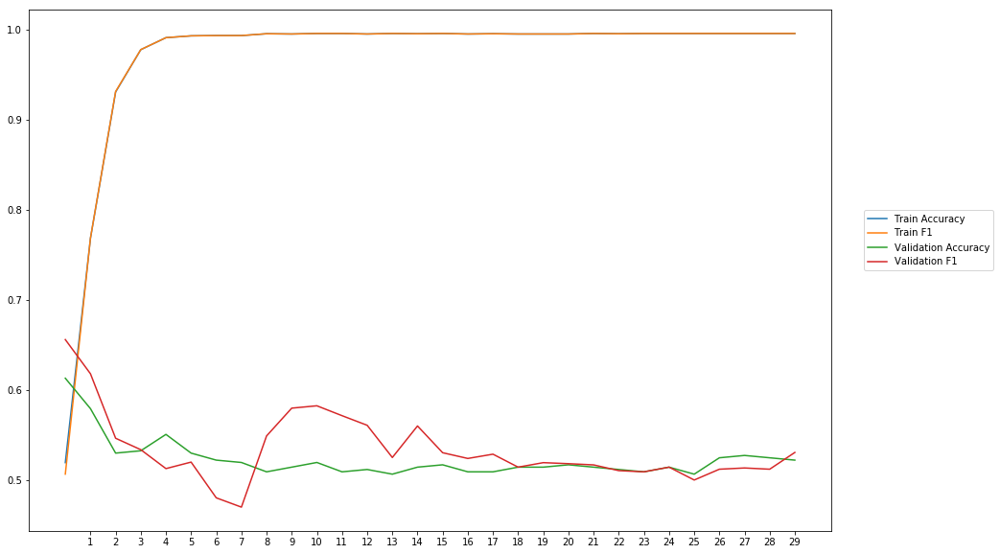

Average Accuracy: 52.32%
Average Precision: 52.34%
Average Recall: 54.94%
Average F1: 53.39%

-----Fold 2--------


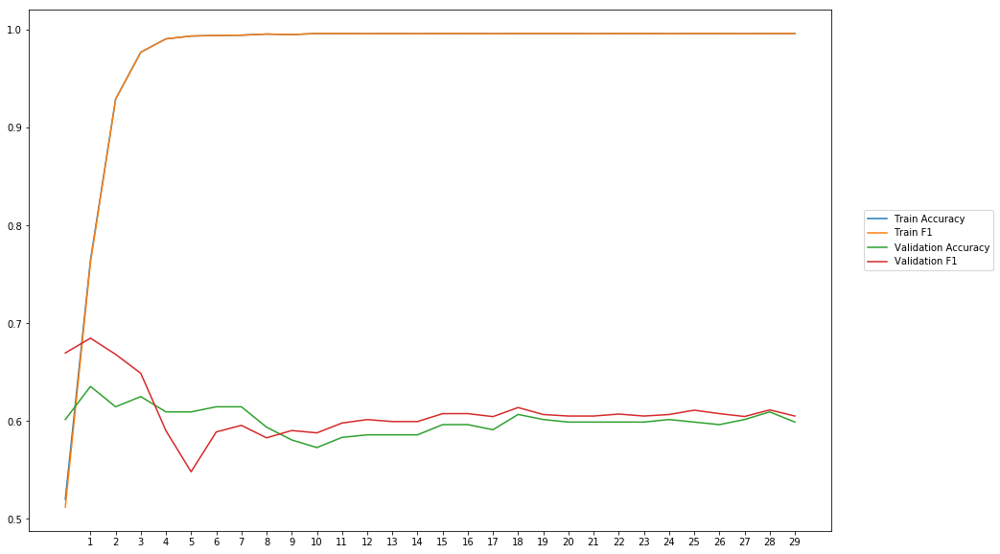

Average Accuracy: 60.03%
Average Precision: 59.98%
Average Recall: 62.26%
Average F1: 60.88%

-----Fold 3--------


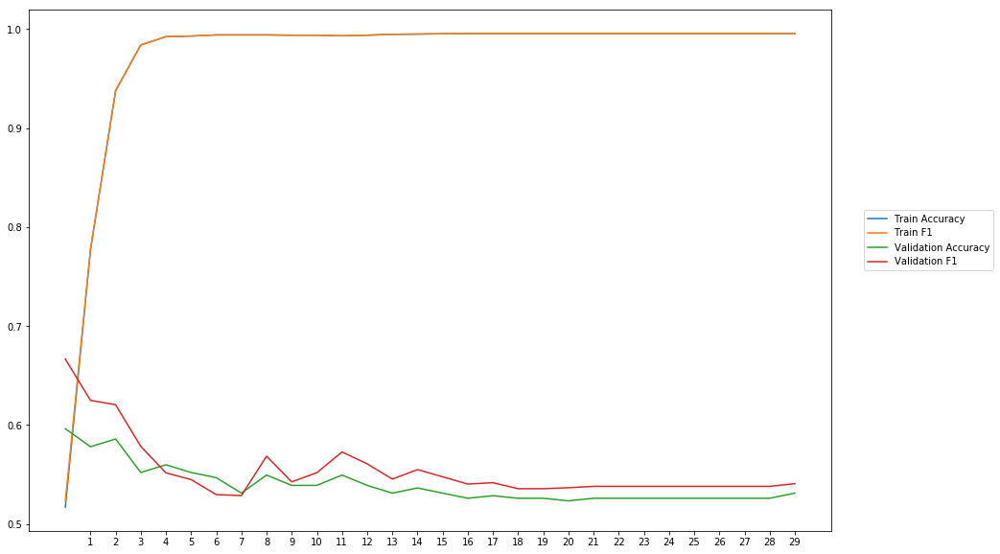

Average Accuracy: 53.96%
Average Precision: 53.90%
Average Recall: 57.22%
Average F1: 55.42%

-----Fold 4--------


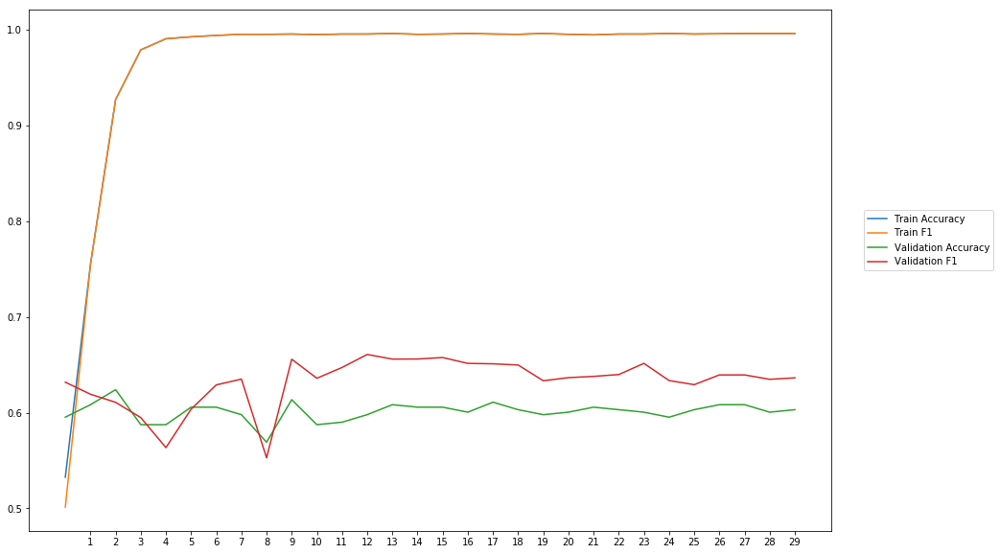

Average Accuracy: 60.10%
Average Precision: 58.79%
Average Recall: 68.85%
Average F1: 63.25%

-----Fold 5--------


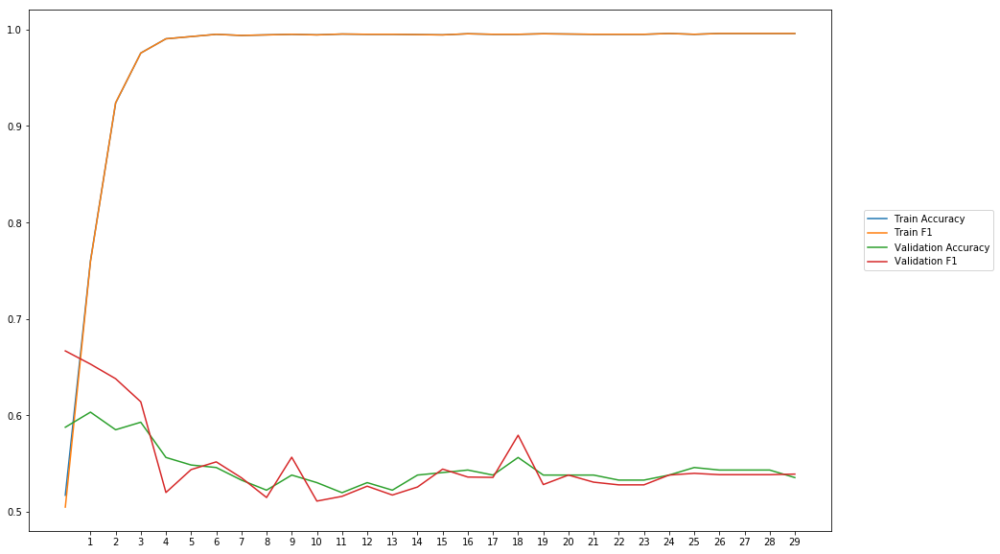

Average Accuracy: 54.52%
Average Precision: 54.45%
Average Recall: 55.69%
Average F1: 54.88%

-----Fold 6--------


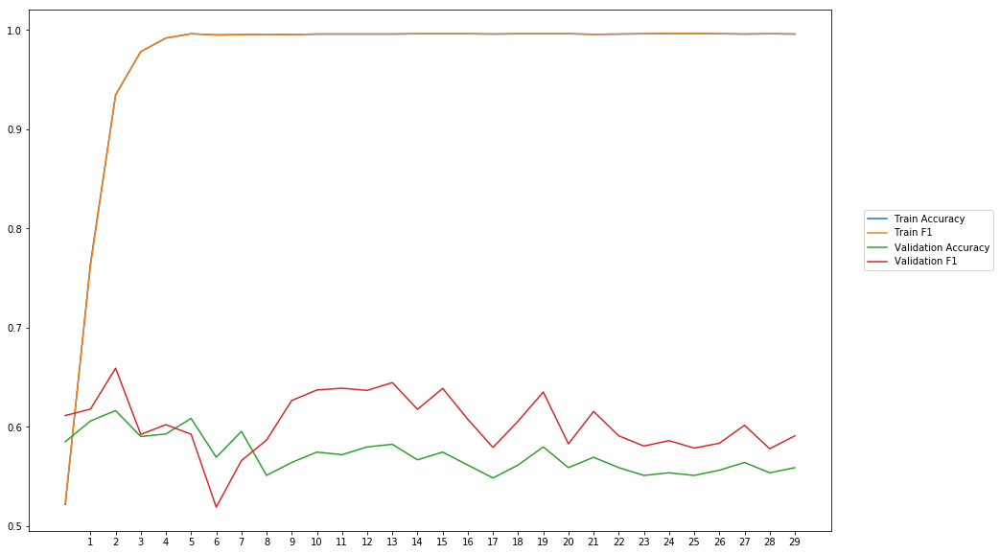

Average Accuracy: 57.17%
Average Precision: 56.42%
Average Recall: 65.38%
Average F1: 60.33%

-----Fold 7--------


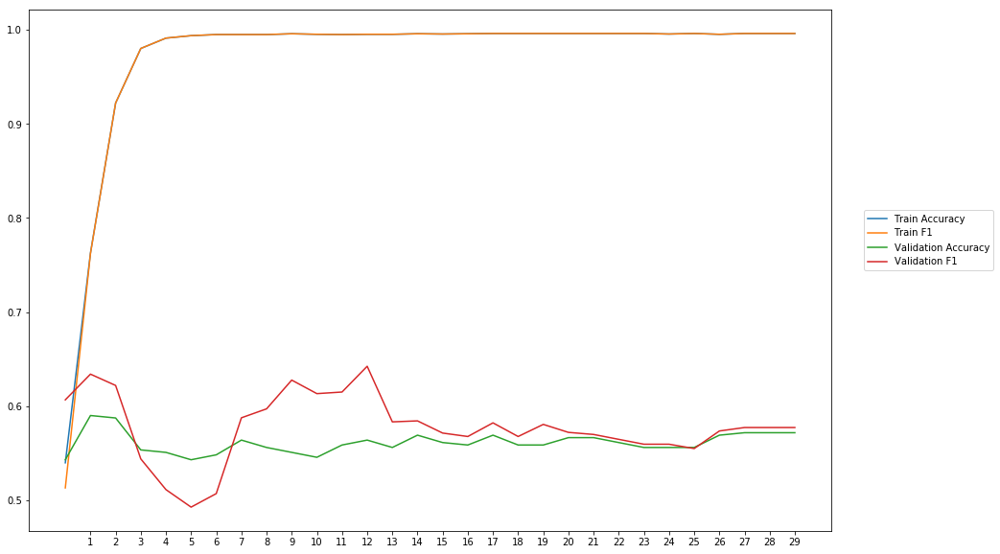

Average Accuracy: 56.12%
Average Precision: 55.84%
Average Recall: 60.42%
Average F1: 57.75%

-----Fold 8--------


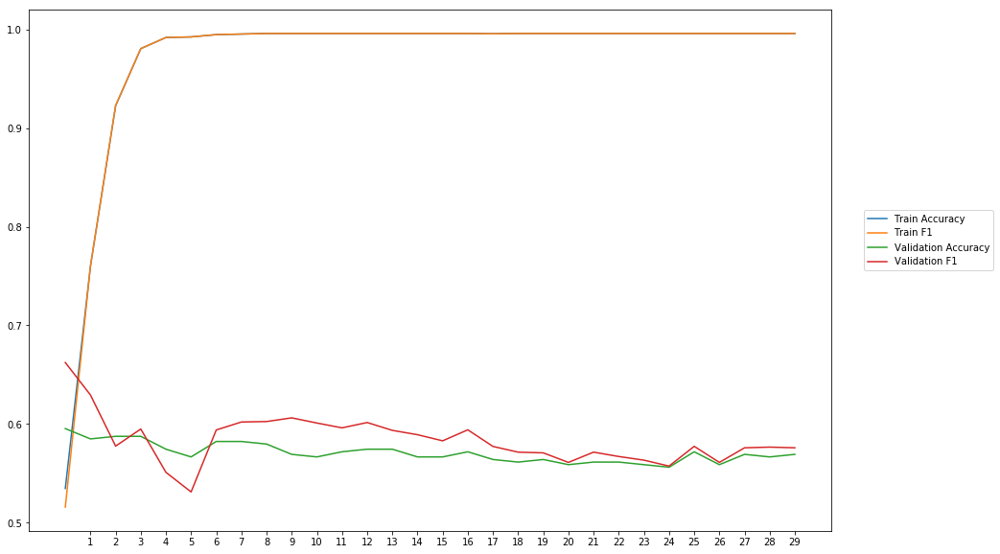

Average Accuracy: 57.08%
Average Precision: 56.79%
Average Recall: 60.33%
Average F1: 58.38%

-----Fold 9--------


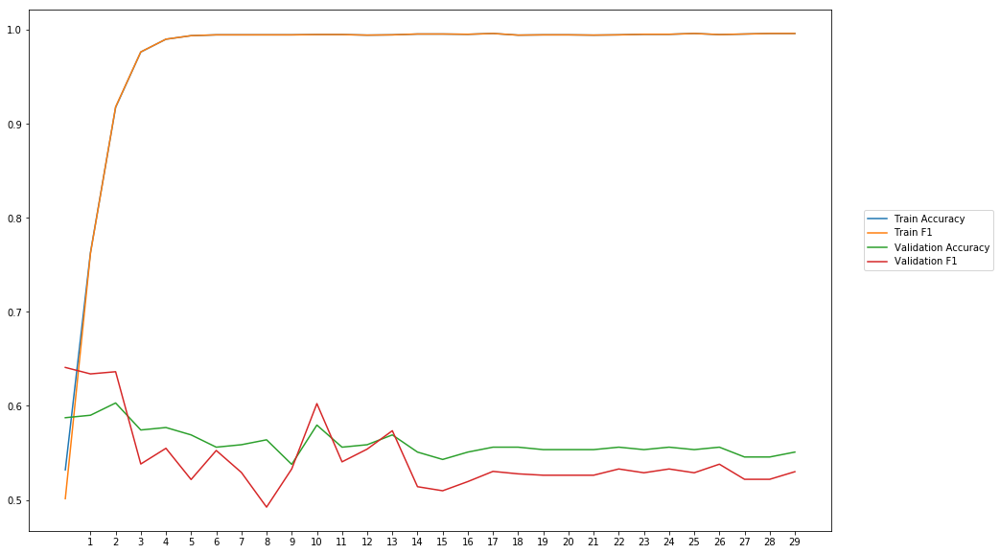

Average Accuracy: 56.06%
Average Precision: 56.62%
Average Recall: 52.76%
Average F1: 54.40%

-----Fold 10--------


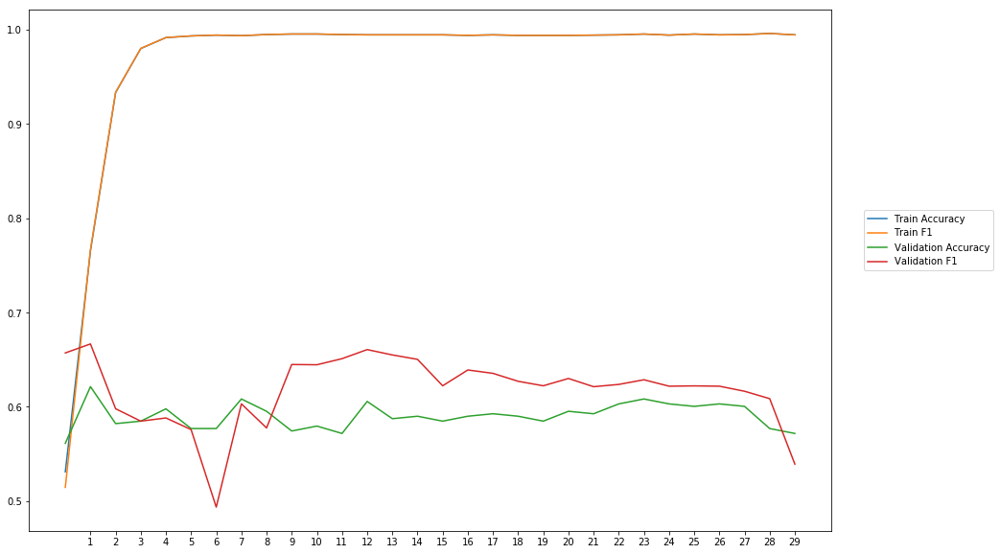

Average Accuracy: 59.04%
Average Precision: 58.17%
Average Recall: 66.82%
Average F1: 61.78%

-------Overallresults-------


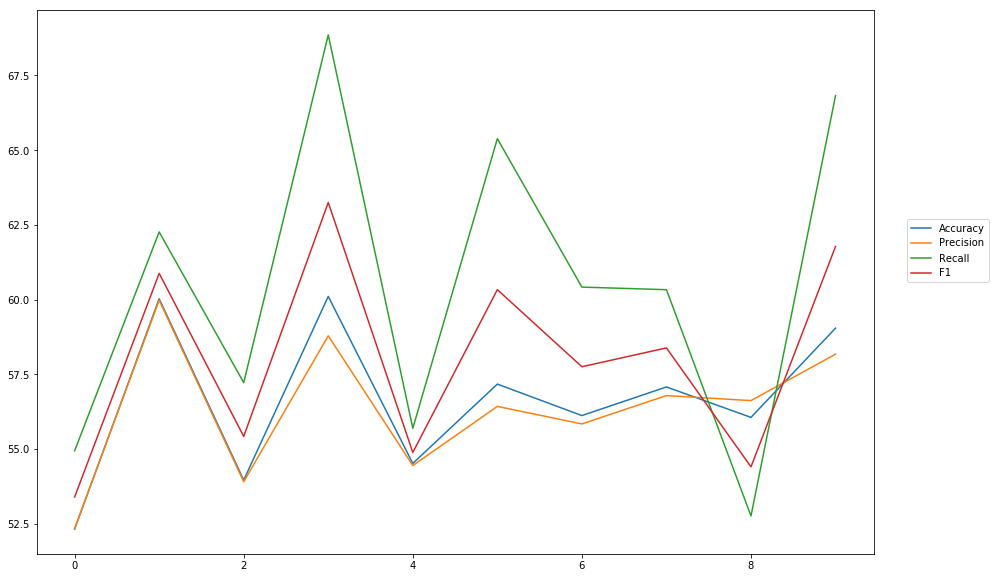

Accuracy: Mean = 56.64% (+/- 2.46%), Max = 60.10%, Min =  52.32%
Precision: Mean = 56.33% (+/- 2.21%), Max = 59.98%, Min =  52.34%
Recall: Mean = 60.47% (+/- 5.11%), Max = 68.85%, Min =  52.76%
F1: Mean = 58.05% (+/- 3.26%), Max = 63.25%, Min =  53.39%


In [30]:
cross_val(model8, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'cnn_2_400_poolingaftersecond_kernel3') 

## CNN two CNN-Layer, MaxPooling after first, first 400 filter, second 300 filter

In [ ]:
wv_layer9 = Embedding(len(word_index)+1,
                     EMBEDDING_DIM,
                     weights=[embedding_matrix],
                     input_length=MAX_SEQUENCE_LENGTH,
                     trainable=True)

#Input Layer
comment_input9= Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences9 = wv_layer9(comment_input9)

#CNN-Layer
x9 = Conv1D(400, kernel_size =3, activation='relu')(embedded_sequences9)

#MaxPooling-Layer
x9 = MaxPooling1D(pool_size=2)(x9)
                             
#CNN-Layer
x9 = Conv1D(300, kernel_size =3, activation='relu') (x9)

x9 = Flatten() (x9)

#Output (Dense) Layer
preds9 = Dense(2, activation='softmax')(x9)

# build the model
model9 = Model(inputs=[comment_input9], outputs=preds9)


-----Fold 1--------


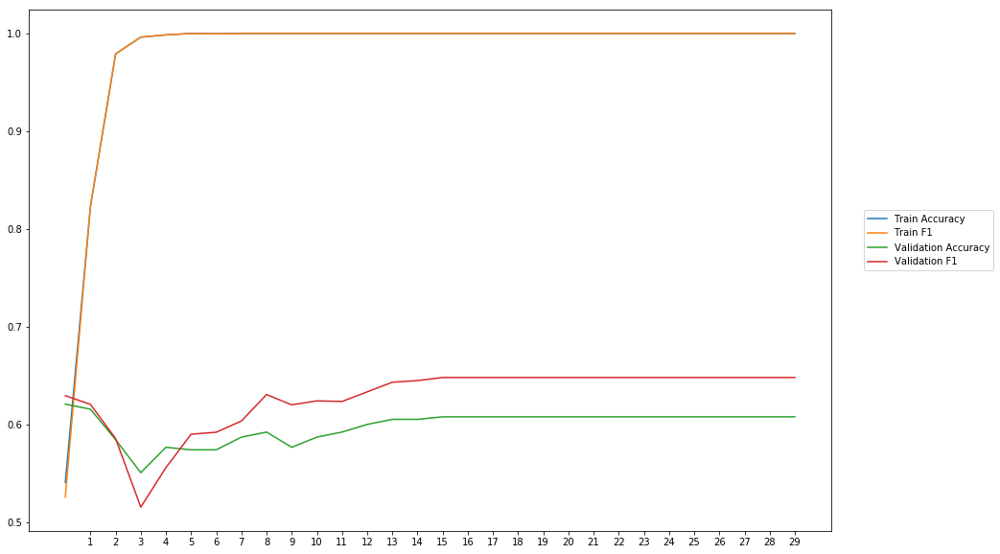

Average Accuracy: 59.86%
Average Precision: 58.59%
Average Recall: 67.91%
Average F1: 62.77%

-----Fold 2--------


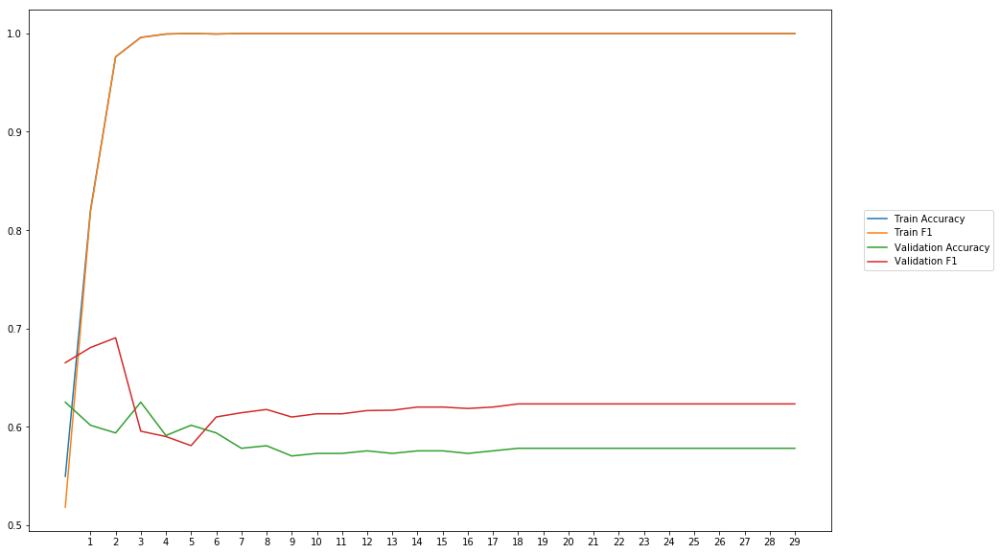

Average Accuracy: 58.31%
Average Precision: 57.24%
Average Recall: 68.70%
Average F1: 62.24%

-----Fold 3--------


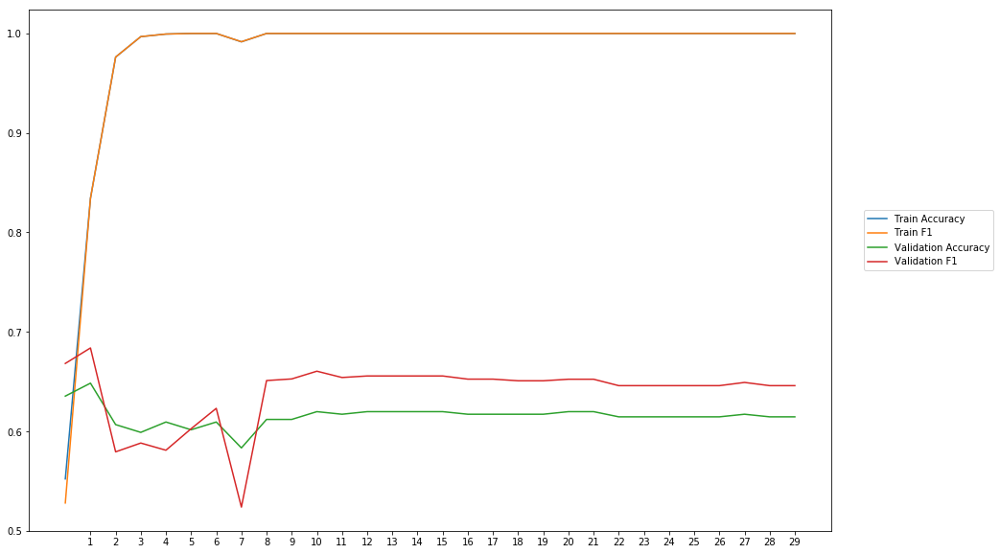

Average Accuracy: 61.54%
Average Precision: 60.44%
Average Recall: 68.29%
Average F1: 63.91%

-----Fold 4--------


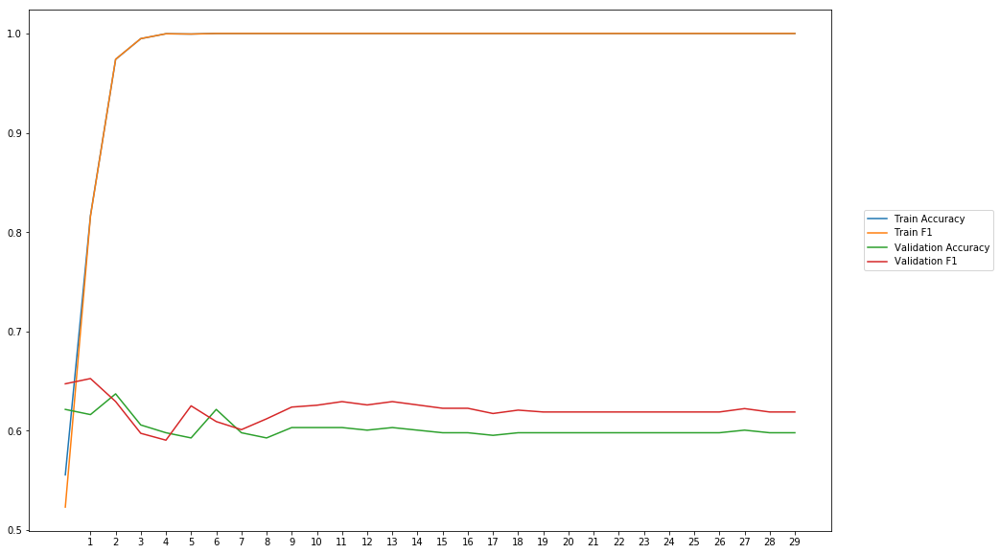

Average Accuracy: 60.22%
Average Precision: 59.50%
Average Recall: 64.97%
Average F1: 62.06%

-----Fold 5--------


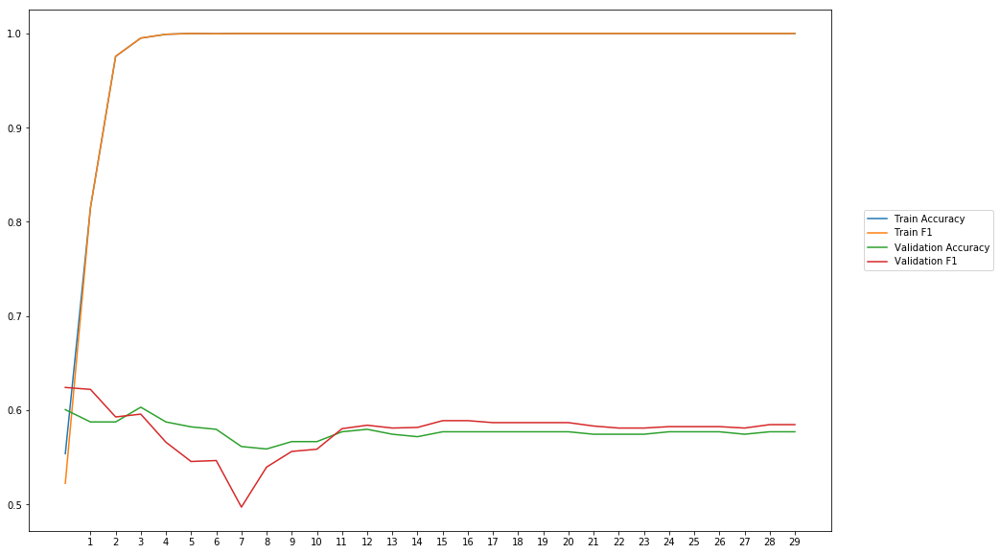

Average Accuracy: 57.76%
Average Precision: 57.90%
Average Recall: 57.90%
Average F1: 57.79%

-----Fold 6--------


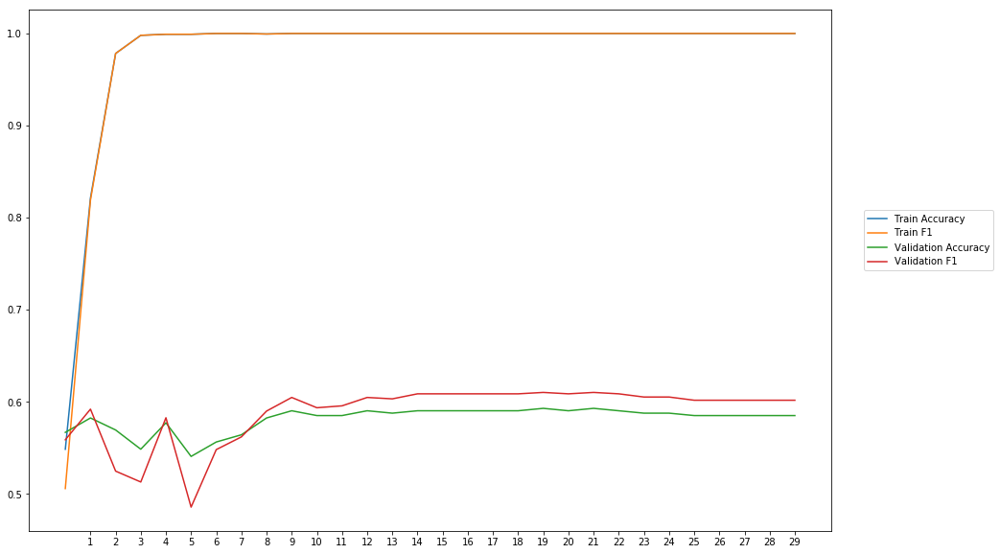

Average Accuracy: 58.13%
Average Precision: 57.91%
Average Recall: 60.02%
Average F1: 58.84%

-----Fold 7--------


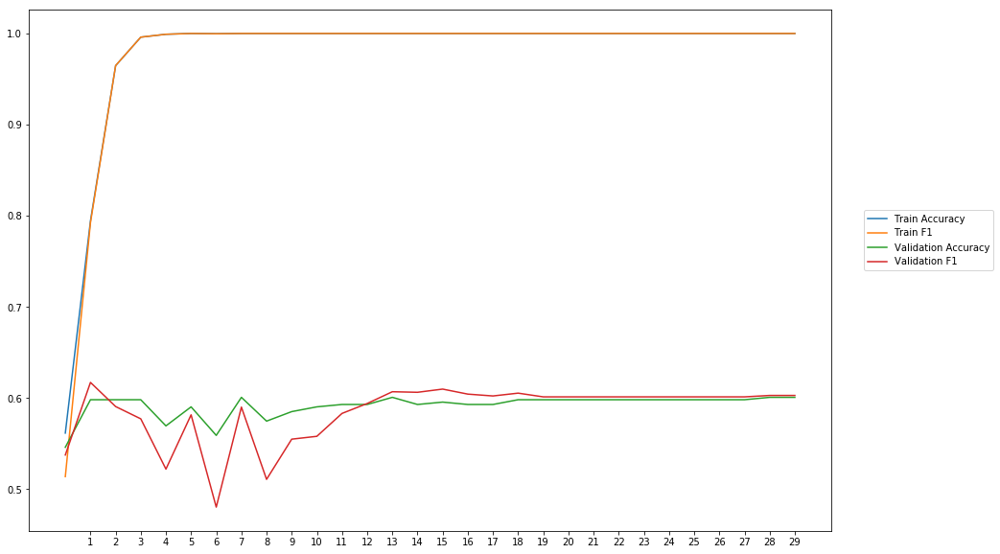

Average Accuracy: 59.16%
Average Precision: 59.57%
Average Recall: 57.71%
Average F1: 58.47%

-----Fold 8--------


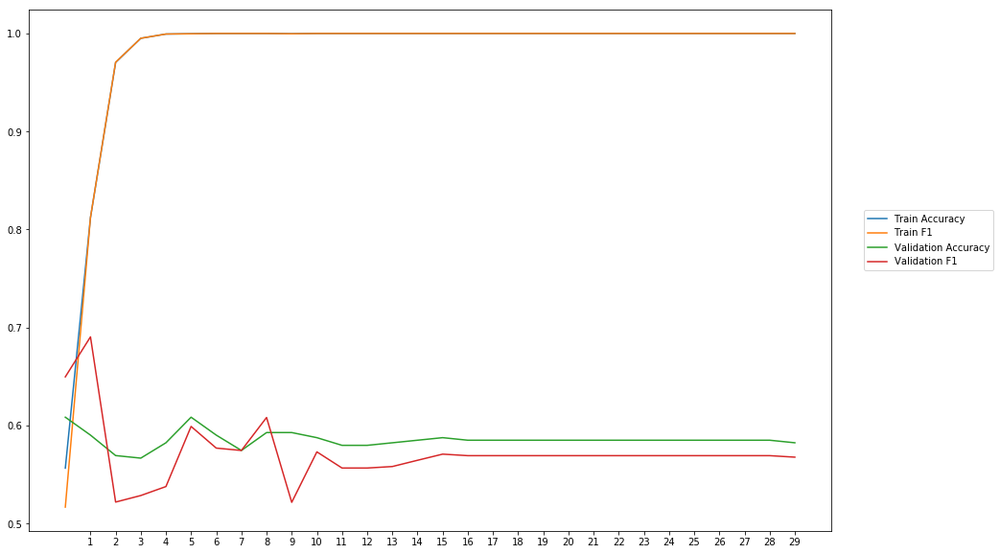

Average Accuracy: 58.54%
Average Precision: 59.31%
Average Recall: 55.76%
Average F1: 57.17%

-----Fold 9--------


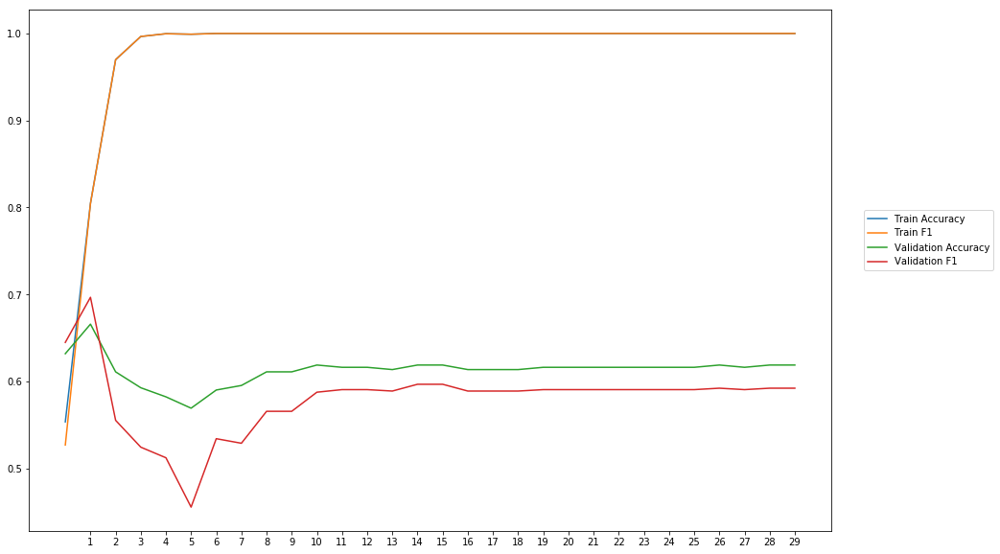

Average Accuracy: 61.30%
Average Precision: 63.42%
Average Recall: 53.82%
Average F1: 58.00%

-----Fold 10--------


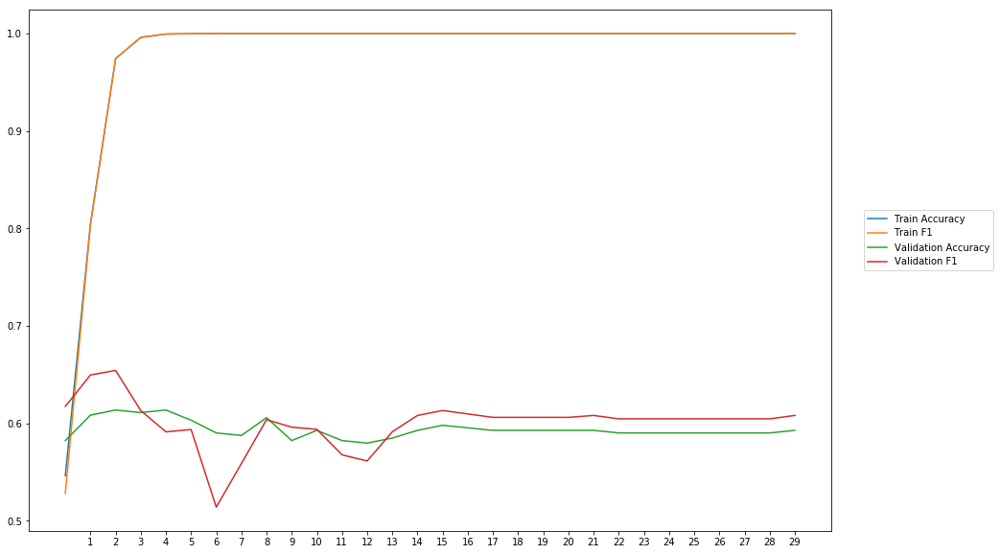

Average Accuracy: 59.36%
Average Precision: 59.26%
Average Recall: 61.16%
Average F1: 60.03%

-------Overallresults-------


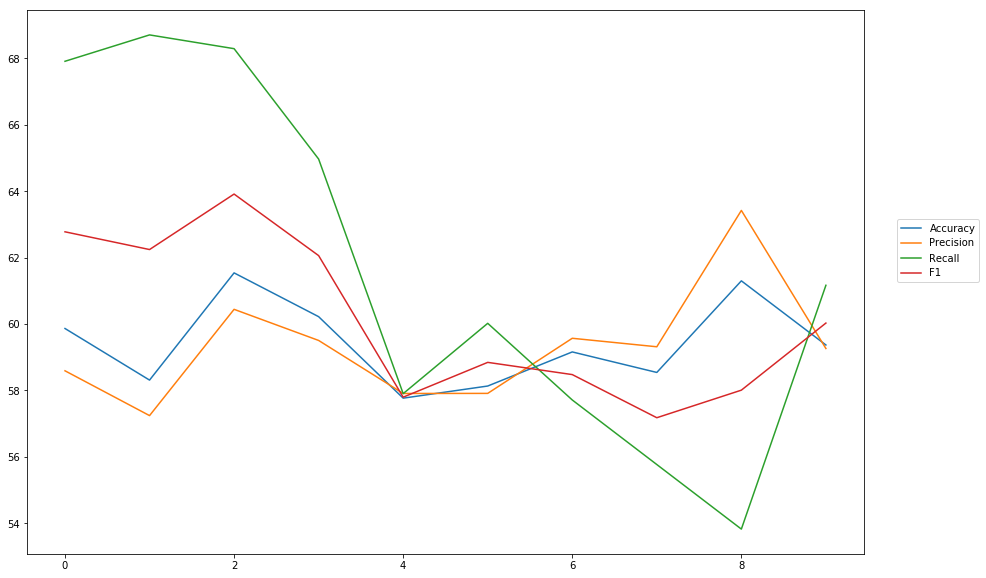

Accuracy: Mean = 59.42% (+/- 1.24%), Max = 61.54%, Min =  57.76%
Precision: Mean = 59.31% (+/- 1.64%), Max = 63.42%, Min =  57.24%
Recall: Mean = 61.62% (+/- 5.22%), Max = 68.70%, Min =  53.82%
F1: Mean = 60.13% (+/- 2.29%), Max = 63.91%, Min =  57.17%


In [31]:
cross_val(model9, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'cnn_2_400_300_poolingafterfirst_kernel3') 

## CNN two CNN-layer, MaxPooling after second, first 400 filter, sceond 300 filter

In [ ]:
wv_layer10 = Embedding(len(word_index)+1,
                     EMBEDDING_DIM,
                     weights=[embedding_matrix],
                     input_length=MAX_SEQUENCE_LENGTH,
                     trainable=True)

#Input Layer
comment_input10= Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences10 = wv_layer10(comment_input10)

#CNN-Layer
x10 = Conv1D(400, kernel_size =3, activation='relu')(embedded_sequences10)
                         
#CNN-Layer
x10 = Conv1D(300, kernel_size =3, activation='relu') (x10)

#MaxPooling-Layer
x10 = MaxPooling1D(pool_size=2)(x10)

x10 = Flatten() (x10)

#Output (Dense) Layer
preds10 = Dense(2, activation='softmax')(x10)

# build the model
model10 = Model(inputs=[comment_input10], outputs=preds10)


-----Fold 1--------


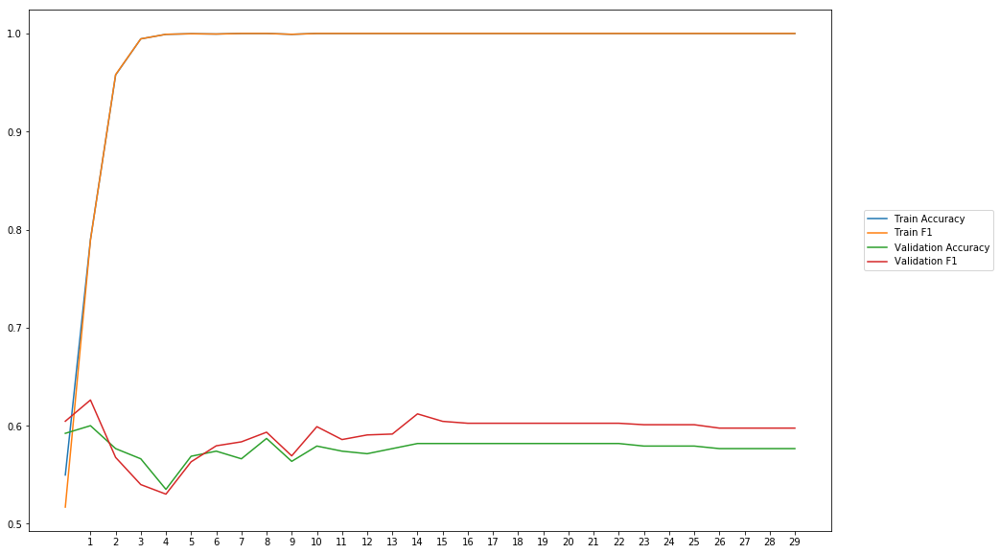

Average Accuracy: 57.71%
Average Precision: 57.30%
Average Recall: 61.26%
Average F1: 59.17%

-----Fold 2--------


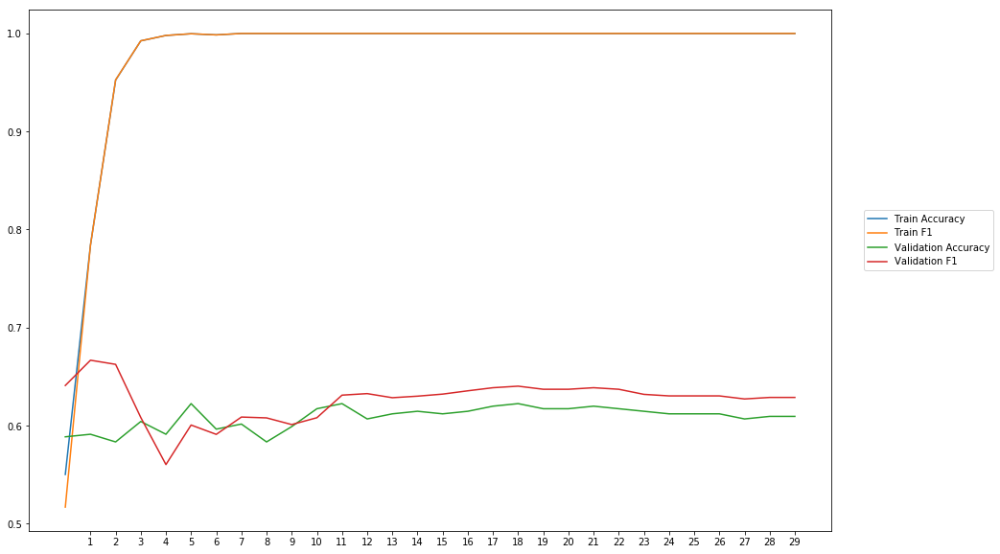

Average Accuracy: 60.83%
Average Precision: 60.28%
Average Recall: 65.51%
Average F1: 62.60%

-----Fold 3--------


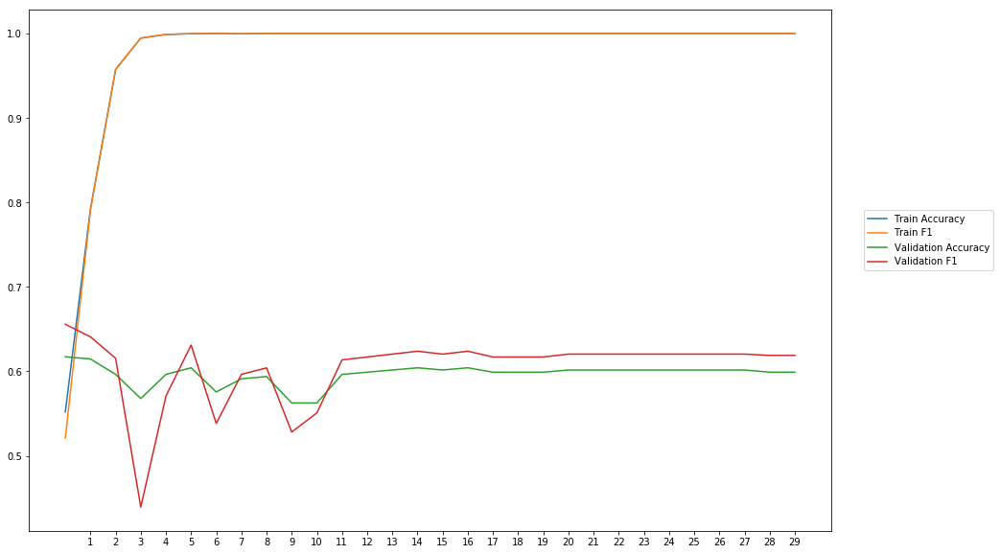

Average Accuracy: 59.65%
Average Precision: 59.50%
Average Recall: 62.04%
Average F1: 60.47%

-----Fold 4--------


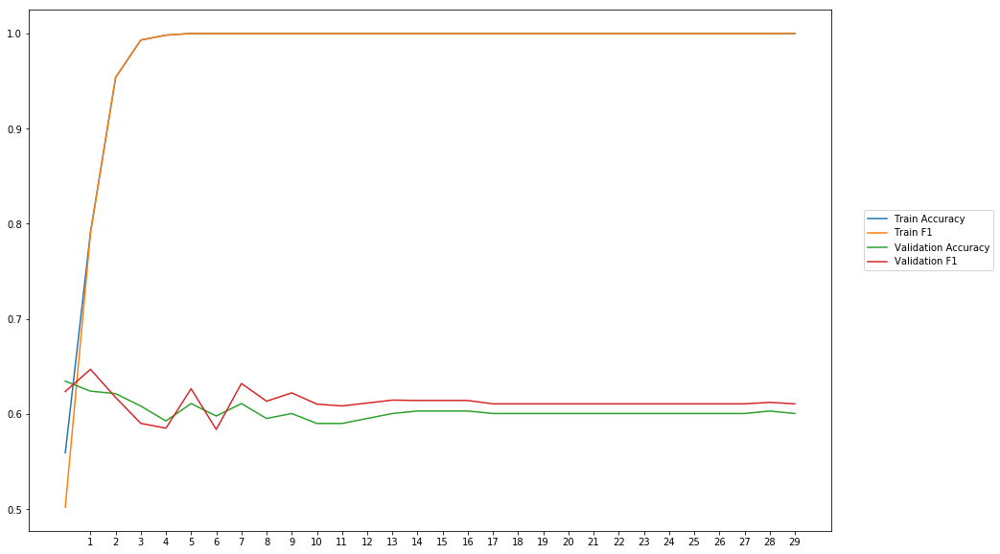

Average Accuracy: 60.30%
Average Precision: 60.01%
Average Recall: 62.59%
Average F1: 61.23%

-----Fold 5--------


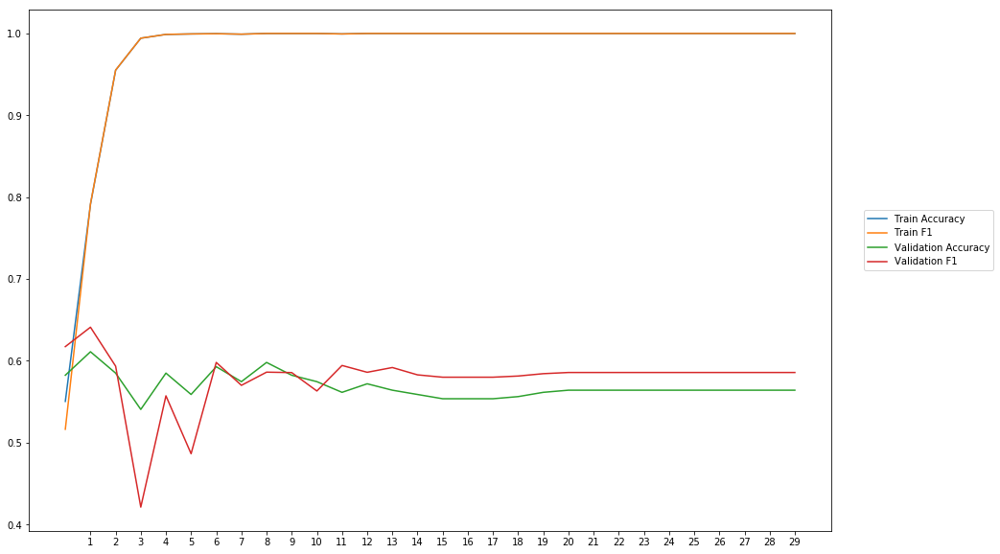

Average Accuracy: 56.86%
Average Precision: 56.74%
Average Recall: 59.39%
Average F1: 57.78%

-----Fold 6--------


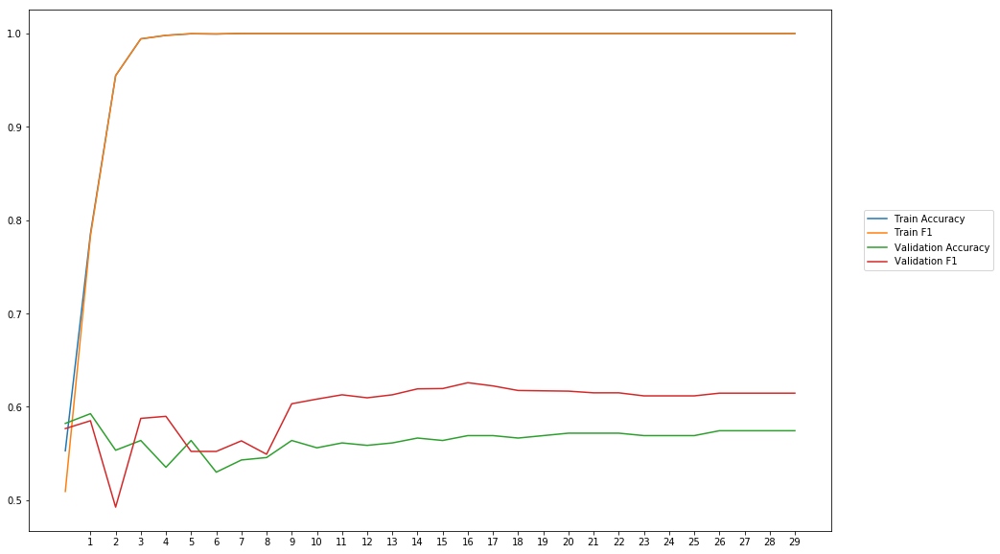

Average Accuracy: 56.46%
Average Precision: 55.68%
Average Recall: 65.19%
Average F1: 59.86%

-----Fold 7--------


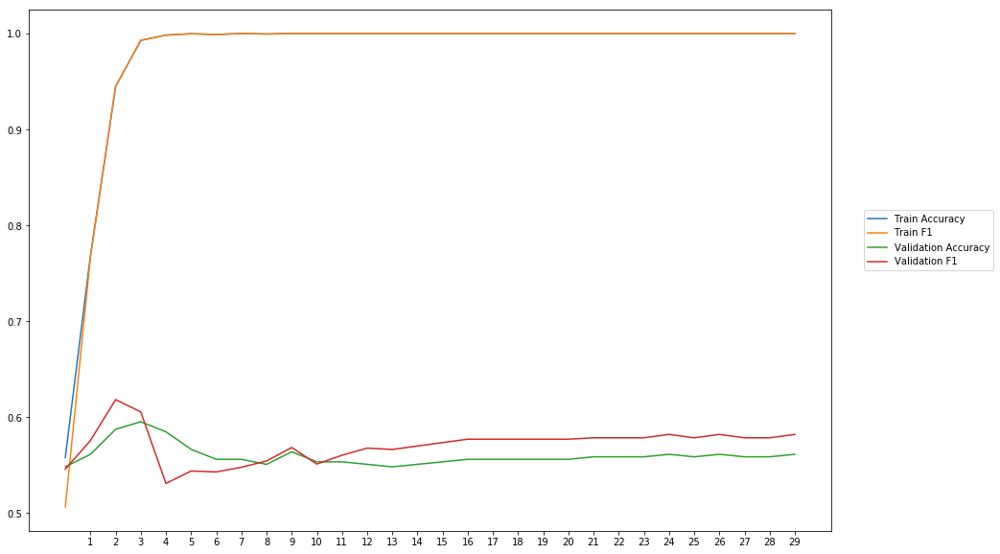

Average Accuracy: 56.00%
Average Precision: 55.89%
Average Recall: 58.52%
Average F1: 57.09%

-----Fold 8--------


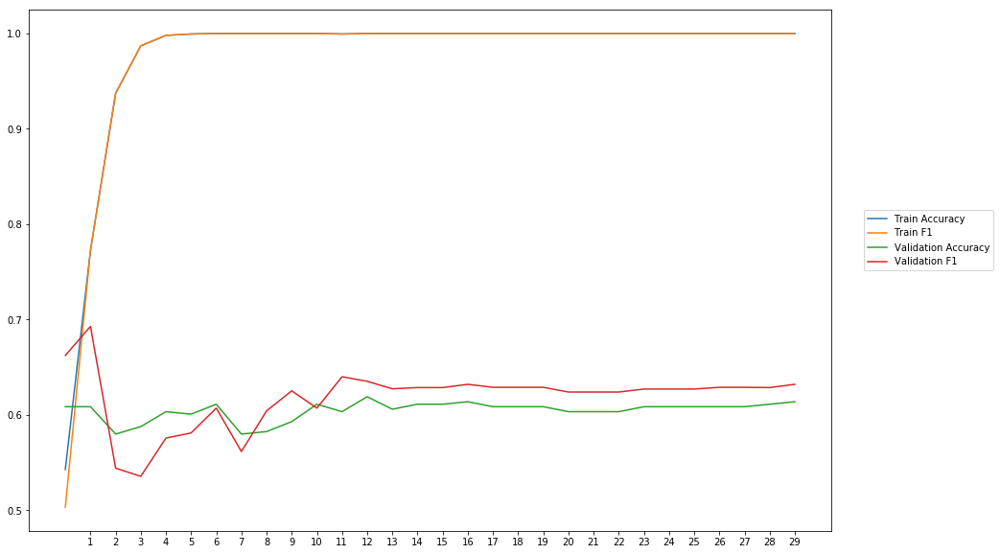

Average Accuracy: 60.43%
Average Precision: 59.88%
Average Recall: 64.39%
Average F1: 61.80%

-----Fold 9--------


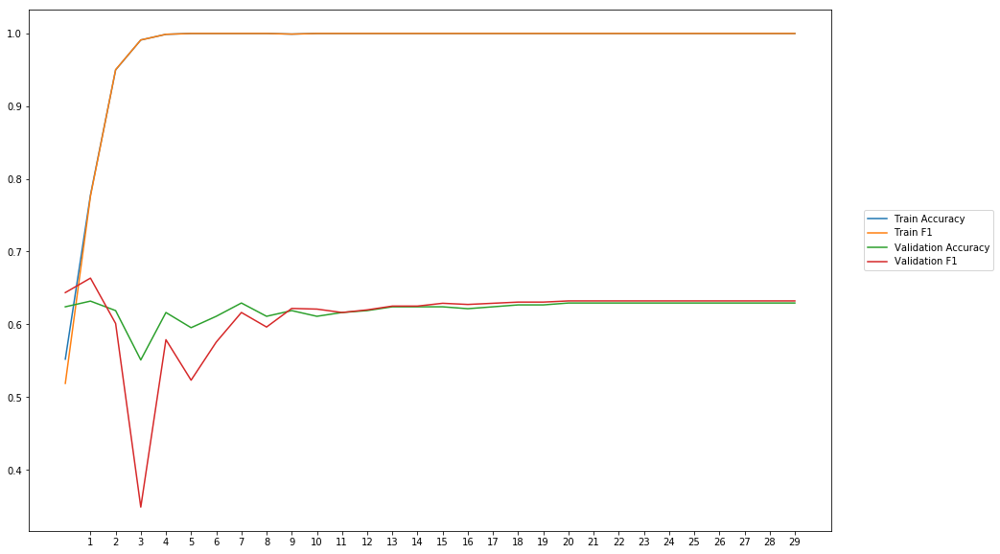

Average Accuracy: 62.05%
Average Precision: 62.64%
Average Recall: 60.50%
Average F1: 61.14%

-----Fold 10--------


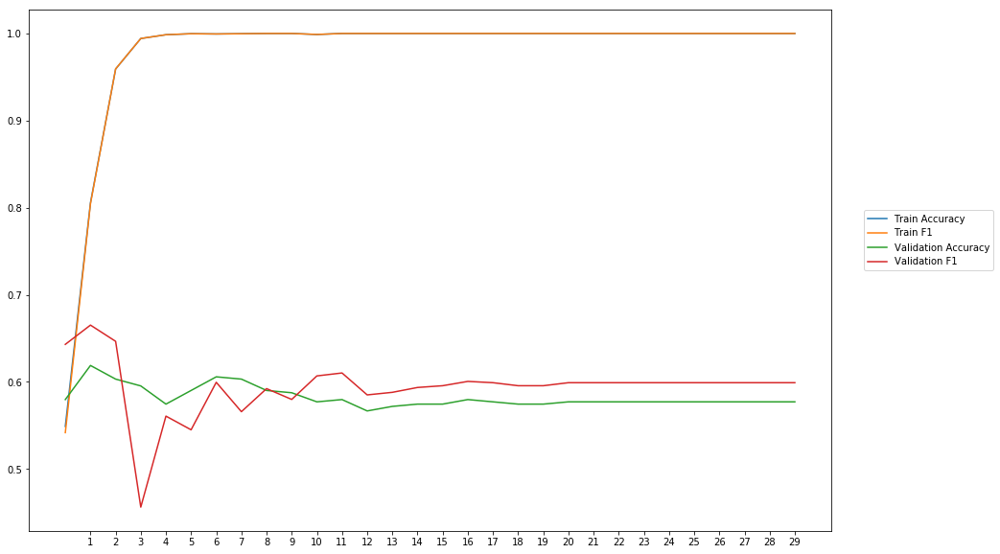

Average Accuracy: 58.22%
Average Precision: 58.16%
Average Recall: 61.51%
Average F1: 59.38%

-------Overallresults-------


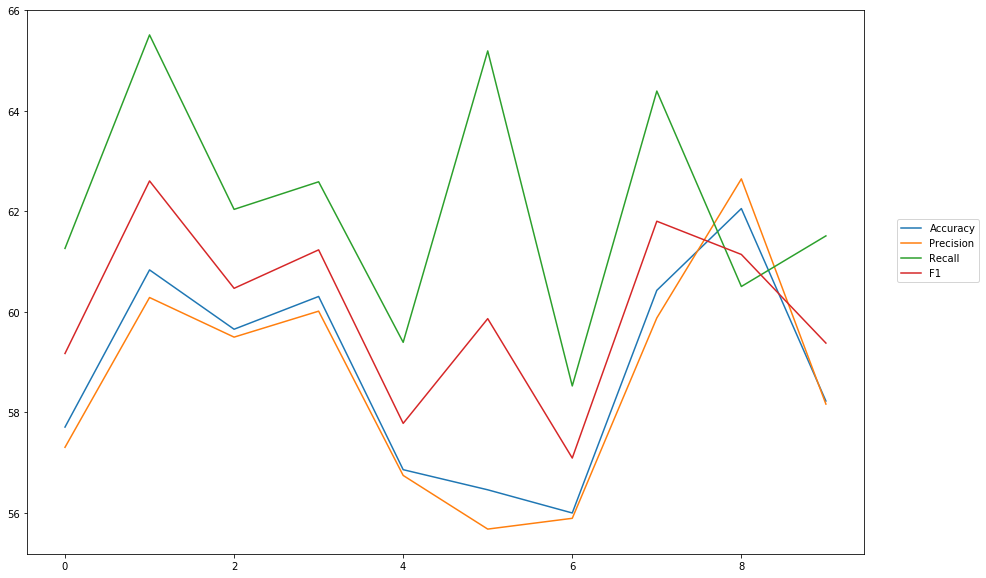

Accuracy: Mean = 58.85% (+/- 1.97%), Max = 62.05%, Min =  56.00%
Precision: Mean = 58.61% (+/- 2.12%), Max = 62.64%, Min =  55.68%
Recall: Mean = 62.09% (+/- 2.24%), Max = 65.51%, Min =  58.52%
F1: Mean = 60.05% (+/- 1.66%), Max = 62.60%, Min =  57.09%


In [32]:
cross_val(model10, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'cnn_2_400_300_poolingaftersecond_kernel3') 

## CNN two CNN-layer, MaxPooling after both, first 400 filter, sceond 300 filter 

In [ ]:
wv_layer11 = Embedding(len(word_index)+1,
                     EMBEDDING_DIM,
                     weights=[embedding_matrix],
                     input_length=MAX_SEQUENCE_LENGTH,
                     trainable=True)

#Input Layer
comment_input11= Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences11 = wv_layer11(comment_input11)

#CNN-Layer
x11 = Conv1D(400, kernel_size =3, activation='relu')(embedded_sequences11)

#MaxPooling-Layer
x11 = MaxPooling1D(pool_size=2)(x11)

#CNN-Layer
x11 = Conv1D(300, kernel_size =3, activation='relu') (x11)

#MaxPooling-Layer
x11 = MaxPooling1D(pool_size=2)(x11)

x11 = Flatten() (x11)

#Output (Dense) Layer
preds11 = Dense(2, activation='softmax')(x11)

# build the model
model11 = Model(inputs=[comment_input11], outputs=preds11)


-----Fold 1--------


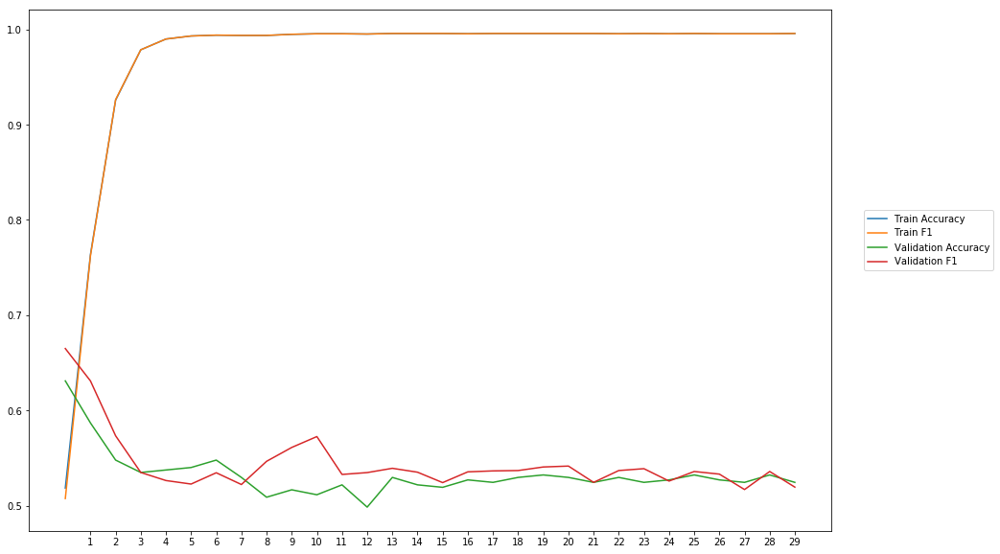

Average Accuracy: 53.26%
Average Precision: 53.22%
Average Recall: 55.84%
Average F1: 54.40%

-----Fold 2--------


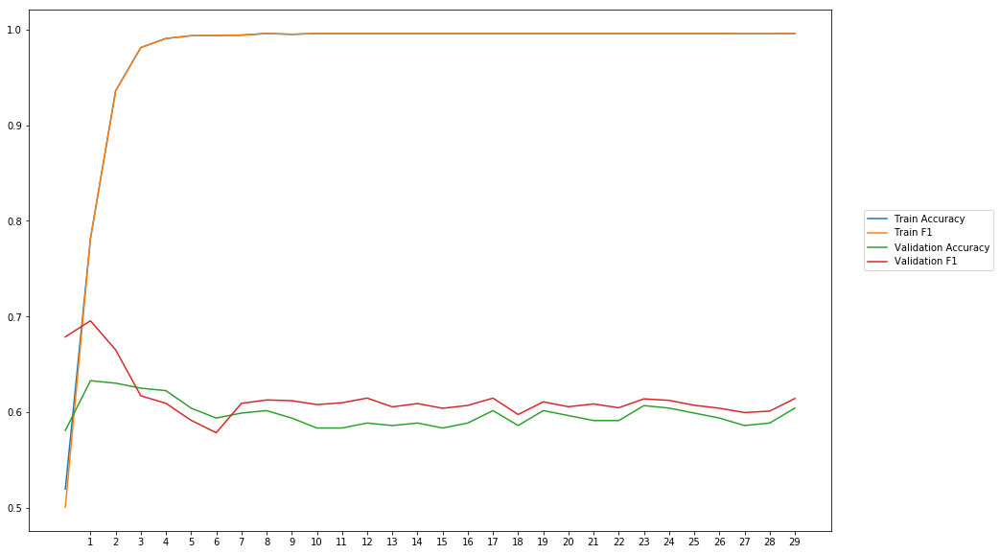

Average Accuracy: 59.78%
Average Precision: 59.38%
Average Recall: 63.97%
Average F1: 61.40%

-----Fold 3--------


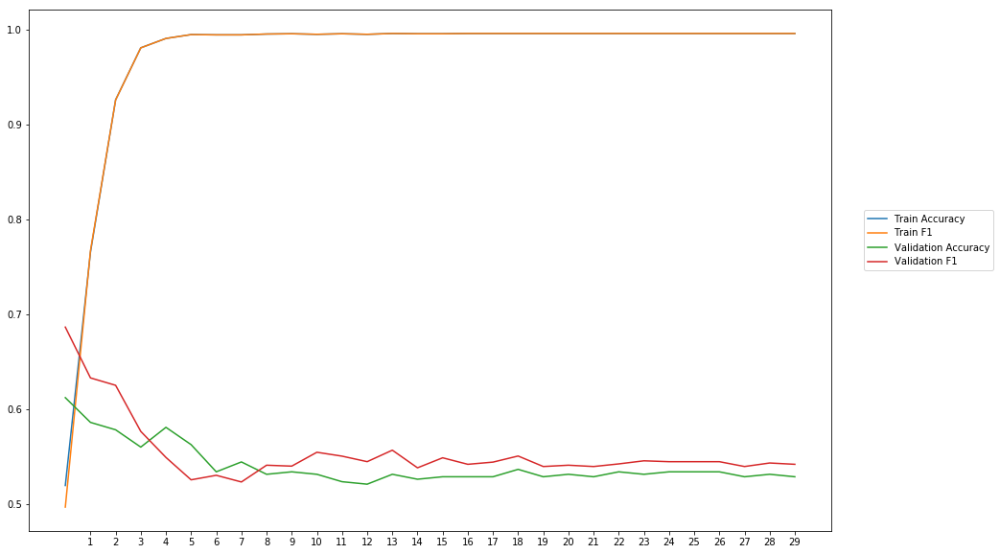

Average Accuracy: 54.07%
Average Precision: 54.07%
Average Recall: 57.15%
Average F1: 55.41%

-----Fold 4--------


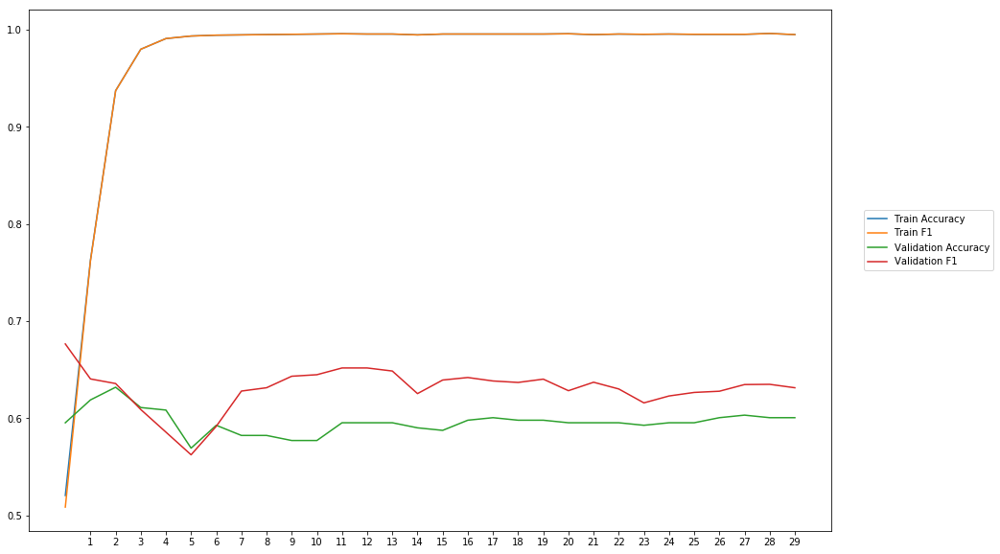

Average Accuracy: 59.59%
Average Precision: 58.31%
Average Recall: 69.05%
Average F1: 63.04%

-----Fold 5--------


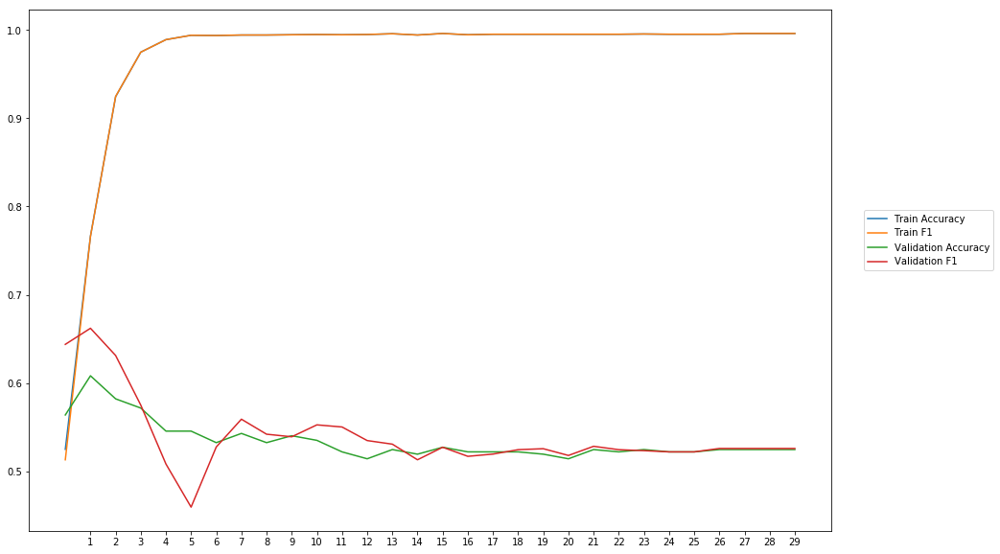

Average Accuracy: 53.42%
Average Precision: 53.40%
Average Recall: 54.98%
Average F1: 53.96%

-----Fold 6--------


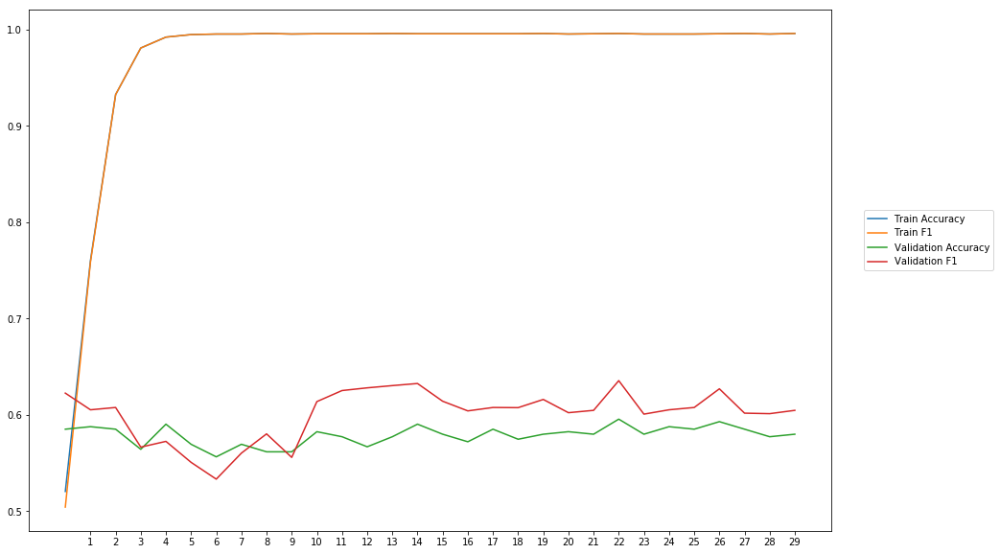

Average Accuracy: 57.85%
Average Precision: 57.20%
Average Recall: 63.52%
Average F1: 60.06%

-----Fold 7--------


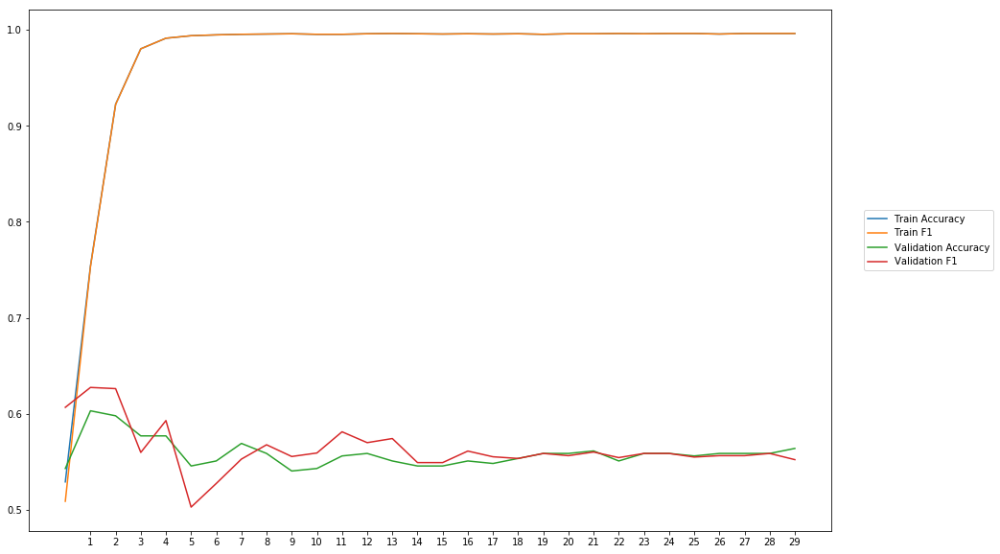

Average Accuracy: 55.87%
Average Precision: 55.89%
Average Recall: 56.98%
Average F1: 56.33%

-----Fold 8--------


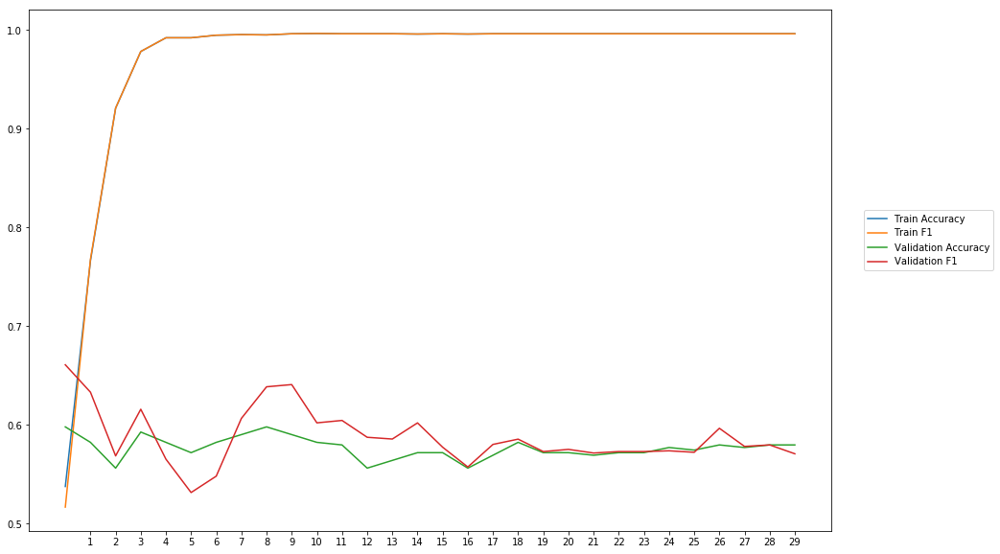

Average Accuracy: 57.67%
Average Precision: 57.43%
Average Recall: 60.52%
Average F1: 58.75%

-----Fold 9--------


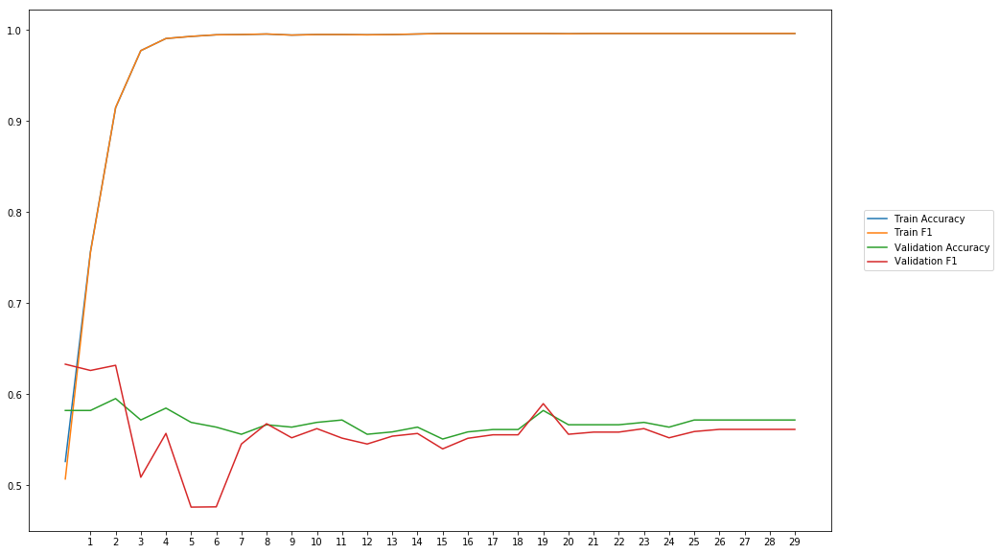

Average Accuracy: 56.88%
Average Precision: 57.42%
Average Recall: 54.70%
Average F1: 55.77%

-----Fold 10--------


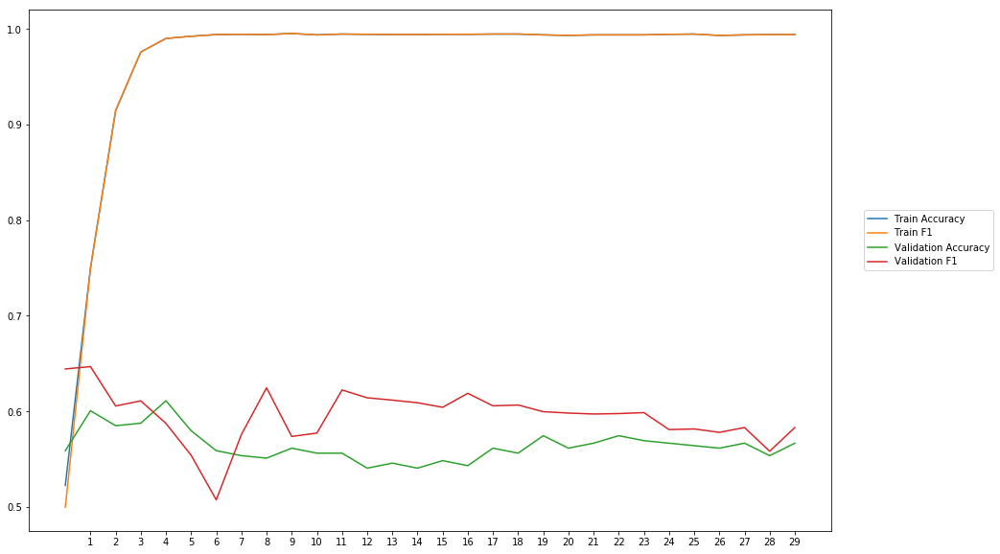

Average Accuracy: 56.40%
Average Precision: 55.84%
Average Recall: 64.37%
Average F1: 59.51%

-------Overallresults-------


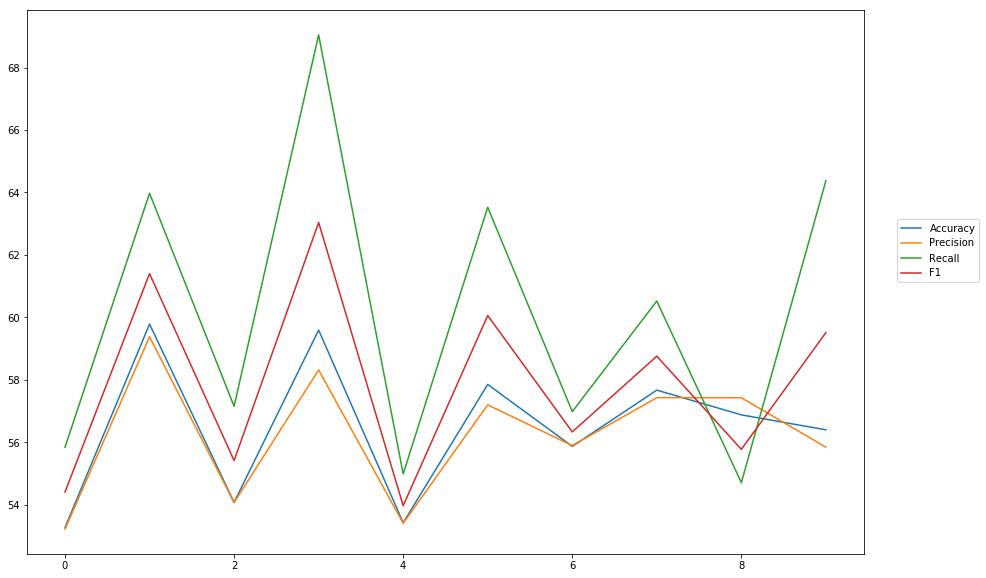

Accuracy: Mean = 56.48% (+/- 2.23%), Max = 59.78%, Min =  53.26%
Precision: Mean = 56.22% (+/- 2.00%), Max = 59.38%, Min =  53.22%
Recall: Mean = 60.11% (+/- 4.66%), Max = 69.05%, Min =  54.70%
F1: Mean = 57.86% (+/- 2.96%), Max = 63.04%, Min =  53.96%


In [33]:
cross_val(model11, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'cnn_2_400_300_poolingafterboth_kernel3') 

## CNN one CNN-layer, 500 filters

In [ ]:
wv_layer15 = Embedding(len(word_index)+1,
                     EMBEDDING_DIM,
                     weights=[embedding_matrix],
                     input_length=MAX_SEQUENCE_LENGTH,
                     trainable=True)

#Input Layer
comment_input15= Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences15 = wv_layer15(comment_input15)

#CNN-Layer
x15 = Conv1D(500, kernel_size =3, activation='relu')(embedded_sequences15)

x15 = Flatten() (x15)

#Output (Dense) Layer
preds15 = Dense(2, activation='softmax')(x15)

# build the model
model15 = Model(inputs=[comment_input15], outputs=preds15)


-----Fold 1--------


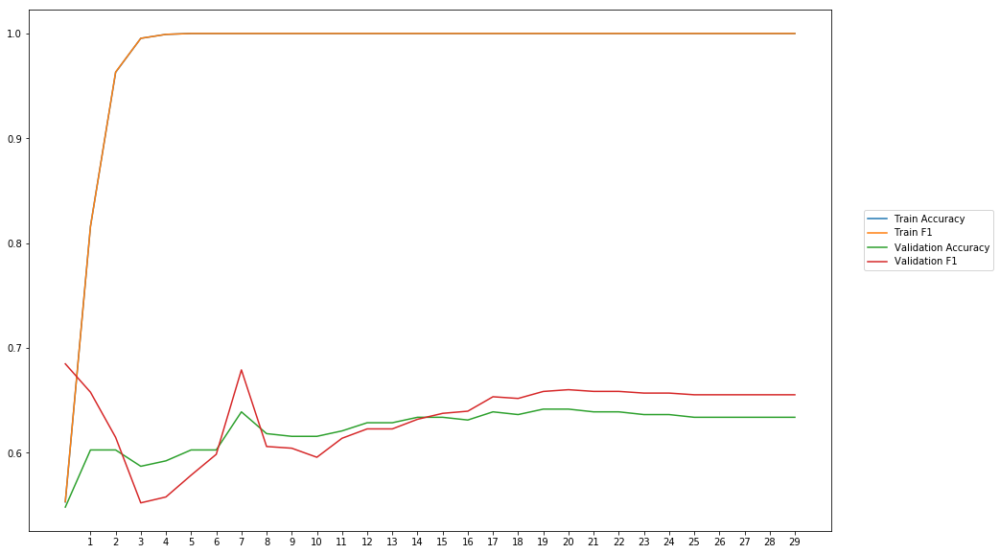

Average Accuracy: 62.27%
Average Precision: 61.82%
Average Recall: 65.87%
Average F1: 63.42%

-----Fold 2--------


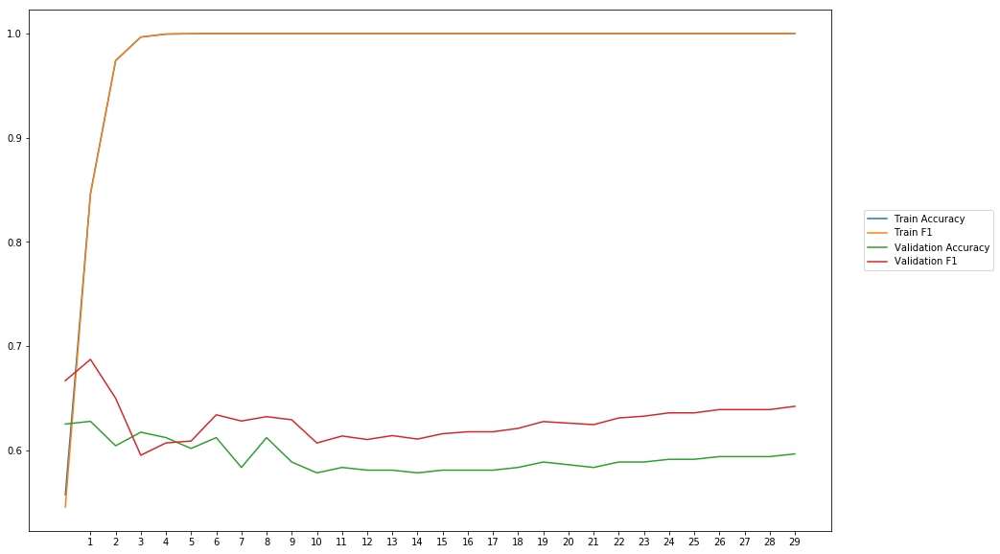

Average Accuracy: 59.35%
Average Precision: 58.20%
Average Recall: 68.39%
Average F1: 62.78%

-----Fold 3--------


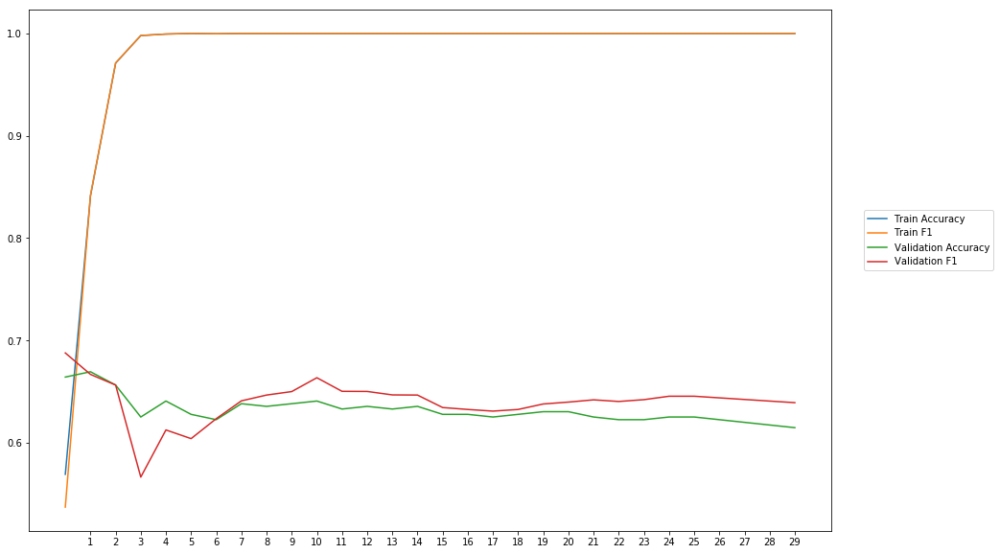

Average Accuracy: 63.19%
Average Precision: 63.01%
Average Recall: 65.28%
Average F1: 63.99%

-----Fold 4--------


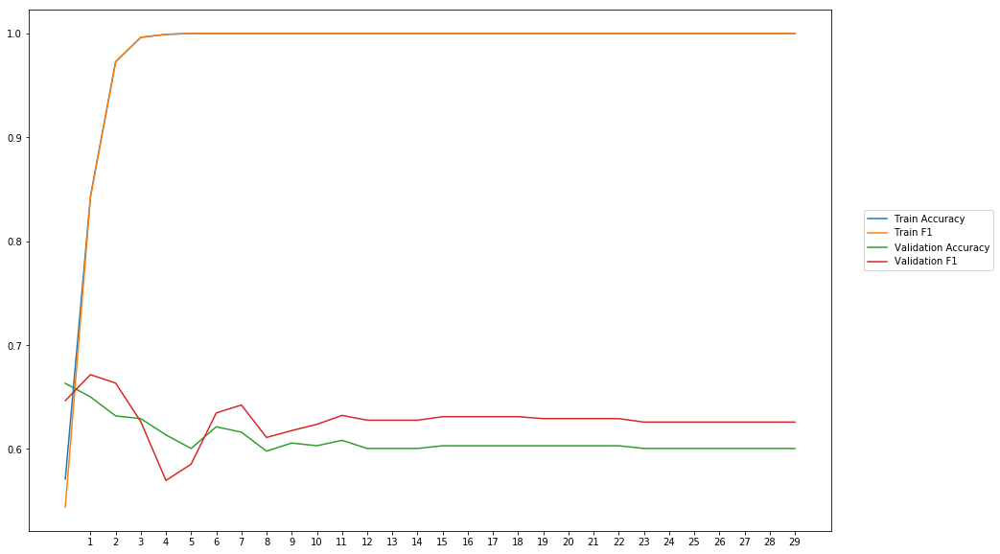

Average Accuracy: 60.91%
Average Precision: 60.15%
Average Recall: 65.87%
Average F1: 62.77%

-----Fold 5--------


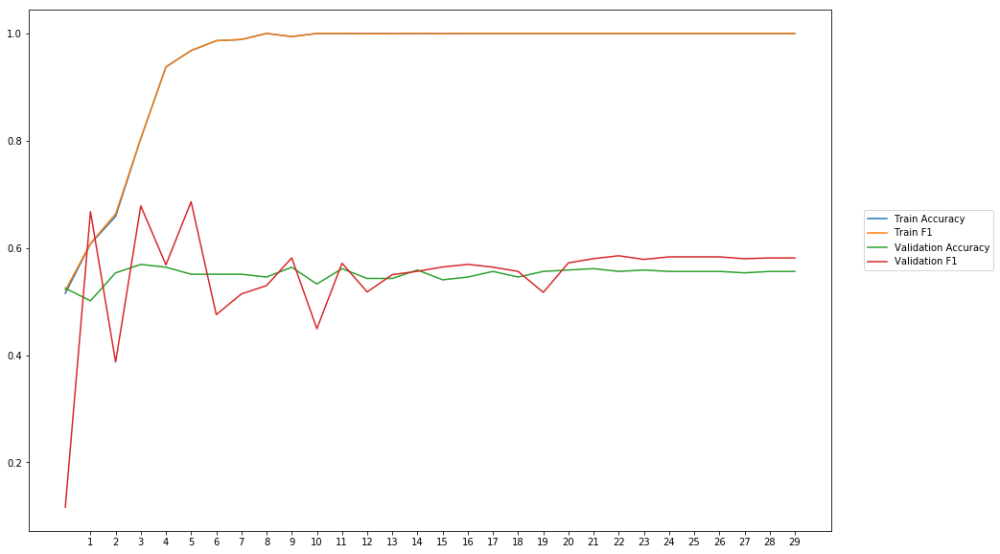

Average Accuracy: 55.09%
Average Precision: 56.32%
Average Recall: 57.64%
Average F1: 54.77%

-----Fold 6--------


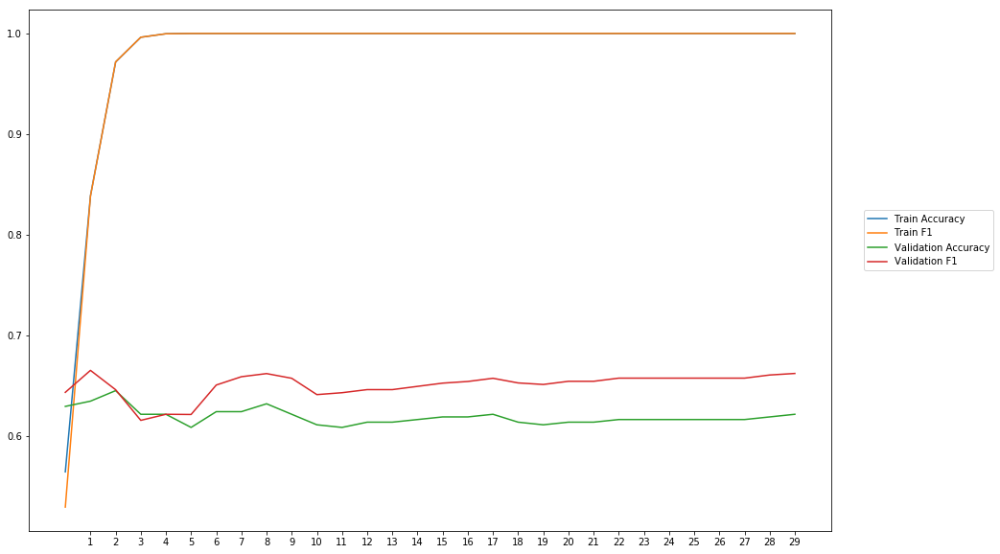

Average Accuracy: 61.91%
Average Precision: 60.29%
Average Recall: 70.75%
Average F1: 65.03%

-----Fold 7--------


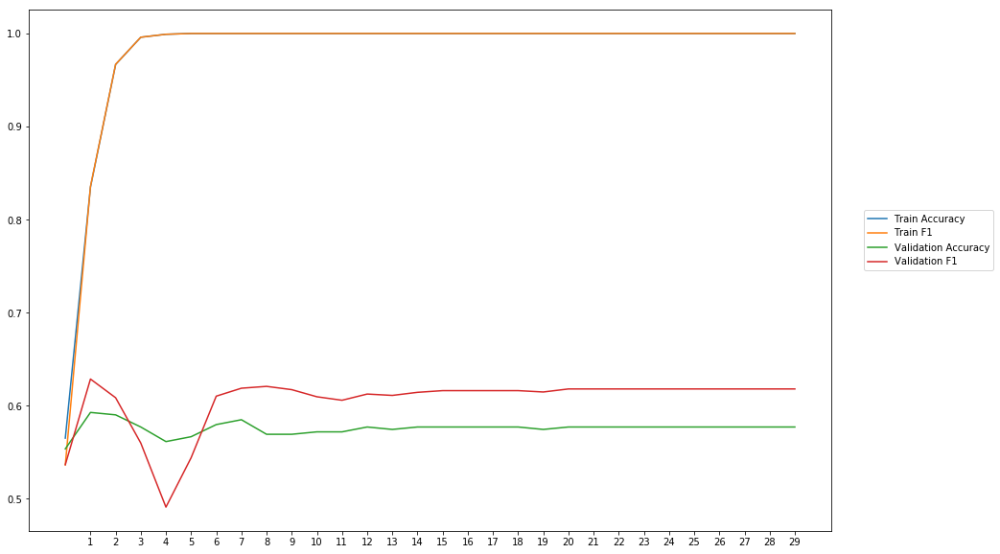

Average Accuracy: 57.56%
Average Precision: 56.72%
Average Recall: 65.24%
Average F1: 60.49%

-----Fold 8--------


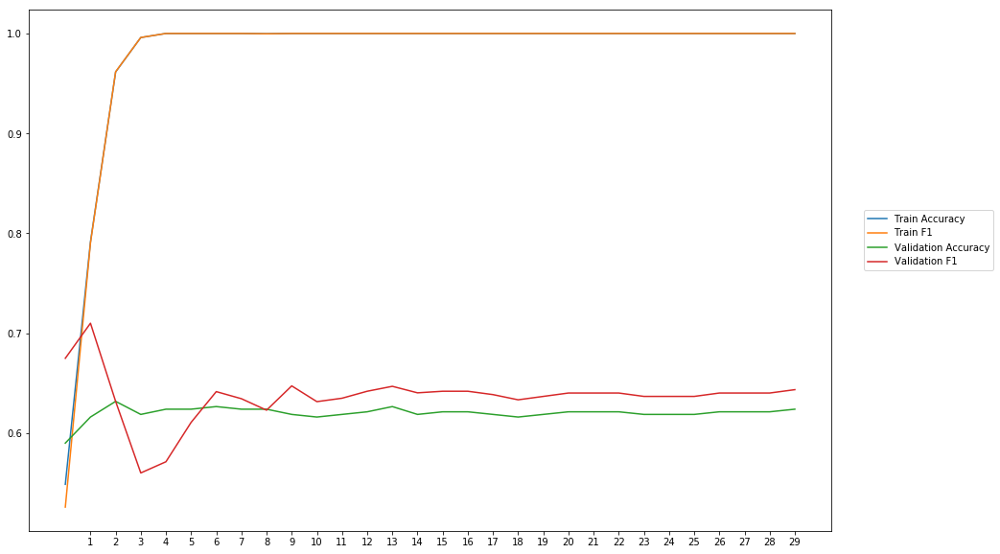

Average Accuracy: 62.02%
Average Precision: 61.35%
Average Recall: 66.81%
Average F1: 63.63%

-----Fold 9--------


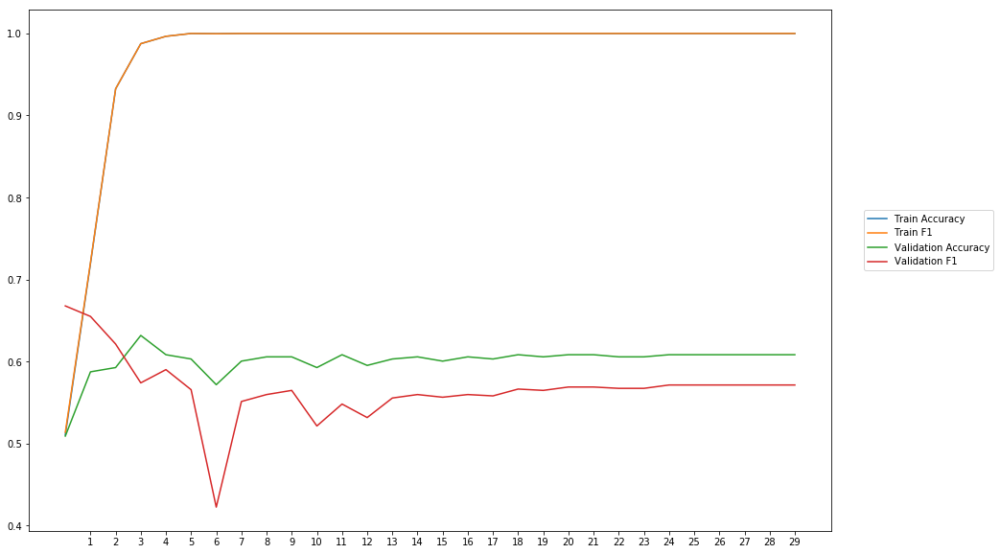

Average Accuracy: 60.08%
Average Precision: 62.70%
Average Recall: 52.99%
Average F1: 56.65%

-----Fold 10--------


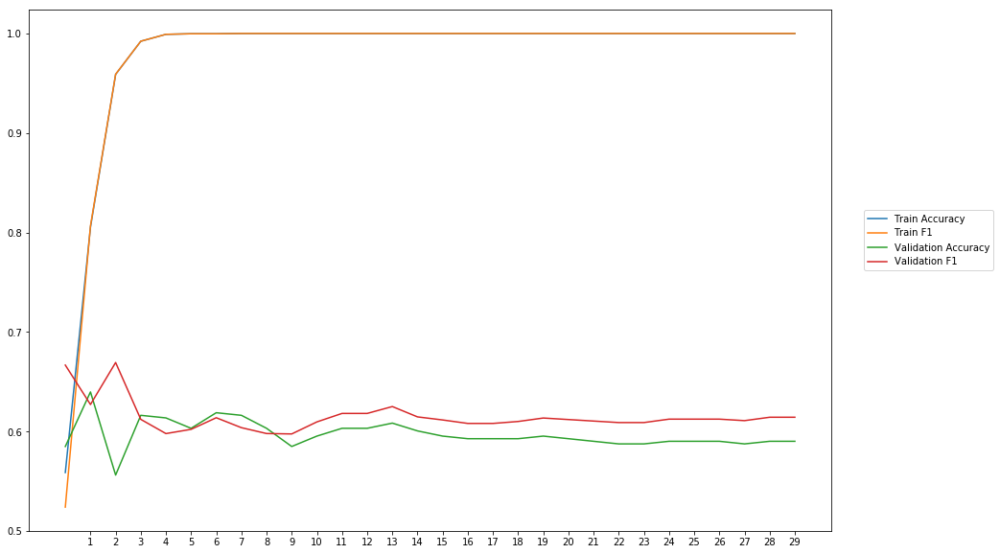

Average Accuracy: 59.70%
Average Precision: 59.23%
Average Recall: 64.37%
Average F1: 61.47%

-------Overallresults-------


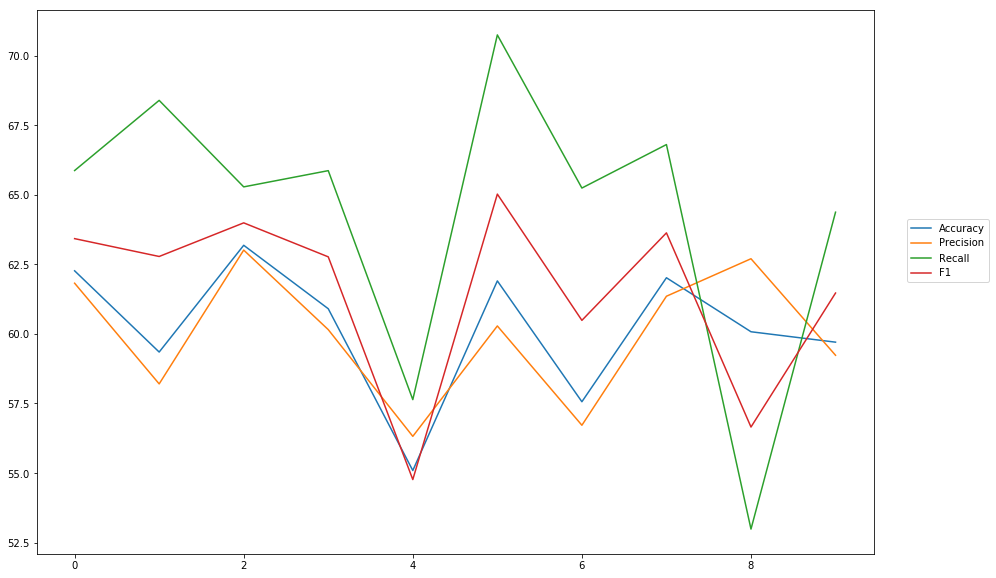

Accuracy: Mean = 60.21% (+/- 2.32%), Max = 63.19%, Min =  55.09%
Precision: Mean = 59.98% (+/- 2.23%), Max = 63.01%, Min =  56.32%
Recall: Mean = 64.32% (+/- 4.94%), Max = 70.75%, Min =  52.99%
F1: Mean = 61.50% (+/- 3.16%), Max = 65.03%, Min =  54.77%


In [44]:
cross_val(model15, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'cnn_1_500_kernel3') 

## CNN one CNN-Layer, one MaxPooling-layer, 500 filters

In [ ]:
wv_layer16 = Embedding(len(word_index)+1,
                     EMBEDDING_DIM,
                     weights=[embedding_matrix],
                     input_length=MAX_SEQUENCE_LENGTH,
                     trainable=True)

#Input Layer
comment_input16= Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences16 = wv_layer16(comment_input16)

#CNN-Layer
x16 = Conv1D(500, kernel_size =3, activation='relu')(embedded_sequences16)

#Max-Pool
x16 = MaxPooling1D(pool_size=2) (x16)

x16 = Flatten() (x16)

#Output (Dense) Layer
preds16 = Dense(2, activation='softmax')(x16)

# build the model
model16 = Model(inputs=[comment_input16], outputs=preds16)


-----Fold 1--------


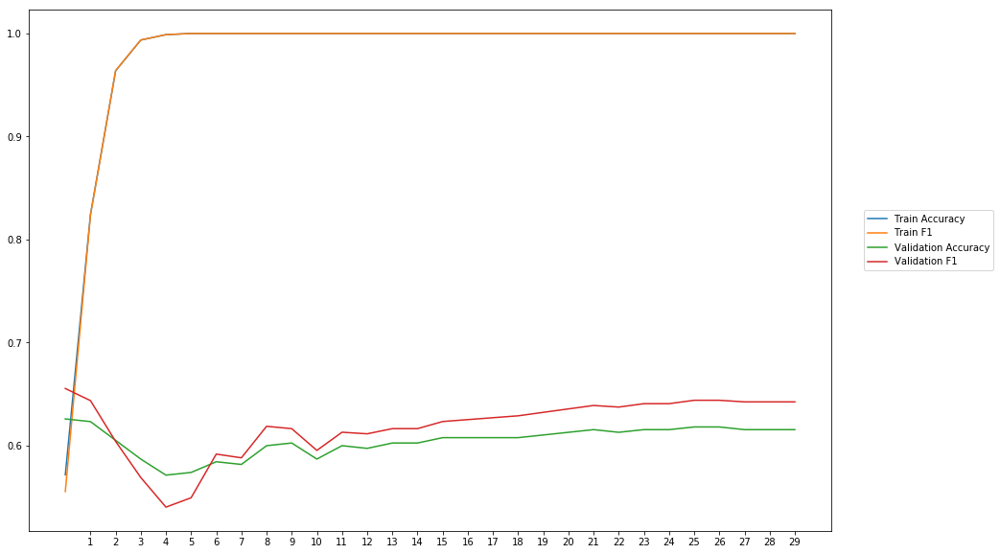

Average Accuracy: 60.48%
Average Precision: 59.79%
Average Recall: 64.39%
Average F1: 61.93%

-----Fold 2--------


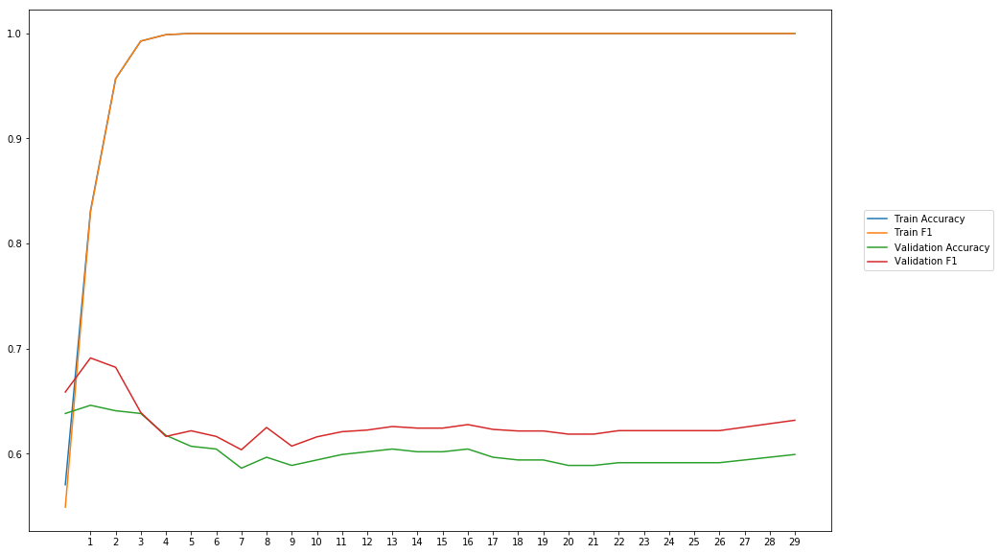

Average Accuracy: 60.24%
Average Precision: 59.33%
Average Recall: 66.61%
Average F1: 62.72%

-----Fold 3--------


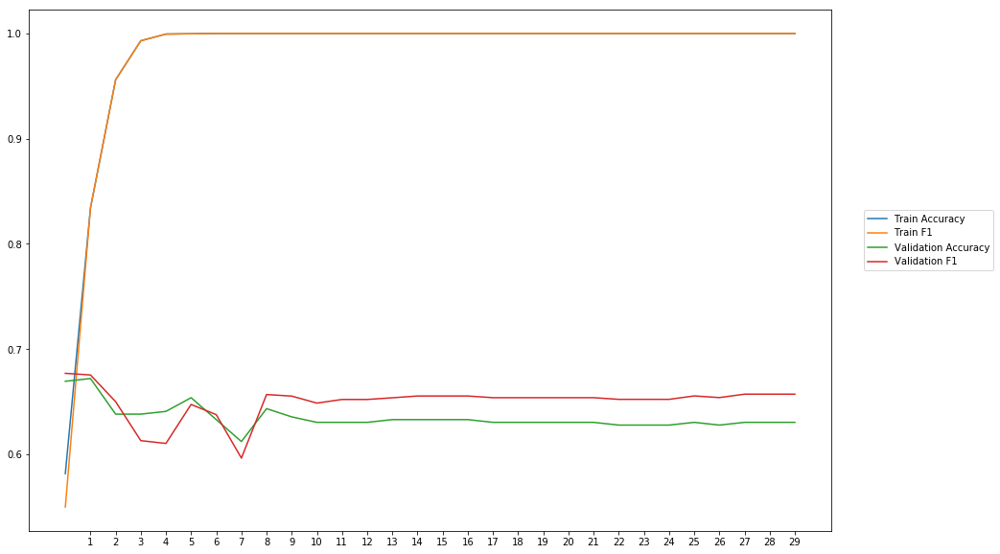

Average Accuracy: 63.46%
Average Precision: 62.77%
Average Recall: 67.58%
Average F1: 64.98%

-----Fold 4--------


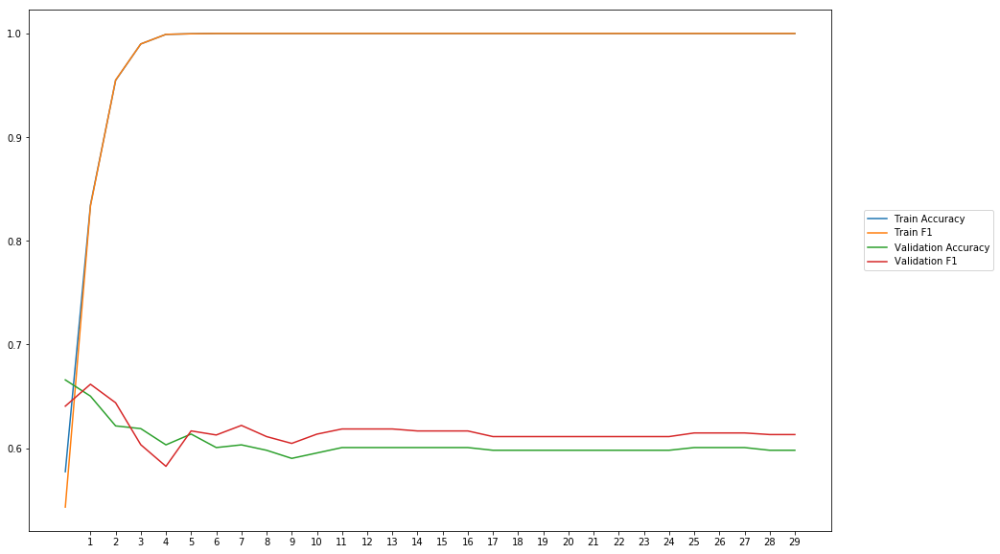

Average Accuracy: 60.48%
Average Precision: 60.14%
Average Recall: 63.21%
Average F1: 61.59%

-----Fold 5--------


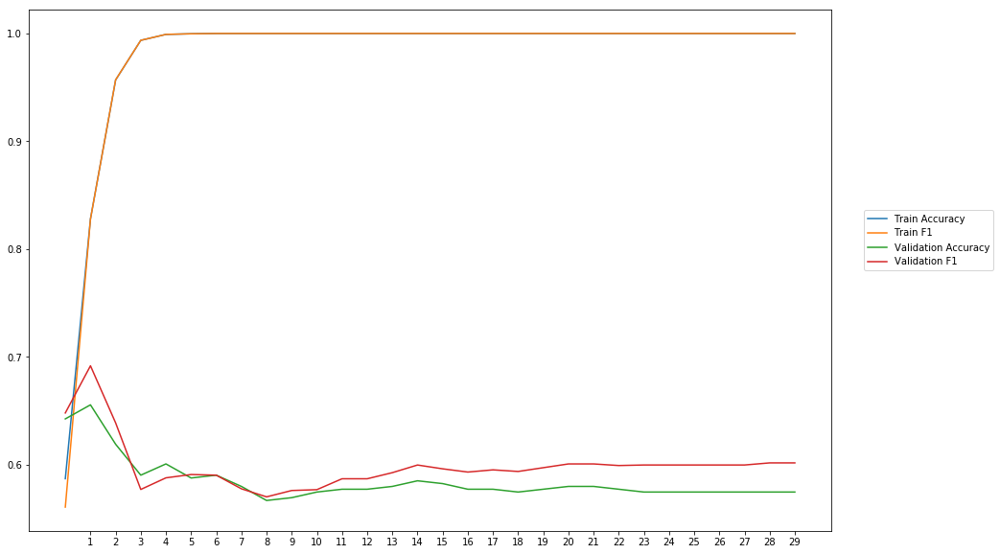

Average Accuracy: 58.46%
Average Precision: 58.04%
Average Recall: 61.94%
Average F1: 59.88%

-----Fold 6--------


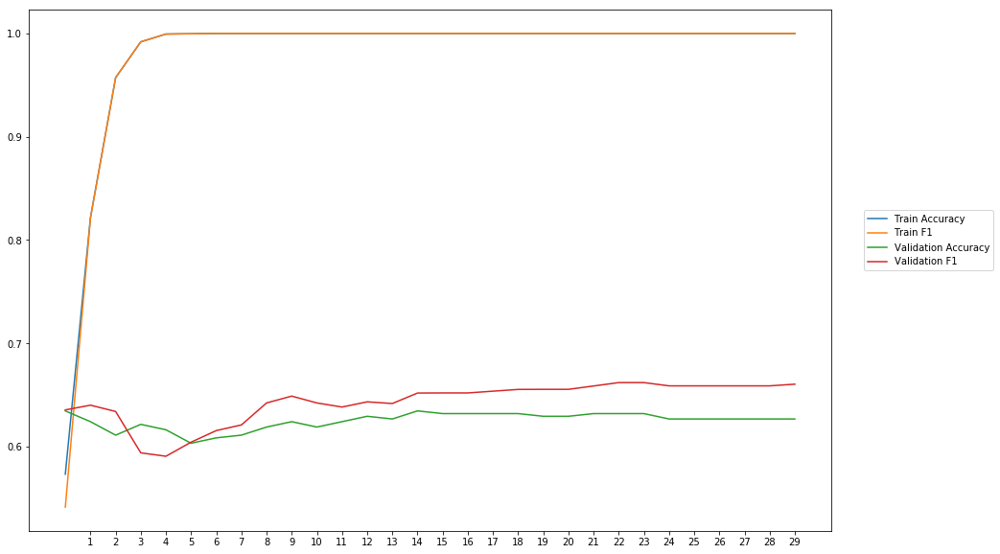

Average Accuracy: 62.49%
Average Precision: 61.47%
Average Recall: 67.71%
Average F1: 64.34%

-----Fold 7--------


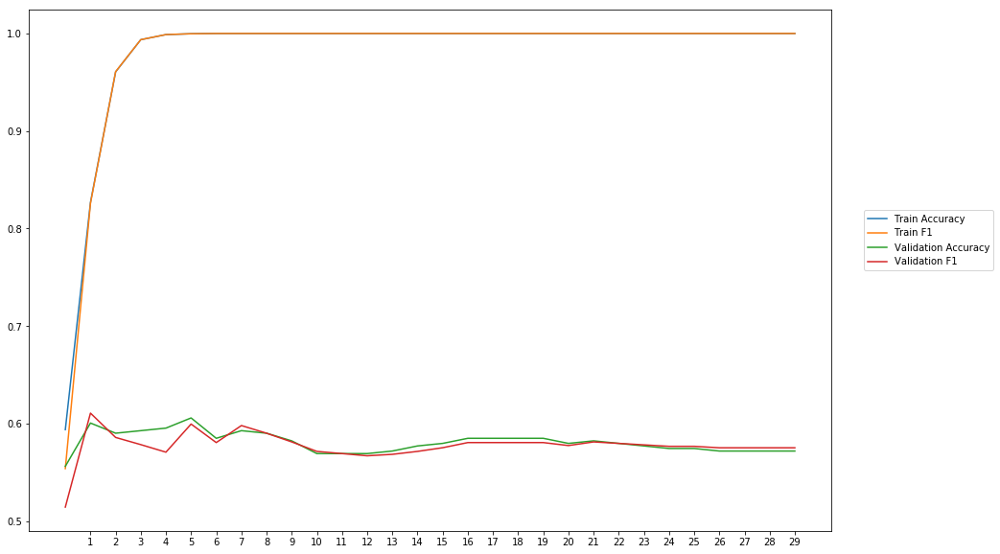

Average Accuracy: 58.07%
Average Precision: 58.35%
Average Recall: 57.20%
Average F1: 57.74%

-----Fold 8--------


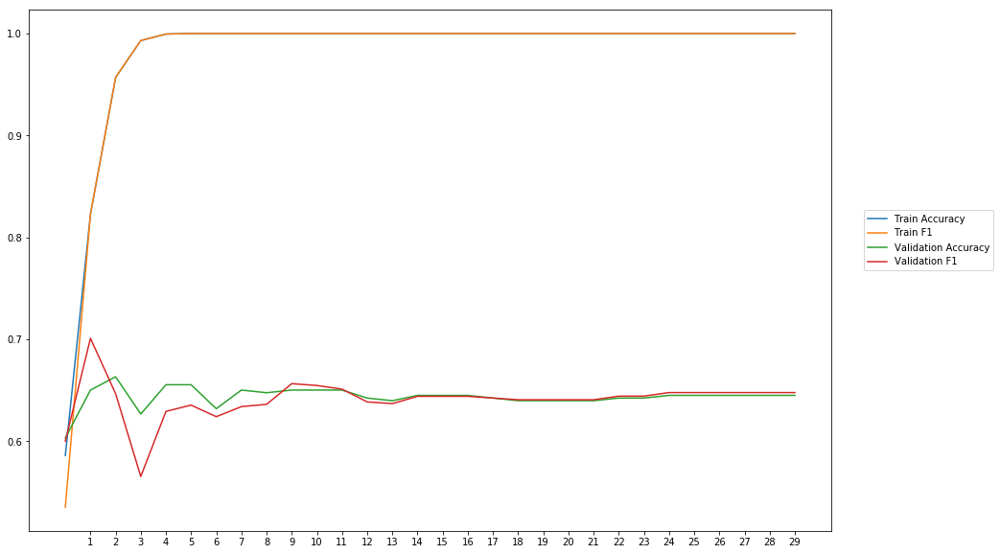

Average Accuracy: 64.35%
Average Precision: 64.80%
Average Recall: 63.61%
Average F1: 64.07%

-----Fold 9--------


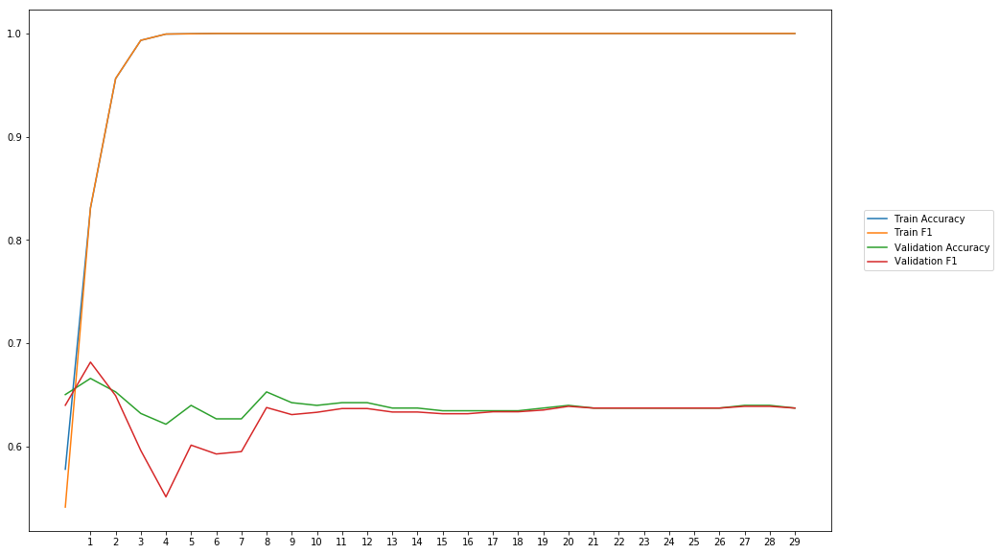

Average Accuracy: 63.87%
Average Precision: 64.77%
Average Recall: 61.48%
Average F1: 62.96%

-----Fold 10--------


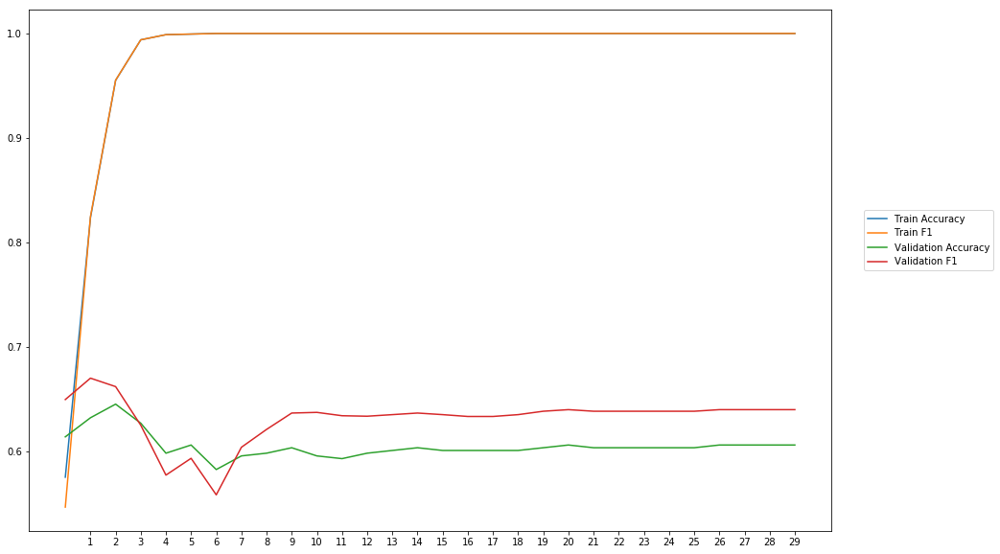

Average Accuracy: 60.46%
Average Precision: 59.31%
Average Recall: 67.69%
Average F1: 63.11%

-------Overallresults-------


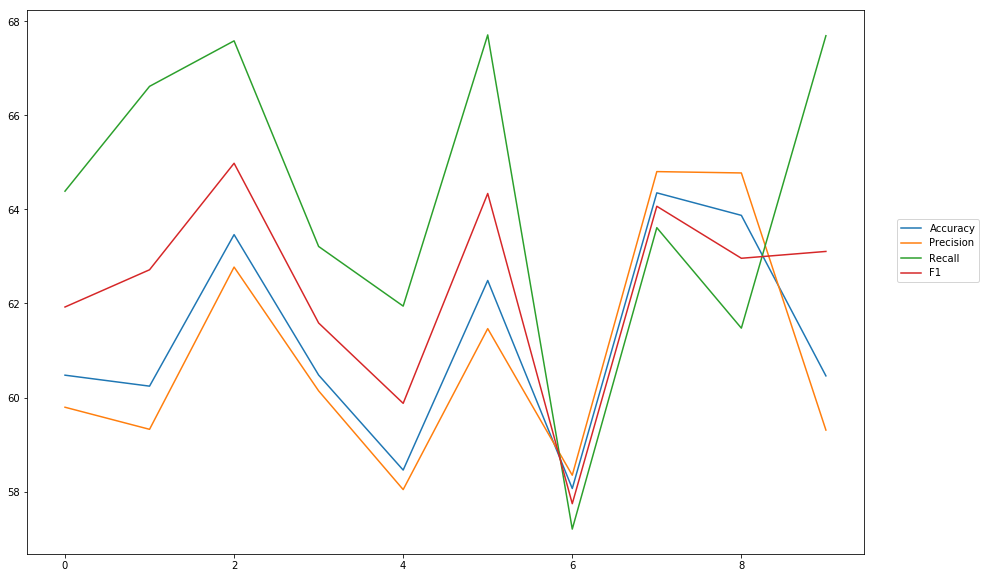

Accuracy: Mean = 61.24% (+/- 2.09%), Max = 64.35%, Min =  58.07%
Precision: Mean = 60.88% (+/- 2.36%), Max = 64.80%, Min =  58.04%
Recall: Mean = 64.14% (+/- 3.23%), Max = 67.71%, Min =  57.20%
F1: Mean = 62.33% (+/- 2.07%), Max = 64.98%, Min =  57.74%


In [49]:
cross_val(model16, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'cnn_1_500_maxpool_kernel3') 

## CNN one CNN-layer, 600 filter

In [ ]:
wv_layer17 = Embedding(len(word_index)+1,
                     EMBEDDING_DIM,
                     weights=[embedding_matrix],
                     input_length=MAX_SEQUENCE_LENGTH,
                     trainable=True)

#Input Layer
comment_input17= Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences17 = wv_layer17(comment_input17)

#CNN-Layer
x17 = Conv1D(600, kernel_size =3, activation='relu')(embedded_sequences17)

x17 = Flatten() (x17)

#Output (Dense) Layer
preds17 = Dense(2, activation='softmax')(x17)

# build the model
model17 = Model(inputs=[comment_input17], outputs=preds17)


-----Fold 1--------


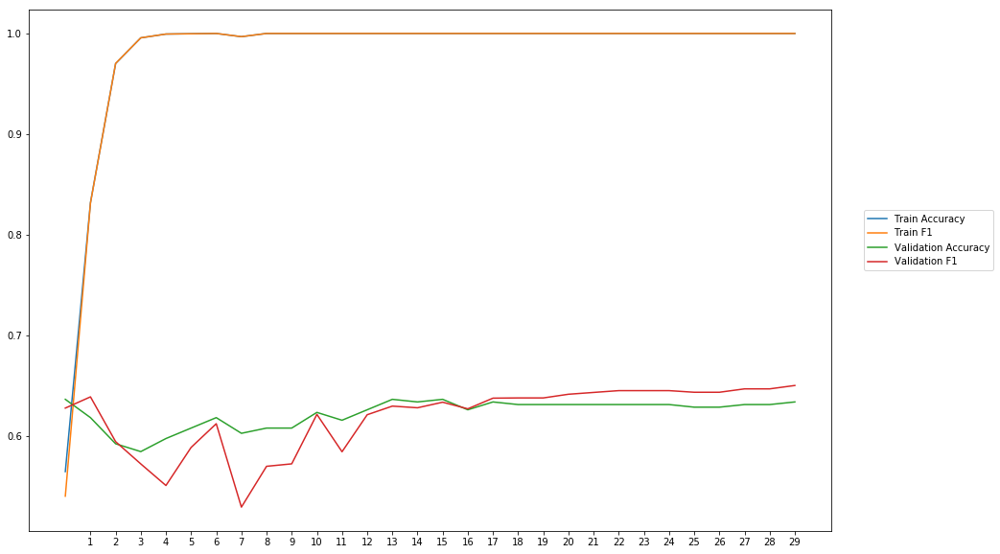

Average Accuracy: 62.25%
Average Precision: 62.61%
Average Recall: 61.52%
Average F1: 61.88%

-----Fold 2--------


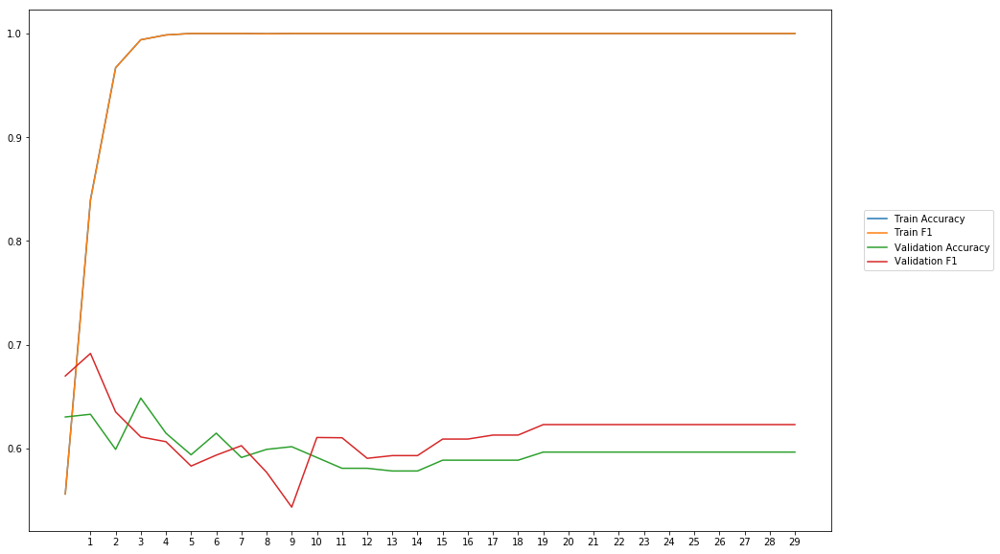

Average Accuracy: 59.83%
Average Precision: 59.52%
Average Recall: 63.78%
Average F1: 61.35%

-----Fold 3--------


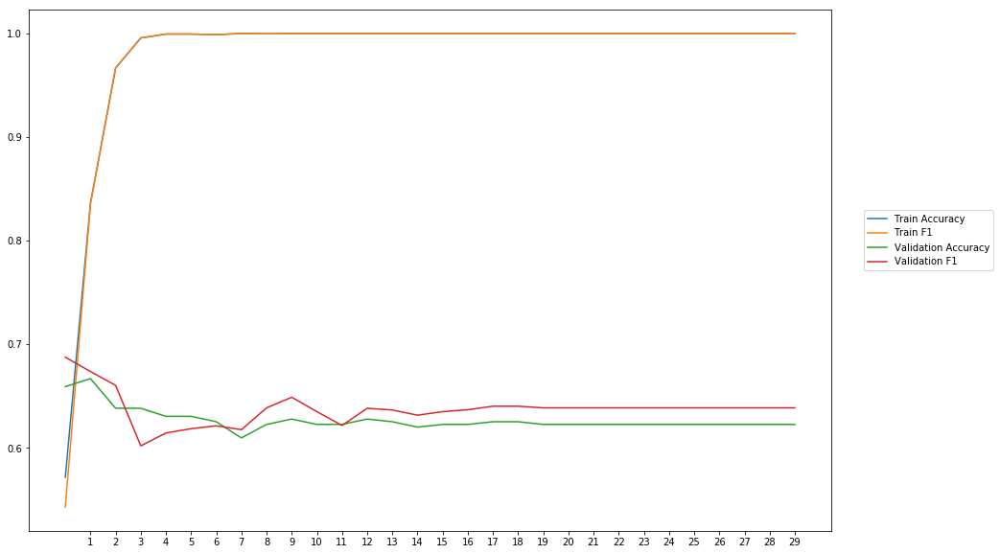

Average Accuracy: 62.68%
Average Precision: 62.34%
Average Recall: 65.32%
Average F1: 63.72%

-----Fold 4--------


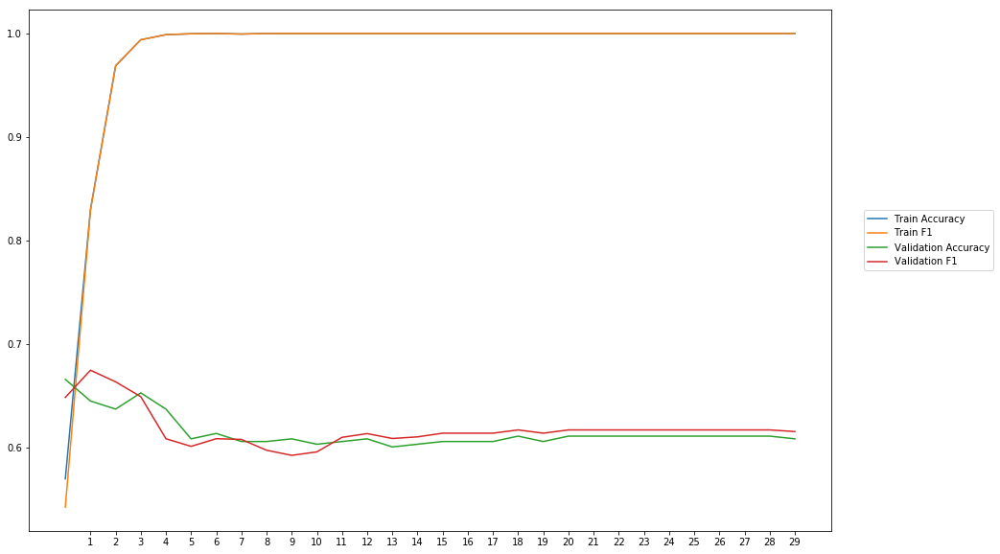

Average Accuracy: 61.47%
Average Precision: 61.50%
Average Recall: 62.15%
Average F1: 61.76%

-----Fold 5--------


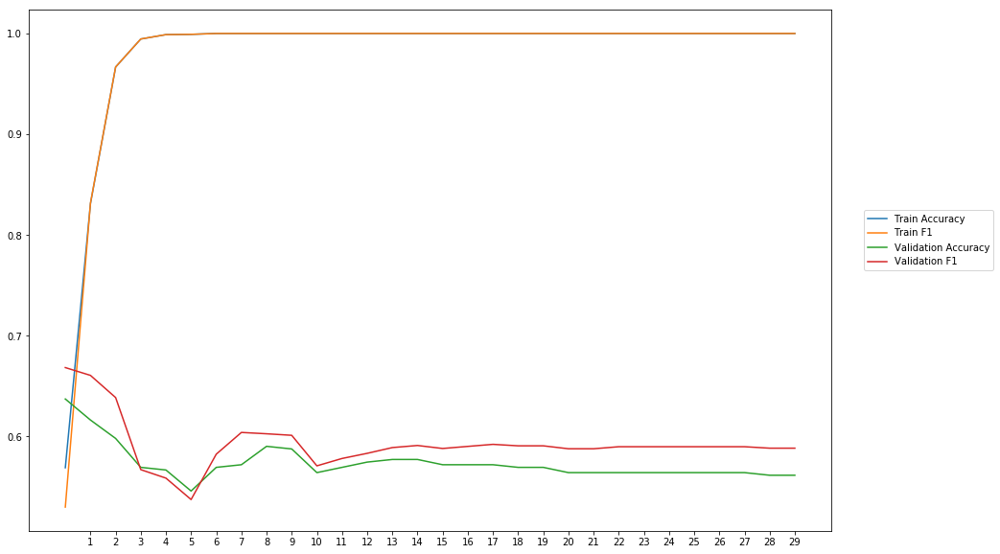

Average Accuracy: 57.34%
Average Precision: 56.80%
Average Recall: 62.01%
Average F1: 59.24%

-----Fold 6--------


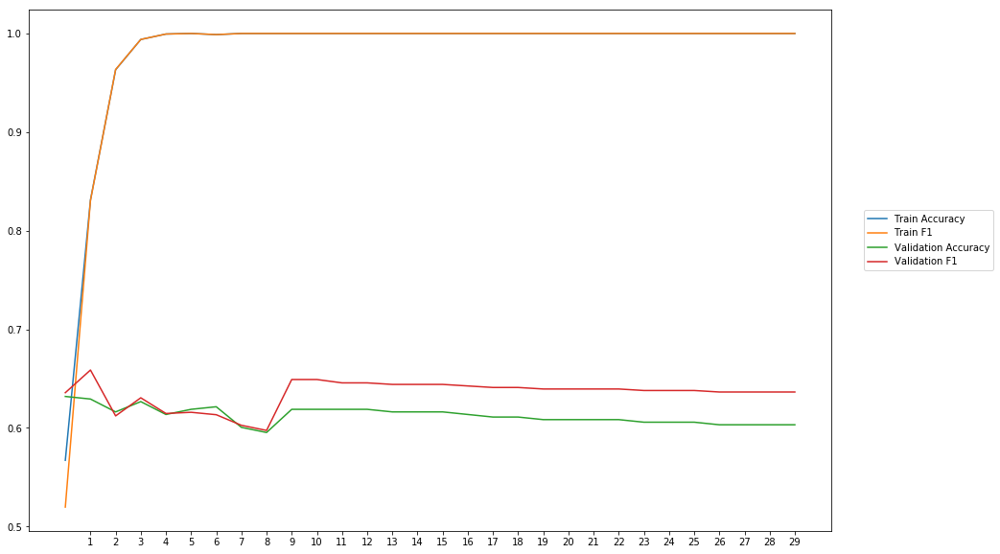

Average Accuracy: 61.25%
Average Precision: 60.22%
Average Recall: 67.29%
Average F1: 63.48%

-----Fold 7--------


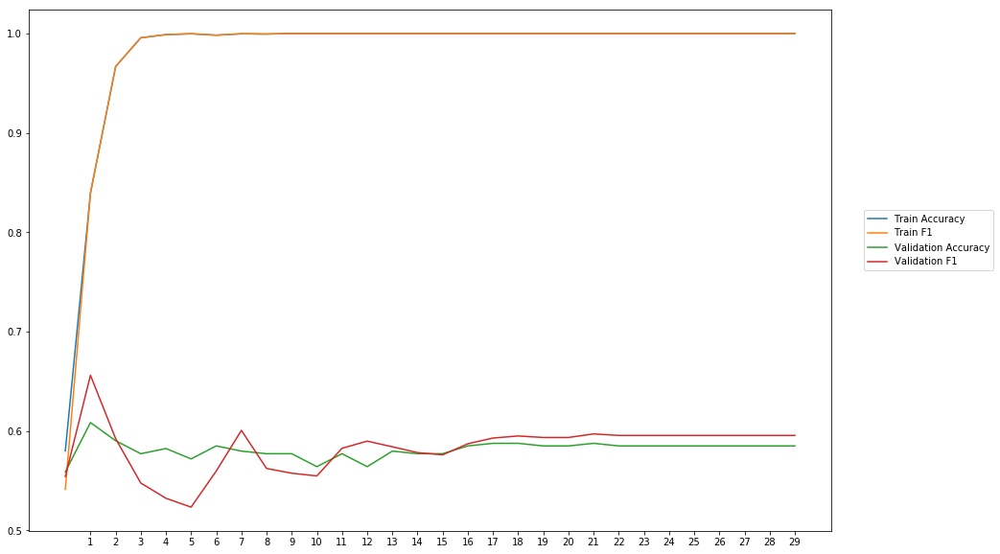

Average Accuracy: 58.14%
Average Precision: 58.25%
Average Recall: 58.49%
Average F1: 58.24%

-----Fold 8--------


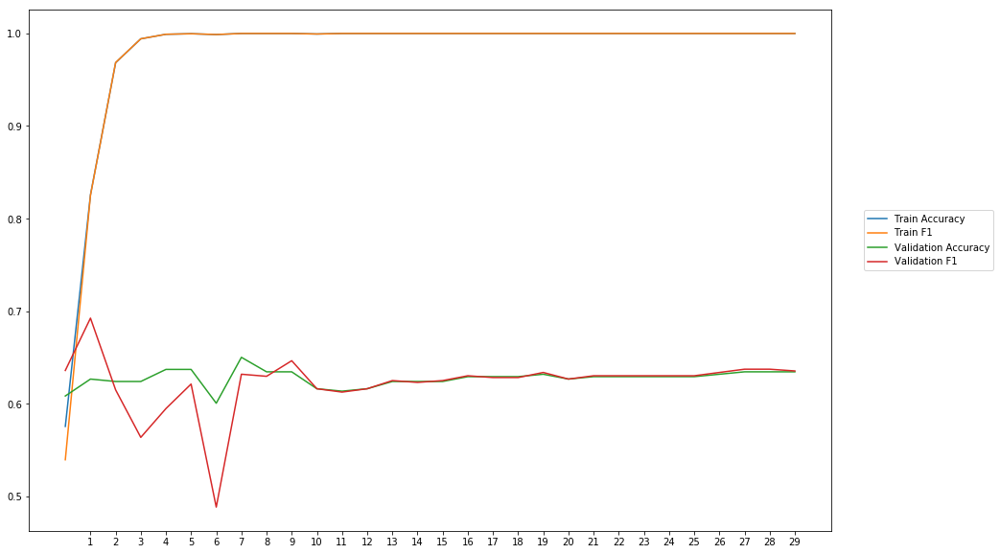

Average Accuracy: 62.74%
Average Precision: 63.35%
Average Recall: 61.82%
Average F1: 62.26%

-----Fold 9--------


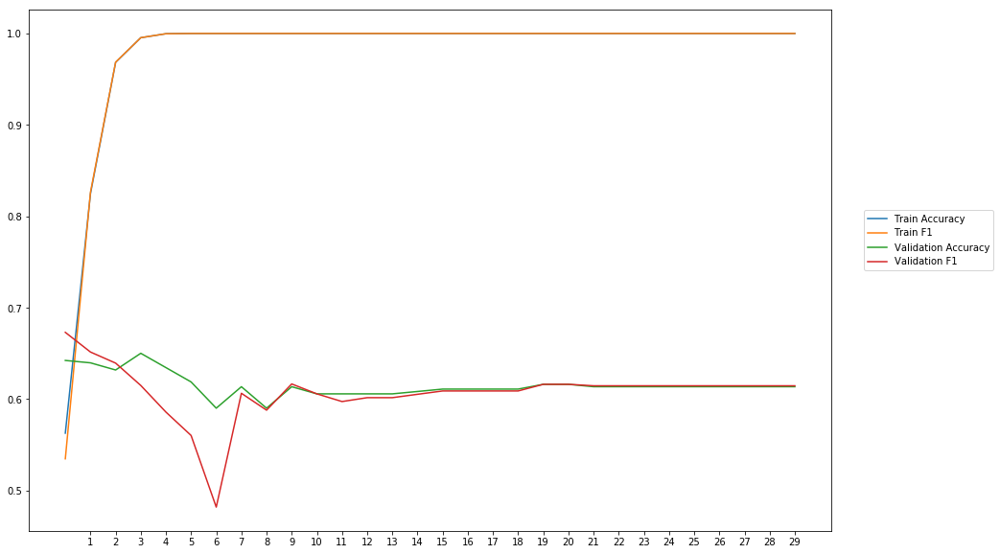

Average Accuracy: 61.51%
Average Precision: 62.22%
Average Recall: 59.81%
Average F1: 60.76%

-----Fold 10--------


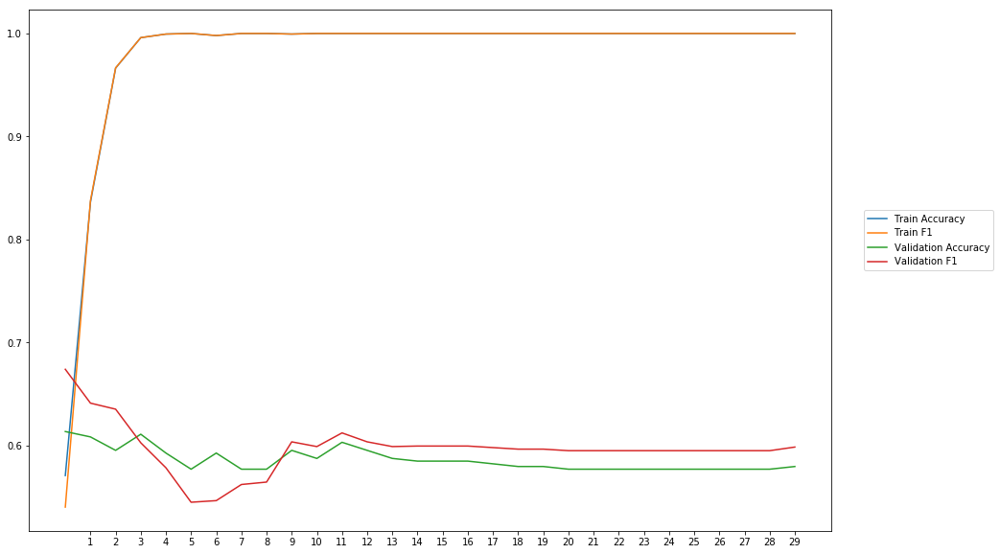

Average Accuracy: 58.61%
Average Precision: 58.33%
Average Recall: 61.44%
Average F1: 59.70%

-------Overallresults-------


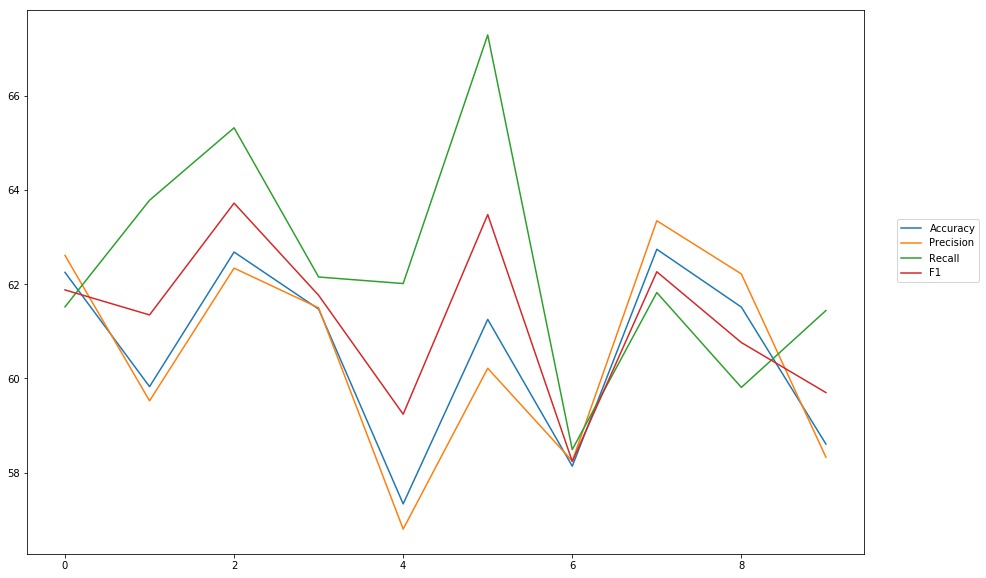

Accuracy: Mean = 60.58% (+/- 1.87%), Max = 62.74%, Min =  57.34%
Precision: Mean = 60.51% (+/- 2.11%), Max = 63.35%, Min =  56.80%
Recall: Mean = 62.36% (+/- 2.42%), Max = 67.29%, Min =  58.49%
F1: Mean = 61.24% (+/- 1.69%), Max = 63.72%, Min =  58.24%


In [47]:
cross_val(model17, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'cnn_1_600_kernel3') 

## CNN one CNN-layer, one MaxPooling, 600 filter

In [ ]:
wv_layer18 = Embedding(len(word_index)+1,
                     EMBEDDING_DIM,
                     weights=[embedding_matrix],
                     input_length=MAX_SEQUENCE_LENGTH,
                     trainable=True)

#Input Layer
comment_input18= Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences18 = wv_layer18(comment_input18)

#CNN-Layer
x18 = Conv1D(600, kernel_size =3, activation='relu')(embedded_sequences18)

#Max-Pool
x18 = MaxPooling1D(pool_size=2) (x18)

x18 = Flatten() (x18)

#Output (Dense) Layer
preds18 = Dense(2, activation='softmax')(x18)

# build the model
model18 = Model(inputs=[comment_input18], outputs=preds18)


-----Fold 1--------


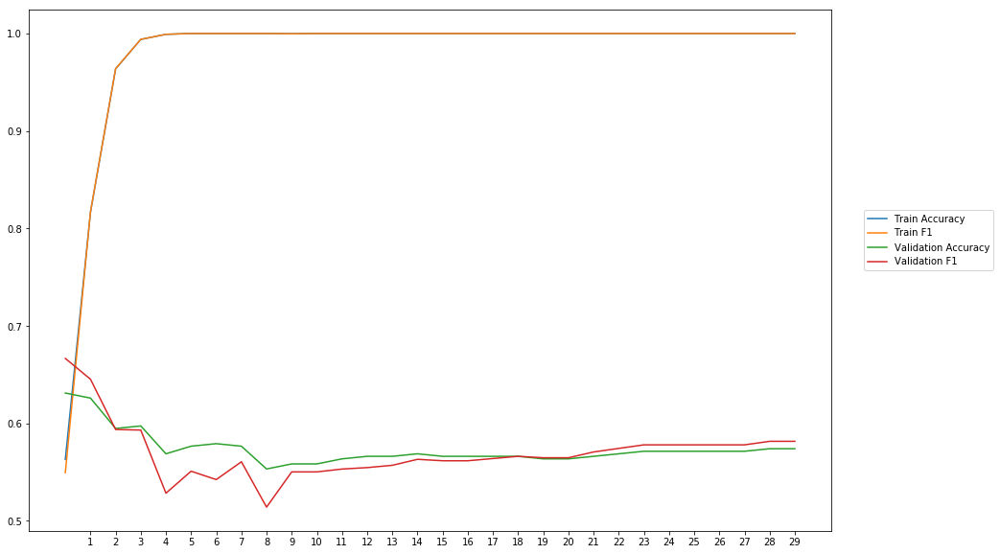

Average Accuracy: 57.39%
Average Precision: 57.62%
Average Recall: 56.60%
Average F1: 57.02%

-----Fold 2--------


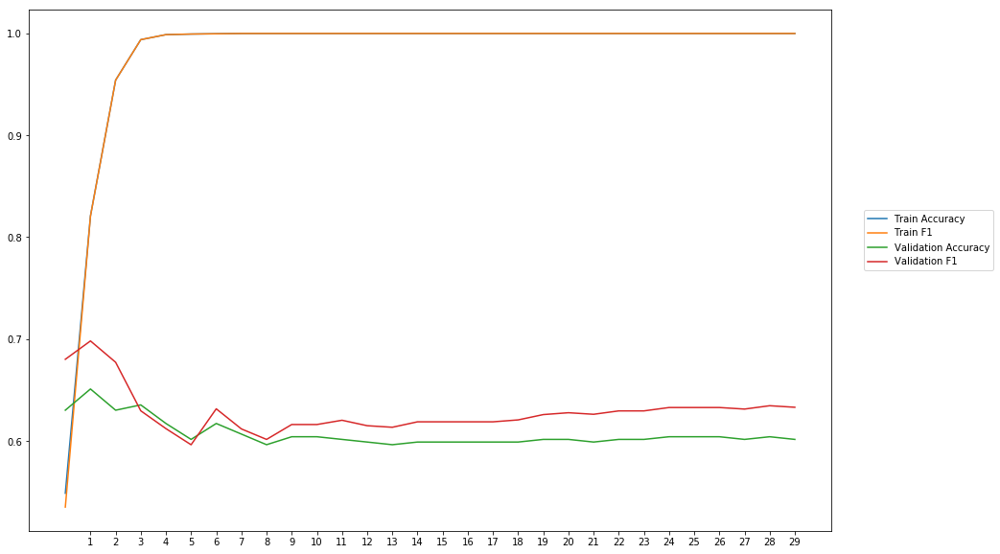

Average Accuracy: 60.70%
Average Precision: 59.87%
Average Recall: 66.32%
Average F1: 62.84%

-----Fold 3--------


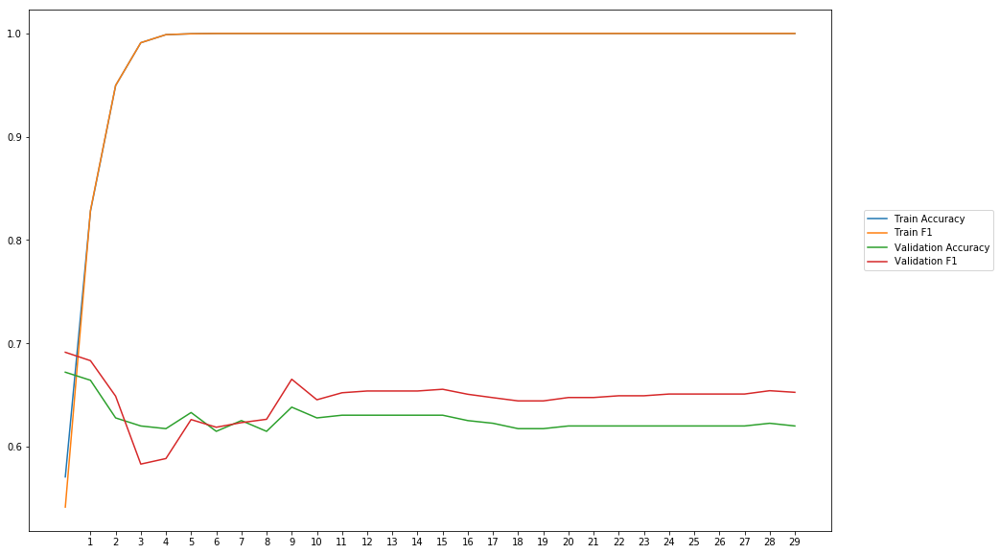

Average Accuracy: 62.62%
Average Precision: 61.73%
Average Recall: 67.82%
Average F1: 64.51%

-----Fold 4--------


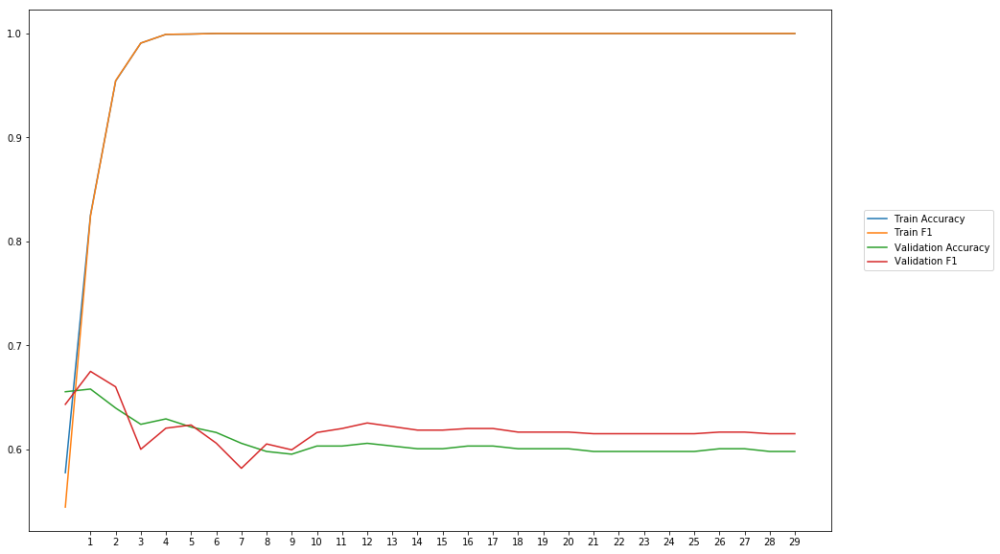

Average Accuracy: 60.84%
Average Precision: 60.51%
Average Recall: 63.44%
Average F1: 61.87%

-----Fold 5--------


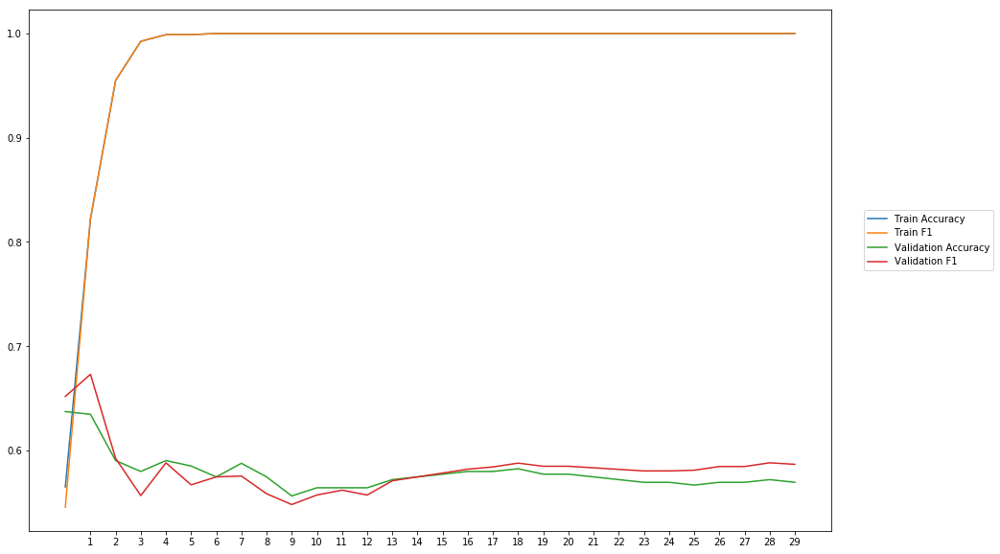

Average Accuracy: 57.83%
Average Precision: 57.82%
Average Recall: 58.66%
Average F1: 58.18%

-----Fold 6--------


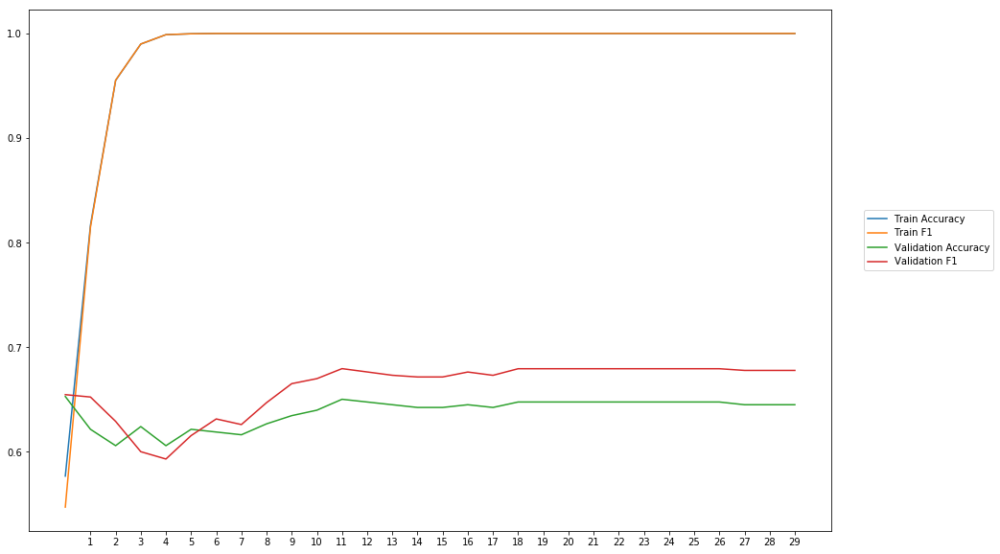

Average Accuracy: 63.81%
Average Precision: 62.22%
Average Recall: 70.90%
Average F1: 66.17%

-----Fold 7--------


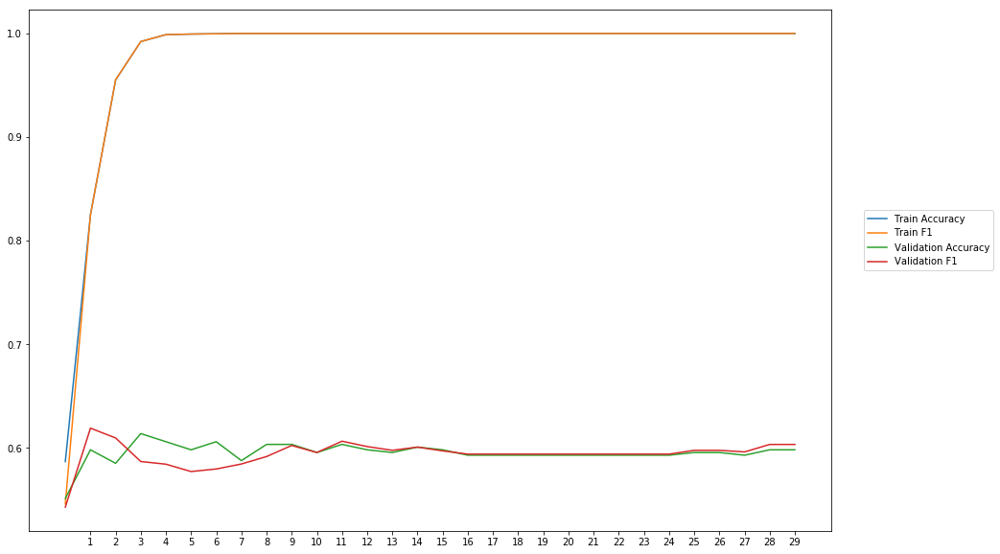

Average Accuracy: 59.51%
Average Precision: 59.77%
Average Recall: 59.08%
Average F1: 59.38%

-----Fold 8--------


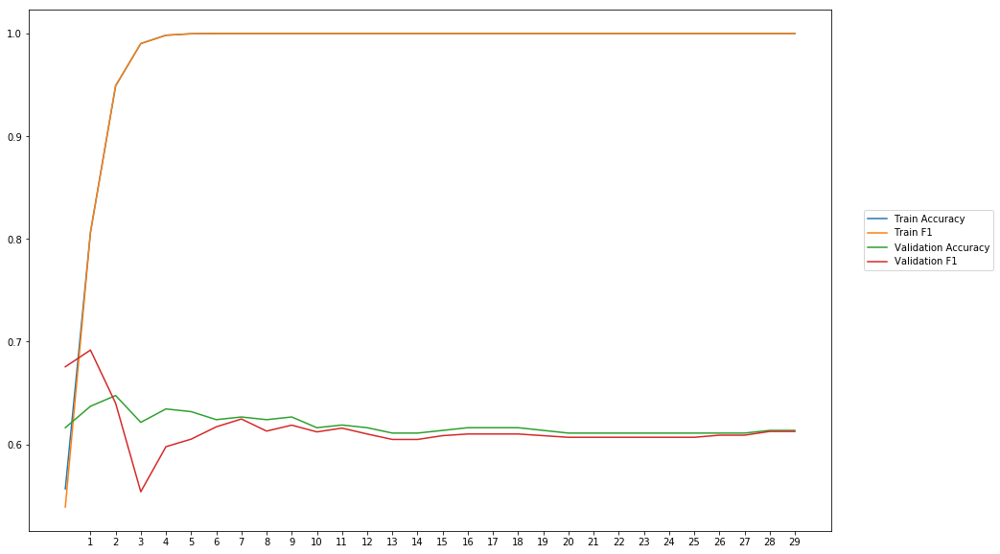

Average Accuracy: 61.85%
Average Precision: 62.39%
Average Recall: 60.82%
Average F1: 61.39%

-----Fold 9--------


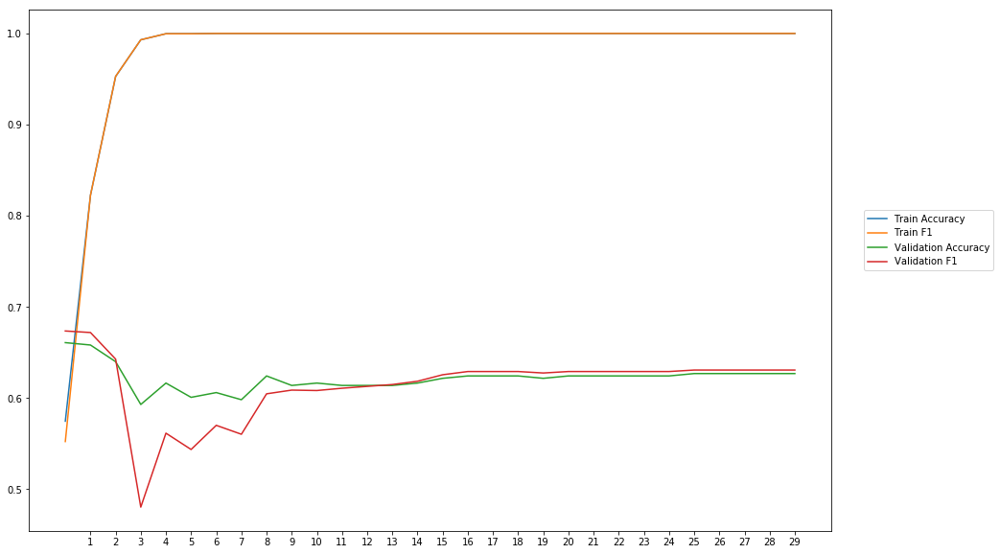

Average Accuracy: 62.17%
Average Precision: 62.80%
Average Recall: 60.50%
Average F1: 61.38%

-----Fold 10--------


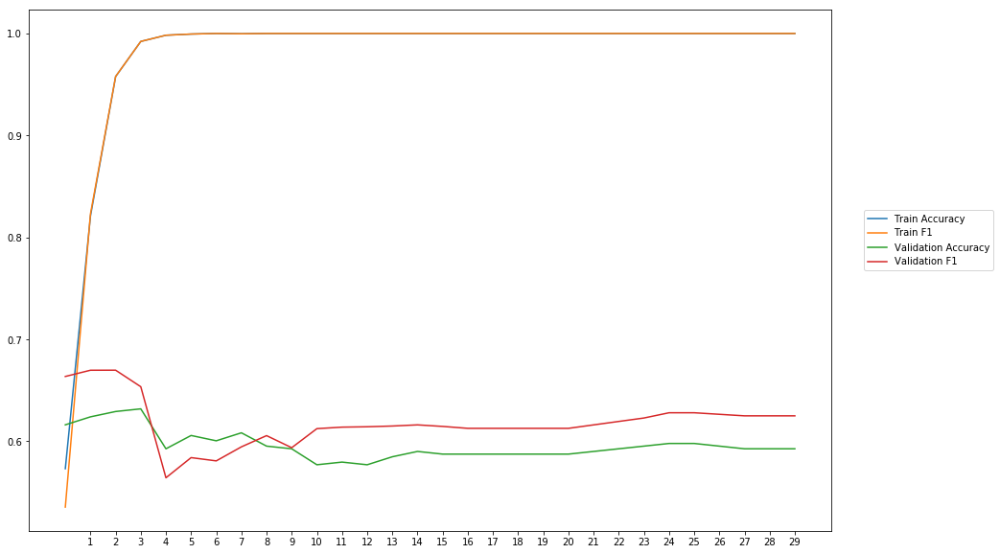

Average Accuracy: 59.59%
Average Precision: 58.76%
Average Recall: 65.52%
Average F1: 61.82%

-------Overallresults-------


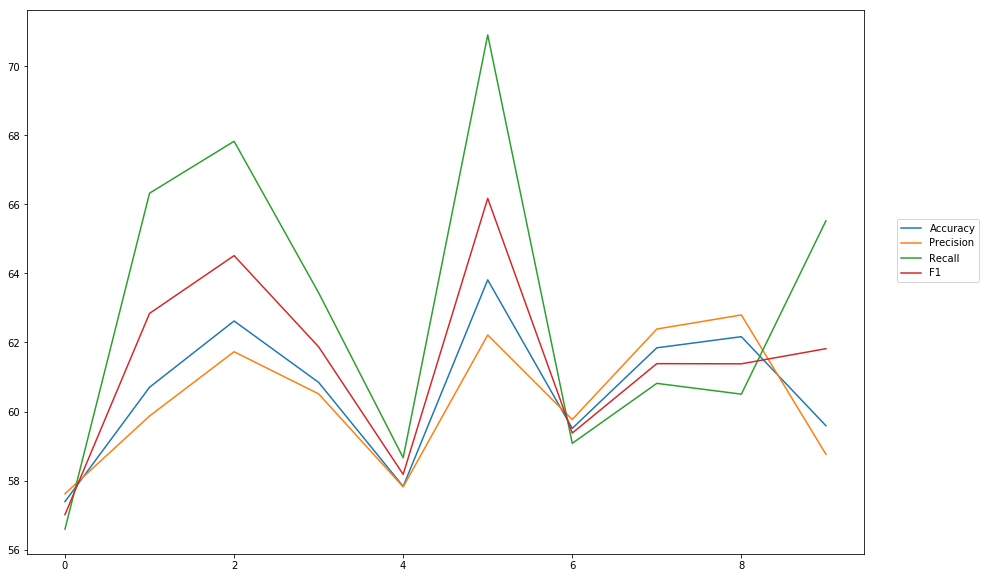

Accuracy: Mean = 60.63% (+/- 1.96%), Max = 63.81%, Min =  57.39%
Precision: Mean = 60.35% (+/- 1.80%), Max = 62.80%, Min =  57.62%
Recall: Mean = 62.97% (+/- 4.35%), Max = 70.90%, Min =  56.60%
F1: Mean = 61.46% (+/- 2.62%), Max = 66.17%, Min =  57.02%


In [48]:
cross_val(model18, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'cnn_1_600_maxpool_kernel3') 

## CNN one CNN-layer, 300 filter

In [ ]:
wv_layer24 = Embedding(len(word_index)+1,
                     EMBEDDING_DIM,
                     weights=[embedding_matrix],
                     input_length=MAX_SEQUENCE_LENGTH,
                     trainable=True)

#Input Layer
comment_input24= Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences24 = wv_layer24(comment_input24)

#CNN-Layer
x24 = Conv1D(300, kernel_size =3, activation='relu')(embedded_sequences24)

x24 = Flatten() (x24)

#Output (Dense) Layer
preds24 = Dense(2, activation='softmax')(x24)

# build the model
model24 = Model(inputs=[comment_input24], outputs=preds24)


-----Fold 1--------


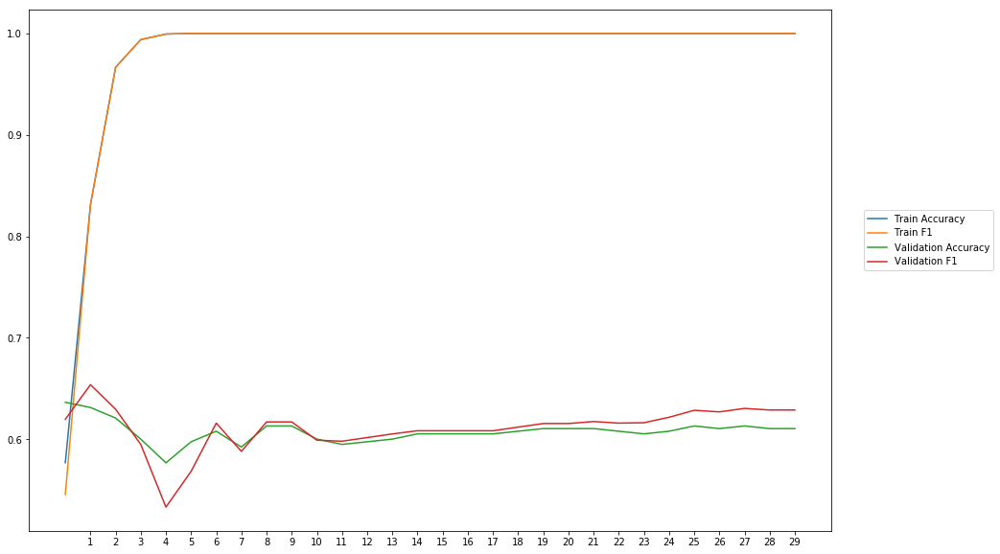

Average Accuracy: 60.73%
Average Precision: 60.66%
Average Recall: 61.68%
Average F1: 61.10%

-----Fold 2--------


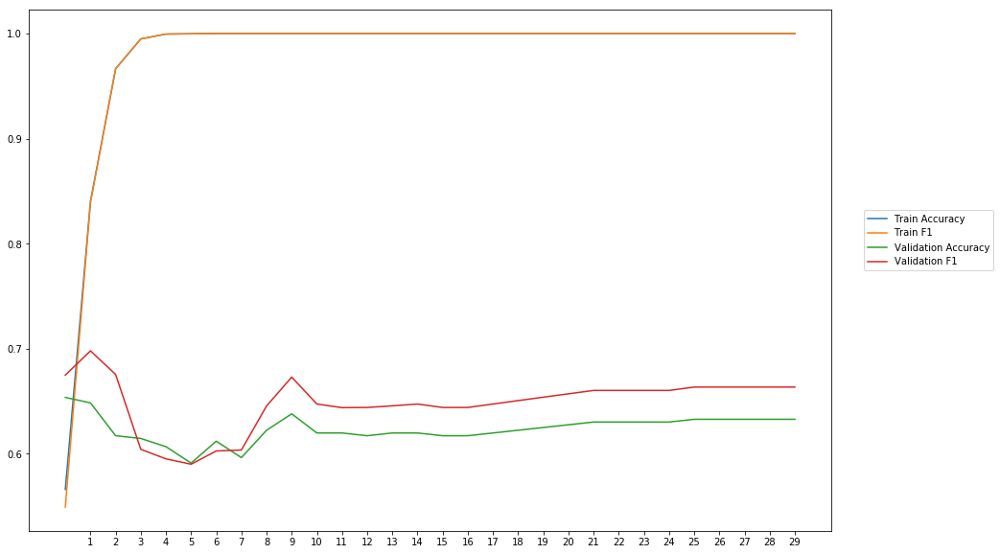

Average Accuracy: 62.37%
Average Precision: 61.09%
Average Recall: 69.27%
Average F1: 64.82%

-----Fold 3--------


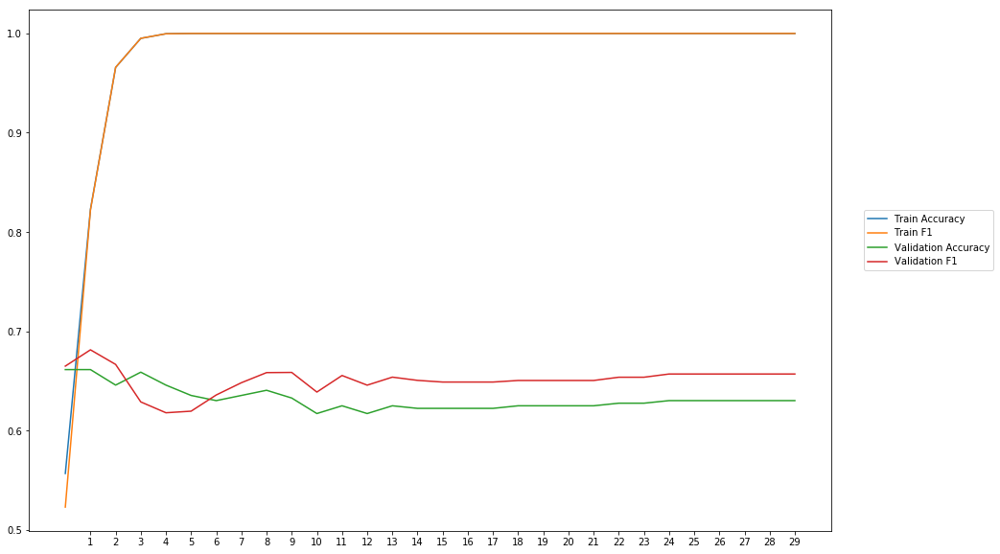

Average Accuracy: 63.19%
Average Precision: 62.33%
Average Recall: 68.34%
Average F1: 65.08%

-----Fold 4--------


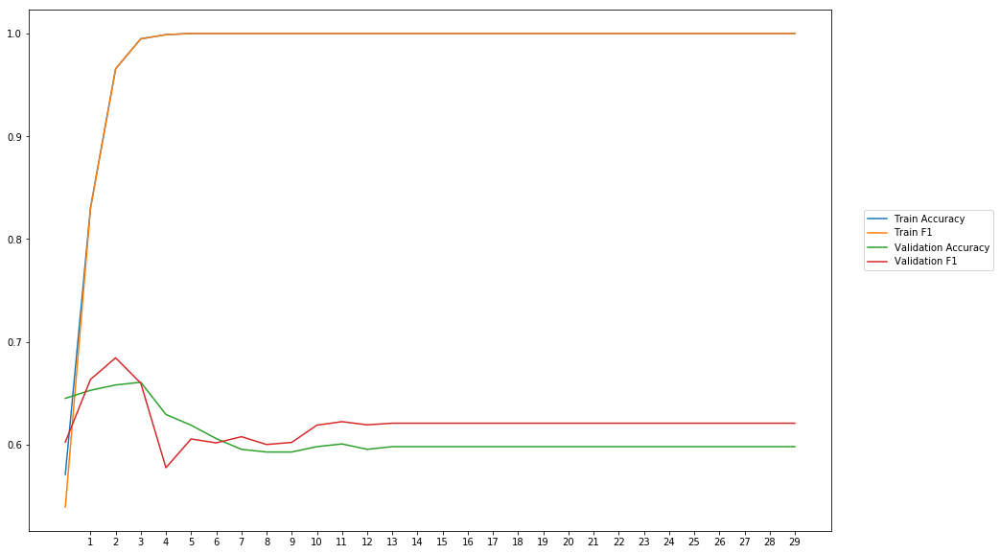

Average Accuracy: 60.70%
Average Precision: 60.31%
Average Recall: 64.22%
Average F1: 62.05%

-----Fold 5--------


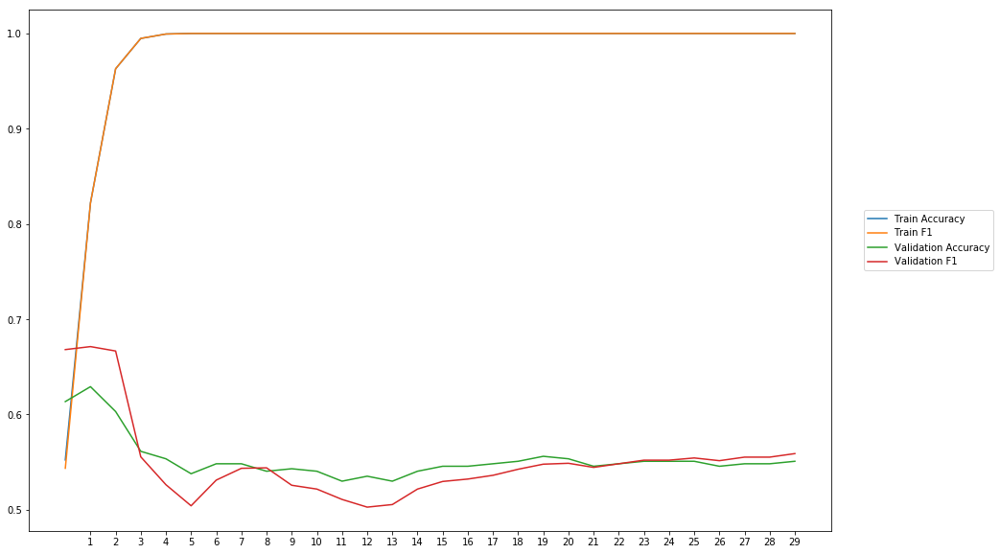

Average Accuracy: 55.32%
Average Precision: 55.34%
Average Recall: 55.09%
Average F1: 55.03%

-----Fold 6--------


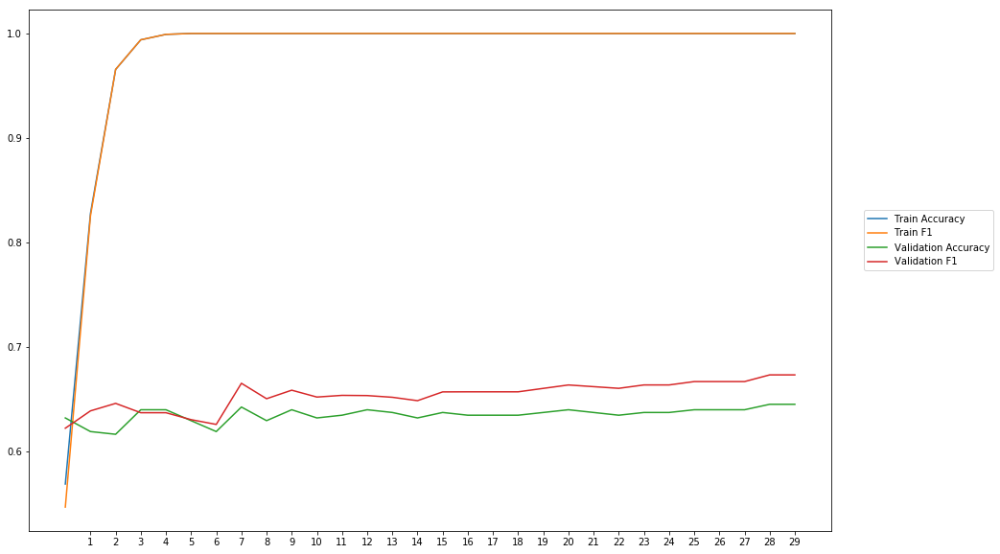

Average Accuracy: 63.51%
Average Precision: 62.35%
Average Recall: 68.84%
Average F1: 65.38%

-----Fold 7--------


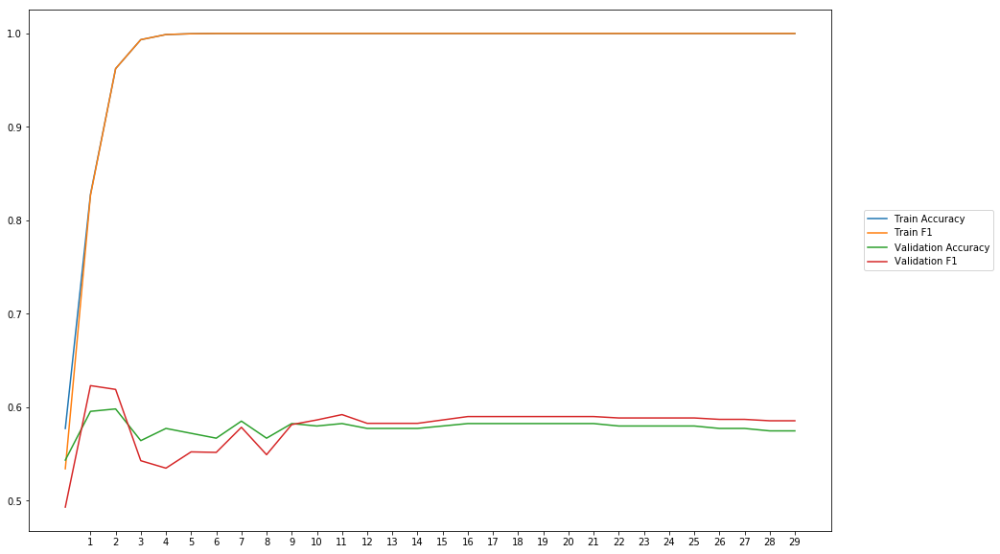

Average Accuracy: 57.79%
Average Precision: 57.85%
Average Recall: 58.11%
Average F1: 57.90%

-----Fold 8--------


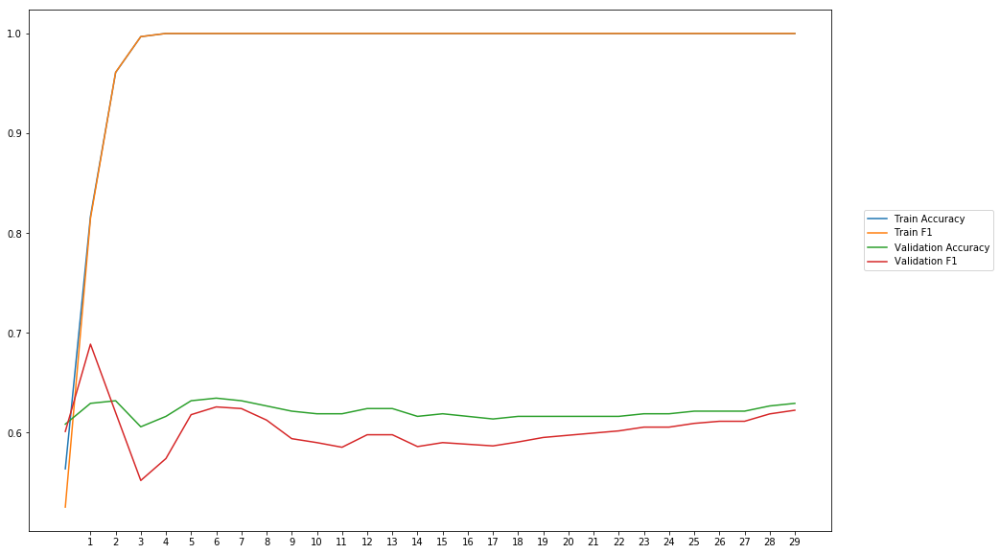

Average Accuracy: 62.09%
Average Precision: 63.46%
Average Recall: 57.76%
Average F1: 60.33%

-----Fold 9--------


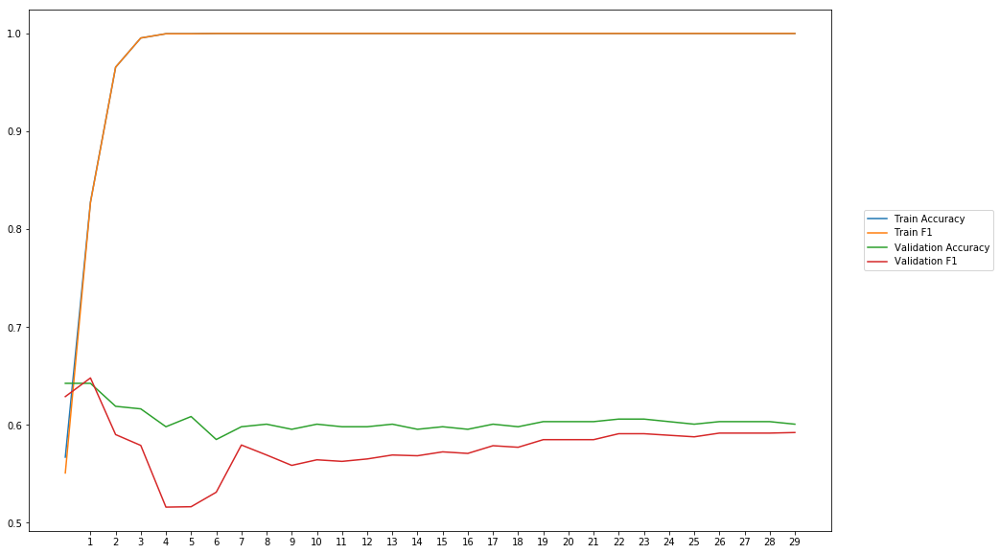

Average Accuracy: 60.41%
Average Precision: 62.13%
Average Recall: 54.17%
Average F1: 57.73%

-----Fold 10--------


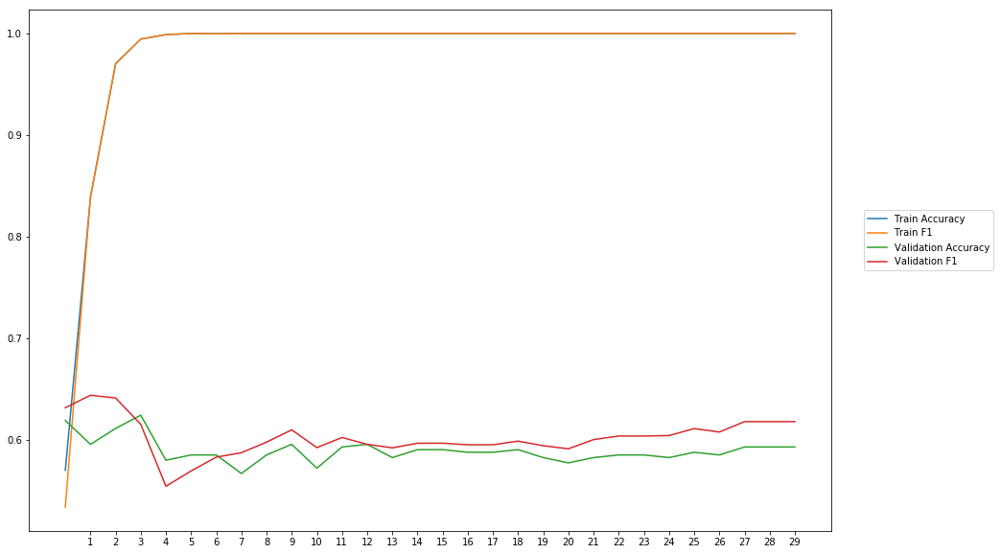

Average Accuracy: 58.92%
Average Precision: 58.55%
Average Recall: 62.10%
Average F1: 60.20%

-------Overallresults-------


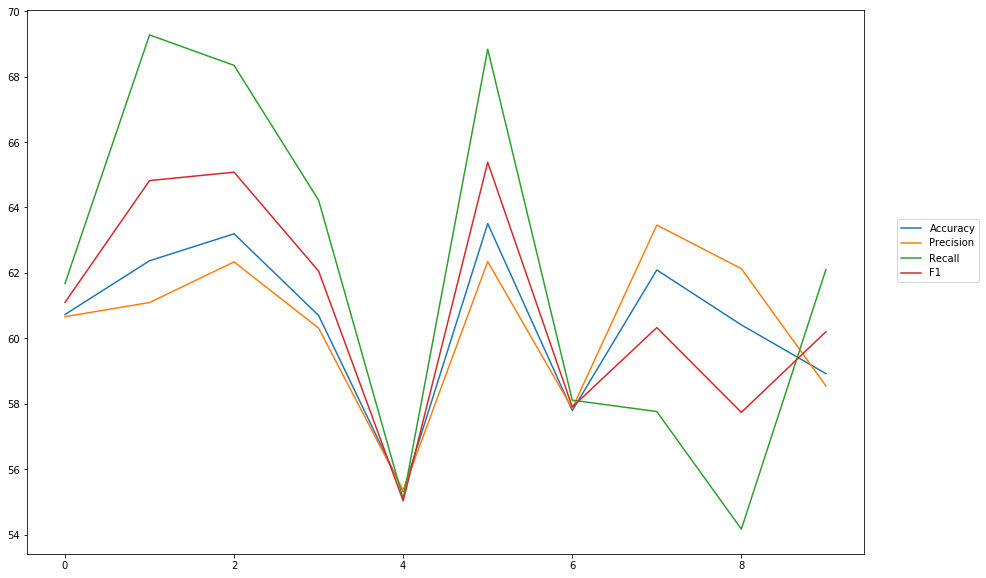

Accuracy: Mean = 60.50% (+/- 2.43%), Max = 63.51%, Min =  55.32%
Precision: Mean = 60.41% (+/- 2.36%), Max = 63.46%, Min =  55.34%
Recall: Mean = 61.96% (+/- 5.36%), Max = 69.27%, Min =  54.17%
F1: Mean = 60.96% (+/- 3.29%), Max = 65.38%, Min =  55.03%


In [55]:
cross_val(model24, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'cnn_1_300_kernel3') 

## CNN one CNN-layer, MaxPooling, 300 filter

In [ ]:
wv_layer25 = Embedding(len(word_index)+1,
                     EMBEDDING_DIM,
                     weights=[embedding_matrix],
                     input_length=MAX_SEQUENCE_LENGTH,
                     trainable=True)

#Input Layer
comment_input25= Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences25 = wv_layer25(comment_input25)

#CNN-Layer
x25 = Conv1D(300, kernel_size =3, activation='relu')(embedded_sequences25)

#Max-Pool
x25 = MaxPooling1D(pool_size=2) (x25)

x25 = Flatten() (x25)

#Output (Dense) Layer
preds25 = Dense(2, activation='softmax')(x25)

# build the model
model25 = Model(inputs=[comment_input25], outputs=preds25)


-----Fold 1--------


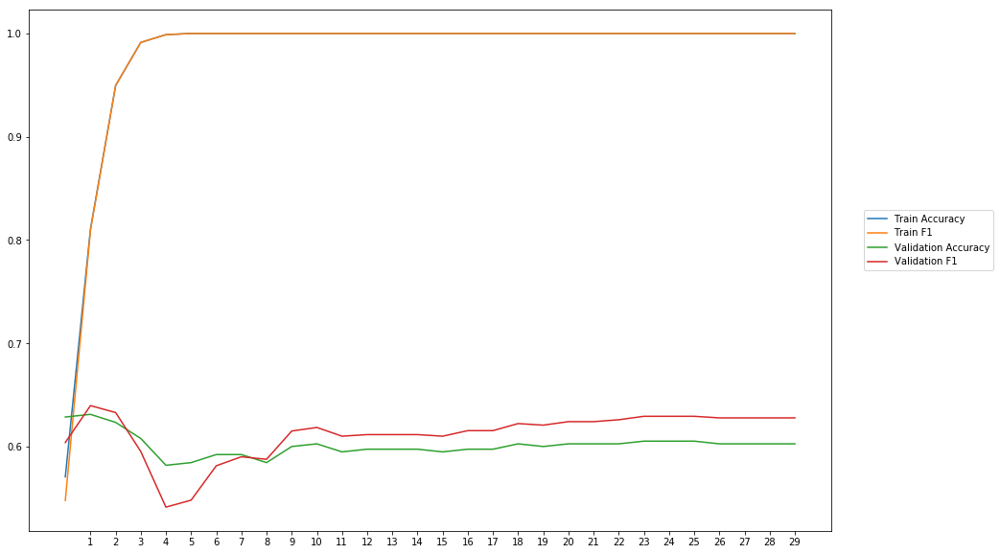

Average Accuracy: 60.14%
Average Precision: 59.79%
Average Recall: 62.88%
Average F1: 61.18%

-----Fold 2--------


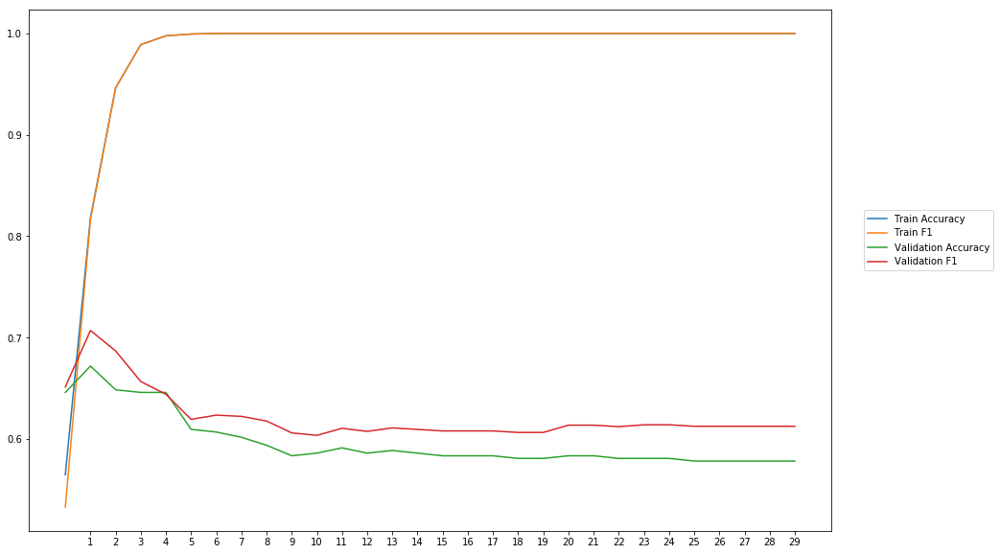

Average Accuracy: 59.67%
Average Precision: 58.87%
Average Recall: 65.87%
Average F1: 62.14%

-----Fold 3--------


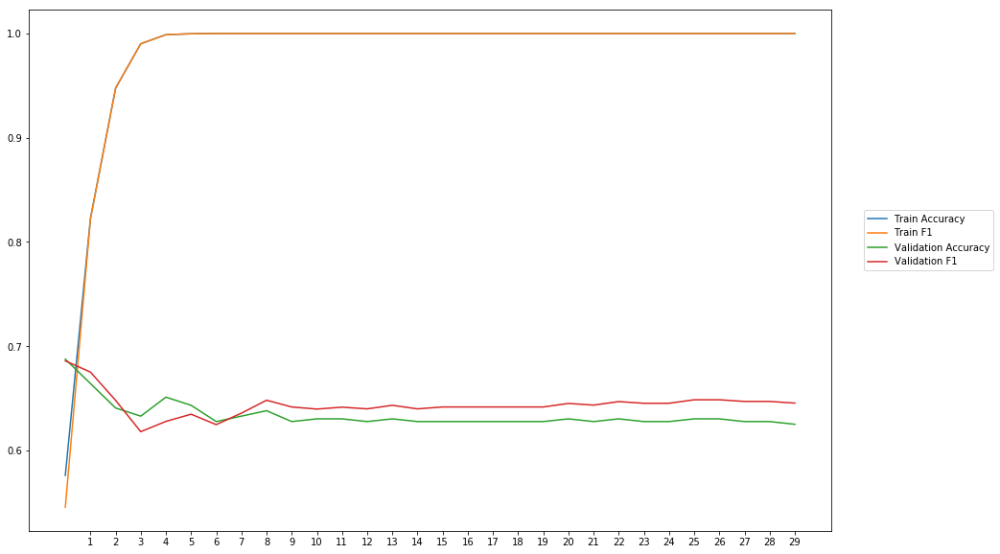

Average Accuracy: 63.38%
Average Precision: 63.04%
Average Recall: 65.87%
Average F1: 64.38%

-----Fold 4--------


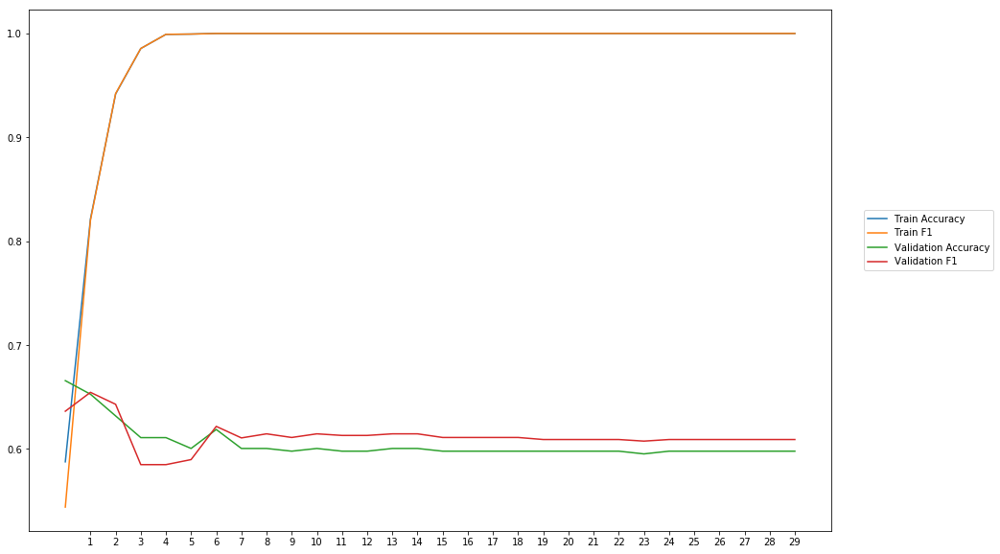

Average Accuracy: 60.51%
Average Precision: 60.41%
Average Recall: 62.19%
Average F1: 61.22%

-----Fold 5--------


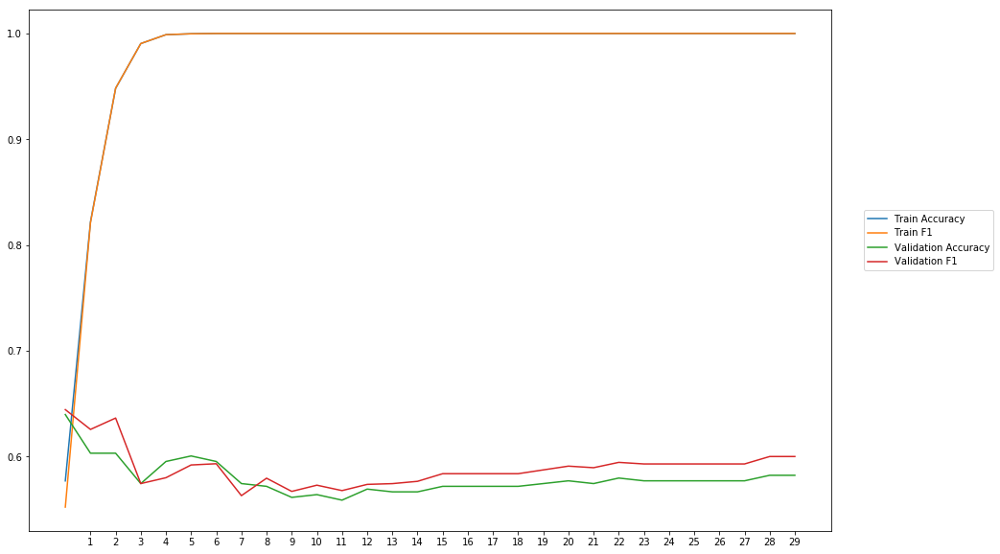

Average Accuracy: 57.95%
Average Precision: 57.75%
Average Recall: 60.26%
Average F1: 58.94%

-----Fold 6--------


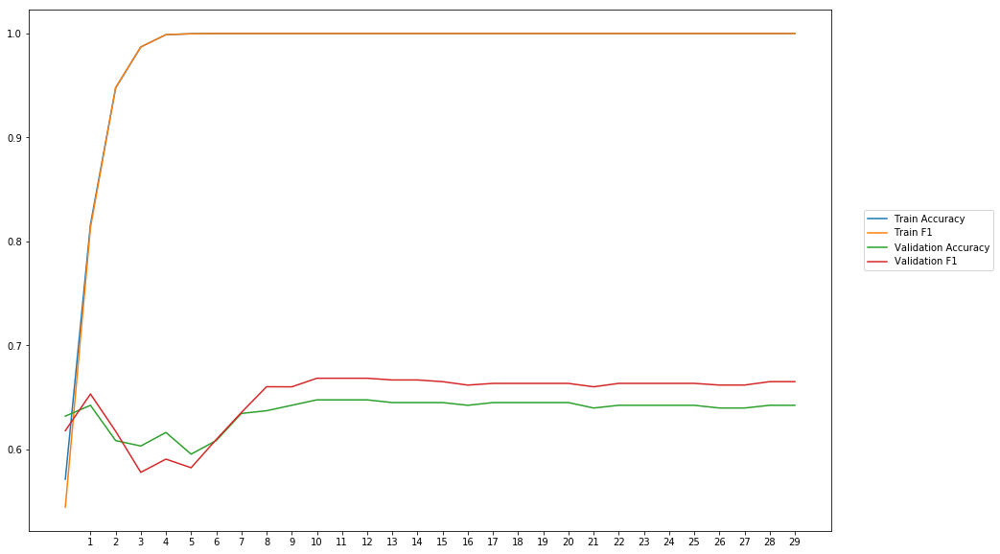

Average Accuracy: 63.64%
Average Precision: 62.75%
Average Recall: 67.53%
Average F1: 64.97%

-----Fold 7--------


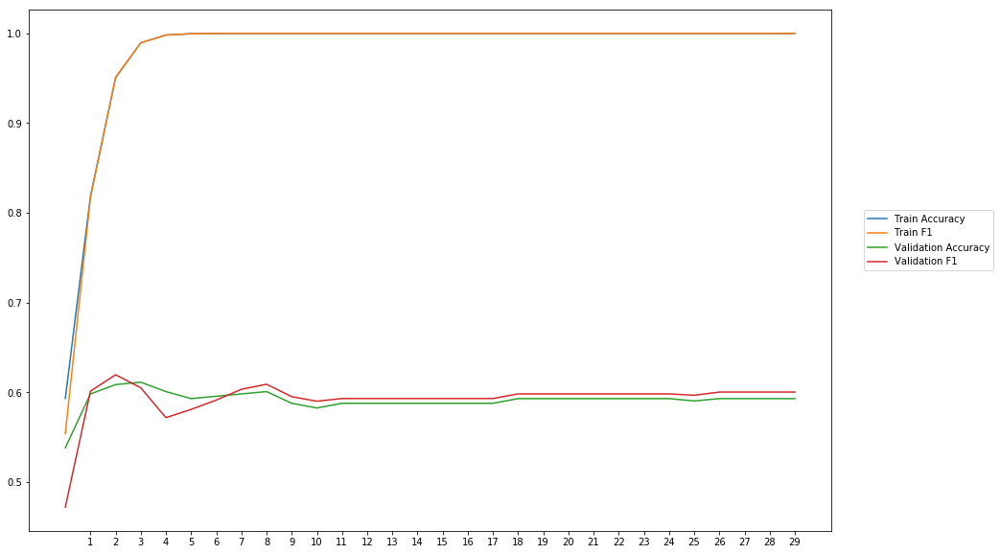

Average Accuracy: 59.11%
Average Precision: 59.17%
Average Recall: 59.39%
Average F1: 59.23%

-----Fold 8--------


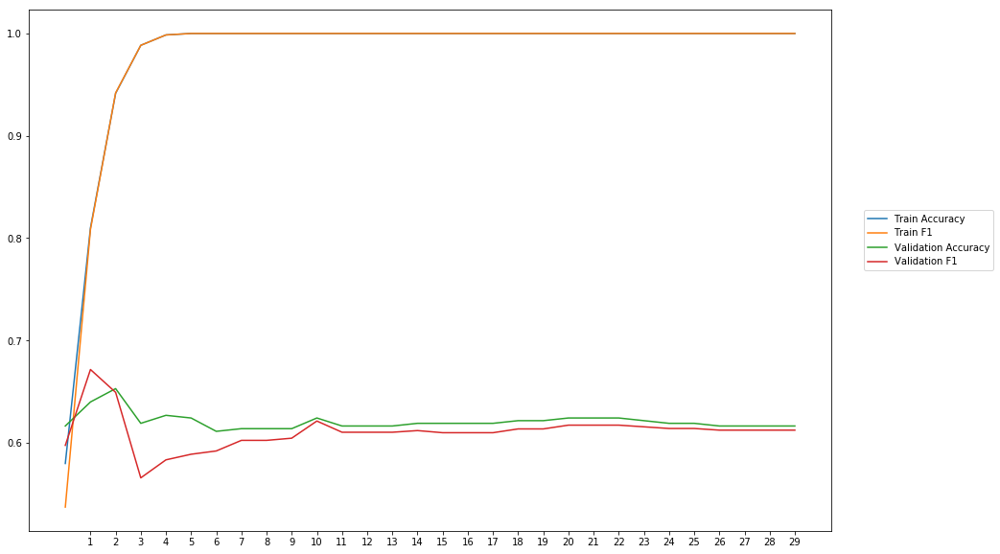

Average Accuracy: 62.05%
Average Precision: 62.90%
Average Recall: 59.48%
Average F1: 61.05%

-----Fold 9--------


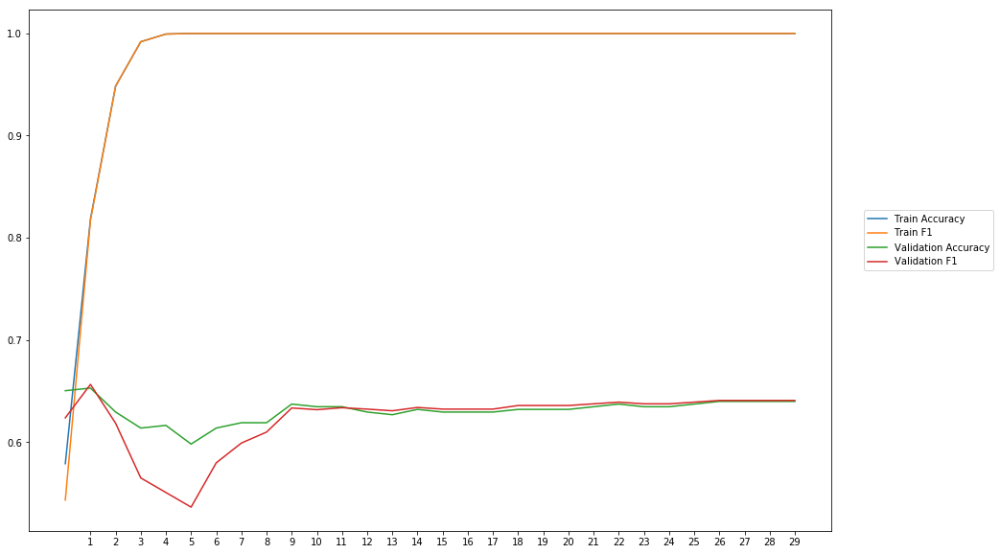

Average Accuracy: 63.08%
Average Precision: 63.79%
Average Recall: 61.15%
Average F1: 62.29%

-----Fold 10--------


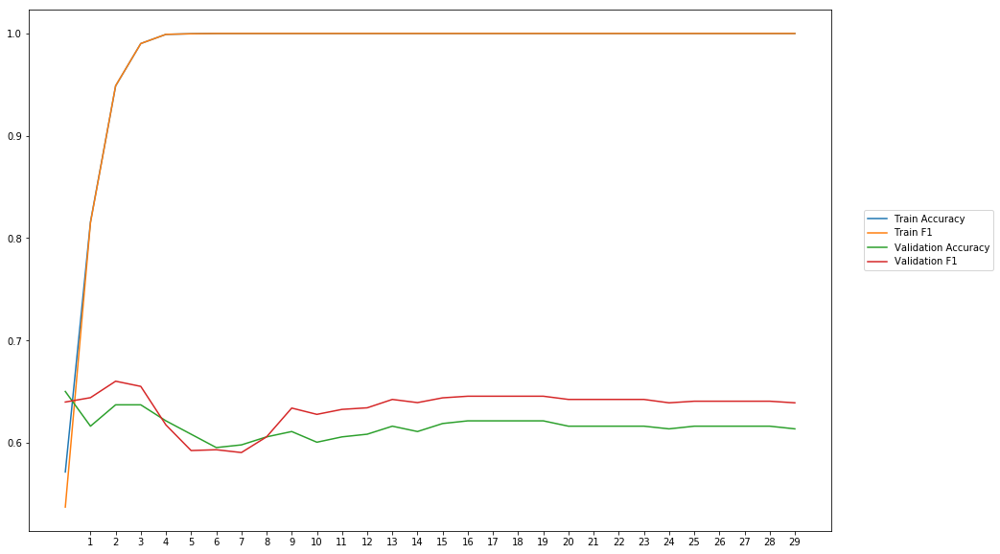

Average Accuracy: 61.61%
Average Precision: 60.70%
Average Recall: 66.68%
Average F1: 63.48%

-------Overallresults-------


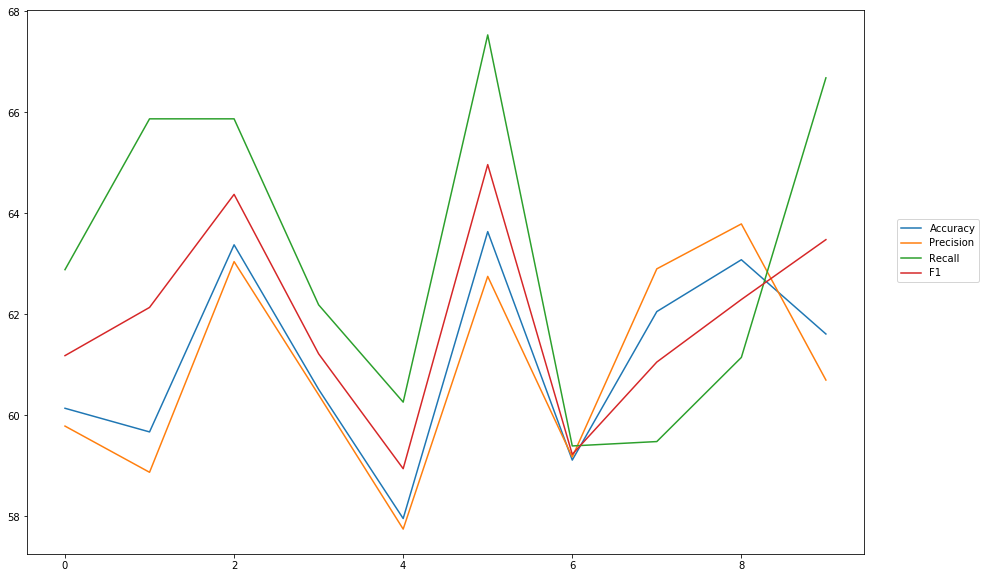

Accuracy: Mean = 61.11% (+/- 1.84%), Max = 63.64%, Min =  57.95%
Precision: Mean = 60.92% (+/- 1.97%), Max = 63.79%, Min =  57.75%
Recall: Mean = 63.13% (+/- 2.96%), Max = 67.53%, Min =  59.39%
F1: Mean = 61.89% (+/- 1.89%), Max = 64.97%, Min =  58.94%


In [56]:
cross_val(model25, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'cnn_1_300_maxpool_kernel3') 

## CNN one CNN-layer, 200 filter

In [ ]:
wv_layer26 = Embedding(len(word_index)+1,
                     EMBEDDING_DIM,
                     weights=[embedding_matrix],
                     input_length=MAX_SEQUENCE_LENGTH,
                     trainable=True)

#Input Layer
comment_input26= Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences26 = wv_layer26(comment_input26)

#CNN-Layer
x26 = Conv1D(200, kernel_size =3, activation='relu')(embedded_sequences26)

x26 = Flatten() (x26)

#Output (Dense) Layer
preds26 = Dense(2, activation='softmax')(x26)

# build the model
model26 = Model(inputs=[comment_input26], outputs=preds26)


-----Fold 1--------


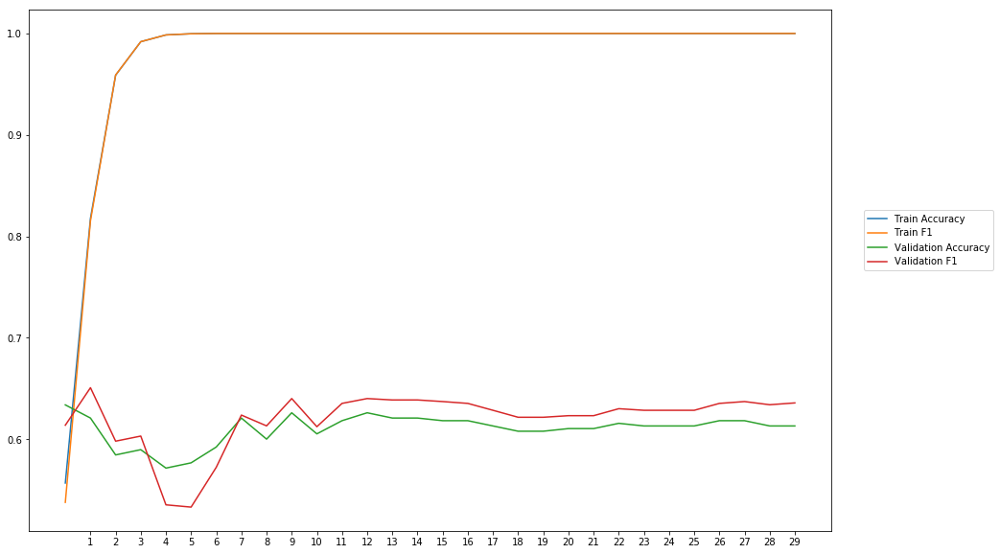

Average Accuracy: 61.03%
Average Precision: 60.60%
Average Recall: 63.63%
Average F1: 61.98%

-----Fold 2--------


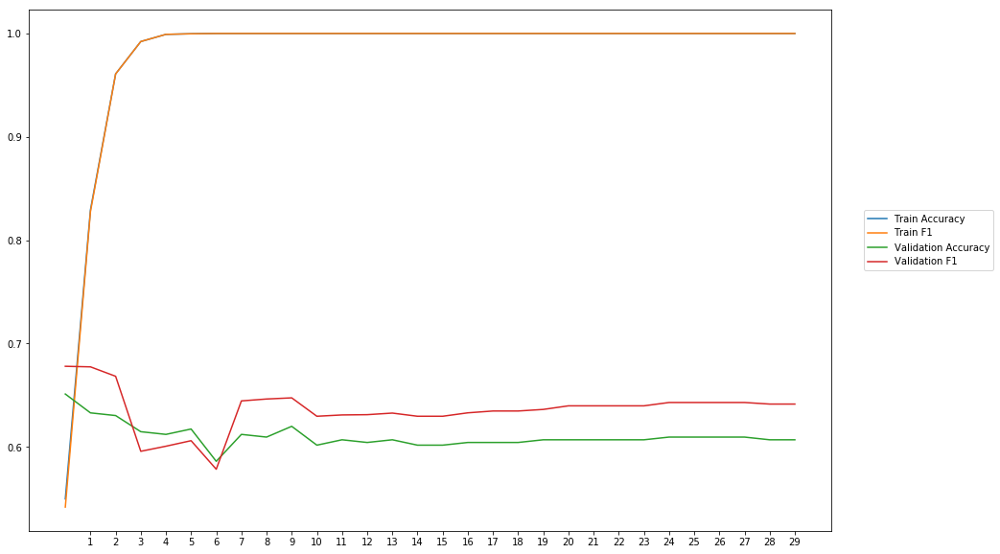

Average Accuracy: 61.02%
Average Precision: 59.94%
Average Recall: 67.93%
Average F1: 63.59%

-----Fold 3--------


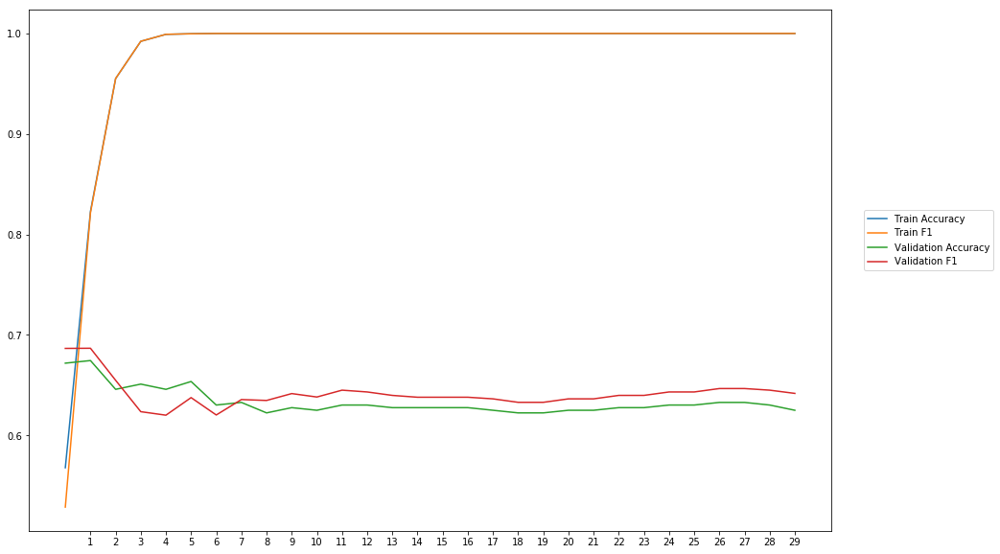

Average Accuracy: 63.36%
Average Precision: 63.18%
Average Recall: 65.27%
Average F1: 64.14%

-----Fold 4--------


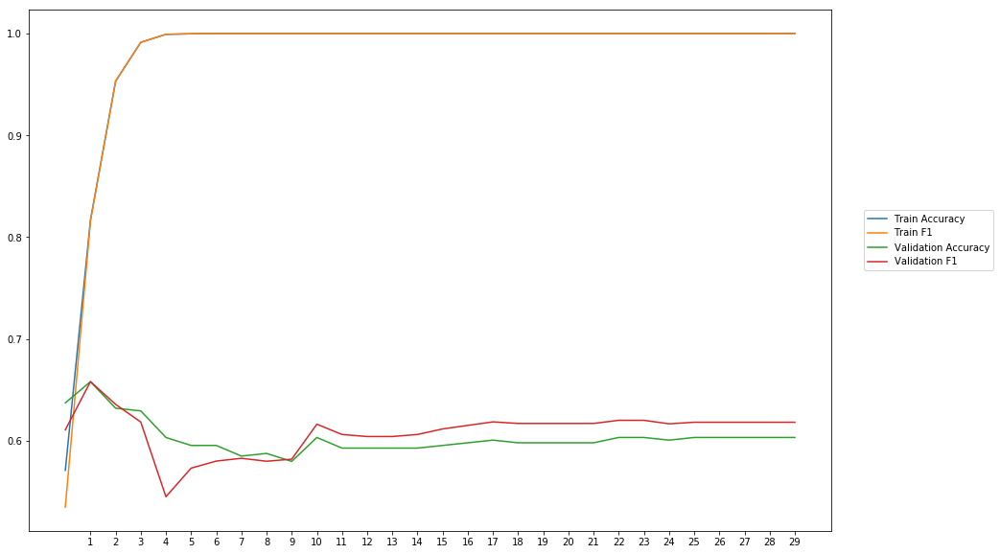

Average Accuracy: 60.28%
Average Precision: 60.21%
Average Recall: 61.77%
Average F1: 60.87%

-----Fold 5--------


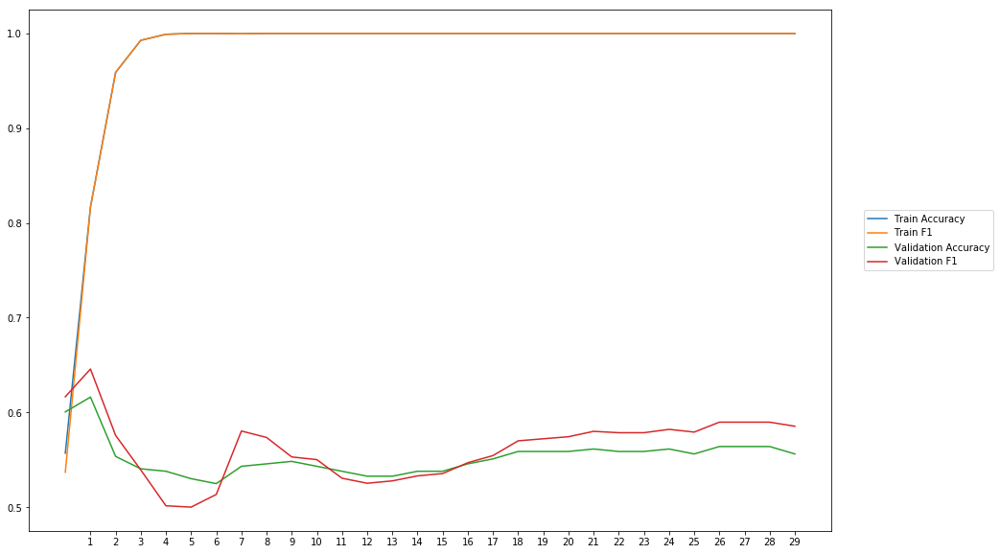

Average Accuracy: 55.27%
Average Precision: 55.09%
Average Recall: 57.60%
Average F1: 56.24%

-----Fold 6--------


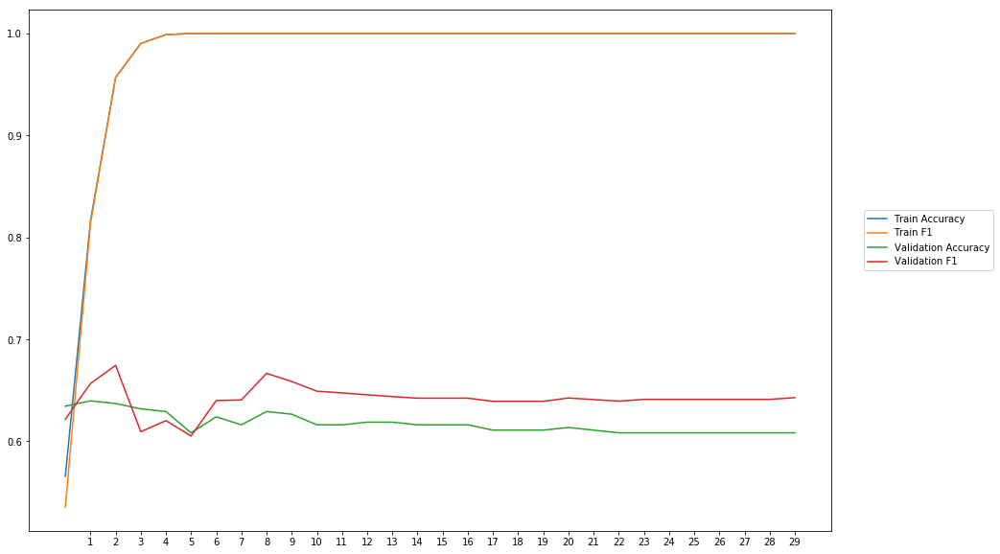

Average Accuracy: 61.73%
Average Precision: 60.56%
Average Recall: 68.35%
Average F1: 64.12%

-----Fold 7--------


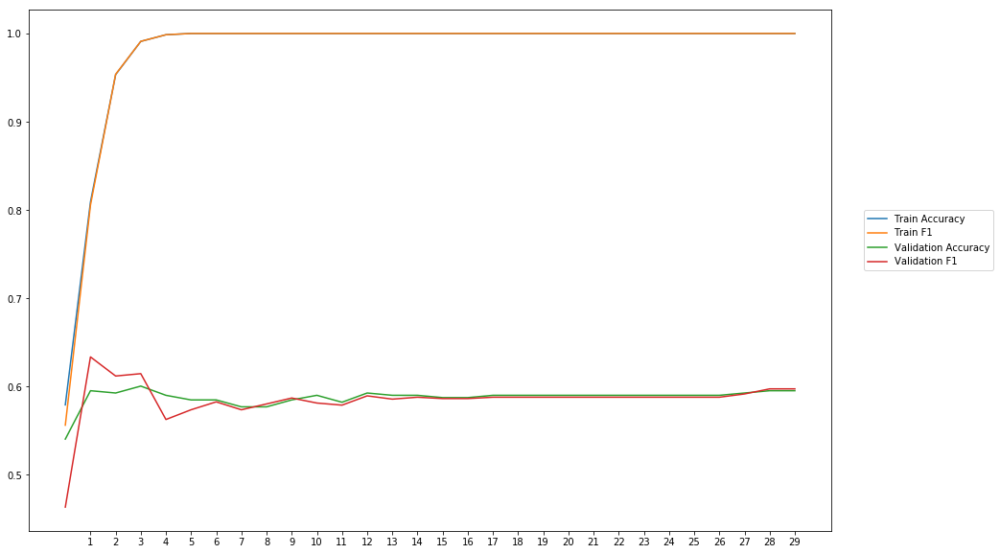

Average Accuracy: 58.77%
Average Precision: 59.00%
Average Recall: 58.14%
Average F1: 58.49%

-----Fold 8--------


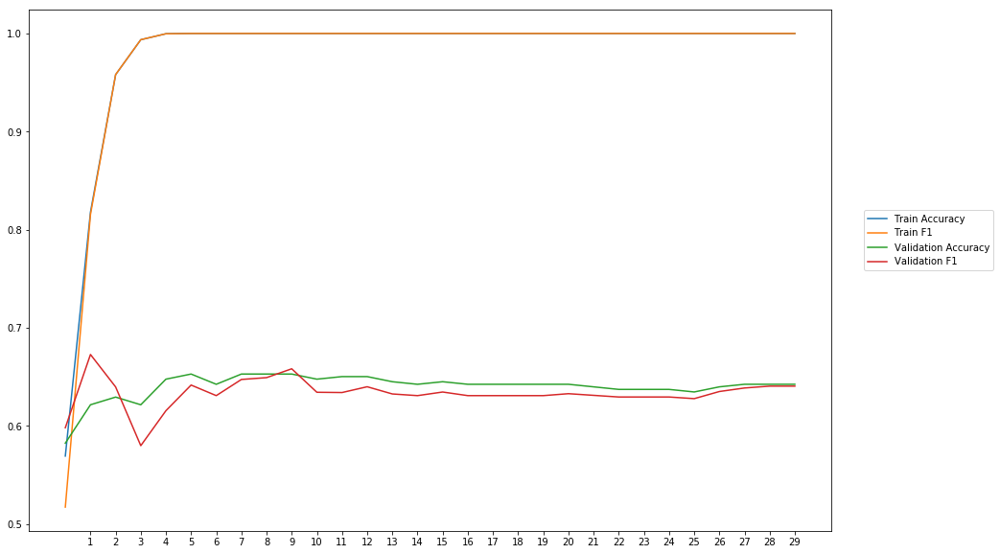

Average Accuracy: 63.99%
Average Precision: 64.81%
Average Recall: 62.08%
Average F1: 63.31%

-----Fold 9--------


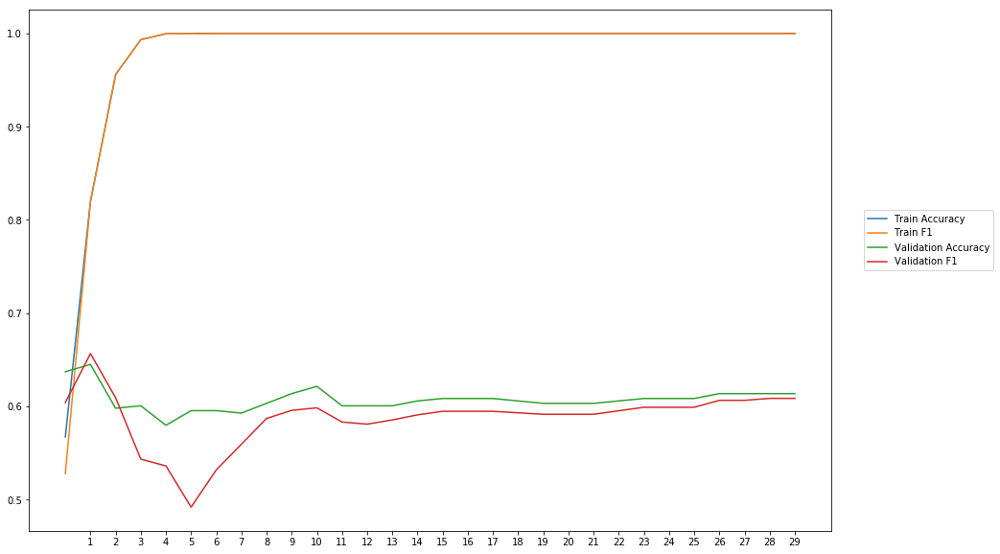

Average Accuracy: 60.71%
Average Precision: 62.03%
Average Recall: 56.11%
Average F1: 58.75%

-----Fold 10--------


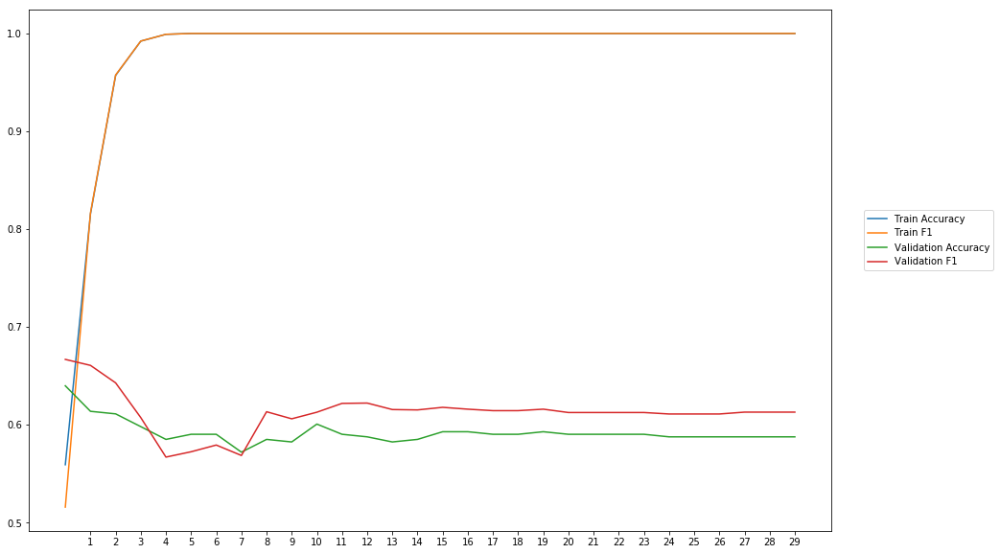

Average Accuracy: 59.18%
Average Precision: 58.44%
Average Recall: 64.46%
Average F1: 61.22%

-------Overallresults-------


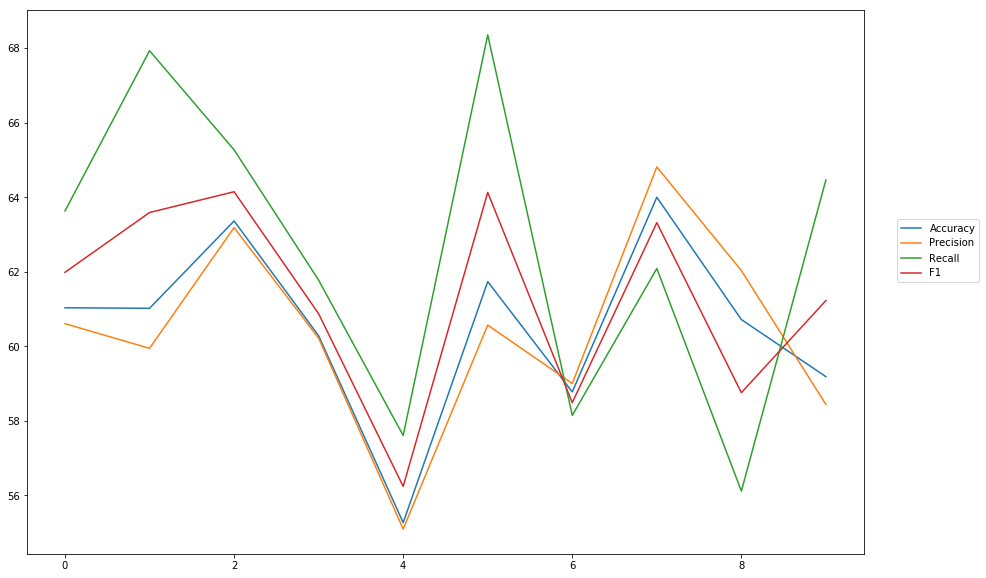

Accuracy: Mean = 60.53% (+/- 2.34%), Max = 63.99%, Min =  55.27%
Precision: Mean = 60.39% (+/- 2.53%), Max = 64.81%, Min =  55.09%
Recall: Mean = 62.53% (+/- 4.01%), Max = 68.35%, Min =  56.11%
F1: Mean = 61.27% (+/- 2.57%), Max = 64.14%, Min =  56.24%


In [57]:
cross_val(model26, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'cnn_1_200_kernel3') 

## CNN one CNN-layer, MaxPooling, 200 filter

In [8]:
wv_layer27 = Embedding(len(word_index)+1,
                     EMBEDDING_DIM,
                     weights=[embedding_matrix],
                     input_length=MAX_SEQUENCE_LENGTH,
                     trainable=True)

#Input Layer
comment_input27= Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences27 = wv_layer27(comment_input27)

#CNN-Layer
x27 = Conv1D(200, kernel_size =3, activation='relu')(embedded_sequences27)

#Max-Pool
x27 = MaxPooling1D(pool_size=2) (x27)

x27 = Flatten() (x27)

#Output (Dense) Layer
preds27 = Dense(2, activation='softmax')(x27)

# build the model
model27 = Model(inputs=[comment_input27], outputs=preds27)


-----Fold 1--------


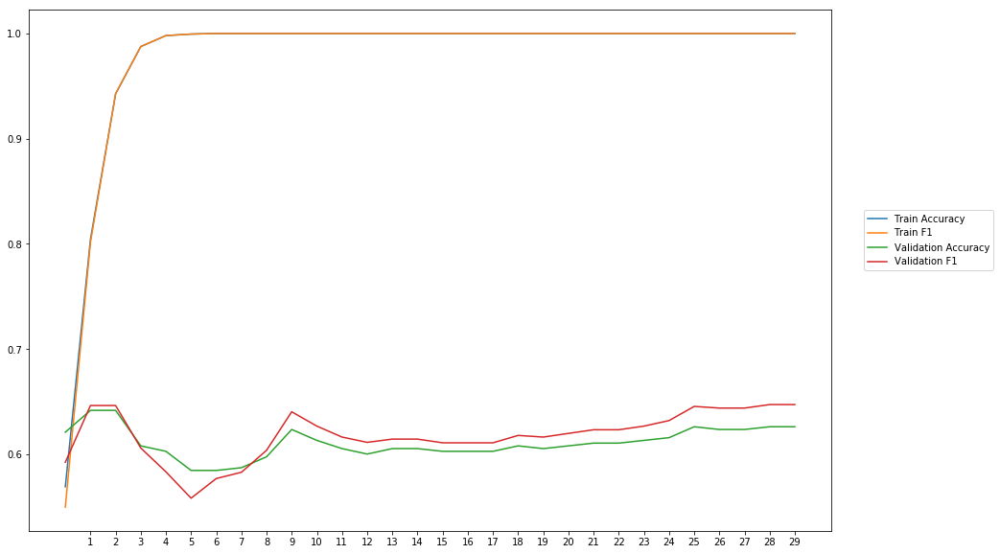

Average Accuracy: 61.07%
Average Precision: 60.81%
Average Recall: 62.92%
Average F1: 61.78%

-----Fold 2--------


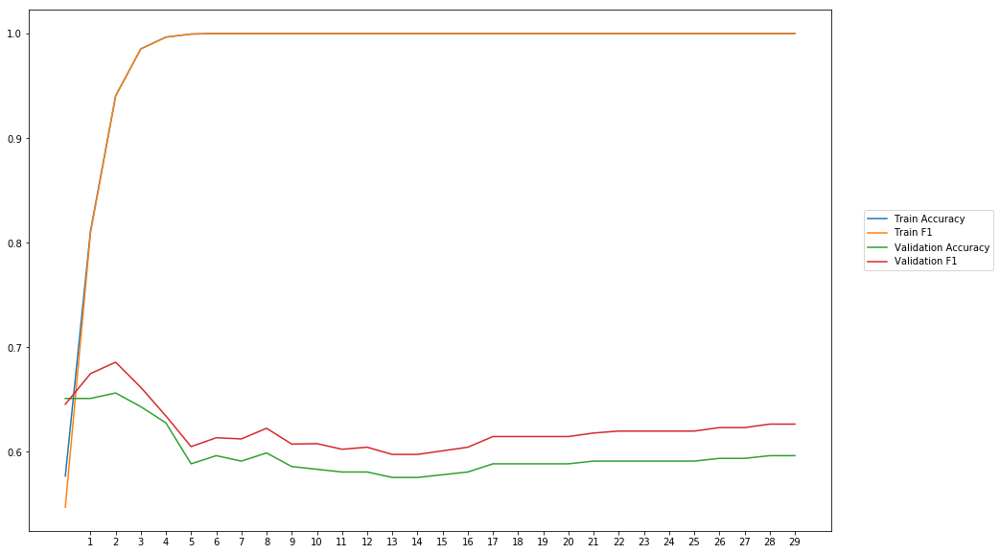

Average Accuracy: 59.78%
Average Precision: 59.02%
Average Recall: 65.60%
Average F1: 62.11%

-----Fold 3--------


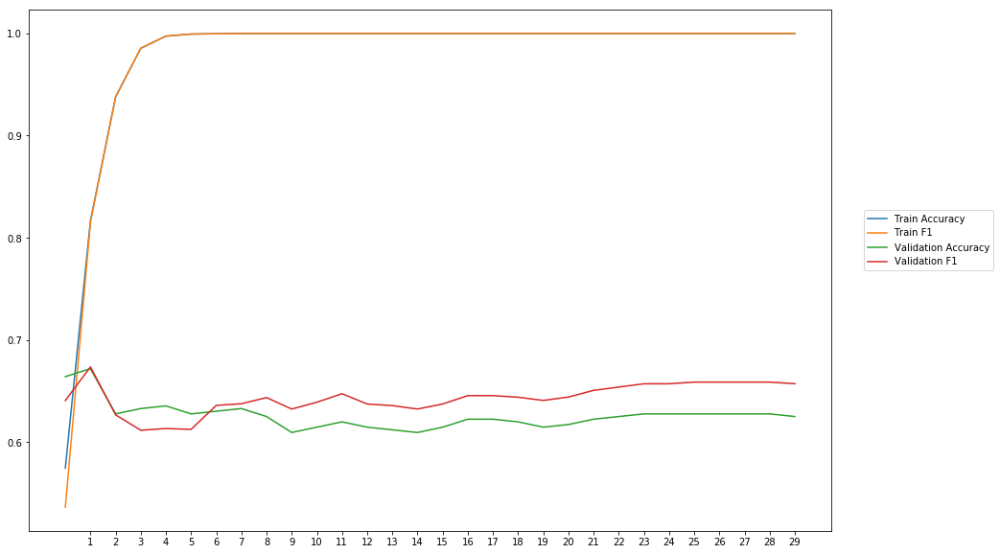

Average Accuracy: 62.59%
Average Precision: 61.93%
Average Recall: 67.13%
Average F1: 64.29%

-----Fold 4--------


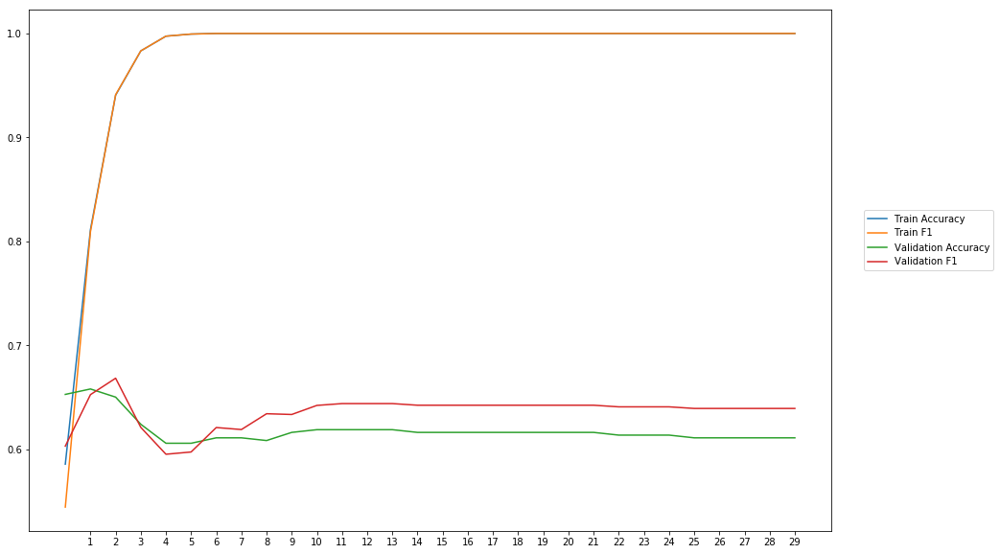

Average Accuracy: 61.81%
Average Precision: 61.04%
Average Recall: 66.65%
Average F1: 63.59%

-----Fold 5--------


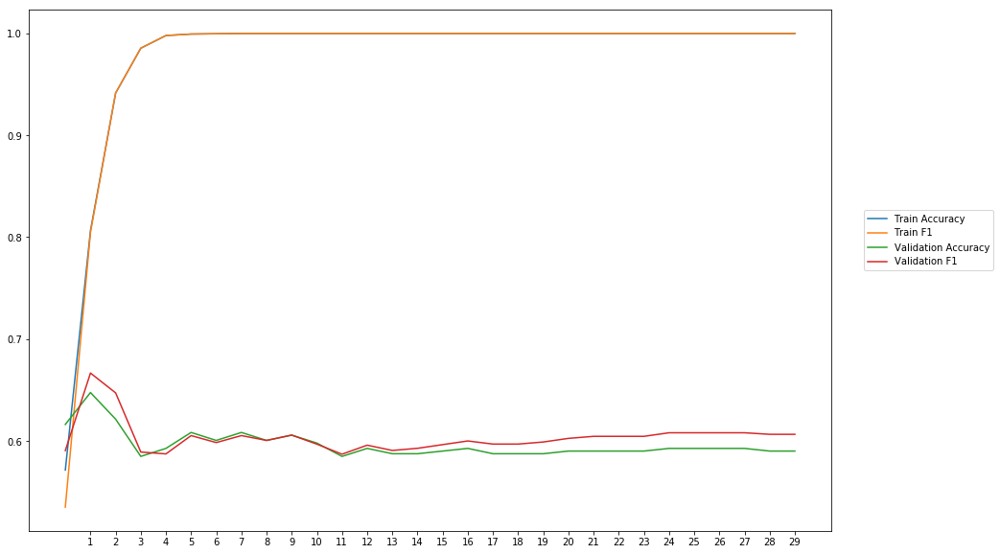

Average Accuracy: 59.64%
Average Precision: 59.47%
Average Recall: 61.37%
Average F1: 60.37%

-----Fold 6--------


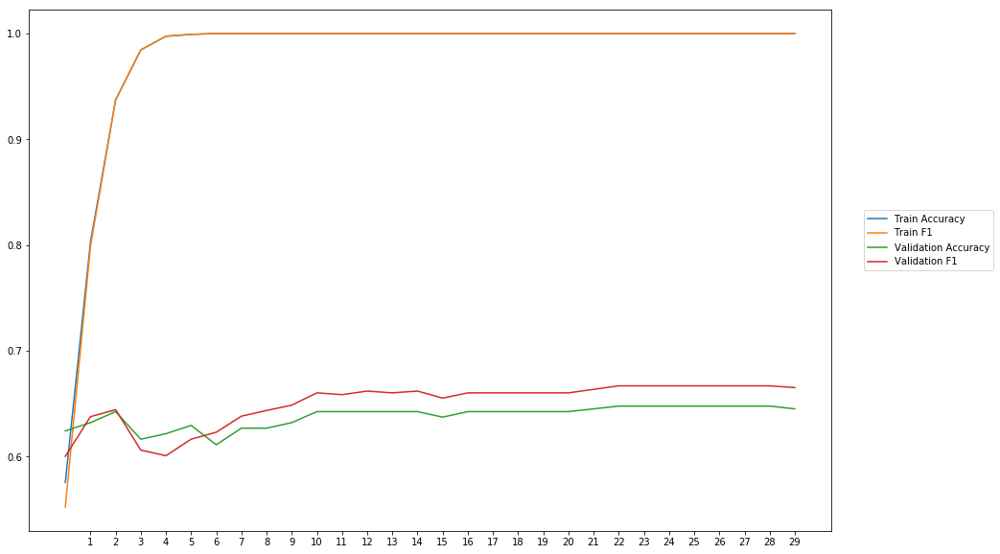

Average Accuracy: 63.81%
Average Precision: 63.03%
Average Recall: 67.31%
Average F1: 65.03%

-----Fold 7--------


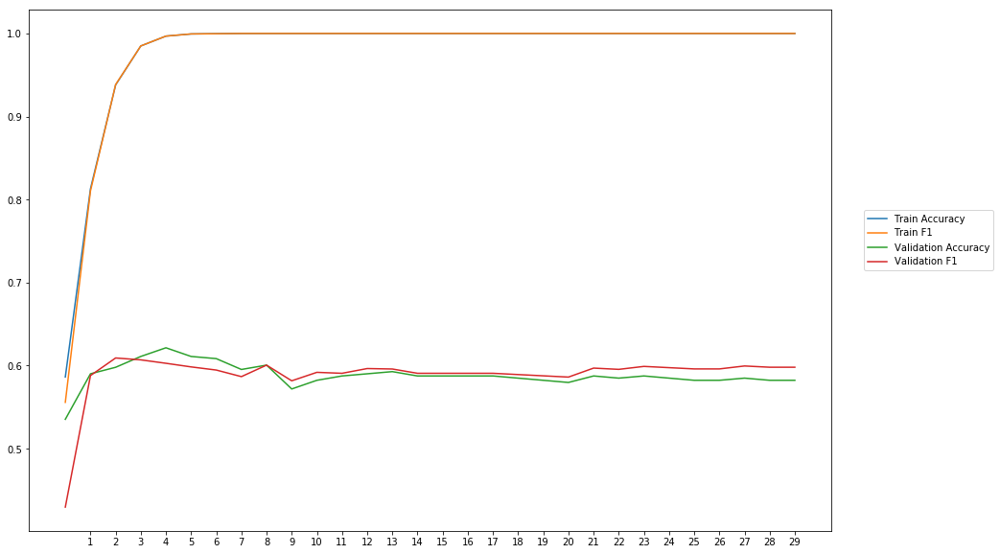

Average Accuracy: 58.83%
Average Precision: 58.92%
Average Recall: 59.13%
Average F1: 58.92%

-----Fold 8--------


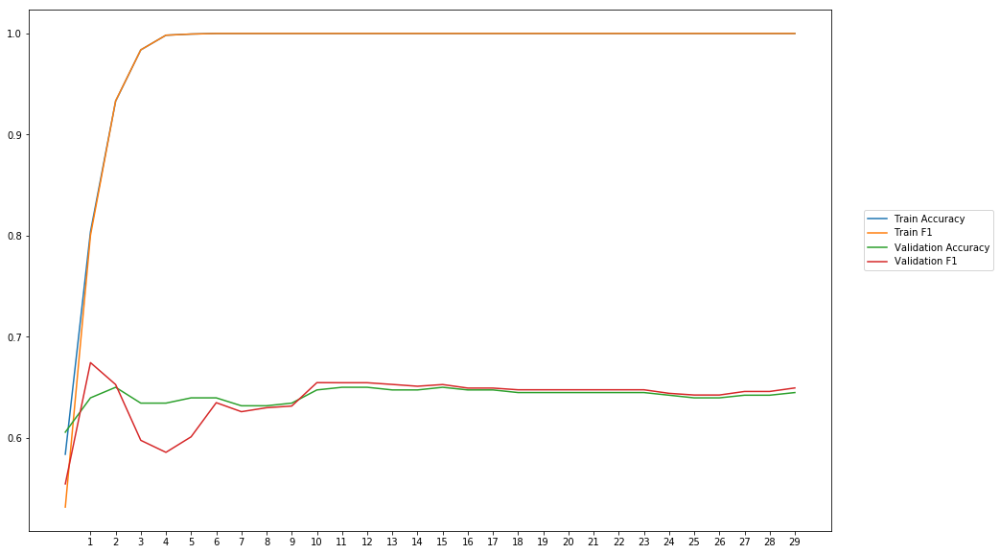

Average Accuracy: 64.17%
Average Precision: 64.56%
Average Recall: 63.49%
Average F1: 63.88%

-----Fold 9--------


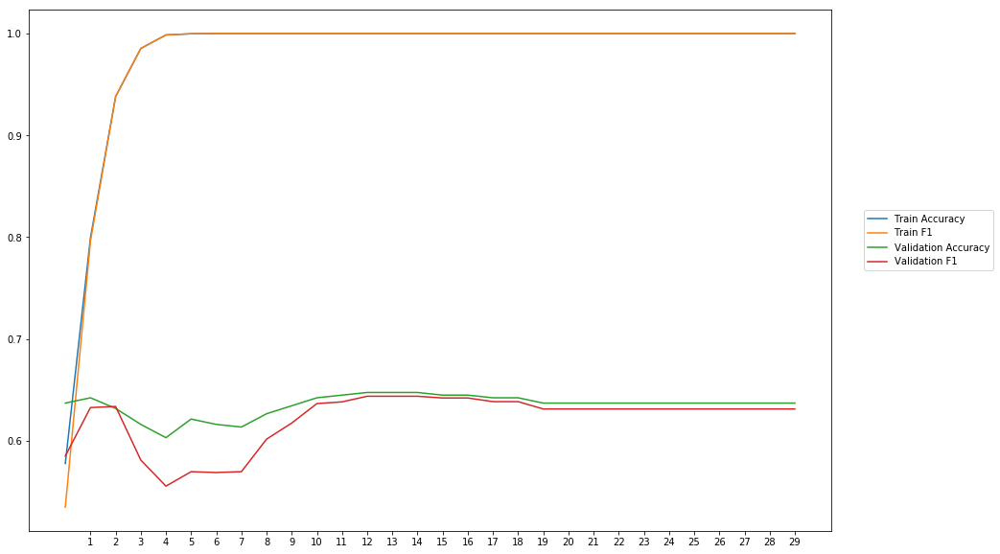

Average Accuracy: 63.52%
Average Precision: 64.75%
Average Recall: 59.86%
Average F1: 62.09%

-----Fold 10--------


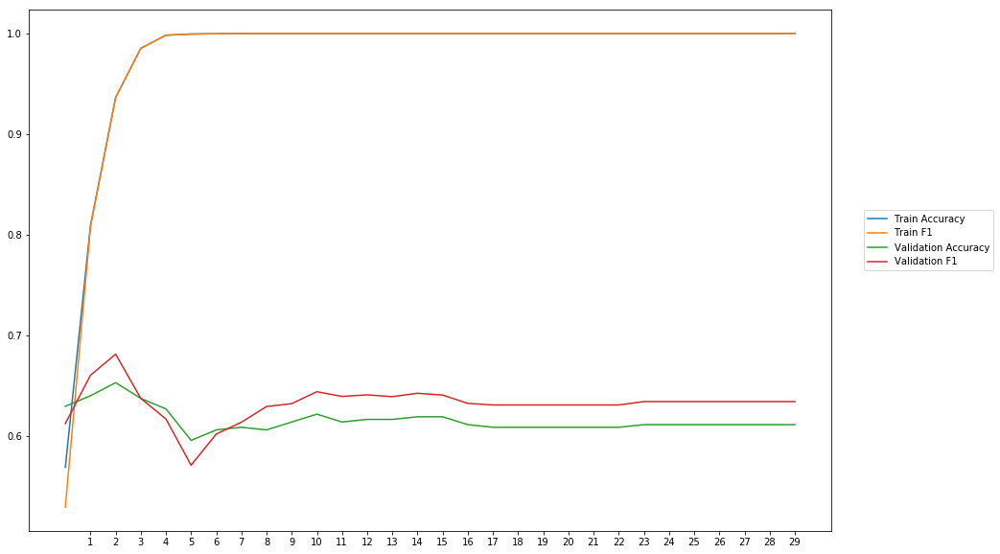

Average Accuracy: 61.52%
Average Precision: 60.75%
Average Recall: 65.95%
Average F1: 63.17%

-------Overallresults-------


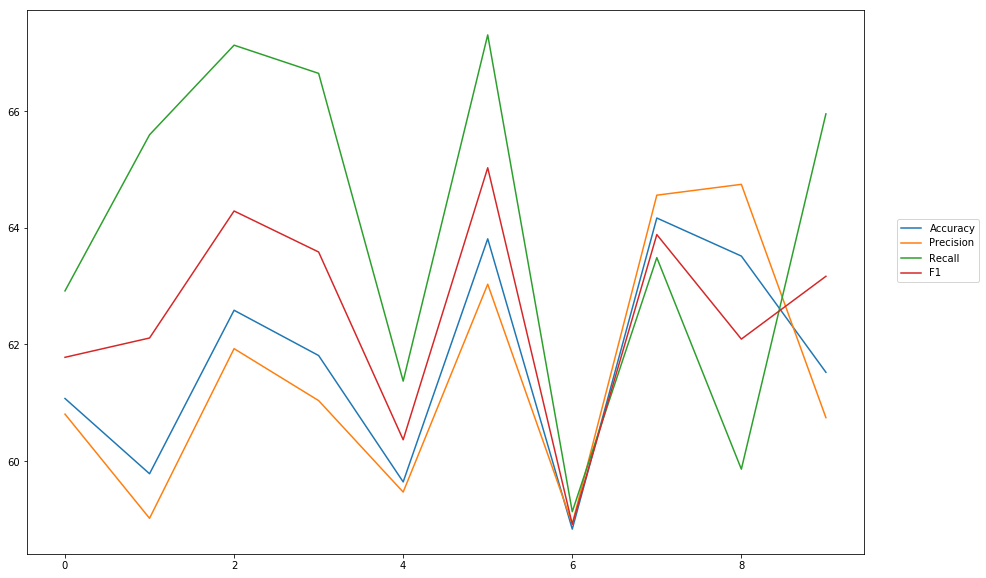

Accuracy: Mean = 61.68% (+/- 1.77%), Max = 64.17%, Min =  58.83%
Precision: Mean = 61.43% (+/- 2.01%), Max = 64.75%, Min =  58.92%
Recall: Mean = 63.94% (+/- 2.89%), Max = 67.31%, Min =  59.13%
F1: Mean = 62.52% (+/- 1.77%), Max = 65.03%, Min =  58.92%


In [58]:
cross_val(model27, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'cnn_1_200_maxpool_kernel3') 

## CNN one CNN-layer, 100 filter

In [ ]:
wv_layer28 = Embedding(len(word_index)+1,
                     EMBEDDING_DIM,
                     weights=[embedding_matrix],
                     input_length=MAX_SEQUENCE_LENGTH,
                     trainable=True)

#Input Layer
comment_input28= Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences28 = wv_layer28(comment_input28)

#CNN-Layer
x28 = Conv1D(100, kernel_size =3, activation='relu')(embedded_sequences28)

x28 = Flatten() (x28)

#Output (Dense) Layer
preds28 = Dense(2, activation='softmax')(x28)

# build the model
model28 = Model(inputs=[comment_input28], outputs=preds28)


-----Fold 1--------


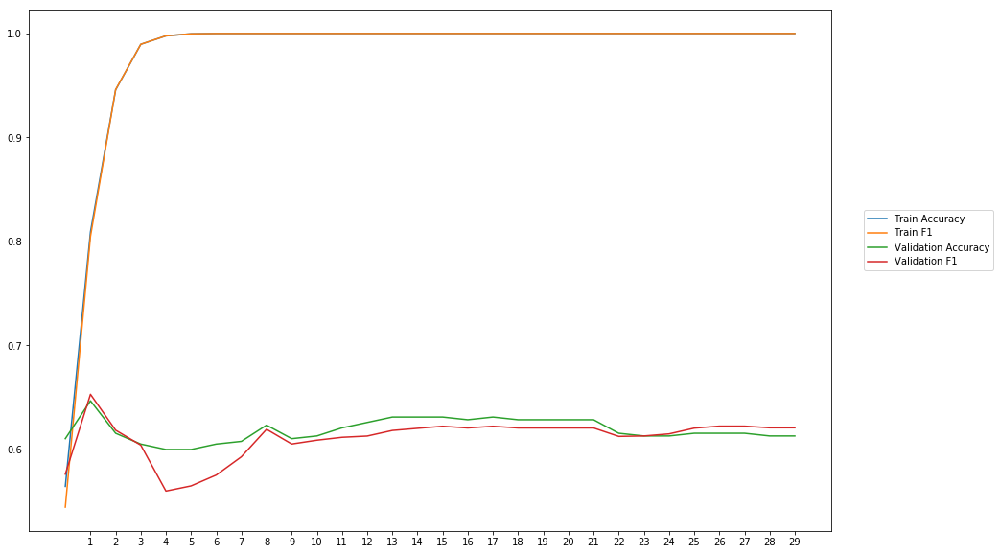

Average Accuracy: 61.89%
Average Precision: 62.54%
Average Recall: 59.90%
Average F1: 61.13%

-----Fold 2--------


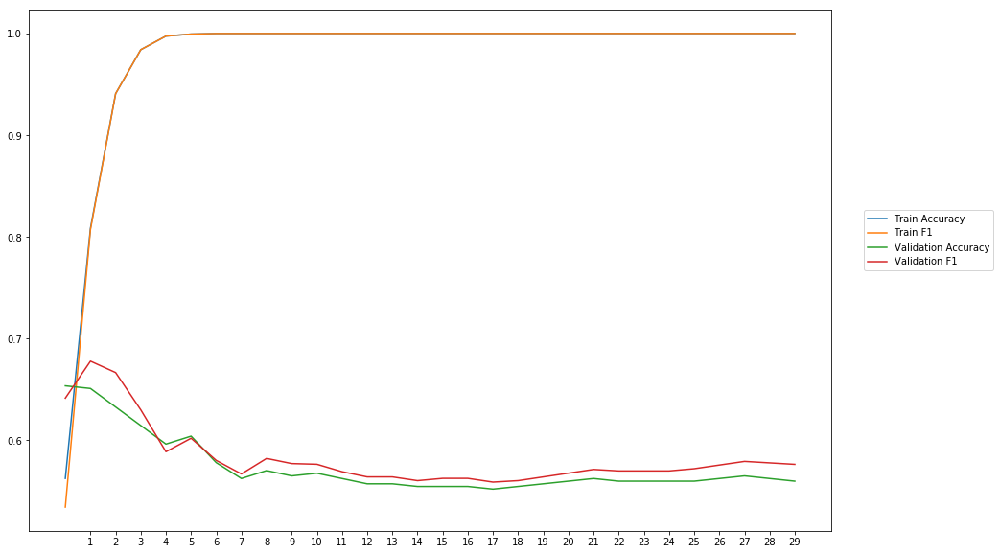

Average Accuracy: 57.38%
Average Precision: 57.34%
Average Recall: 59.34%
Average F1: 58.29%

-----Fold 3--------


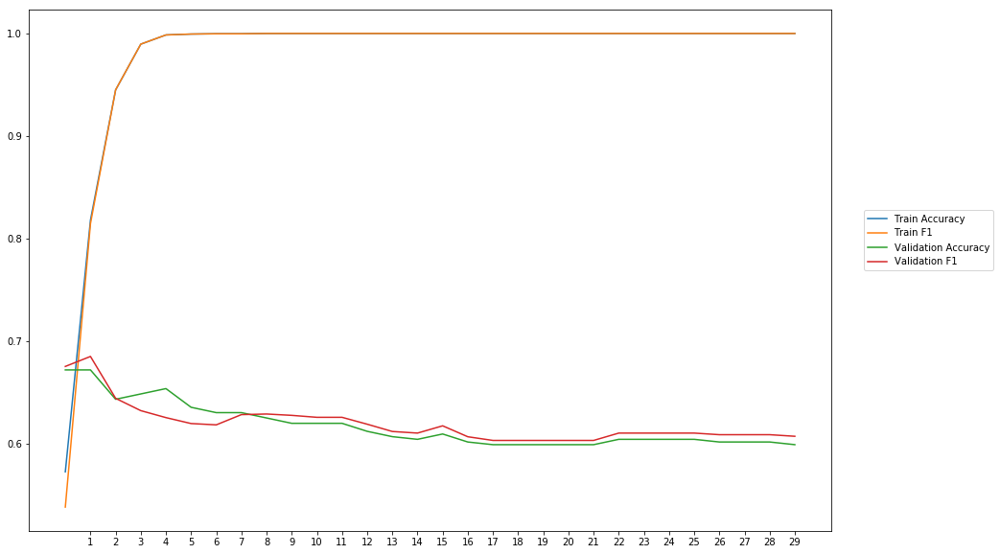

Average Accuracy: 61.73%
Average Precision: 61.97%
Average Recall: 62.04%
Average F1: 61.97%

-----Fold 4--------


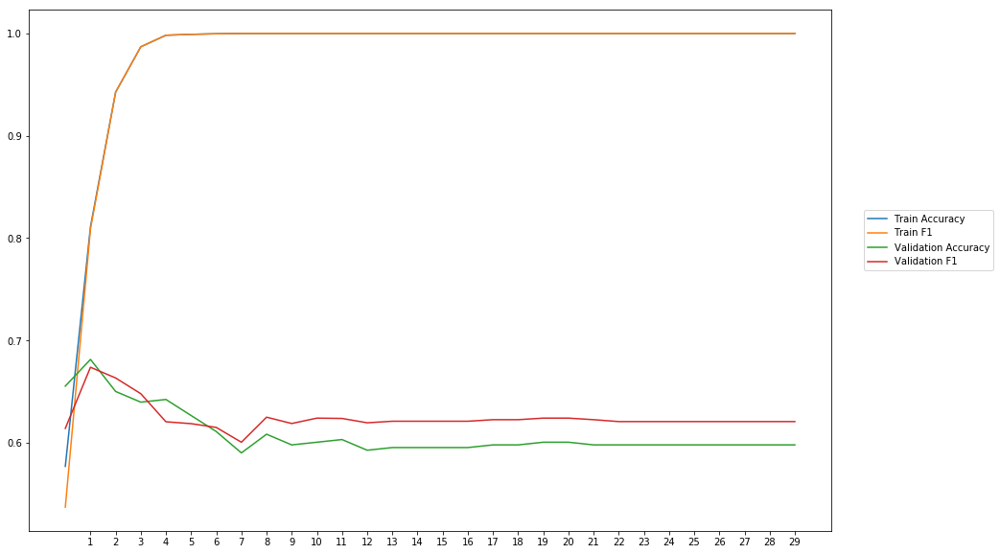

Average Accuracy: 60.86%
Average Precision: 60.39%
Average Recall: 64.86%
Average F1: 62.43%

-----Fold 5--------


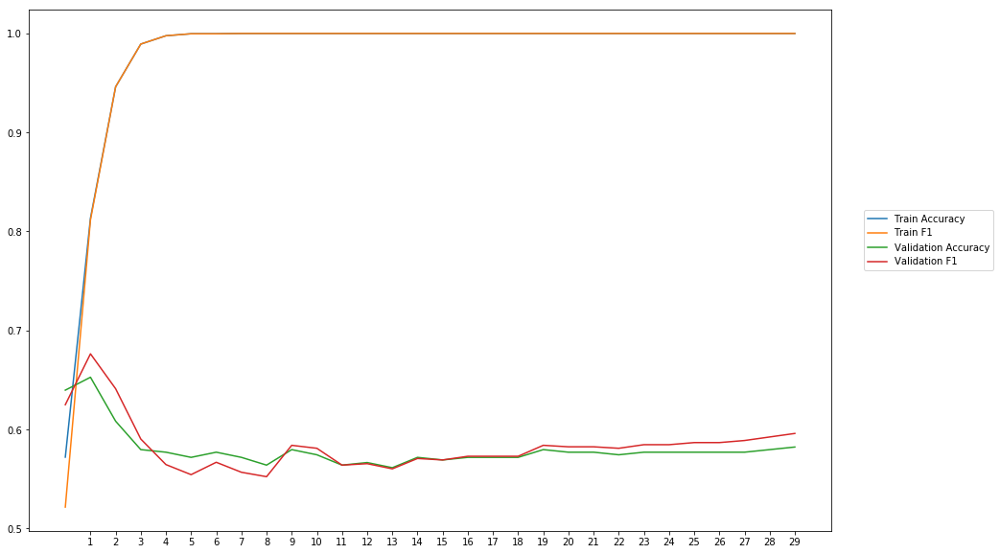

Average Accuracy: 58.00%
Average Precision: 58.00%
Average Recall: 58.70%
Average F1: 58.30%

-----Fold 6--------


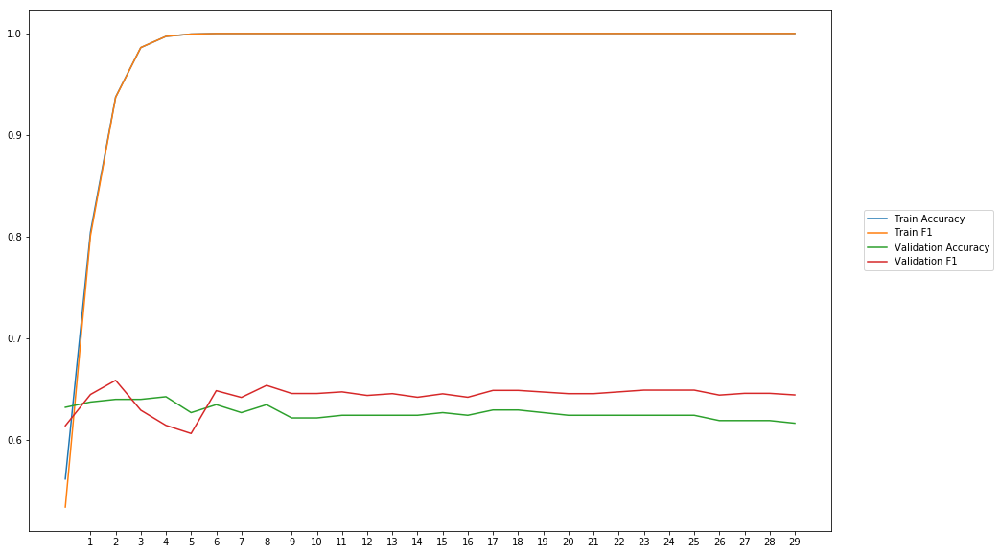

Average Accuracy: 62.68%
Average Precision: 61.89%
Average Recall: 66.98%
Average F1: 64.24%

-----Fold 7--------


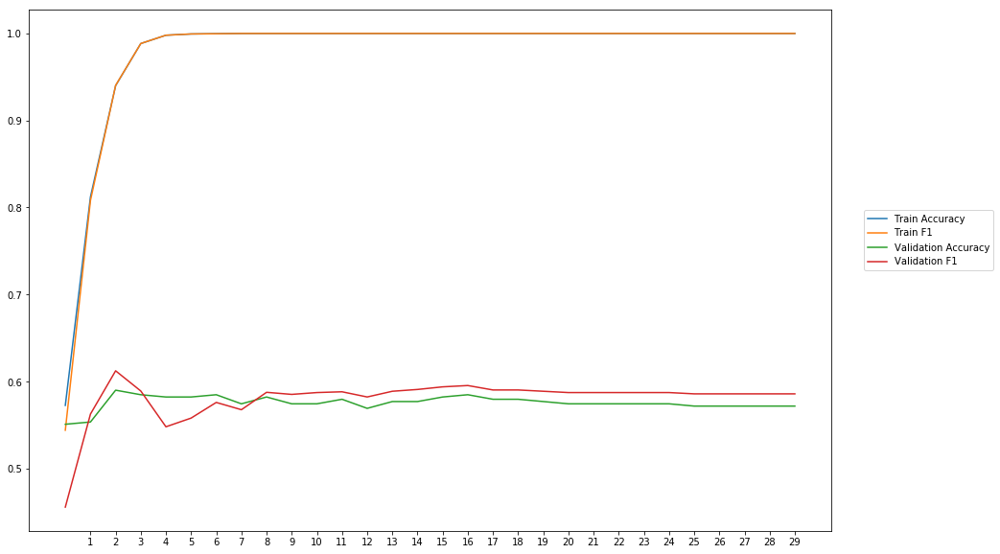

Average Accuracy: 57.57%
Average Precision: 57.56%
Average Recall: 58.73%
Average F1: 58.02%

-----Fold 8--------


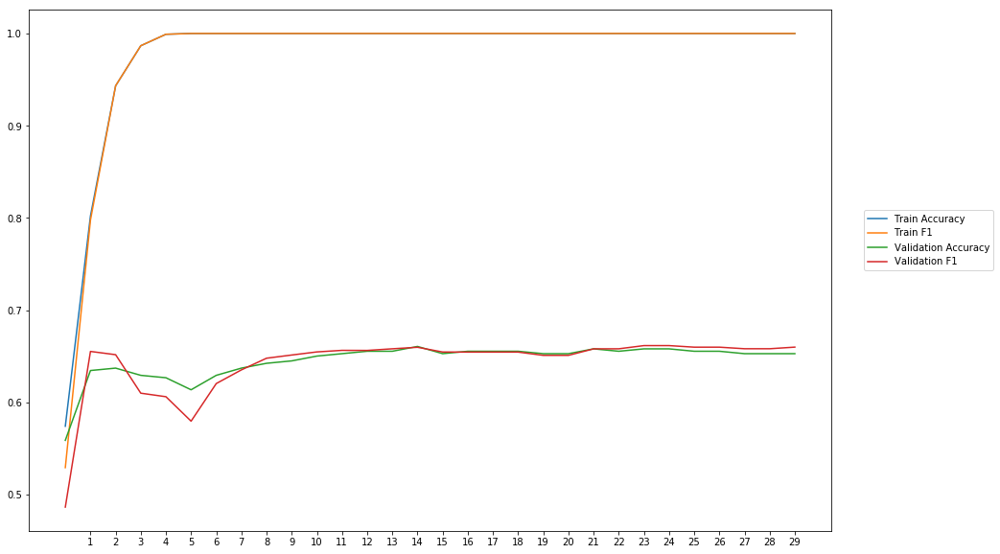

Average Accuracy: 64.50%
Average Precision: 64.70%
Average Recall: 64.03%
Average F1: 64.27%

-----Fold 9--------


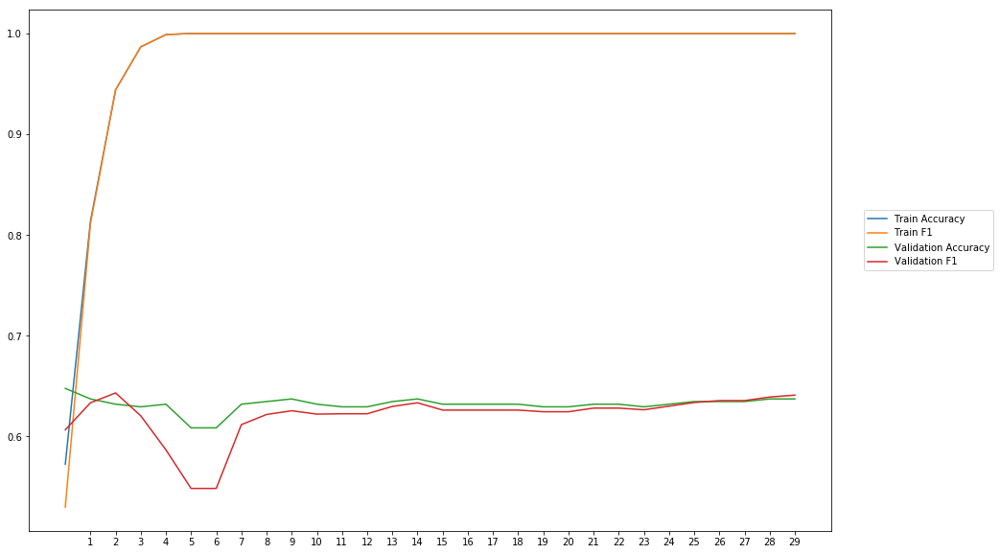

Average Accuracy: 63.16%
Average Precision: 64.15%
Average Recall: 60.36%
Average F1: 62.08%

-----Fold 10--------


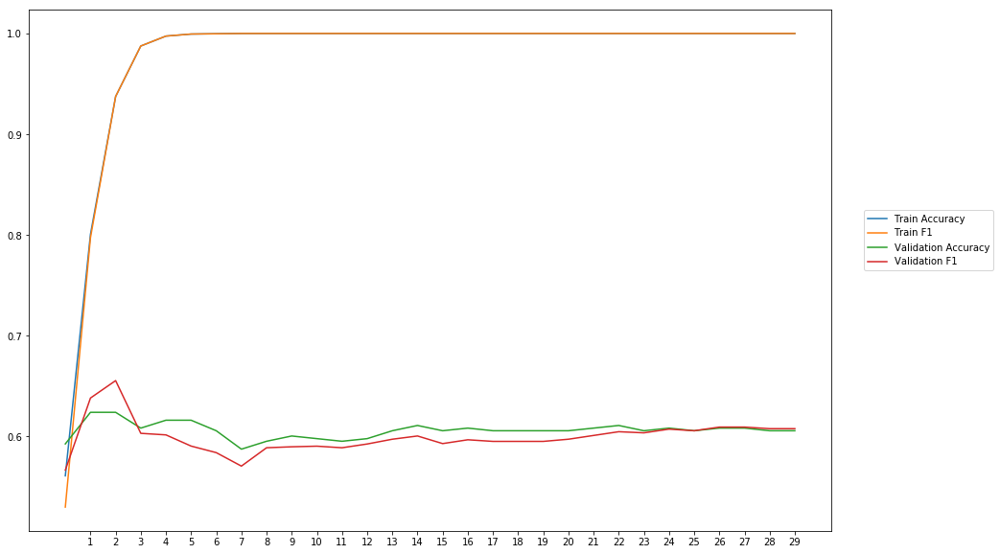

Average Accuracy: 60.61%
Average Precision: 61.12%
Average Recall: 58.94%
Average F1: 59.96%

-------Overallresults-------


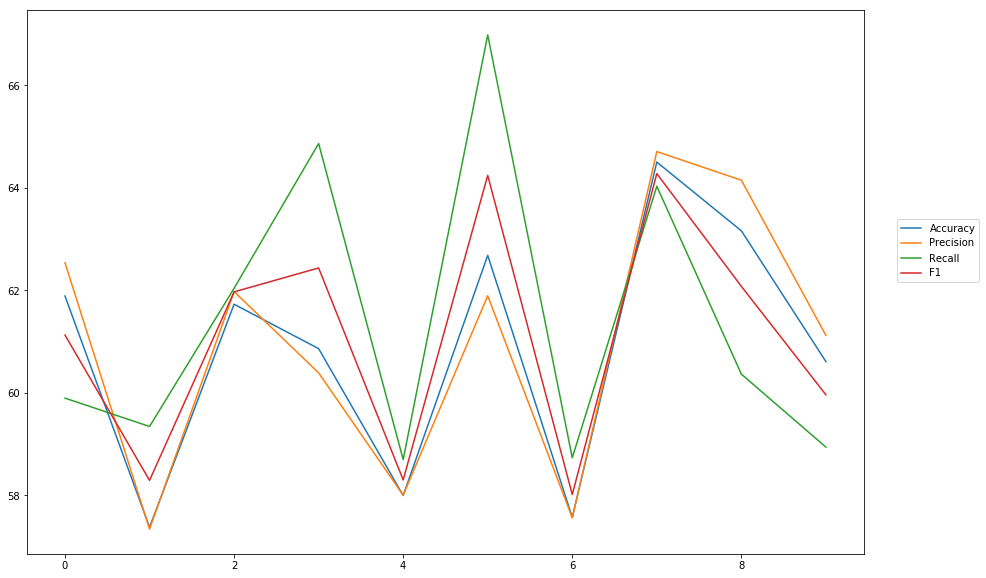

Accuracy: Mean = 60.84% (+/- 2.34%), Max = 64.50%, Min =  57.38%
Precision: Mean = 60.97% (+/- 2.50%), Max = 64.70%, Min =  57.34%
Recall: Mean = 61.39% (+/- 2.80%), Max = 66.98%, Min =  58.70%
F1: Mean = 61.07% (+/- 2.23%), Max = 64.27%, Min =  58.02%


In [59]:
cross_val(model28, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'cnn_1_100_kernel3') 

## CNN one CNN-layer, MaxPooling, 100 filter

In [ ]:
wv_layer29 = Embedding(len(word_index)+1,
                     EMBEDDING_DIM,
                     weights=[embedding_matrix],
                     input_length=MAX_SEQUENCE_LENGTH,
                     trainable=True)

#Input Layer
comment_input29= Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences29 = wv_layer29(comment_input29)

#CNN-Layer
x29 = Conv1D(100, kernel_size =3, activation='relu')(embedded_sequences29)

#Max-Pool
x29 = MaxPooling1D(pool_size=2) (x29)

x29 = Flatten() (x29)

#Output (Dense) Layer
preds29 = Dense(2, activation='softmax')(x29)

# build the model
model29 = Model(inputs=[comment_input29], outputs=preds29)


-----Fold 1--------


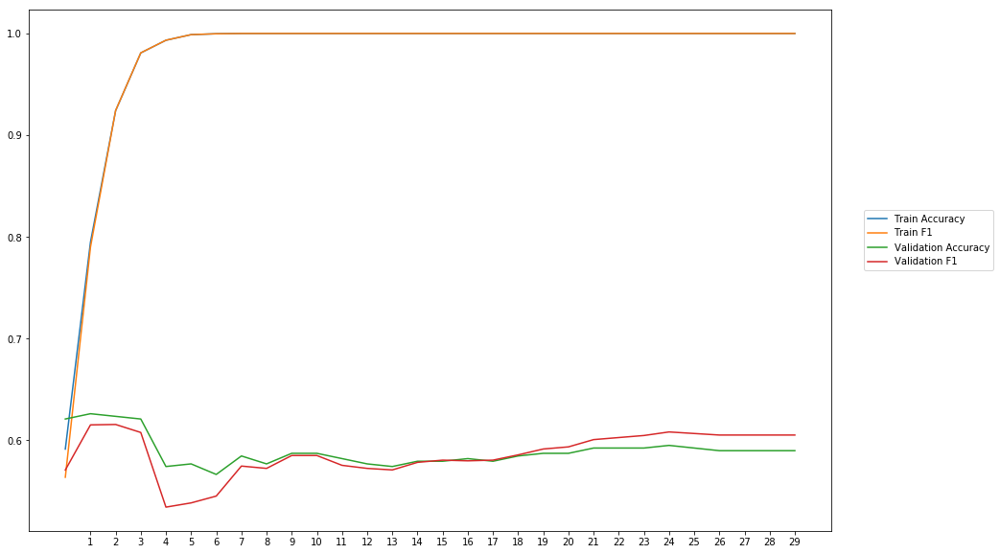

Average Accuracy: 58.92%
Average Precision: 59.25%
Average Recall: 58.22%
Average F1: 58.64%

-----Fold 2--------


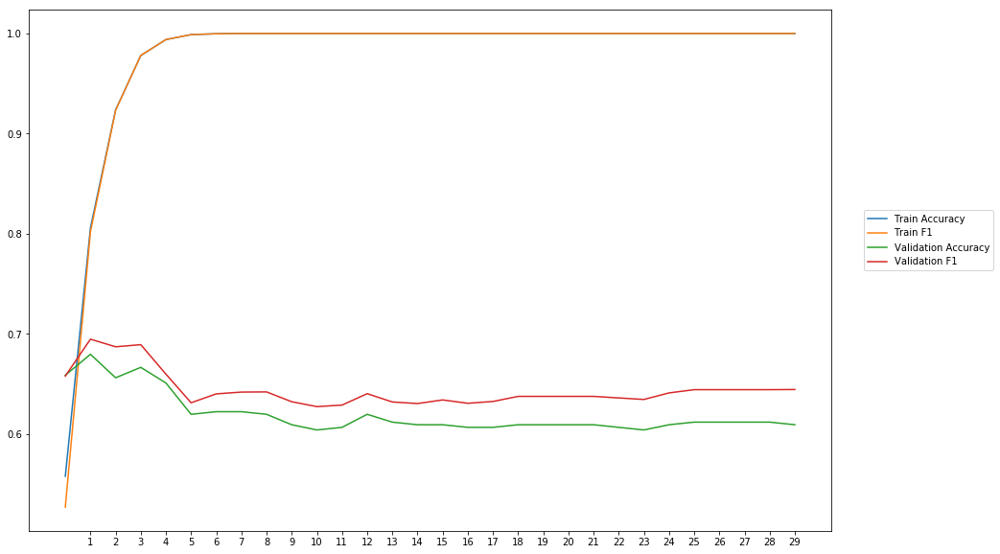

Average Accuracy: 61.99%
Average Precision: 60.89%
Average Recall: 68.39%
Average F1: 64.40%

-----Fold 3--------


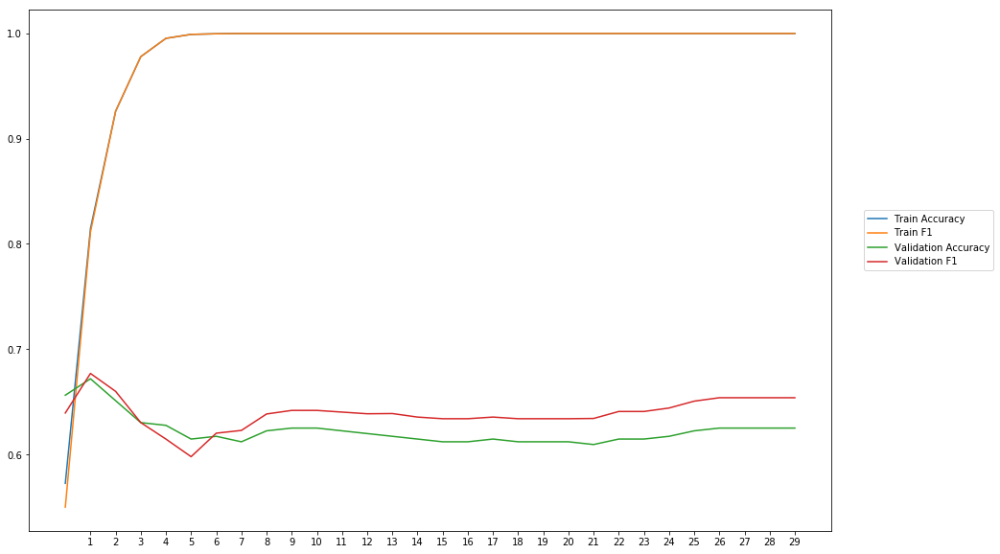

Average Accuracy: 62.27%
Average Precision: 61.63%
Average Recall: 66.49%
Average F1: 63.89%

-----Fold 4--------


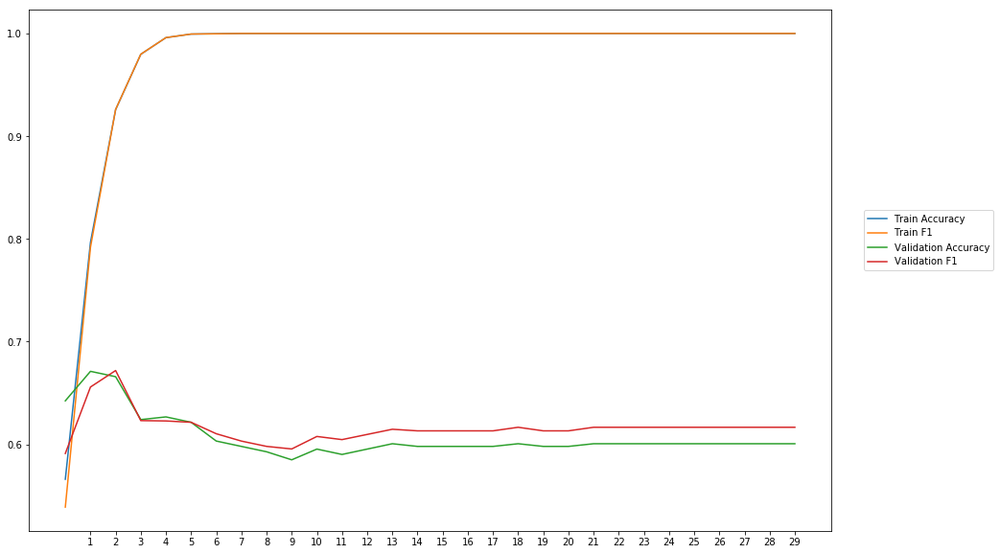

Average Accuracy: 60.68%
Average Precision: 60.51%
Average Recall: 62.85%
Average F1: 61.58%

-----Fold 5--------


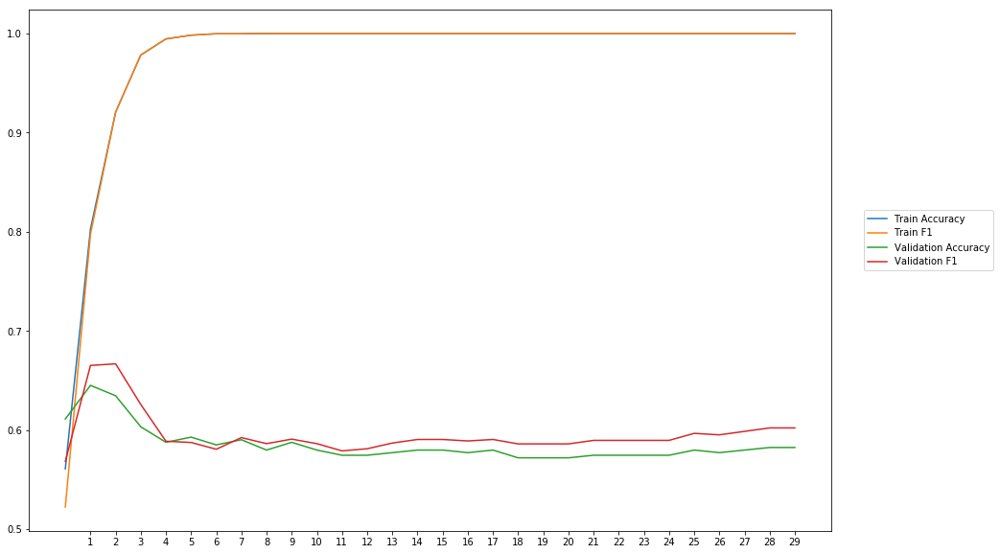

Average Accuracy: 58.50%
Average Precision: 58.26%
Average Recall: 60.94%
Average F1: 59.51%

-----Fold 6--------


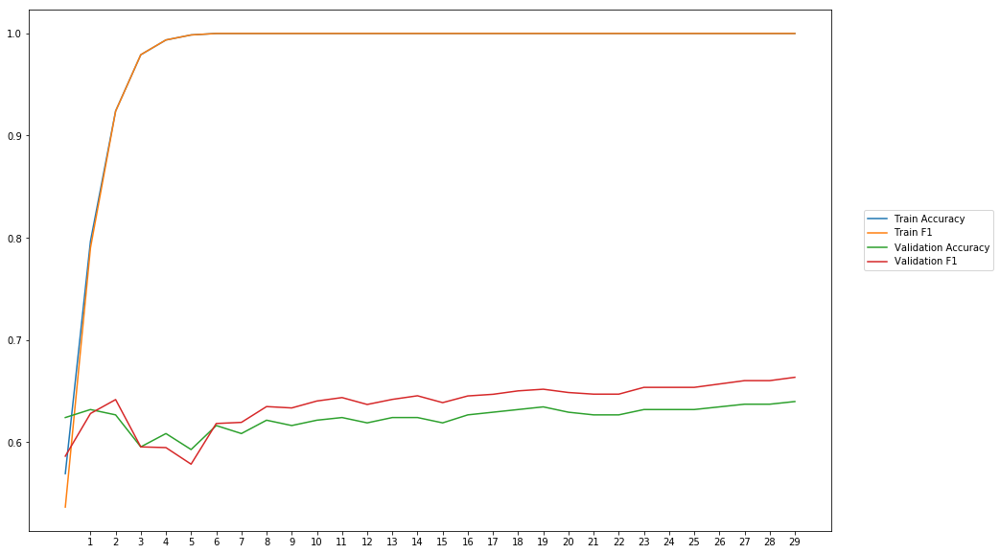

Average Accuracy: 62.40%
Average Precision: 61.69%
Average Recall: 66.04%
Average F1: 63.71%

-----Fold 7--------


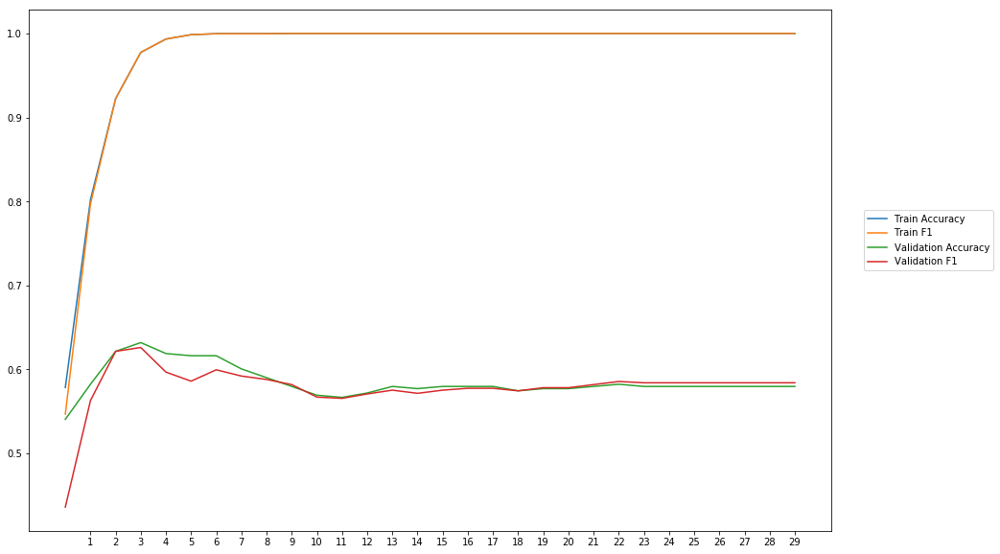

Average Accuracy: 58.49%
Average Precision: 58.92%
Average Recall: 57.01%
Average F1: 57.85%

-----Fold 8--------


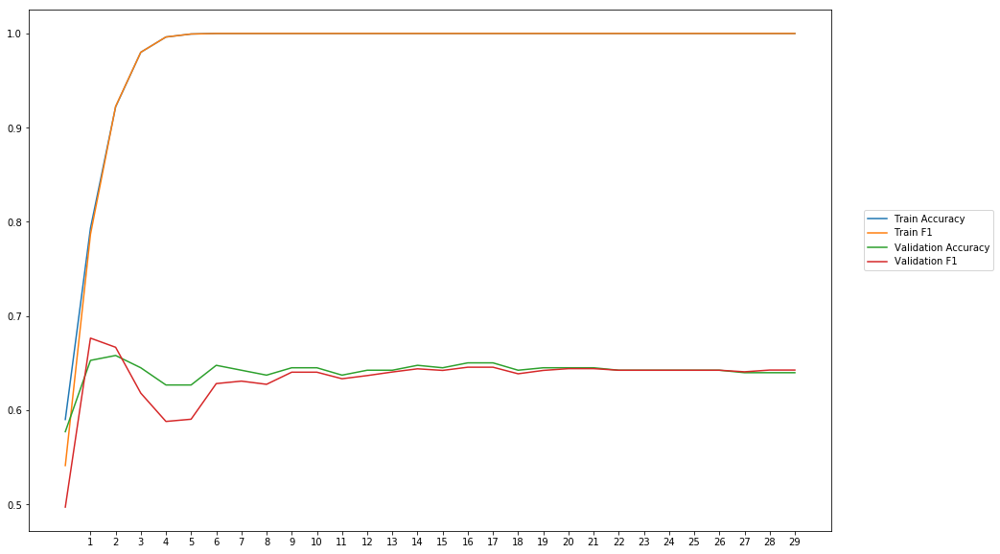

Average Accuracy: 64.08%
Average Precision: 64.78%
Average Recall: 62.15%
Average F1: 63.32%

-----Fold 9--------


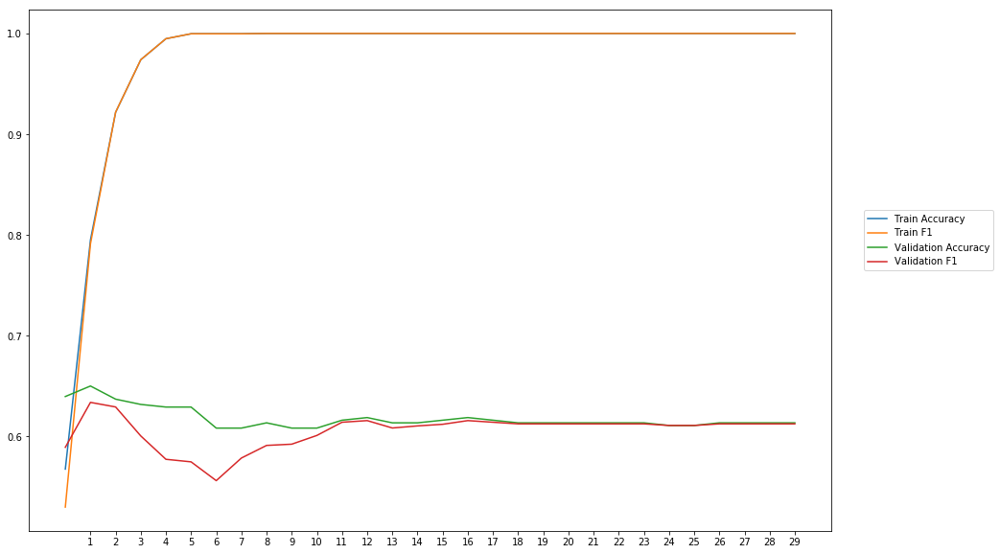

Average Accuracy: 61.78%
Average Precision: 62.88%
Average Recall: 58.63%
Average F1: 60.54%

-----Fold 10--------


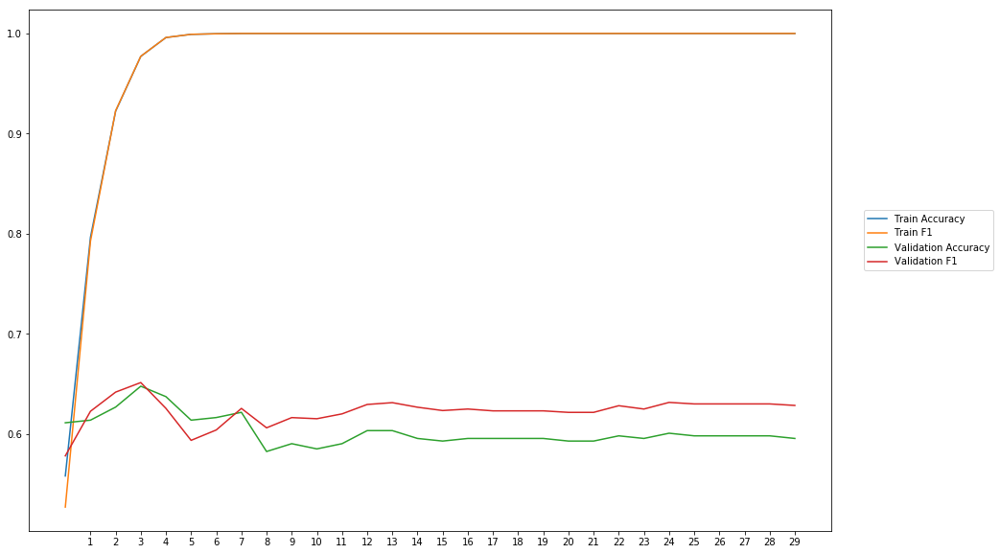

Average Accuracy: 60.25%
Average Precision: 59.55%
Average Recall: 65.47%
Average F1: 62.25%

-------Overallresults-------


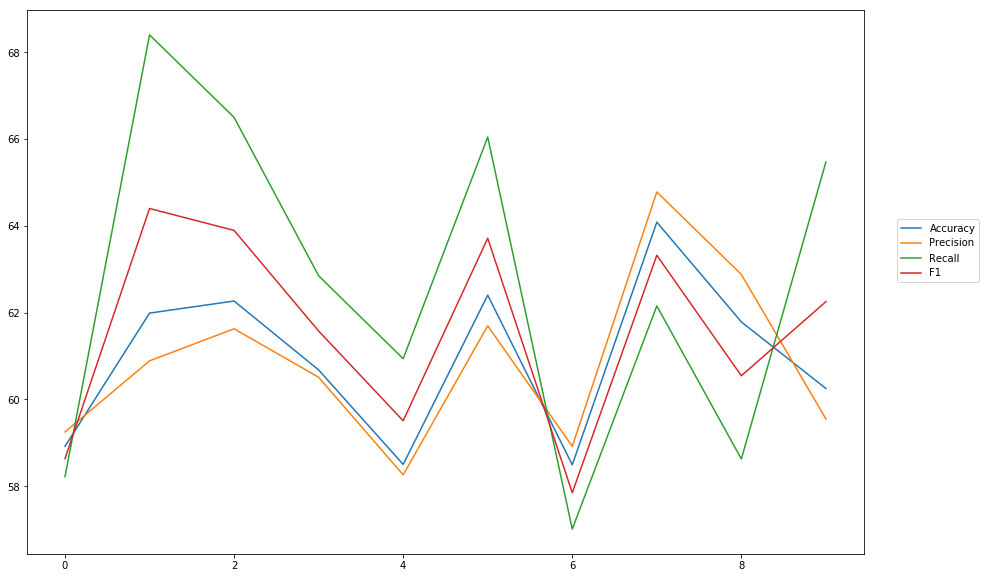

Accuracy: Mean = 60.94% (+/- 1.79%), Max = 64.08%, Min =  58.49%
Precision: Mean = 60.84% (+/- 1.89%), Max = 64.78%, Min =  58.26%
Recall: Mean = 62.62% (+/- 3.71%), Max = 68.39%, Min =  57.01%
F1: Mean = 61.57% (+/- 2.22%), Max = 64.40%, Min =  57.85%


In [60]:
cross_val(model29, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'cnn_1_100_maxpool_kernel3') 

## CNN one CNN, MaxPooling, 400 filter, filter size = 4

In [ ]:
wv_layer32 = Embedding(len(word_index)+1,
                     EMBEDDING_DIM,
                     weights=[embedding_matrix],
                     input_length=MAX_SEQUENCE_LENGTH,
                     trainable=True)

#Input Layer
comment_input32= Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences32 = wv_layer32(comment_input32)

#CNN-Layer
x32 = Conv1D(400, kernel_size =4, activation='relu')(embedded_sequences32)

#Max-Pool
x32 = MaxPooling1D(pool_size=2) (x32)

x32 = Flatten() (x32)

#Output (Dense) Layer
preds32 = Dense(2, activation='softmax')(x32)

# build the model
model32 = Model(inputs=[comment_input32], outputs=preds32)


-----Fold 1--------


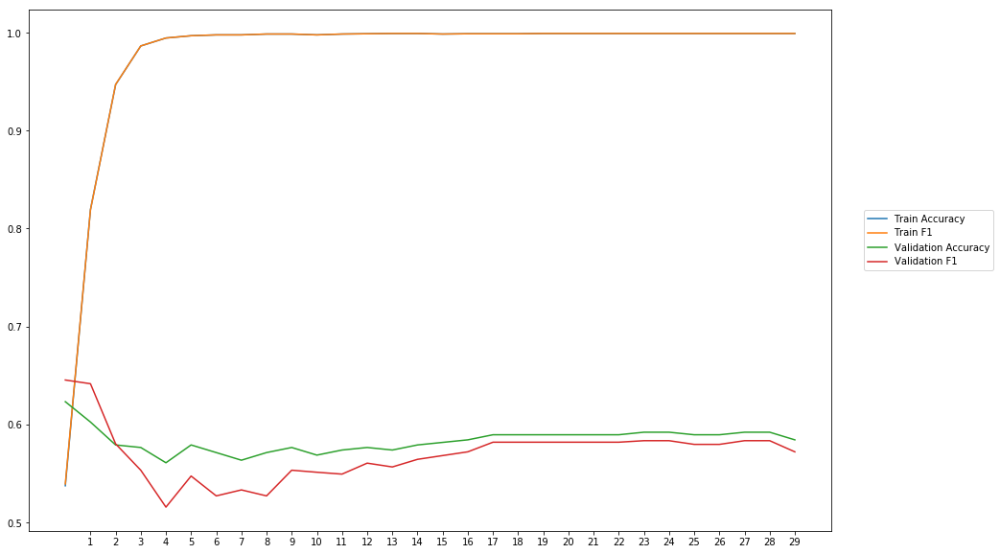

Average Accuracy: 58.38%
Average Precision: 59.04%
Average Recall: 55.32%
Average F1: 57.02%

-----Fold 2--------


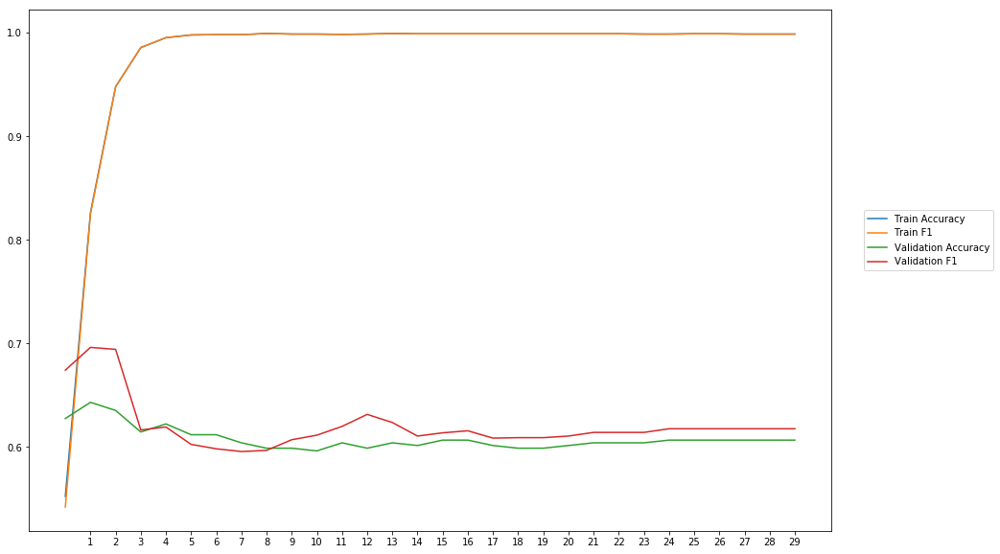

Average Accuracy: 60.81%
Average Precision: 60.41%
Average Recall: 64.06%
Average F1: 62.05%

-----Fold 3--------


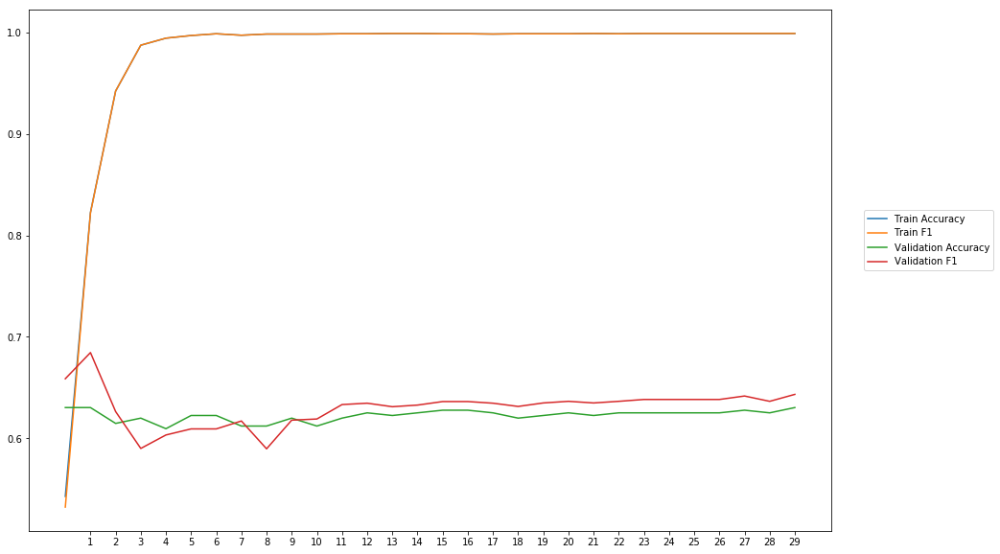

Average Accuracy: 62.25%
Average Precision: 62.07%
Average Recall: 64.23%
Average F1: 63.03%

-----Fold 4--------


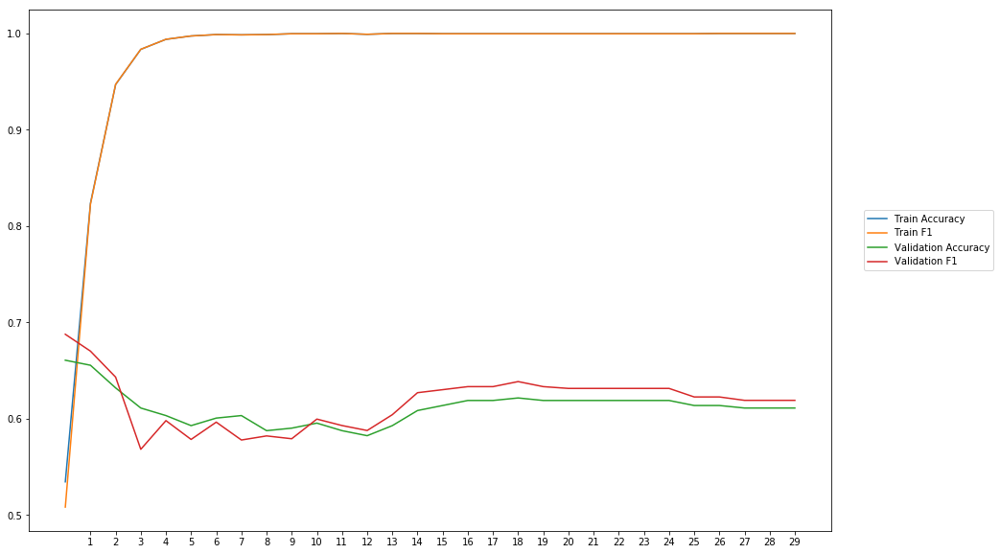

Average Accuracy: 61.16%
Average Precision: 60.94%
Average Recall: 62.69%
Average F1: 61.72%

-----Fold 5--------


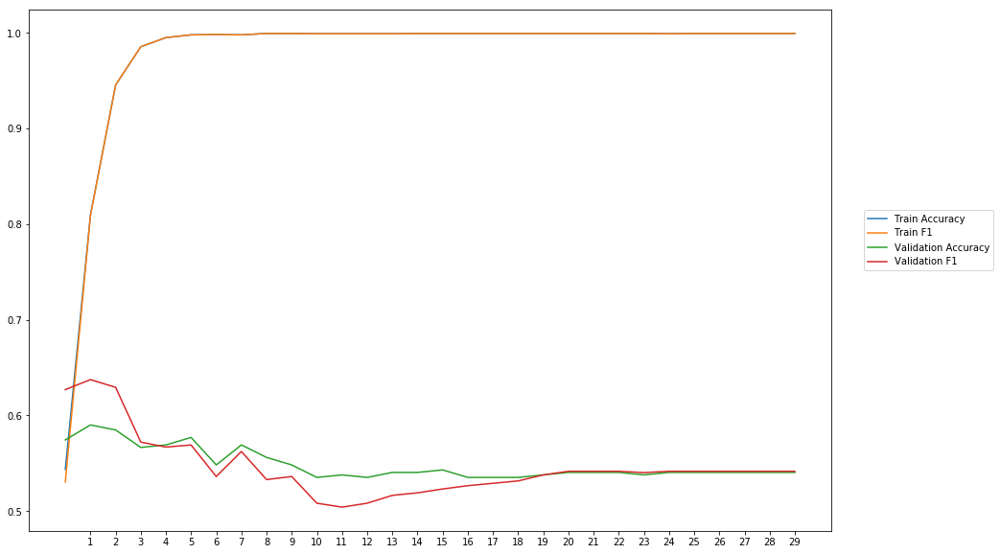

Average Accuracy: 54.87%
Average Precision: 54.99%
Average Recall: 54.53%
Average F1: 54.63%

-----Fold 6--------


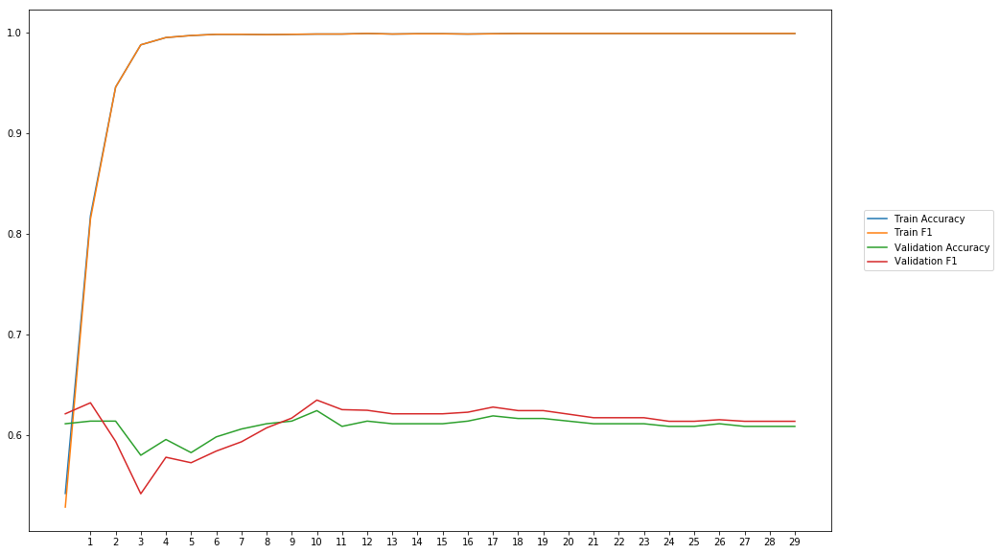

Average Accuracy: 60.89%
Average Precision: 60.89%
Average Recall: 61.46%
Average F1: 61.12%

-----Fold 7--------


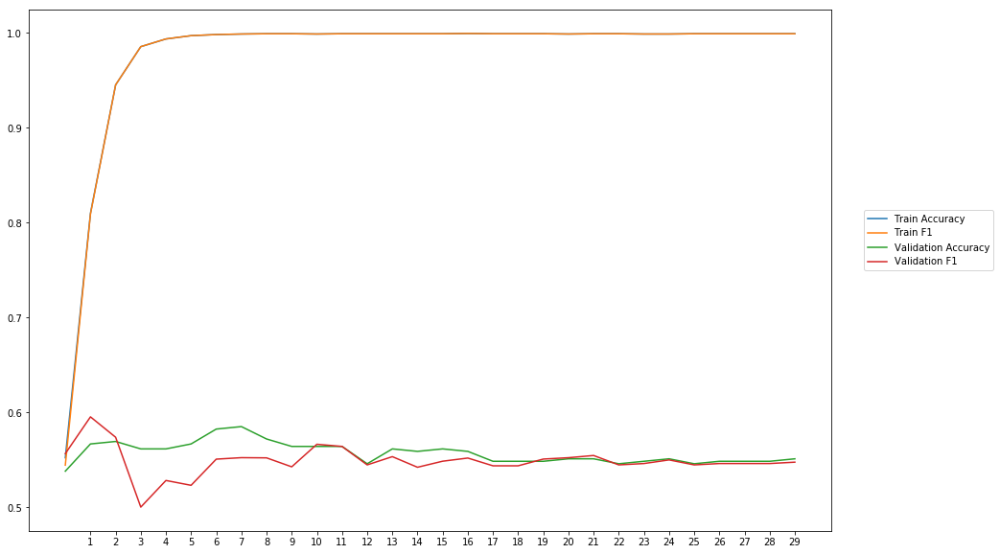

Average Accuracy: 55.71%
Average Precision: 56.16%
Average Recall: 53.78%
Average F1: 54.86%

-----Fold 8--------


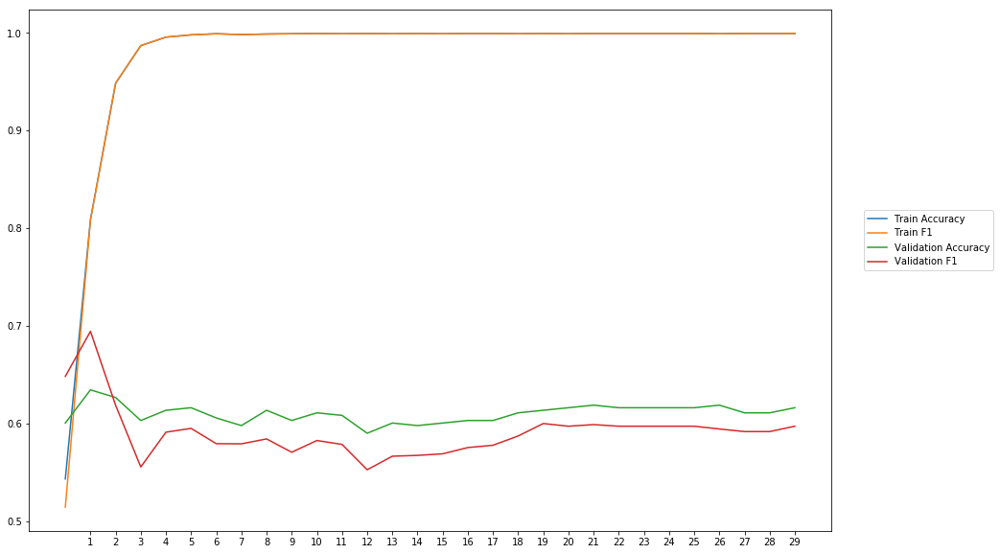

Average Accuracy: 61.04%
Average Precision: 62.37%
Average Recall: 56.55%
Average F1: 59.11%

-----Fold 9--------


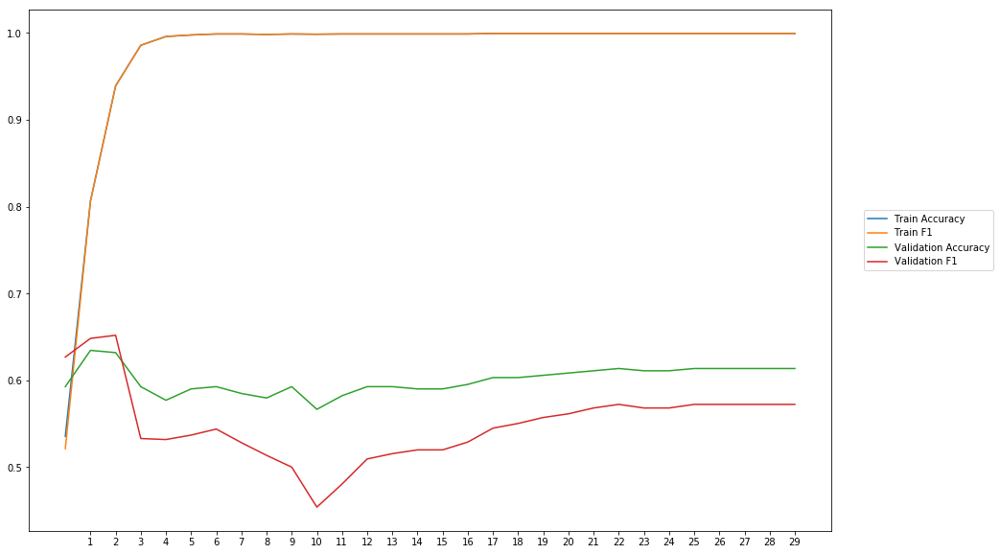

Average Accuracy: 60.04%
Average Precision: 63.09%
Average Recall: 49.24%
Average F1: 54.98%

-----Fold 10--------


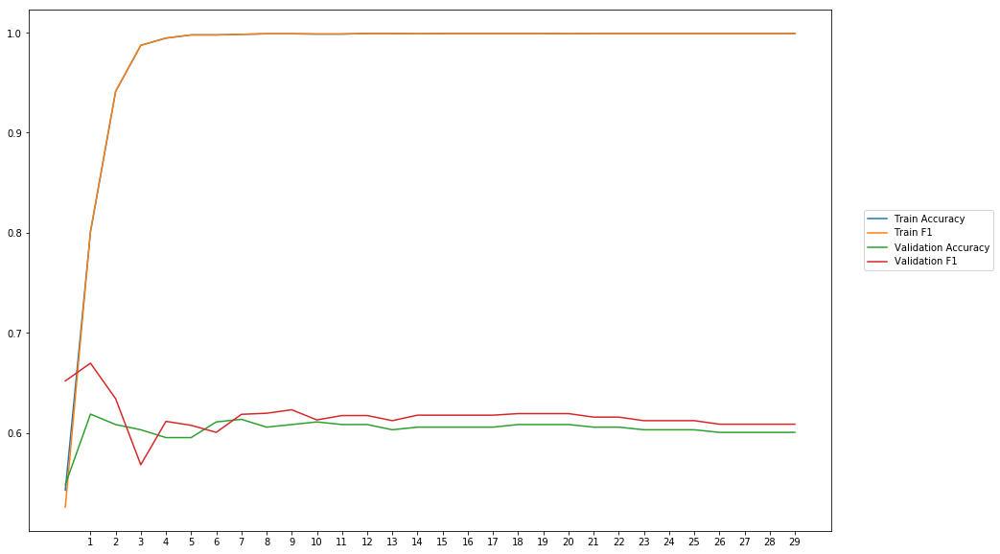

Average Accuracy: 60.37%
Average Precision: 59.97%
Average Recall: 63.77%
Average F1: 61.66%

-------Overallresults-------


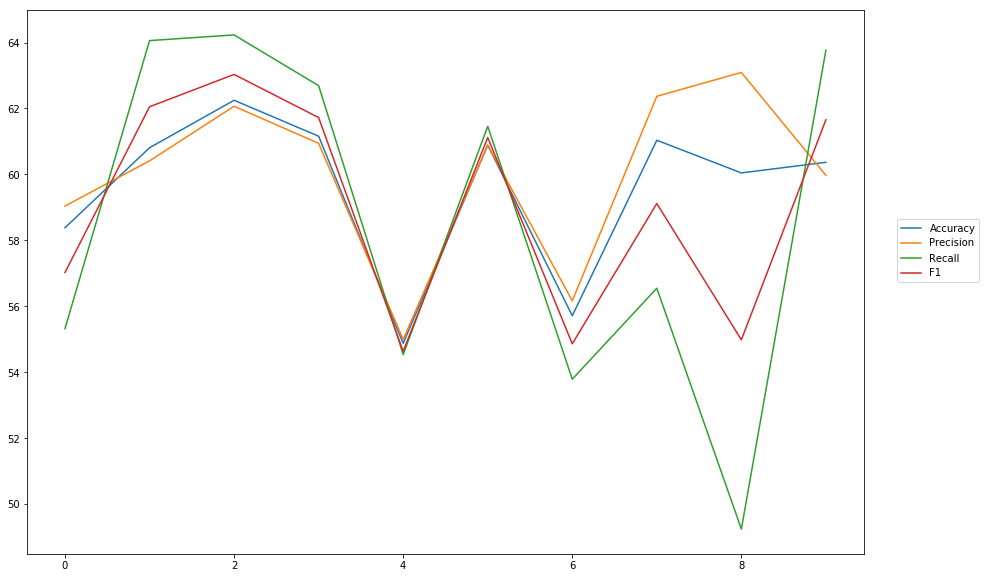

Accuracy: Mean = 59.55% (+/- 2.33%), Max = 62.25%, Min =  54.87%
Precision: Mean = 59.99% (+/- 2.49%), Max = 63.09%, Min =  54.99%
Recall: Mean = 58.56% (+/- 5.05%), Max = 64.23%, Min =  49.24%
F1: Mean = 59.02% (+/- 3.18%), Max = 63.03%, Min =  54.63%


In [63]:
cross_val(model32, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'cnn_1_400_maxpool_kernel4') 

## CNN one CNN-layer, MaxPooling, 400 filter, filter size = 5

In [ ]:
wv_layer33 = Embedding(len(word_index)+1,
                     EMBEDDING_DIM,
                     weights=[embedding_matrix],
                     input_length=MAX_SEQUENCE_LENGTH,
                     trainable=True)

#Input Layer
comment_input33= Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences33 = wv_layer33(comment_input33)

#CNN-Layer
x33 = Conv1D(400, kernel_size =5, activation='relu')(embedded_sequences33)

#Max-Pool
x33 = MaxPooling1D(pool_size=2) (x33)

x33 = Flatten() (x33)

#Output (Dense) Layer
preds33 = Dense(2, activation='softmax')(x33)

# build the model
model33 = Model(inputs=[comment_input33], outputs=preds33)


-----Fold 1--------


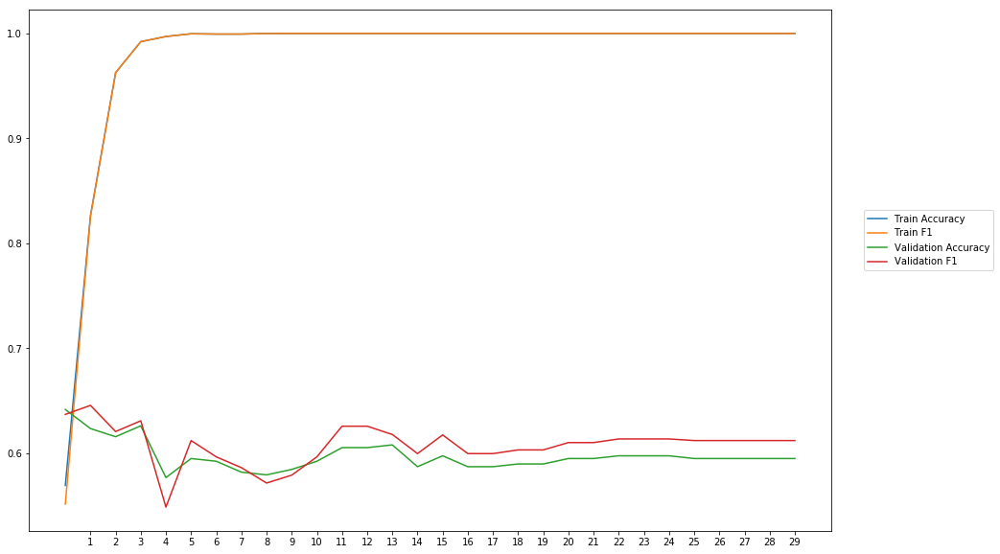

Average Accuracy: 59.73%
Average Precision: 59.38%
Average Recall: 62.33%
Average F1: 60.78%

-----Fold 2--------


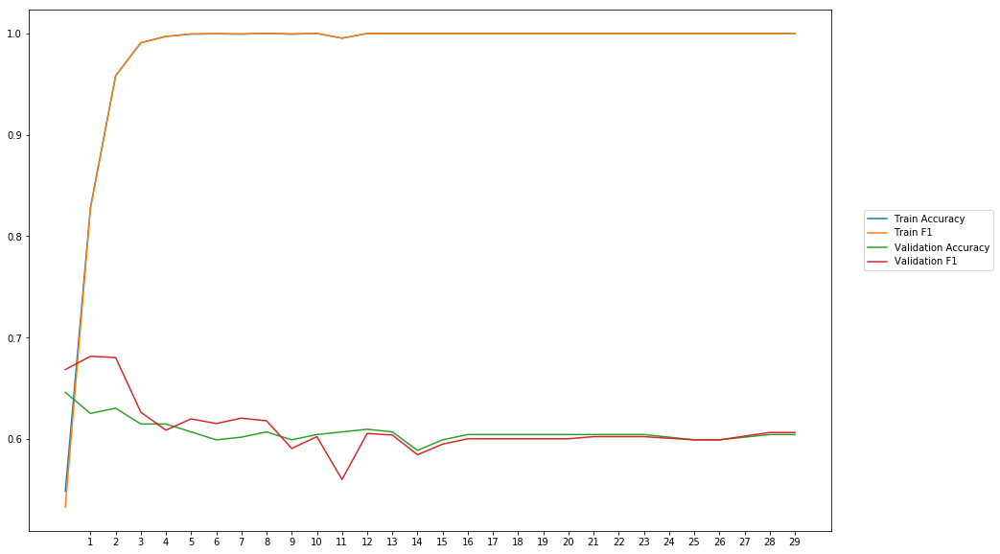

Average Accuracy: 60.67%
Average Precision: 60.78%
Average Recall: 61.49%
Average F1: 60.99%

-----Fold 3--------


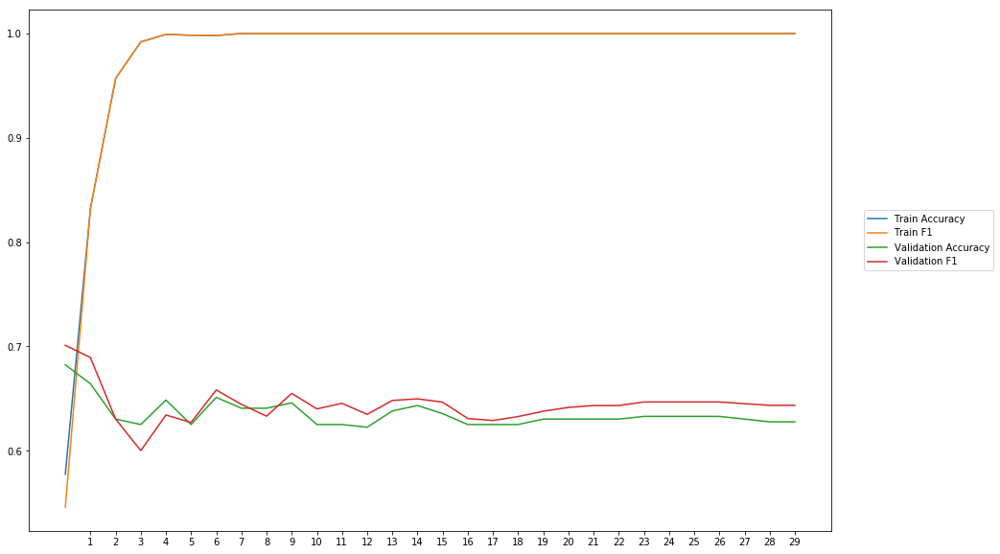

Average Accuracy: 63.52%
Average Precision: 63.21%
Average Recall: 65.68%
Average F1: 64.37%

-----Fold 4--------


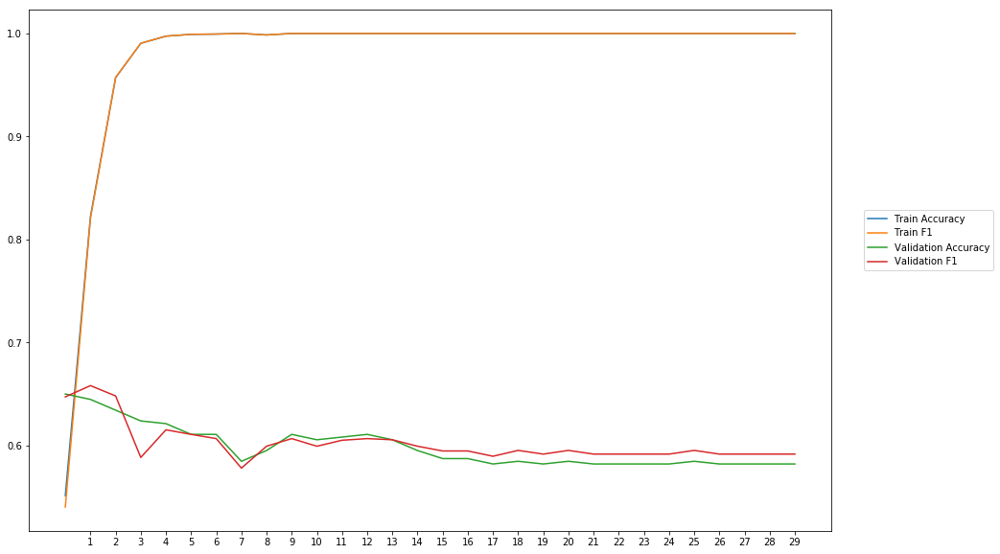

Average Accuracy: 59.89%
Average Precision: 59.93%
Average Recall: 60.61%
Average F1: 60.23%

-----Fold 5--------


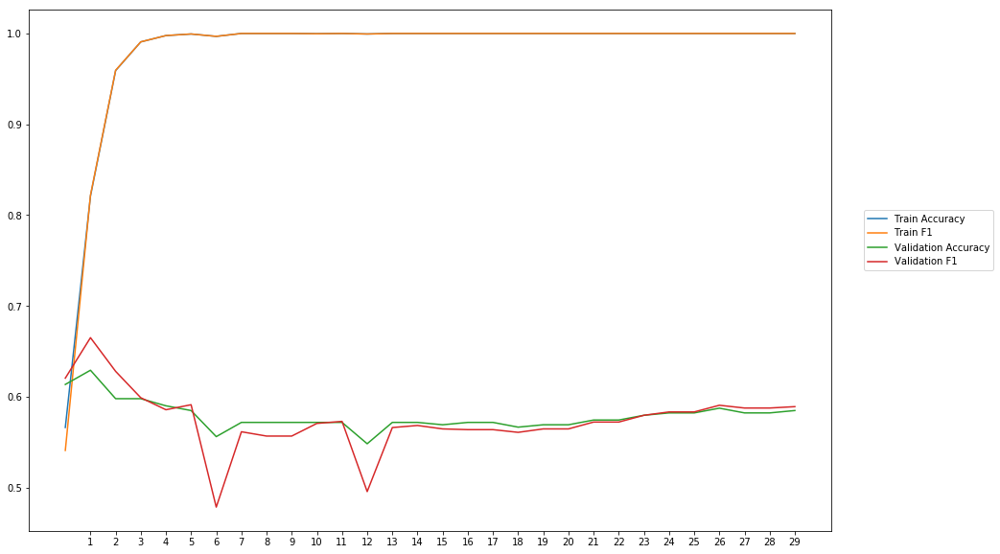

Average Accuracy: 57.89%
Average Precision: 58.11%
Average Recall: 57.10%
Average F1: 57.48%

-----Fold 6--------


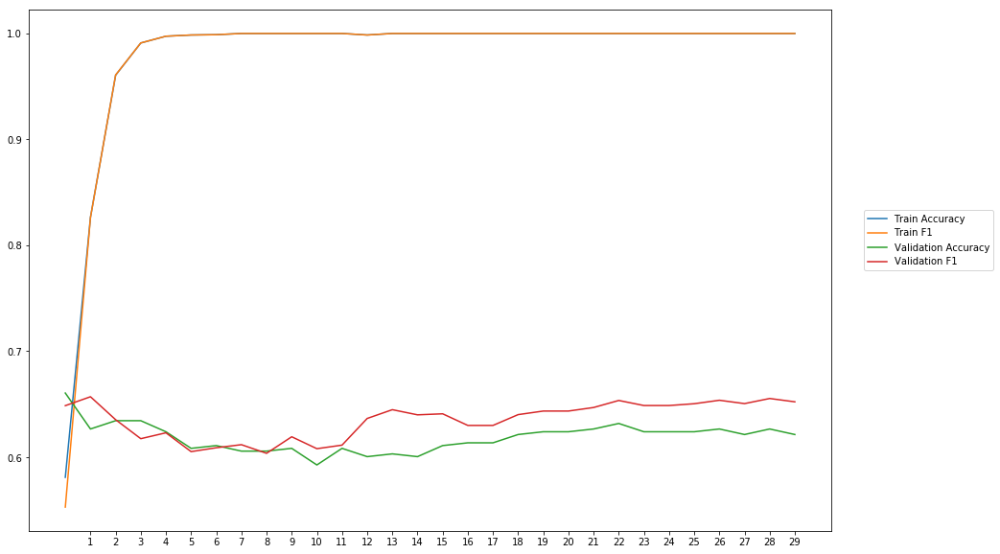

Average Accuracy: 61.86%
Average Precision: 61.08%
Average Recall: 66.41%
Average F1: 63.53%

-----Fold 7--------


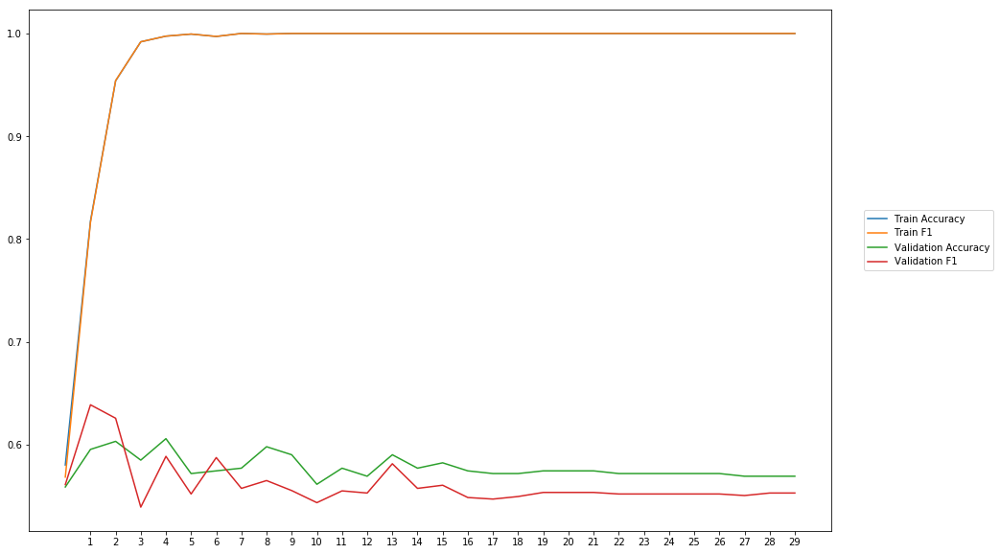

Average Accuracy: 57.75%
Average Precision: 58.53%
Average Recall: 54.11%
Average F1: 56.14%

-----Fold 8--------


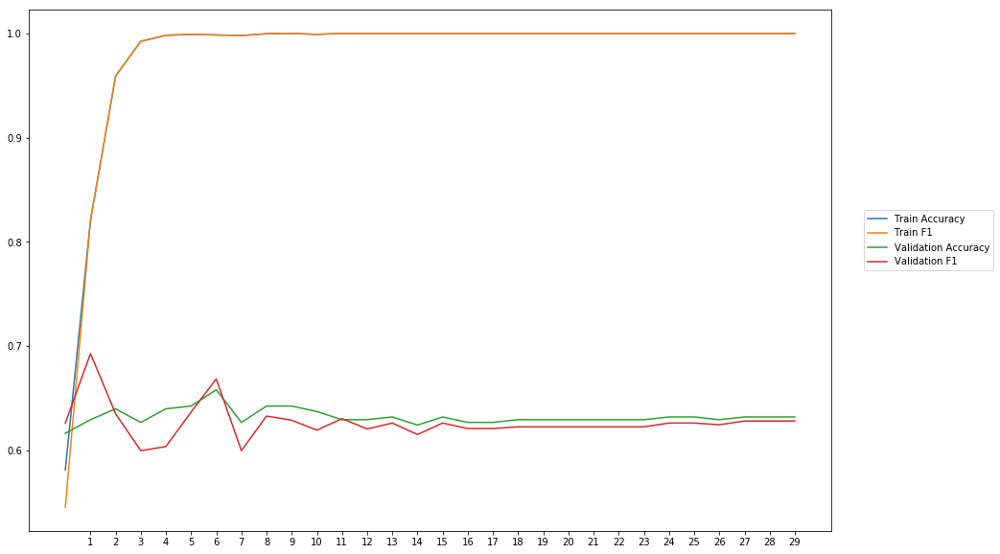

Average Accuracy: 63.21%
Average Precision: 63.84%
Average Recall: 61.74%
Average F1: 62.65%

-----Fold 9--------


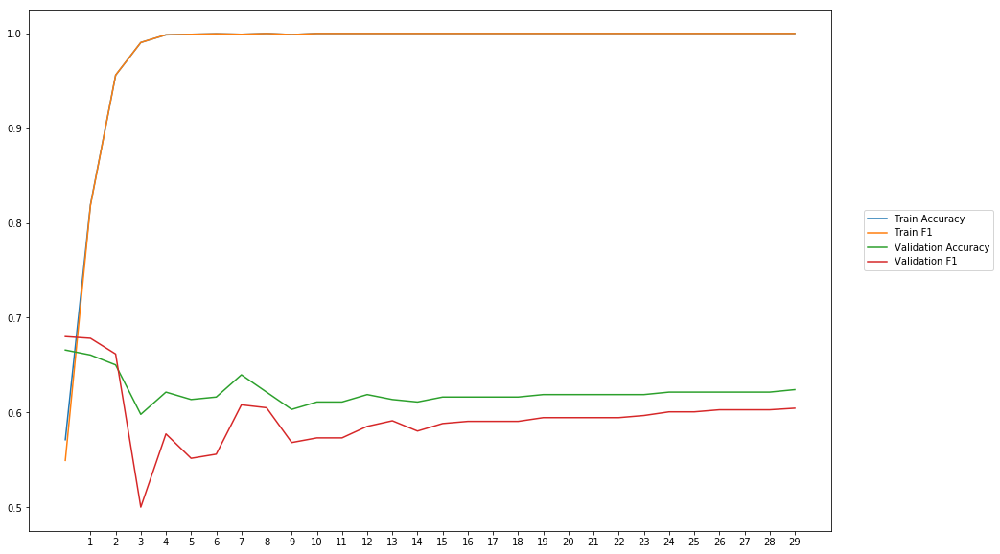

Average Accuracy: 62.15%
Average Precision: 64.12%
Average Recall: 55.75%
Average F1: 59.45%

-----Fold 10--------


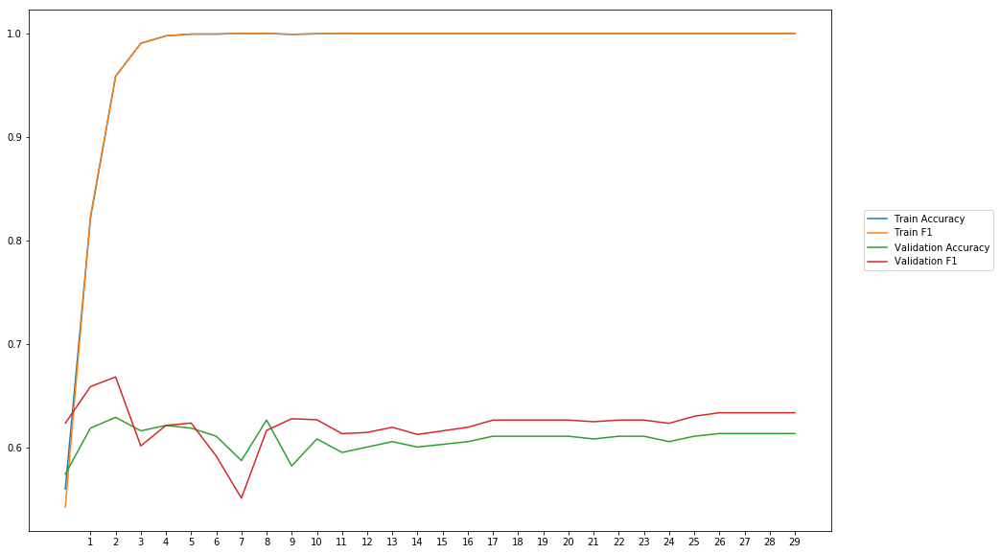

Average Accuracy: 60.84%
Average Precision: 60.27%
Average Recall: 64.65%
Average F1: 62.27%

-------Overallresults-------


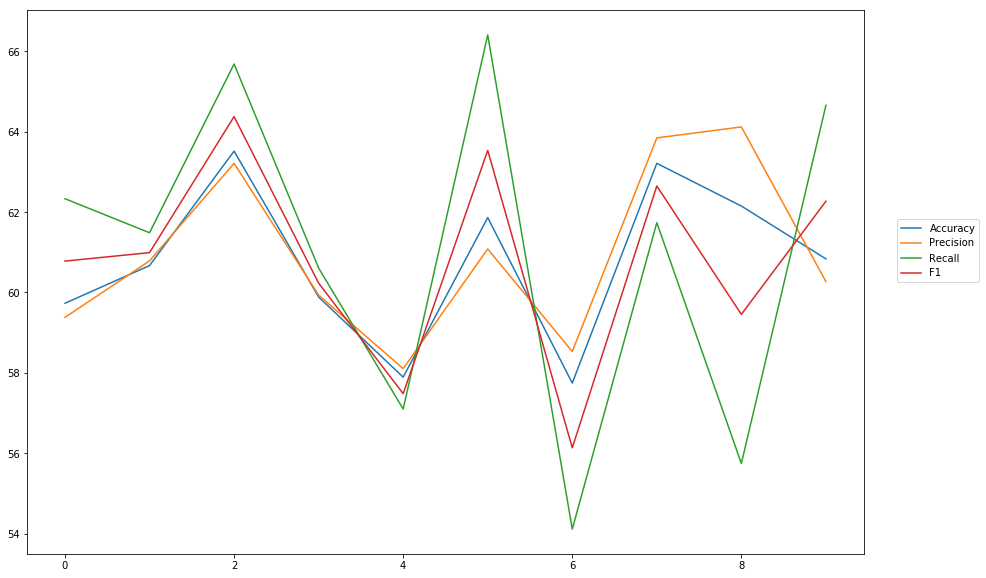

Accuracy: Mean = 60.75% (+/- 1.89%), Max = 63.52%, Min =  57.75%
Precision: Mean = 60.93% (+/- 2.04%), Max = 64.12%, Min =  58.11%
Recall: Mean = 60.99% (+/- 3.97%), Max = 66.41%, Min =  54.11%
F1: Mean = 60.79% (+/- 2.46%), Max = 64.37%, Min =  56.14%


In [64]:
cross_val(model33, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'cnn_1_400_maxpool_kernel5') 

## CNN one CNN-layer, MaxPooling, 400 filter, filter size = 2

In [ ]:
wv_layer34 = Embedding(len(word_index)+1,
                     EMBEDDING_DIM,
                     weights=[embedding_matrix],
                     input_length=MAX_SEQUENCE_LENGTH,
                     trainable=True)

#Input Layer
comment_input34= Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences34 = wv_layer34(comment_input34)

#CNN-Layer
x34 = Conv1D(400, kernel_size =2, activation='relu')(embedded_sequences34)

#Max-Pool
x34 = MaxPooling1D(pool_size=2) (x34)

x34 = Flatten() (x34)

#Output (Dense) Layer
preds34 = Dense(2, activation='softmax')(x34)

# build the model
model34 = Model(inputs=[comment_input34], outputs=preds34)


-----Fold 1--------


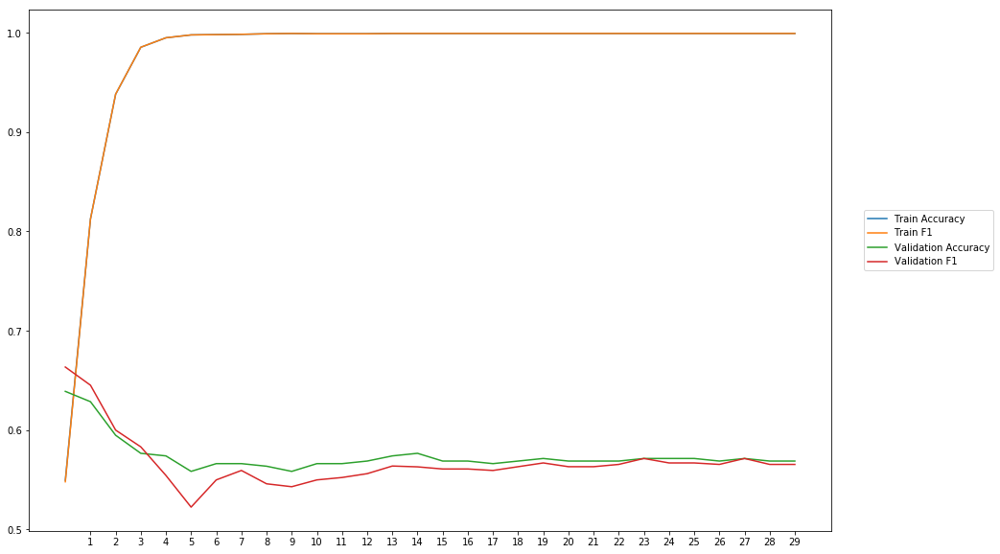

Average Accuracy: 57.40%
Average Precision: 57.71%
Average Recall: 55.92%
Average F1: 56.76%

-----Fold 2--------


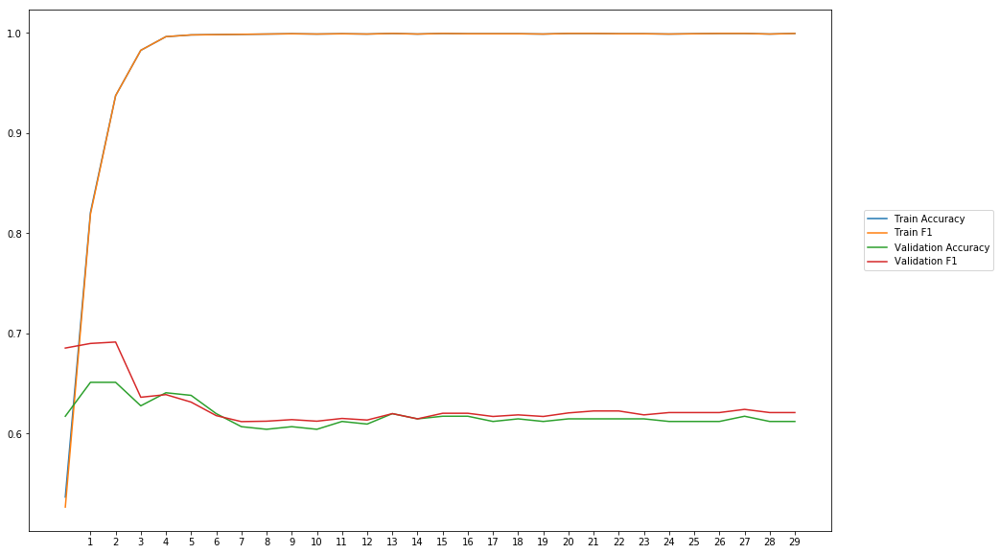

Average Accuracy: 61.77%
Average Precision: 61.51%
Average Recall: 64.15%
Average F1: 62.69%

-----Fold 3--------


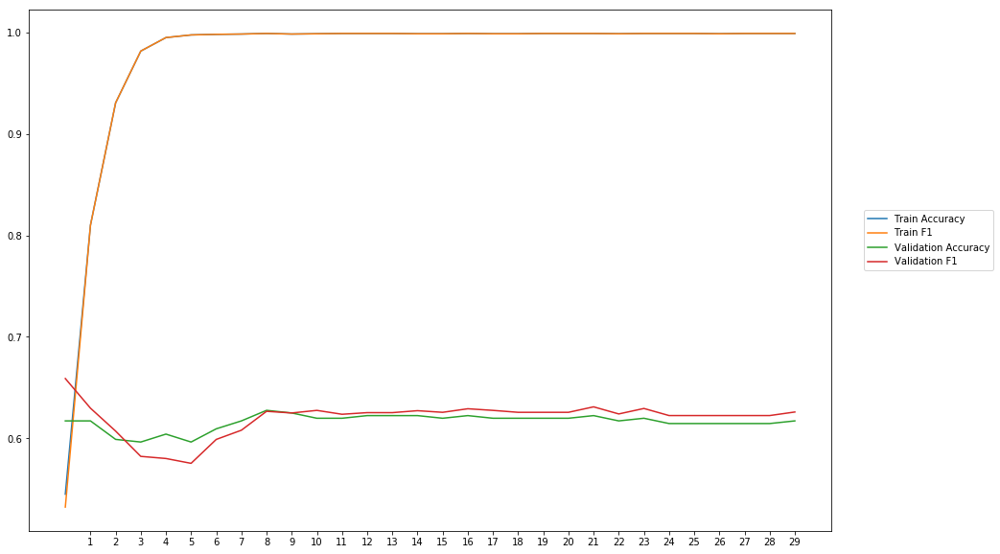

Average Accuracy: 61.62%
Average Precision: 61.70%
Average Recall: 62.44%
Average F1: 62.01%

-----Fold 4--------


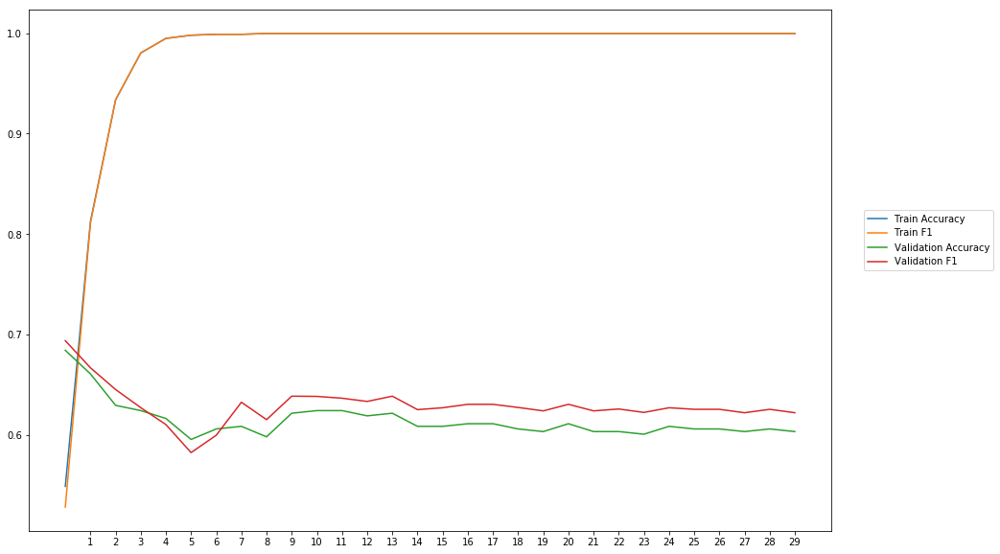

Average Accuracy: 61.43%
Average Precision: 60.76%
Average Recall: 65.24%
Average F1: 62.89%

-----Fold 5--------


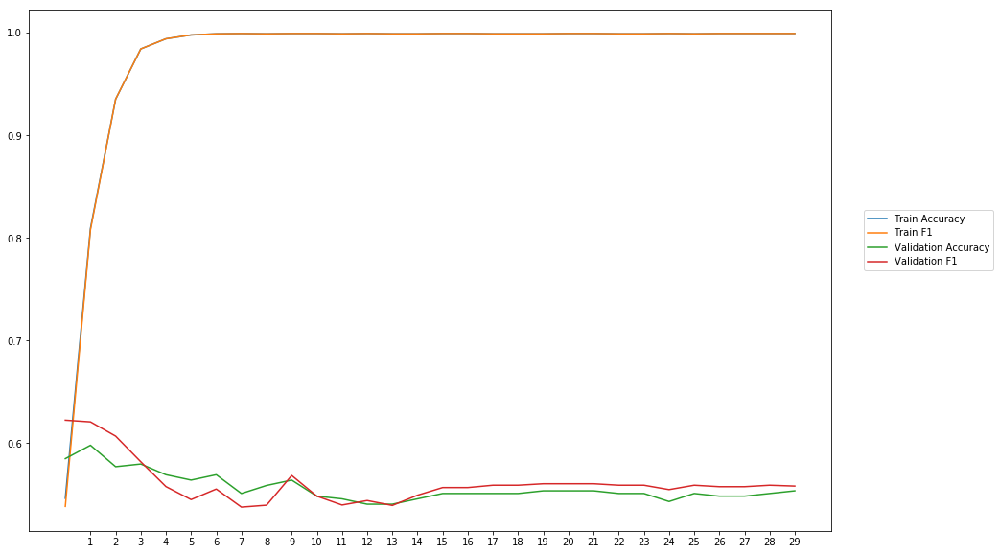

Average Accuracy: 55.66%
Average Precision: 55.67%
Average Recall: 56.65%
Average F1: 56.11%

-----Fold 6--------


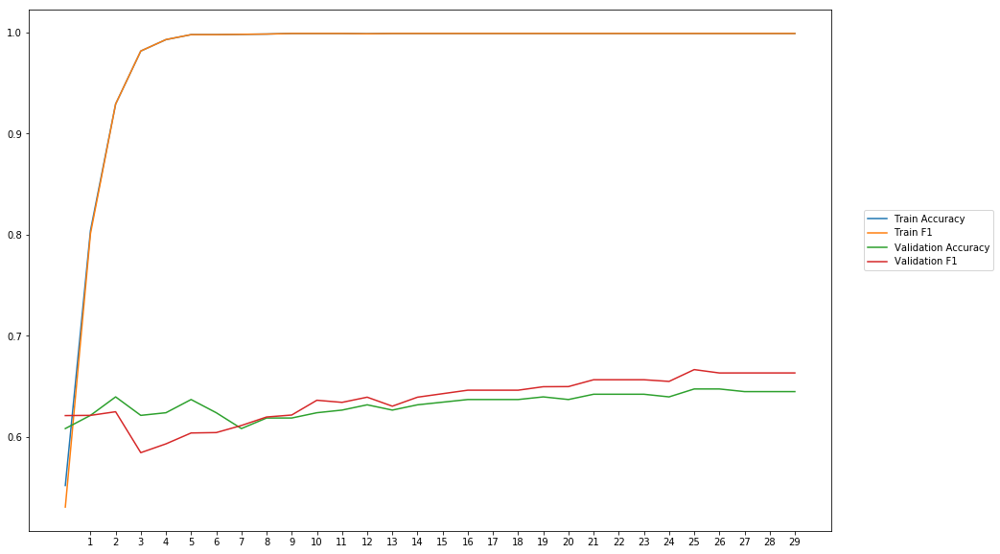

Average Accuracy: 63.27%
Average Precision: 63.12%
Average Recall: 64.53%
Average F1: 63.71%

-----Fold 7--------


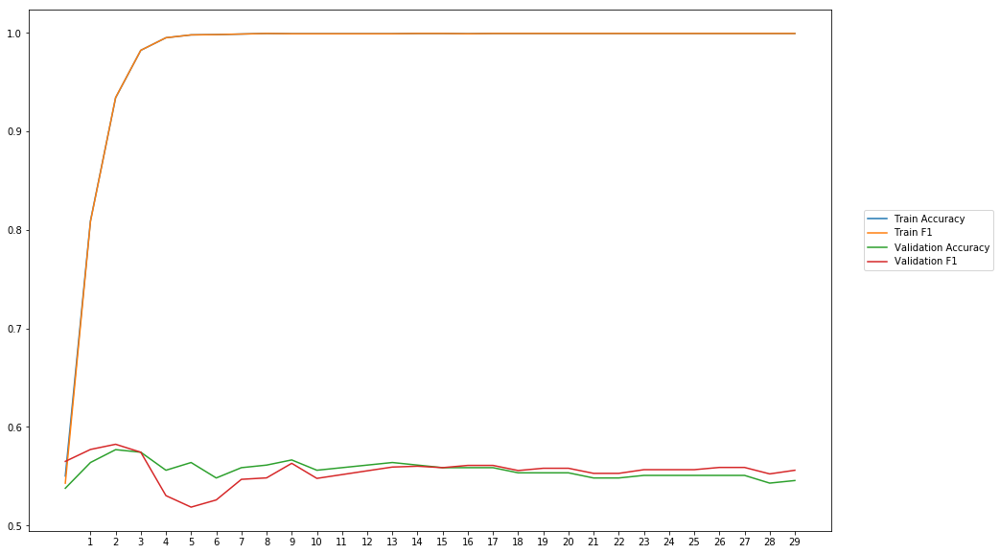

Average Accuracy: 55.62%
Average Precision: 55.82%
Average Recall: 55.36%
Average F1: 55.54%

-----Fold 8--------


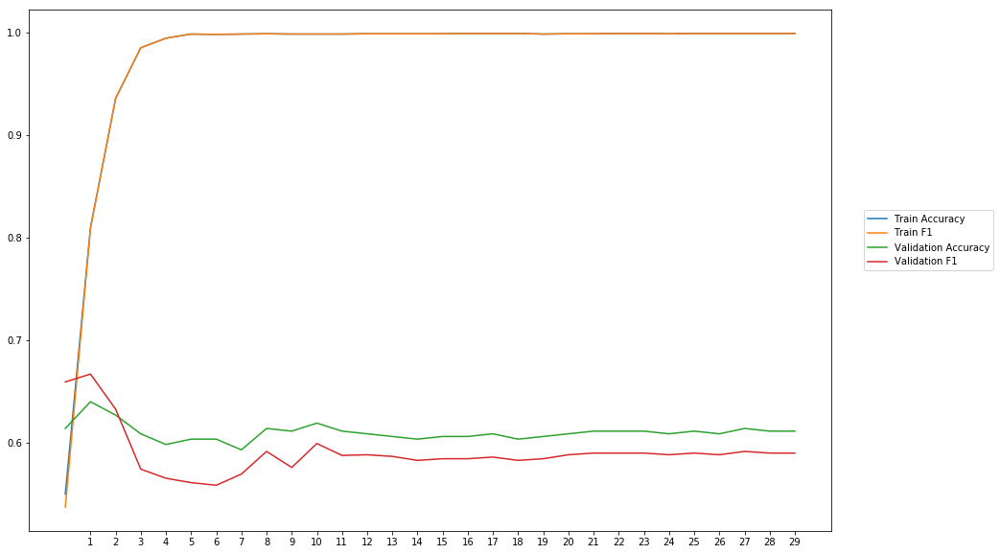

Average Accuracy: 60.97%
Average Precision: 62.28%
Average Recall: 56.32%
Average F1: 59.02%

-----Fold 9--------


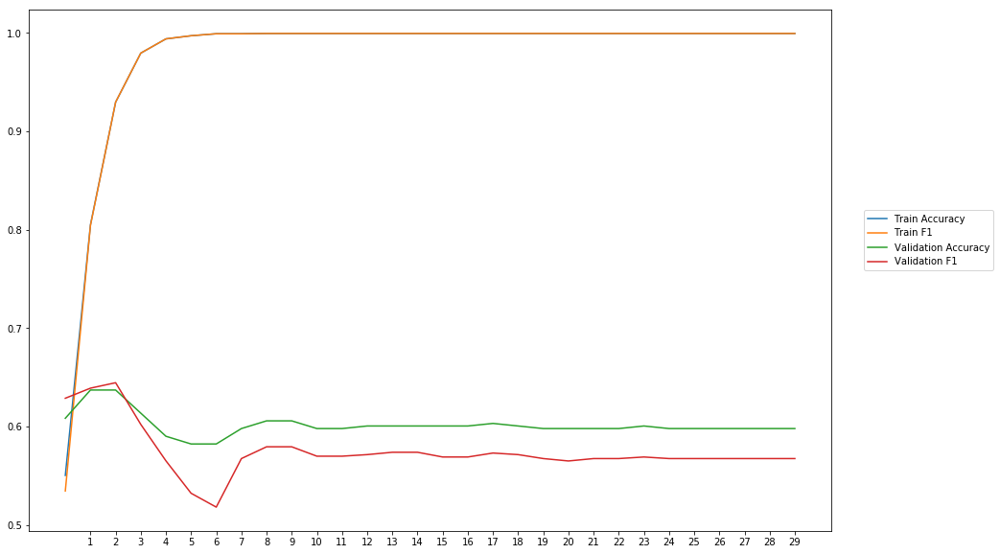

Average Accuracy: 60.14%
Average Precision: 61.72%
Average Recall: 53.89%
Average F1: 57.46%

-----Fold 10--------


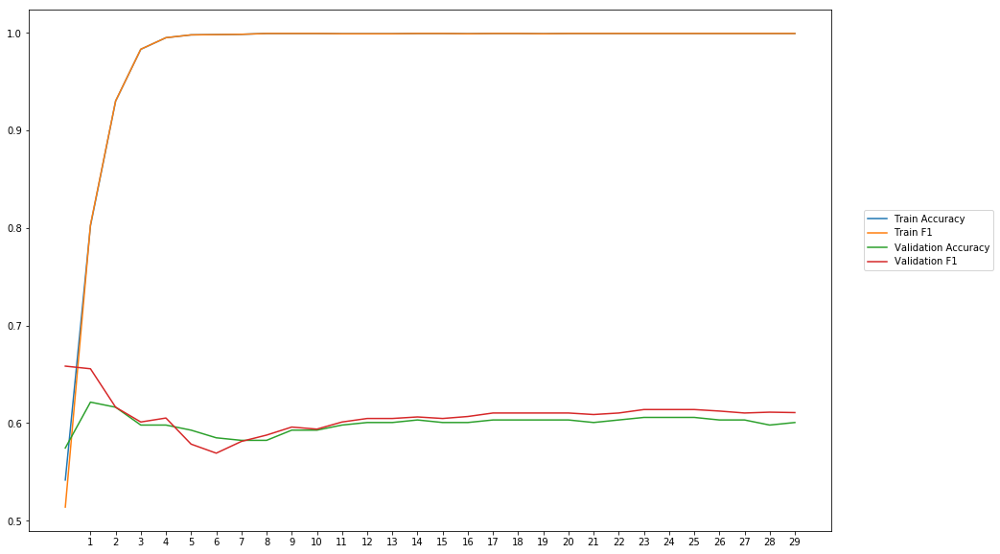

Average Accuracy: 59.92%
Average Precision: 59.72%
Average Recall: 61.96%
Average F1: 60.72%

-------Overallresults-------


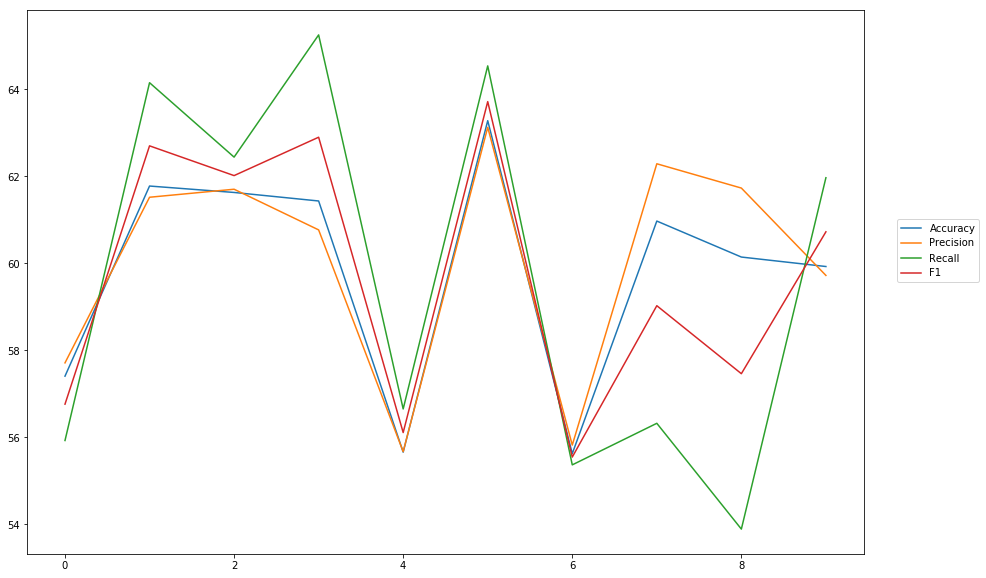

Accuracy: Mean = 59.78% (+/- 2.53%), Max = 63.27%, Min =  55.62%
Precision: Mean = 60.00% (+/- 2.55%), Max = 63.12%, Min =  55.67%
Recall: Mean = 59.65% (+/- 4.17%), Max = 65.24%, Min =  53.89%
F1: Mean = 59.69% (+/- 2.93%), Max = 63.71%, Min =  55.54%


In [65]:
cross_val(model34, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'cnn_1_400_maxpool_kernel2') 

## CNN one CNN-Layer, MaxPooling = 3, 400 filter

In [ ]:
wv_layer35 = Embedding(len(word_index)+1,
                     EMBEDDING_DIM,
                     weights=[embedding_matrix],
                     input_length=MAX_SEQUENCE_LENGTH,
                     trainable=True)

#Input Layer
comment_input35= Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences35 = wv_layer35(comment_input35)

#CNN-Layer
x35 = Conv1D(400, kernel_size =3, activation='relu')(embedded_sequences35)

#Max-Pool
x35 = MaxPooling1D(pool_size=3) (x35)

x35 = Flatten() (x35)

#Output (Dense) Layer
preds35 = Dense(2, activation='softmax')(x35)

# build the model
model35 = Model(inputs=[comment_input35], outputs=preds35)


-----Fold 1--------


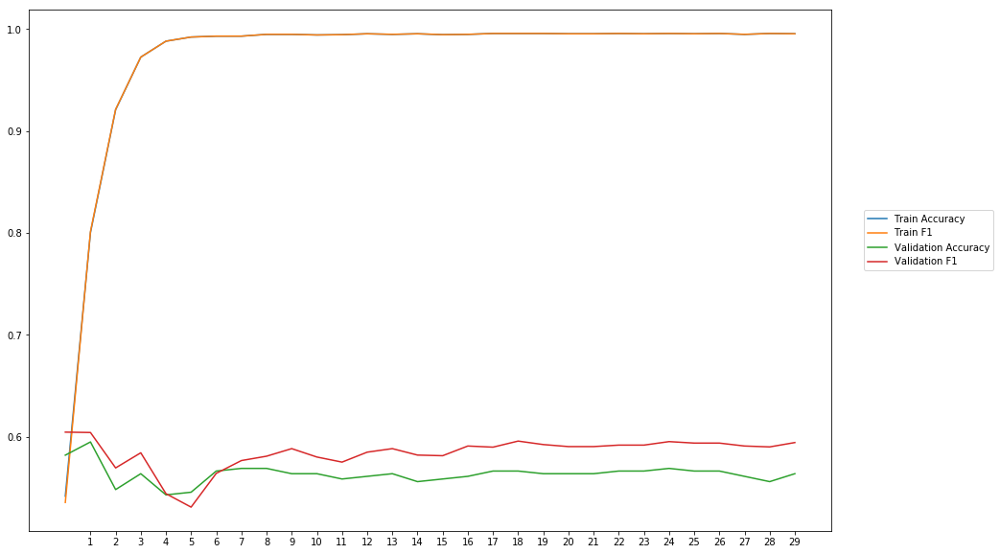

Average Accuracy: 56.35%
Average Precision: 55.90%
Average Recall: 61.26%
Average F1: 58.42%

-----Fold 2--------


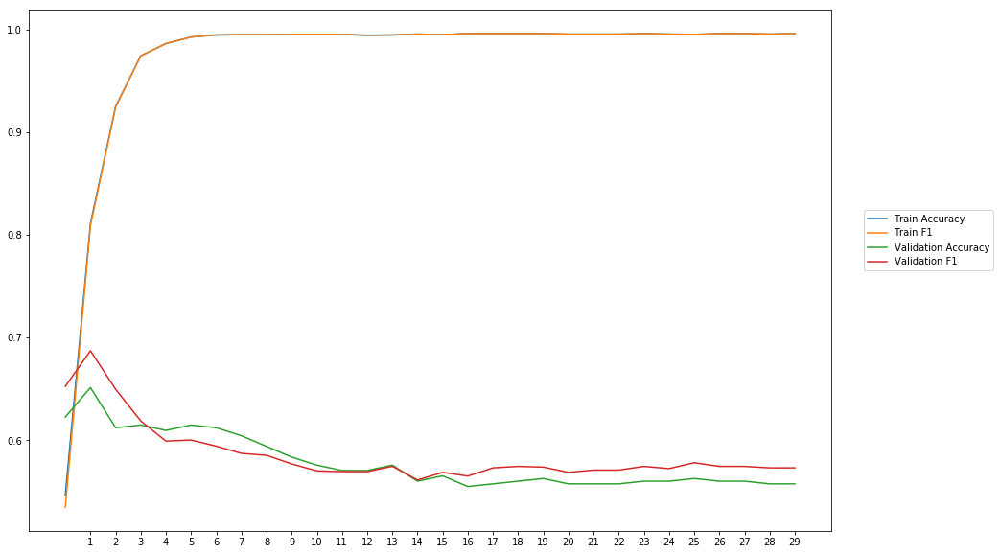

Average Accuracy: 57.86%
Average Precision: 57.90%
Average Recall: 59.45%
Average F1: 58.58%

-----Fold 3--------


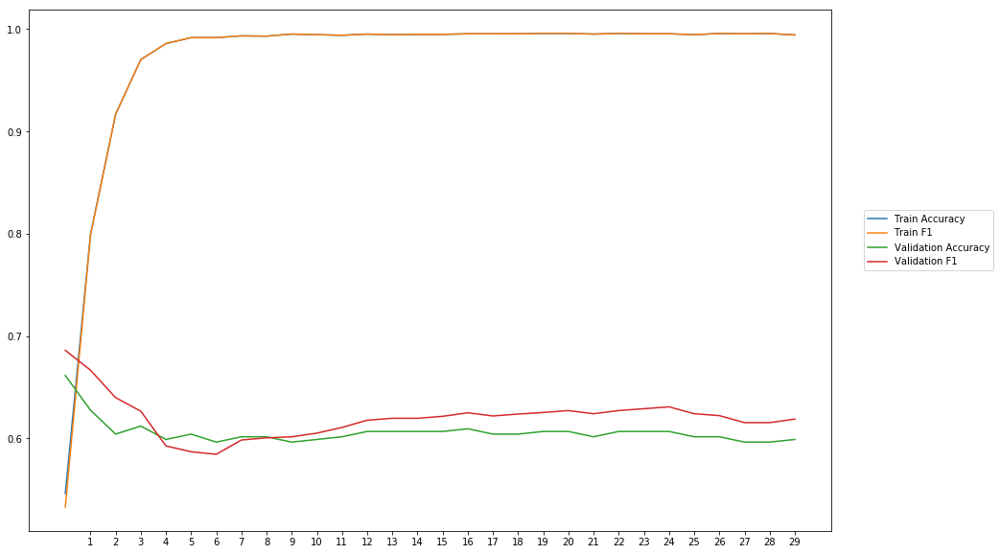

Average Accuracy: 60.60%
Average Precision: 60.13%
Average Recall: 64.18%
Average F1: 62.03%

-----Fold 4--------


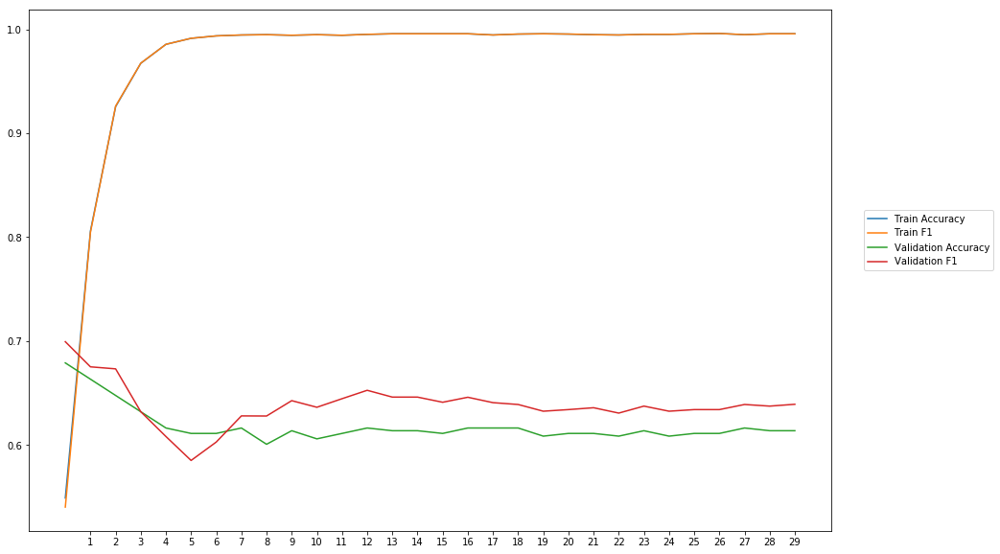

Average Accuracy: 61.78%
Average Precision: 60.76%
Average Recall: 67.40%
Average F1: 63.83%

-----Fold 5--------


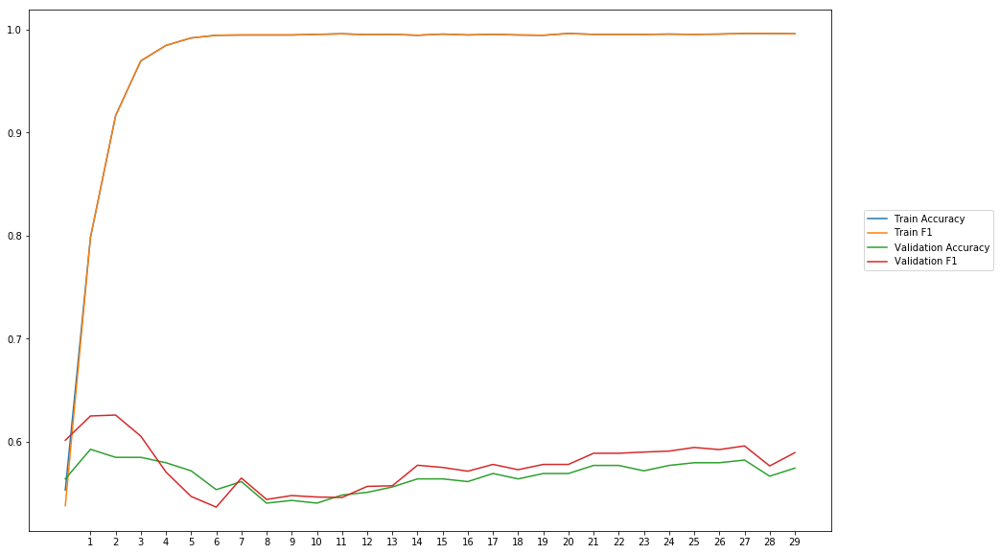

Average Accuracy: 56.73%
Average Precision: 56.54%
Average Recall: 59.05%
Average F1: 57.71%

-----Fold 6--------


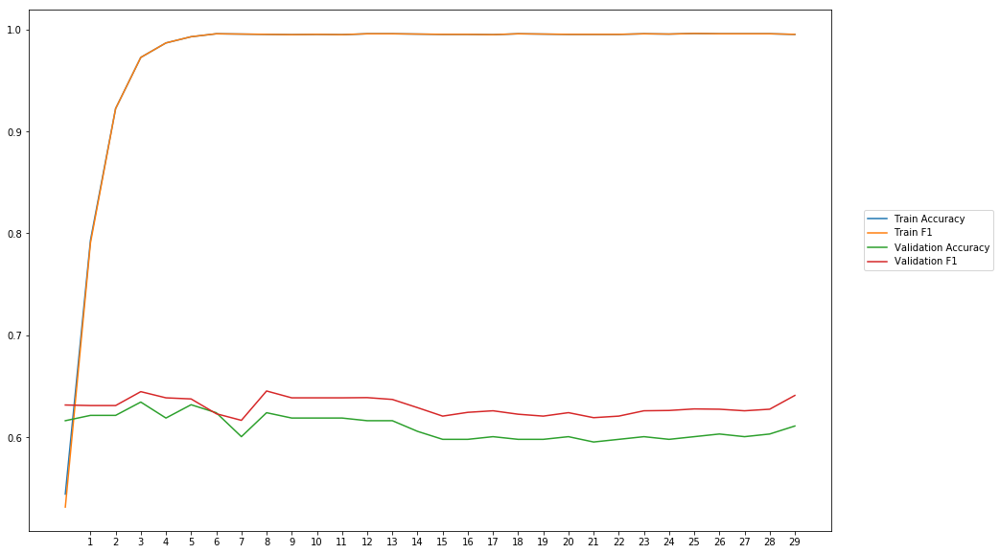

Average Accuracy: 60.97%
Average Precision: 60.06%
Average Recall: 66.28%
Average F1: 63.00%

-----Fold 7--------


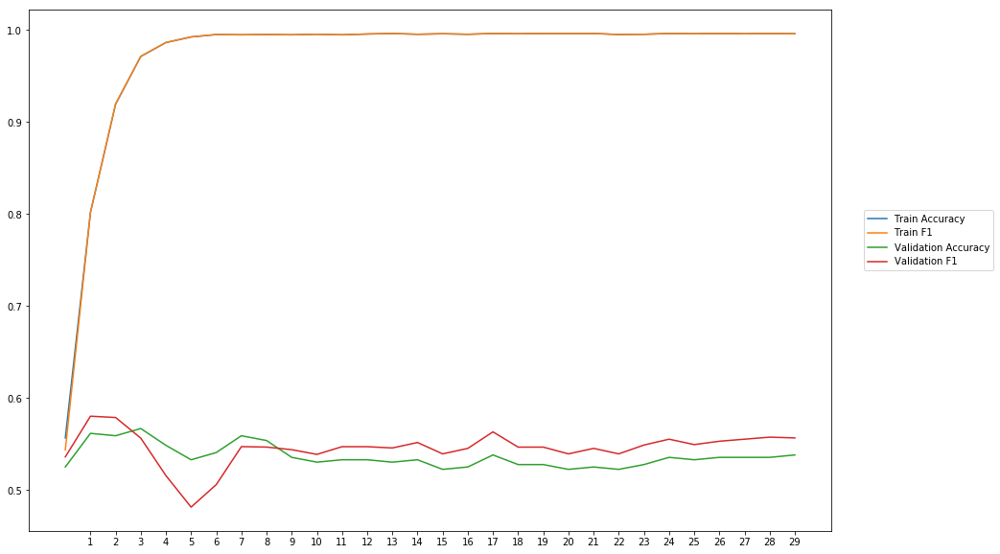

Average Accuracy: 53.62%
Average Precision: 53.67%
Average Recall: 55.57%
Average F1: 54.52%

-----Fold 8--------


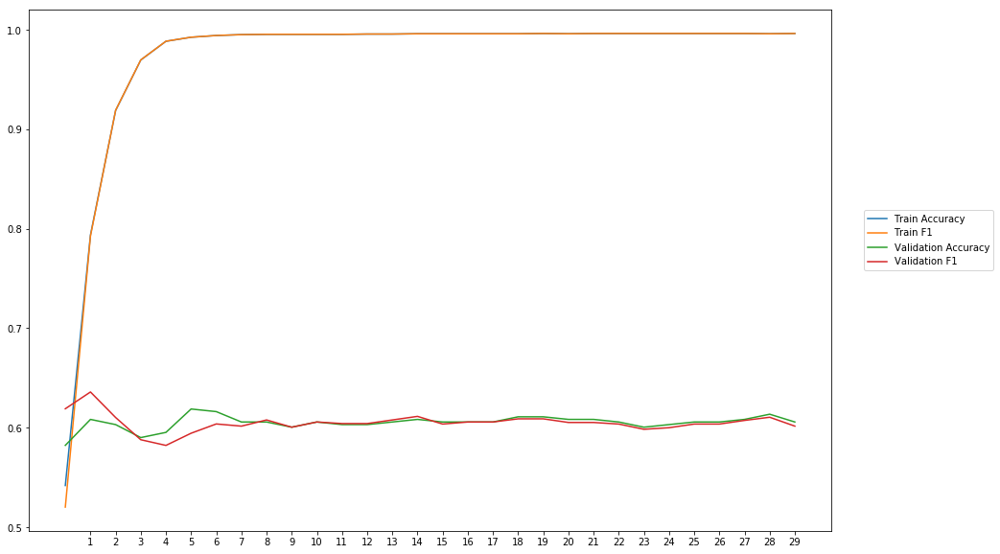

Average Accuracy: 60.52%
Average Precision: 60.73%
Average Recall: 60.35%
Average F1: 60.50%

-----Fold 9--------


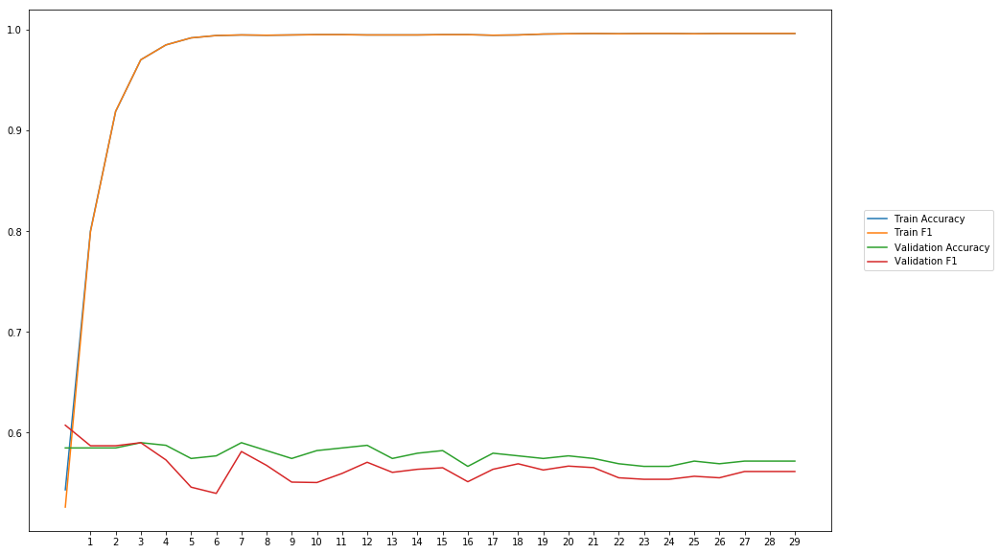

Average Accuracy: 57.76%
Average Precision: 58.42%
Average Recall: 54.70%
Average F1: 56.46%

-----Fold 10--------


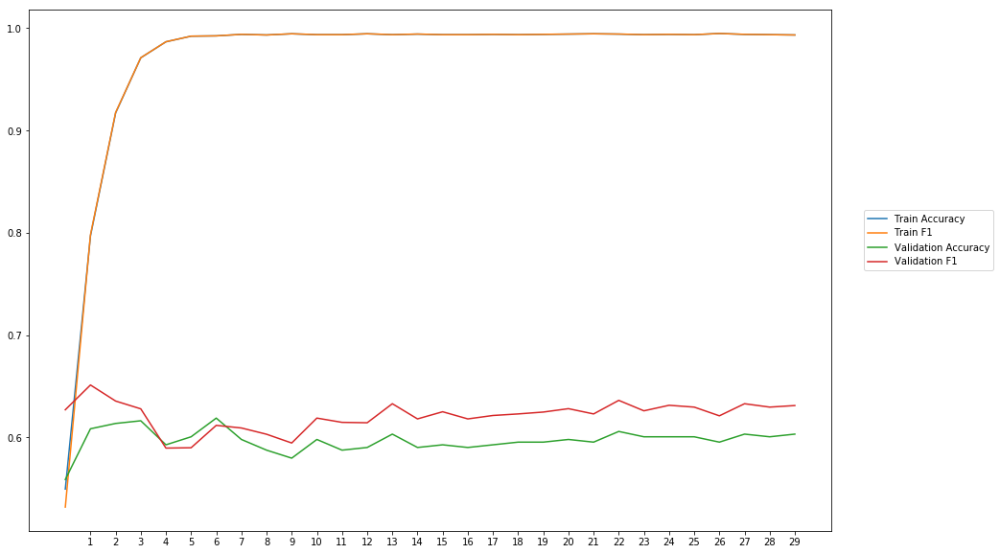

Average Accuracy: 59.70%
Average Precision: 58.79%
Average Recall: 66.02%
Average F1: 62.13%

-------Overallresults-------


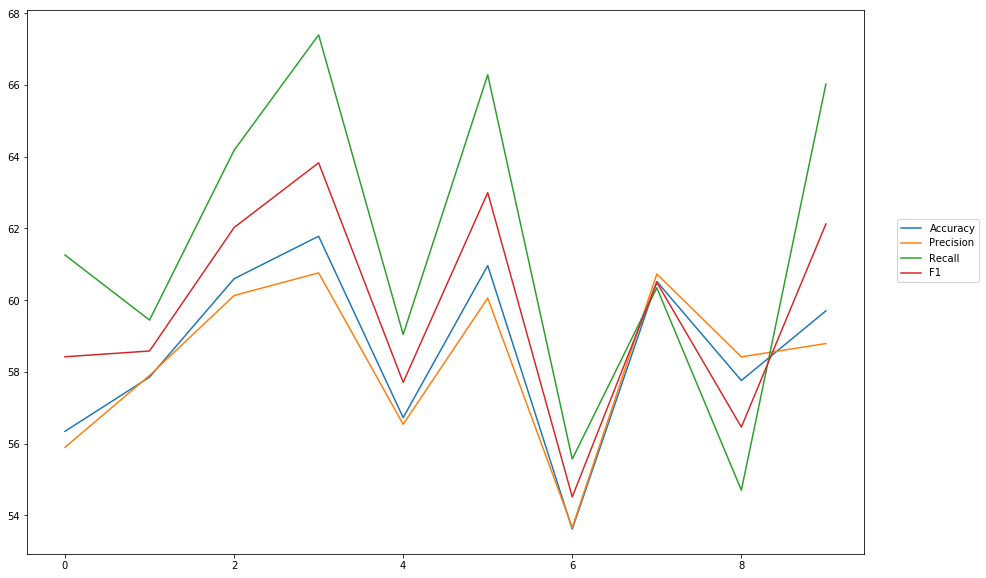

Accuracy: Mean = 58.59% (+/- 2.43%), Max = 61.78%, Min =  53.62%
Precision: Mean = 58.29% (+/- 2.22%), Max = 60.76%, Min =  53.67%
Recall: Mean = 61.43% (+/- 4.22%), Max = 67.40%, Min =  54.70%
F1: Mean = 59.72% (+/- 2.90%), Max = 63.83%, Min =  54.52%


In [66]:
cross_val(model35, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'cnn_1_400_maxpool3_kernel3') 

## CNN one CNN-layer, MaxPooling, 400 filter, stride = 2

In [ ]:
wv_layer36 = Embedding(len(word_index)+1,
                     EMBEDDING_DIM,
                     weights=[embedding_matrix],
                     input_length=MAX_SEQUENCE_LENGTH,
                     trainable=True)

#Input Layer
comment_input36= Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences36 = wv_layer36(comment_input36)

#CNN-Layer
x36 = Conv1D(400, kernel_size =3, strides = 2, activation='relu')(embedded_sequences36)

#Max-Pool
x36 = MaxPooling1D(pool_size=2) (x36)

x36 = Flatten() (x36)

#Output (Dense) Layer
preds36 = Dense(2, activation='softmax')(x36)

# build the model
model36 = Model(inputs=[comment_input36], outputs=preds36)


-----Fold 1--------


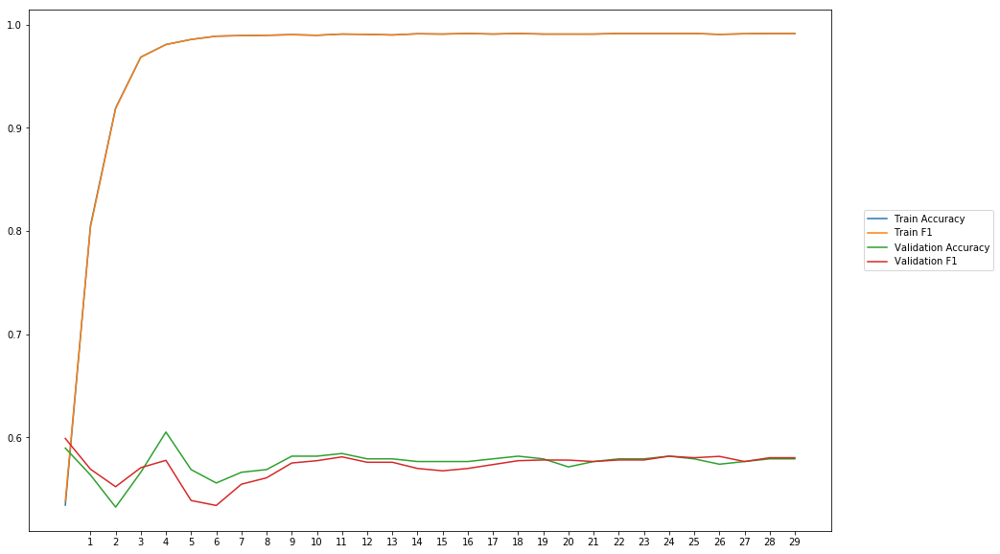

Average Accuracy: 57.57%
Average Precision: 57.87%
Average Recall: 56.68%
Average F1: 57.24%

-----Fold 2--------


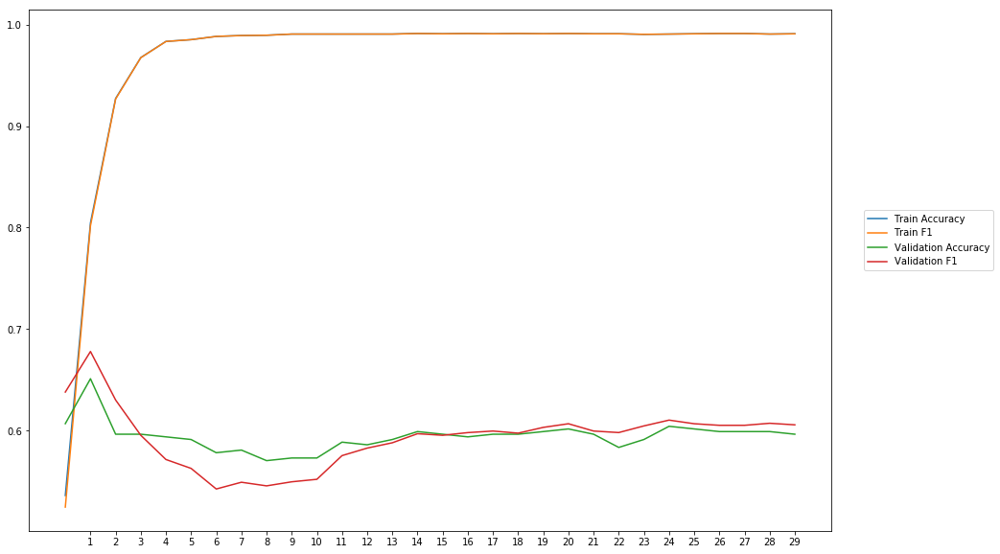

Average Accuracy: 59.43%
Average Precision: 59.72%
Average Recall: 59.15%
Average F1: 59.33%

-----Fold 3--------


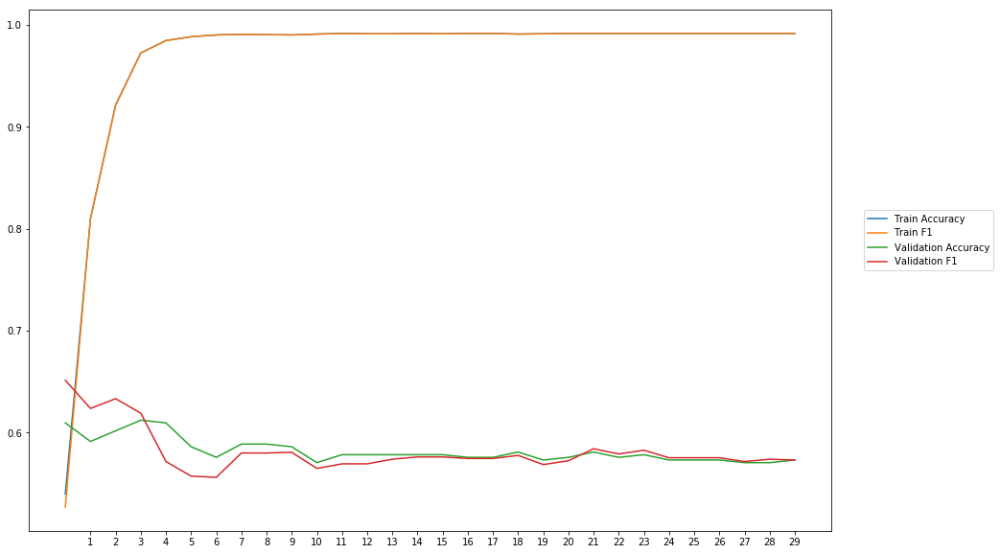

Average Accuracy: 58.19%
Average Precision: 58.52%
Average Recall: 57.89%
Average F1: 58.12%

-----Fold 4--------


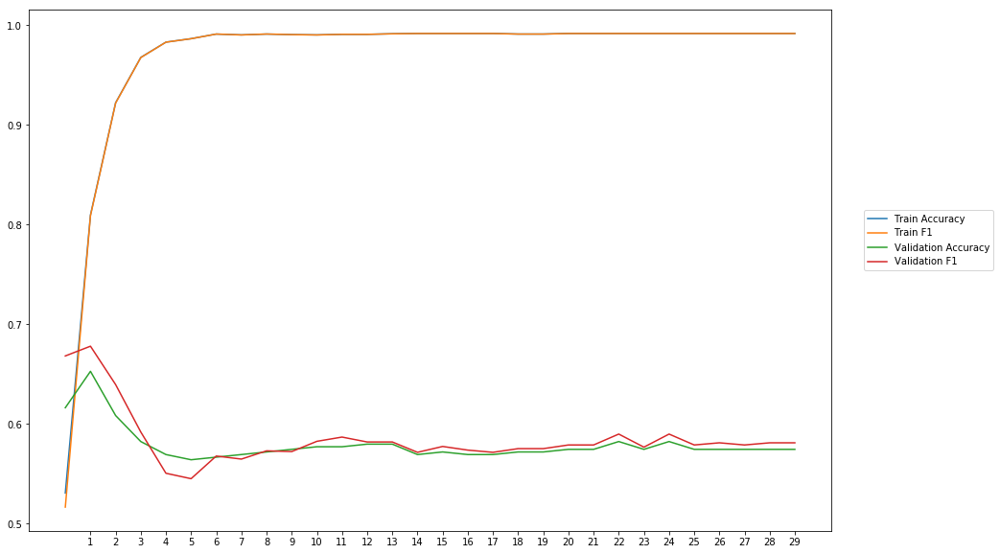

Average Accuracy: 57.90%
Average Precision: 57.76%
Average Recall: 59.34%
Average F1: 58.47%

-----Fold 5--------


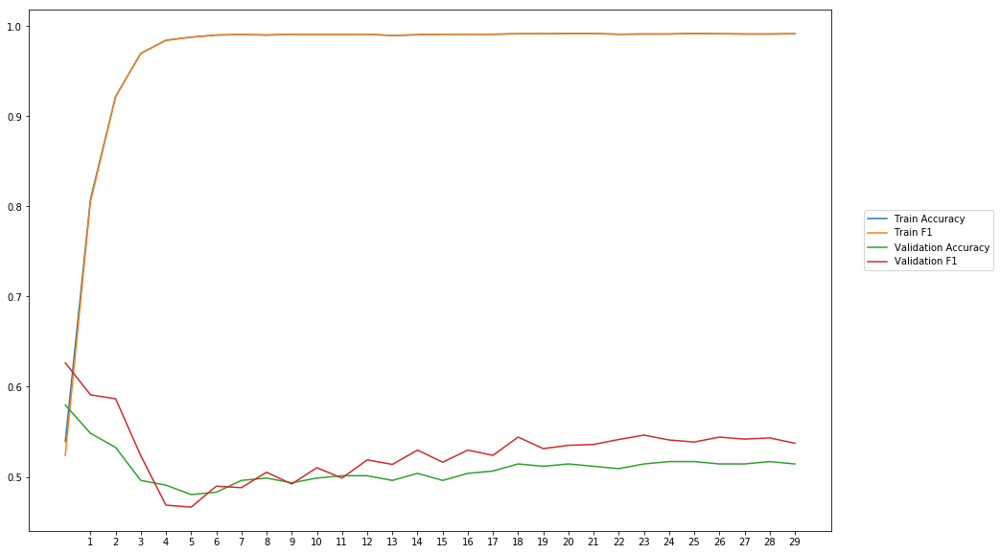

Average Accuracy: 50.92%
Average Precision: 50.88%
Average Recall: 55.16%
Average F1: 52.86%

-----Fold 6--------


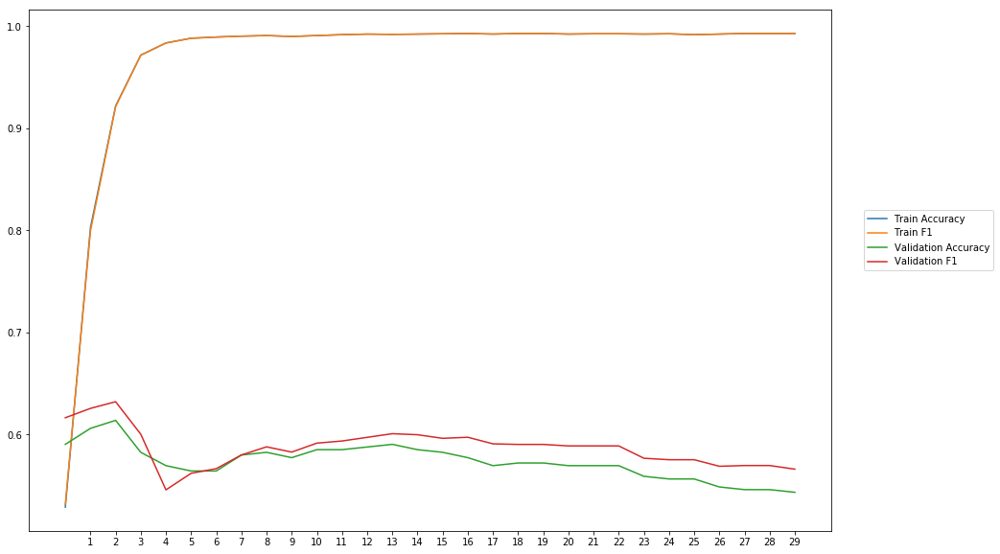

Average Accuracy: 57.31%
Average Precision: 57.01%
Average Recall: 60.54%
Average F1: 58.69%

-----Fold 7--------


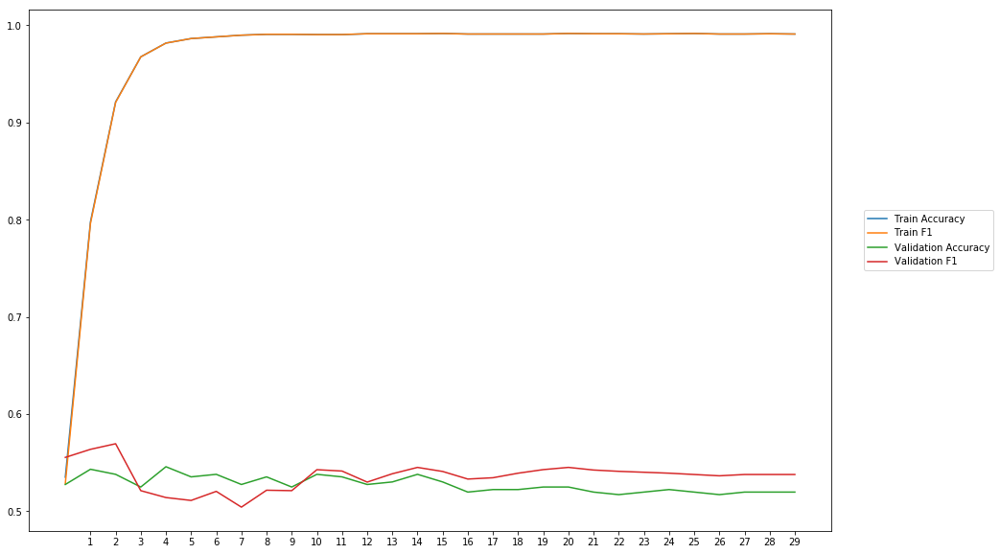

Average Accuracy: 52.75%
Average Precision: 52.82%
Average Recall: 54.55%
Average F1: 53.61%

-----Fold 8--------


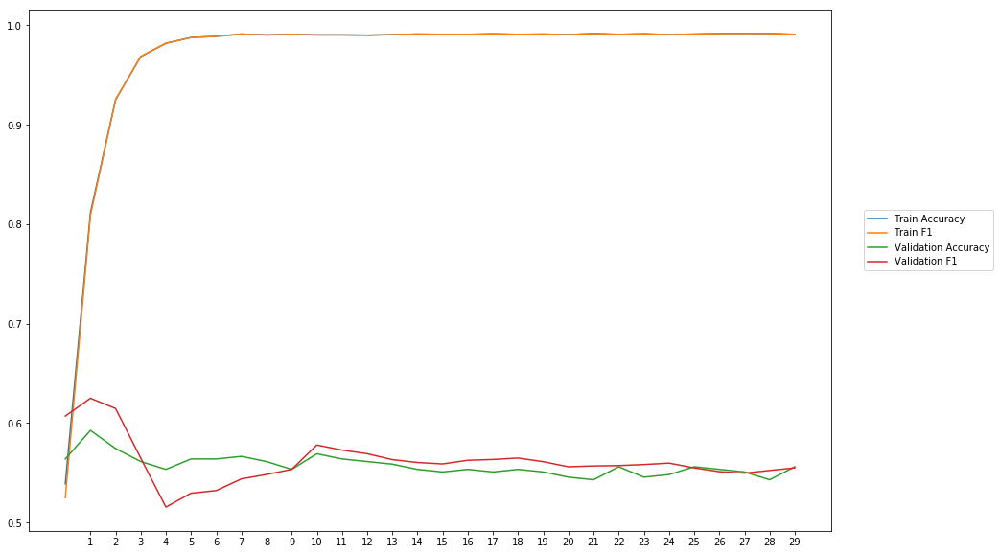

Average Accuracy: 55.74%
Average Precision: 55.78%
Average Recall: 56.70%
Average F1: 56.14%

-----Fold 9--------


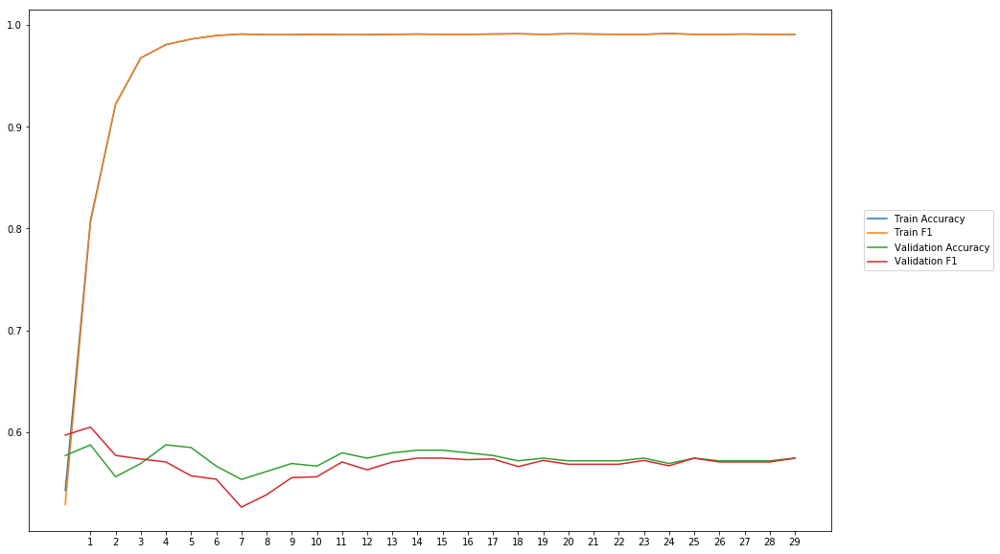

Average Accuracy: 57.35%
Average Precision: 57.68%
Average Recall: 56.11%
Average F1: 56.85%

-----Fold 10--------


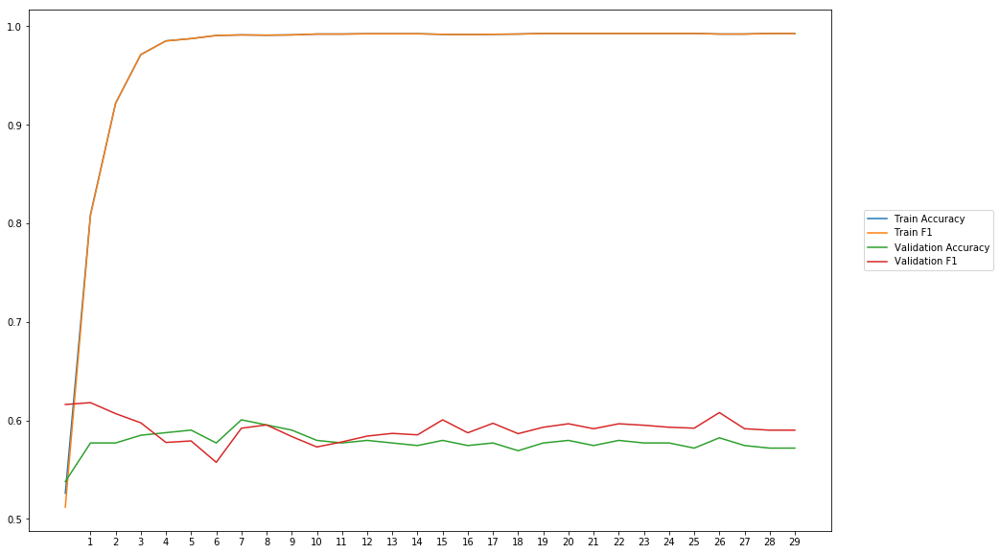

Average Accuracy: 57.81%
Average Precision: 57.56%
Average Recall: 60.99%
Average F1: 59.13%

-------Overallresults-------


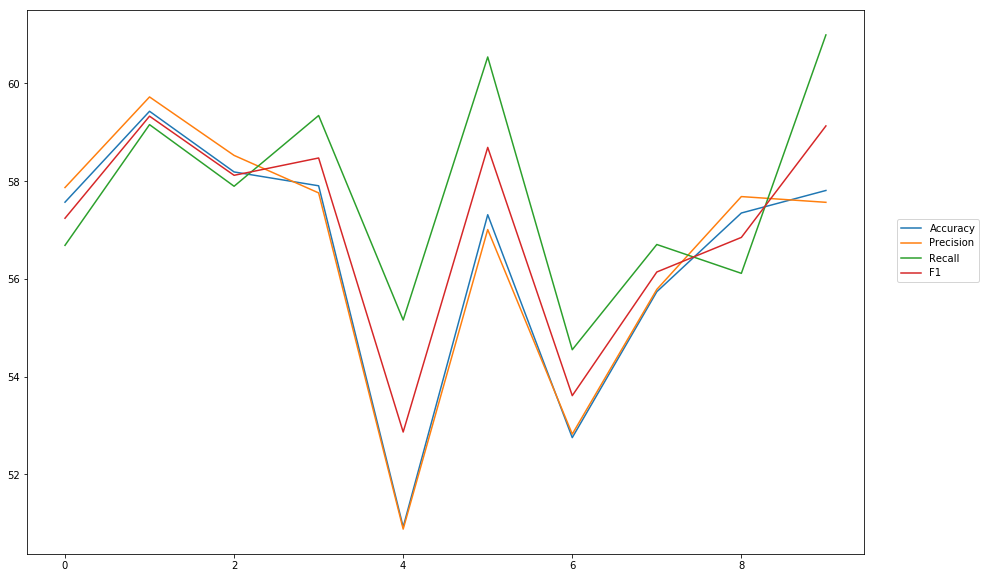

Accuracy: Mean = 56.50% (+/- 2.52%), Max = 59.43%, Min =  50.92%
Precision: Mean = 56.56% (+/- 2.58%), Max = 59.72%, Min =  50.88%
Recall: Mean = 57.71% (+/- 2.11%), Max = 60.99%, Min =  54.55%
F1: Mean = 57.04% (+/- 2.14%), Max = 59.33%, Min =  52.86%


In [68]:
cross_val(model36, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'cnn_1_400_maxpool_kernel3_stride2') 

## Train and evaluate the best model with heldout testdata

Instructions for updating:
Use tf.cast instead.


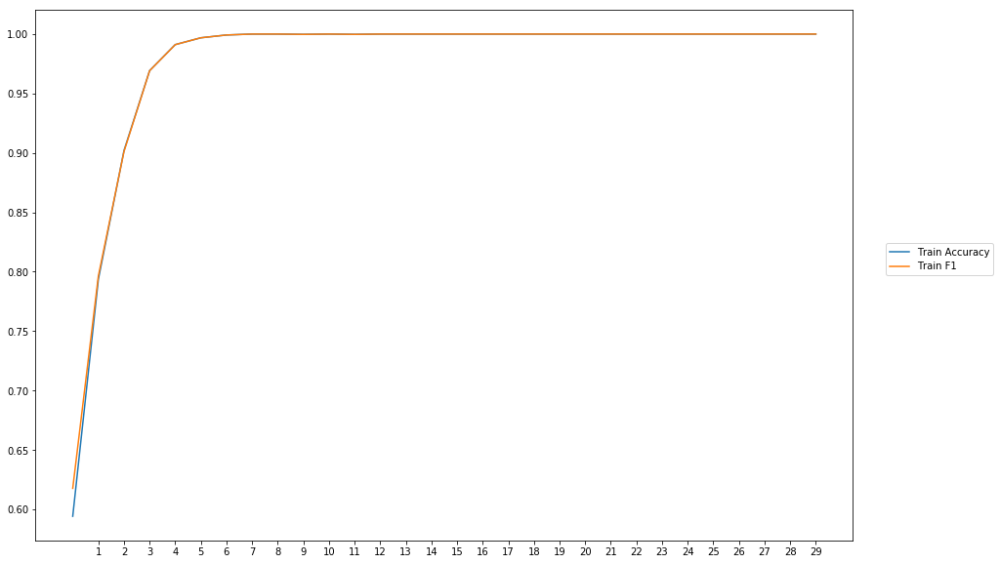


-----Test Scores----
Loss: 2.6906798907688687
Accuracy: 66.3265306122449
Precision: 55.83126549483096
Recall: 72.34726685776616
F1: 63.02520514939348


In [9]:
train_evaluate_final_model(model27, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, test_data, test_labels, softmax, outputpath, 'final_CNN')